## Define natural priors

In [14]:
import numpy as np
import matplotlib.pyplot as plt

Text(0, 0.5, 'pdf')

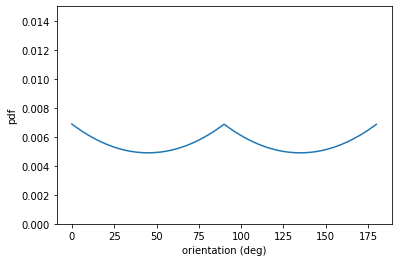

In [15]:
# "Natural prior" (Girshick et al. 2011, fig.6)
n_ori = 1000
a = 2e-4
b = 1

dori = 180 / n_ori
stim_dirs = np.float32(np.arange(0, 180, dori))
stim_p = np.zeros(n_ori)
midindx = np.argmin(np.abs(stim_dirs-90))

stim_p[:midindx] = a*(np.arange(0, stim_dirs[midindx], stim_dirs[midindx] / midindx)-45)**2 + b
stim_p[midindx:] = a*(np.arange(stim_dirs[midindx+1],
                               180, (180-stim_dirs[midindx+1]) / (n_ori-midindx)
                              )-135)**2 + b
plt.figure()
stim_p = stim_p/np.sum(stim_p)
plt.plot(stim_dirs,stim_p/dori)
plt.ylim([0,0.015])
plt.xlabel('orientation (deg)')
plt.ylabel('pdf')

## Train network from stimuli distributed with the natural statistics

In [16]:
import sys, os, time

import copy
import numpy as np
import matplotlib.pyplot as plt

sys.path.append('../')
from det_rnn import *
import det_rnn.train as utils_train
import det_rnn.analysis as utils_analysis
import tensorflow as tf
from det_rnn.train.model import Model
from utils.plotfnc import *

print(tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

2.3.0-dev20200519
Num GPUs Available:  0


### Generate stimulus

In [17]:
print('batchsize = ' + str(par['batch_size']))
par

batchsize = 128


{'design': {'iti': (0, 1.5),
  'stim': (1.5, 3.0),
  'delay': (3.0, 4.5),
  'estim': (4.5, 6.0)},
 'output_range': 'design',
 'dead': 'design',
 'mask': {'iti': 1.0,
  'stim': 1.0,
  'delay': 1.0,
  'estim': 10.0,
  'rule_iti': 2.0,
  'rule_stim': 2.0,
  'rule_delay': 2.0,
  'rule_estim': 20.0},
 'input_rule': 'design',
 'output_rule': 'design',
 'input_rule_strength': 0.8,
 'output_rule_strength': 0.8,
 'type': 'orientation',
 'stim_dist': 'uniform',
 'natural_a': 0.0002,
 'trial_per_subblock': 1,
 'stim_encoding': 'single',
 'resp_decoding': 'disc',
 'exc_inh_prop': 0.8,
 'modular': False,
 'connect_prob': 0.1,
 'dt': 10.0,
 'membrane_time_constant': 100,
 'input_mean': 0.0,
 'noise_in_sd': 0.1,
 'noise_rnn_sd': 0.5,
 'strength_input': 0.8,
 'strength_output': 0.8,
 'kappa': 2,
 'orientation_cost': 1,
 'n_iterations': 300,
 'iters_between_outputs': 100,
 'n_receptive_fields': 1,
 'n_tuned_input': 24,
 'n_tuned_output': 24,
 'n_ori': 24,
 'noise_mean': 0,
 'noise_sd': 0.005,
 'n_recal

In [18]:
# training set
par_train = copy.deepcopy(par)
# use "natural prior"
par_train['stim_dist'] = 'natural'
par_train['natural_a'] = 2e-4
par_train['n_ori'] = 1000 # make it somewhat continuous
par_train = update_parameters(par_train)
stim_train = Stimulus(par_train)

# testing set; for testing the 24 orientations
par_test = copy.deepcopy(par)
par_test['stim_dist'] = 'natural'
par_test['natural_a'] = 2e-4
par_test = update_parameters(par_test)
stim_test = Stimulus(par_test)   # the argument `par` may be omitted

In [19]:
print('train n_ori = ' + str(par_train['n_ori']))
print('test n_ori = ' + str(par_test['n_ori']))

train n_ori = 1000
test n_ori = 24


orientation = 19.439999999999998


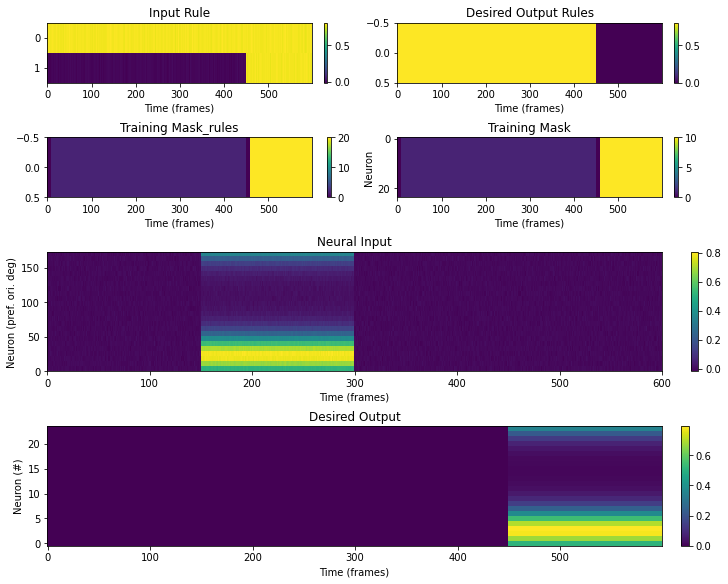

In [20]:
# check stimulus
train_data = stim_train.generate_trial()
random_trial_num = np.random.randint(stim_train.batch_size)
target_ori = np.arange(0,180,180/par_train['n_ori'])[train_data['stimulus_ori'][random_trial_num]]
print('orientation = ' + str(target_ori))
plot_trial(stim_train, train_data,TEST_TRIAL=random_trial_num)

orientation = 172.5


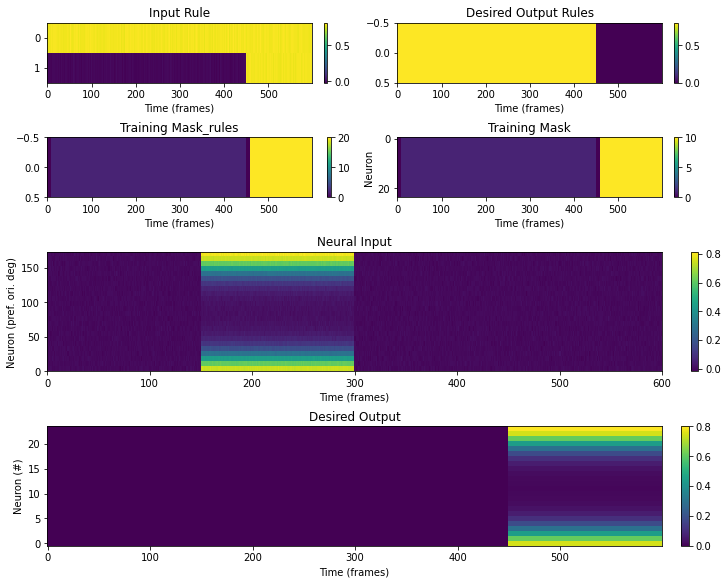

In [21]:
test_data = stim_test.generate_trial(balanced=True)
random_trial_num = len(test_data['stimulus_ori'])-2
#random_trial_num = np.random.randint(len(test_data['stimulus_ori']))
target_ori = np.arange(0,180,180/par_test['n_ori'])[test_data['stimulus_ori'][random_trial_num]]
print('orientation = ' + str(target_ori))
plot_trial(stim_test, test_data,TEST_TRIAL=random_trial_num)

In [22]:
# Check the stimulus distribution in balanced trial


### Train on 24 orientations
Just to see if it works.
Note that this gives us the prior shape.


 Training performance: 
Iter.    0 | Performance 0.0757 | Loss 56810.5352 | Spike loss 123.9144
Testing performance: 
Iter.    0 | Performance 0.0000 | Loss 39117.0312 | Spike loss 97.4749


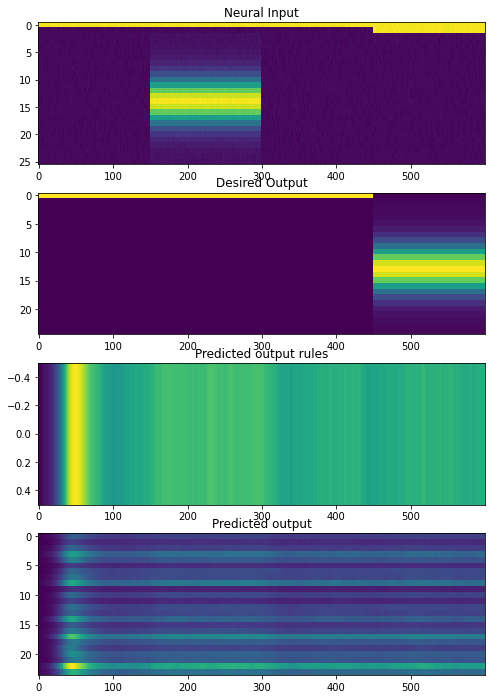

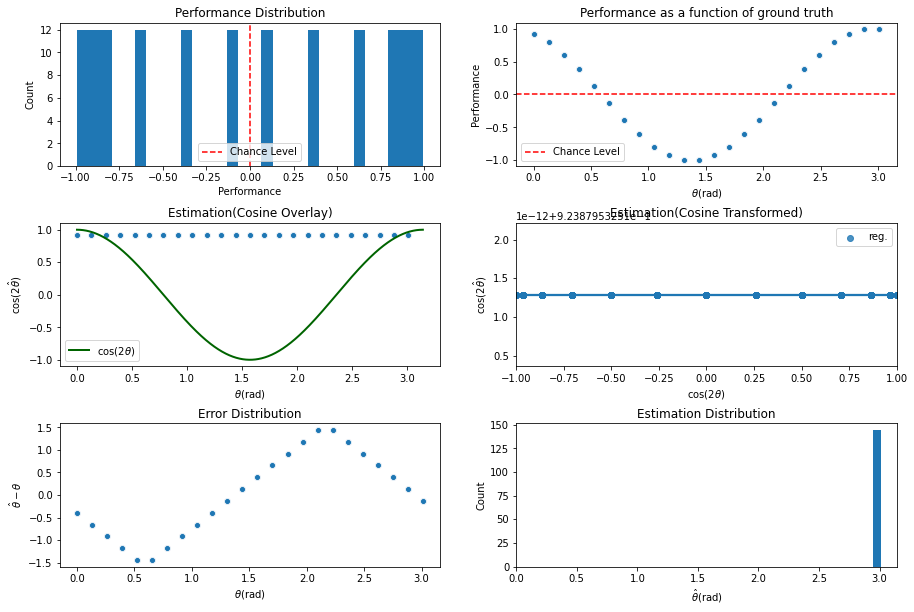

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter0\assets

 Training performance: 
Iter.    1 | Performance -0.1182 | Loss 39178.4961 | Spike loss 97.3623
Testing performance: 
Iter.    1 | Performance 0.0000 | Loss 25933.0391 | Spike loss 74.9854

 Training performance: 
Iter.    2 | Performance 0.1140 | Loss 25814.9863 | Spike loss 74.8689
Testing performance: 
Iter.    2 | Performance 0.0000 | Loss 16025.5439 | Spike loss 55.0406

 Training performance: 
Iter.    3 | Performance -0.0222 | Loss 15991.2285 | Spike loss 55.1263
Testing performance: 
Iter.    3 | Performance -0.0000 | Loss 8802.4893 | Spike loss 37.6548

 Training performance: 
Iter.    4 | Performance 0.0359 | Loss 8812.4121 | Spike loss 37.7251
Testing performance: 
Iter.    4 | Performance -0.0040 | Loss 4097.9180 | Spike loss 23.1600

 Training performance: 
Iter.    5 | Performance 0.0163 | Loss 4138.1011 | Spike loss 23.1712
Testing performance: 
Iter.    5 | Performance -0.0061


 Training performance: 
Iter.   46 | Performance -0.0684 | Loss 1.1021 | Spike loss 0.7327
Testing performance: 
Iter.   46 | Performance -0.0496 | Loss 1.0325 | Spike loss 0.7530

 Training performance: 
Iter.   47 | Performance -0.0515 | Loss 1.0447 | Spike loss 0.7493
Testing performance: 
Iter.   47 | Performance 0.0534 | Loss 0.9986 | Spike loss 0.7707

 Training performance: 
Iter.   48 | Performance 0.0571 | Loss 0.9912 | Spike loss 0.7698
Testing performance: 
Iter.   48 | Performance -0.0662 | Loss 0.9477 | Spike loss 0.7865

 Training performance: 
Iter.   49 | Performance -0.0001 | Loss 0.9419 | Spike loss 0.7884
Testing performance: 
Iter.   49 | Performance -0.0211 | Loss 0.8940 | Spike loss 0.8121

 Training performance: 
Iter.   50 | Performance -0.0465 | Loss 0.9045 | Spike loss 0.8041
Testing performance: 
Iter.   50 | Performance -0.0338 | Loss 0.8448 | Spike loss 0.8342

 Training performance: 
Iter.   51 | Performance -0.0038 | Loss 0.8422 | Spike loss 0.8277
Testi


 Training performance: 
Iter.   92 | Performance 0.0449 | Loss 0.4471 | Spike loss 2.2293
Testing performance: 
Iter.   92 | Performance -0.0054 | Loss 0.4477 | Spike loss 2.2367

 Training performance: 
Iter.   93 | Performance -0.1092 | Loss 0.4440 | Spike loss 2.2242
Testing performance: 
Iter.   93 | Performance -0.0021 | Loss 0.4437 | Spike loss 2.2318

 Training performance: 
Iter.   94 | Performance 0.0028 | Loss 0.4451 | Spike loss 2.2336
Testing performance: 
Iter.   94 | Performance 0.0083 | Loss 0.4423 | Spike loss 2.2601

 Training performance: 
Iter.   95 | Performance -0.0469 | Loss 0.4413 | Spike loss 2.2478
Testing performance: 
Iter.   95 | Performance 0.0088 | Loss 0.4391 | Spike loss 2.2721

 Training performance: 
Iter.   96 | Performance 0.0552 | Loss 0.4470 | Spike loss 2.2652
Testing performance: 
Iter.   96 | Performance 0.0184 | Loss 0.4428 | Spike loss 2.2860

 Training performance: 
Iter.   97 | Performance -0.0265 | Loss 0.4433 | Spike loss 2.2689
Testing p

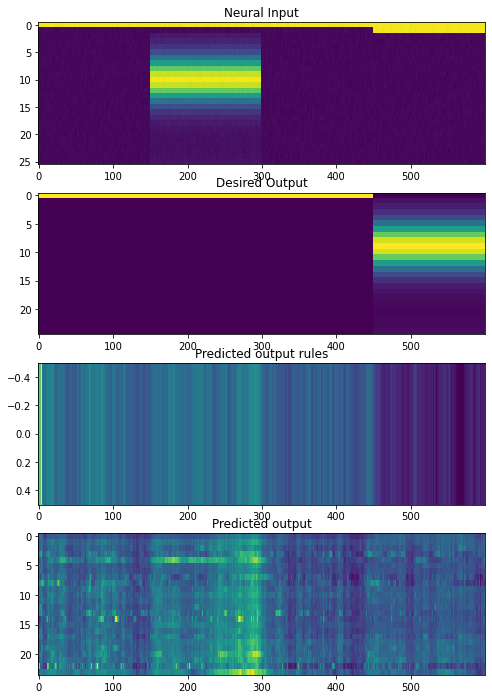

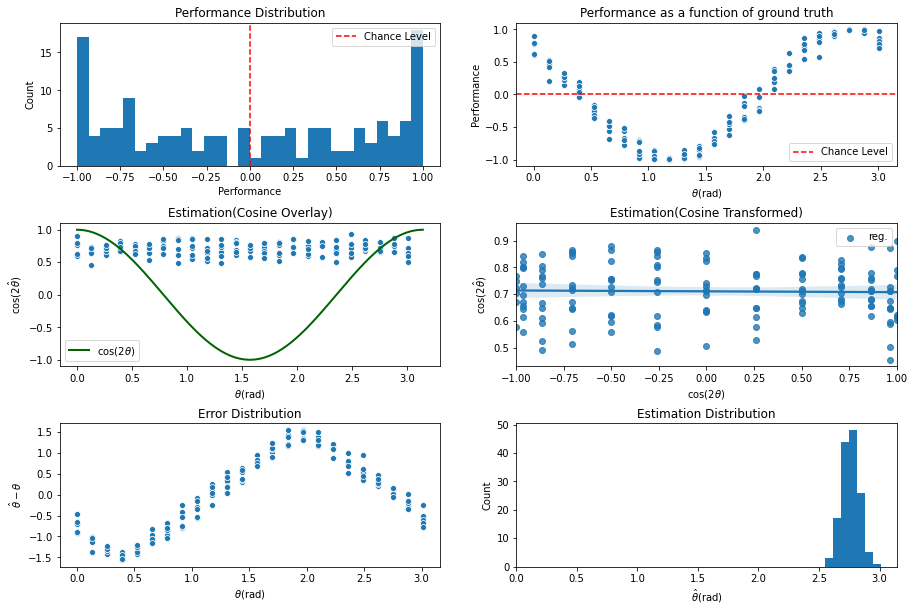

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter100\assets

 Training performance: 
Iter.  101 | Performance 0.0103 | Loss 0.4360 | Spike loss 2.2313
Testing performance: 
Iter.  101 | Performance -0.0046 | Loss 0.4345 | Spike loss 2.2496

 Training performance: 
Iter.  102 | Performance 0.1198 | Loss 0.4321 | Spike loss 2.2505
Testing performance: 
Iter.  102 | Performance -0.0001 | Loss 0.4328 | Spike loss 2.2552

 Training performance: 
Iter.  103 | Performance 0.0325 | Loss 0.4306 | Spike loss 2.2357
Testing performance: 
Iter.  103 | Performance -0.0069 | Loss 0.4276 | Spike loss 2.2352

 Training performance: 
Iter.  104 | Performance -0.0739 | Loss 0.4318 | Spike loss 2.2534
Testing performance: 
Iter.  104 | Performance 0.0002 | Loss 0.4299 | Spike loss 2.2389

 Training performance: 
Iter.  105 | Performance 0.0171 | Loss 0.4319 | Spike loss 2.2452
Testing performance: 
Iter.  105 | Performance -0.0132 | Loss 0.4317 | Spike loss 2.2469

 Tr


 Training performance: 
Iter.  147 | Performance -0.1208 | Loss 0.3965 | Spike loss 2.3975
Testing performance: 
Iter.  147 | Performance 0.0097 | Loss 0.3960 | Spike loss 2.3979

 Training performance: 
Iter.  148 | Performance 0.0301 | Loss 0.3941 | Spike loss 2.4036
Testing performance: 
Iter.  148 | Performance 0.0059 | Loss 0.3890 | Spike loss 2.4318

 Training performance: 
Iter.  149 | Performance -0.0648 | Loss 0.3946 | Spike loss 2.4258
Testing performance: 
Iter.  149 | Performance 0.0093 | Loss 0.3901 | Spike loss 2.4304

 Training performance: 
Iter.  150 | Performance 0.0465 | Loss 0.3887 | Spike loss 2.4332
Testing performance: 
Iter.  150 | Performance -0.0139 | Loss 0.3917 | Spike loss 2.4286

 Training performance: 
Iter.  151 | Performance 0.0387 | Loss 0.3913 | Spike loss 2.4442
Testing performance: 
Iter.  151 | Performance 0.0215 | Loss 0.3893 | Spike loss 2.4170

 Training performance: 
Iter.  152 | Performance 0.0393 | Loss 0.3886 | Spike loss 2.4369
Testing per


 Training performance: 
Iter.  193 | Performance 0.0527 | Loss 0.3722 | Spike loss 2.5979
Testing performance: 
Iter.  193 | Performance 0.0007 | Loss 0.3699 | Spike loss 2.5980

 Training performance: 
Iter.  194 | Performance -0.0427 | Loss 0.3705 | Spike loss 2.5896
Testing performance: 
Iter.  194 | Performance -0.0043 | Loss 0.3689 | Spike loss 2.6180

 Training performance: 
Iter.  195 | Performance 0.0323 | Loss 0.3706 | Spike loss 2.6140
Testing performance: 
Iter.  195 | Performance -0.0108 | Loss 0.3705 | Spike loss 2.6101

 Training performance: 
Iter.  196 | Performance -0.0038 | Loss 0.3710 | Spike loss 2.5995
Testing performance: 
Iter.  196 | Performance -0.0096 | Loss 0.3683 | Spike loss 2.6189

 Training performance: 
Iter.  197 | Performance 0.0149 | Loss 0.3685 | Spike loss 2.6281
Testing performance: 
Iter.  197 | Performance 0.0099 | Loss 0.3707 | Spike loss 2.6288

 Training performance: 
Iter.  198 | Performance -0.0408 | Loss 0.3686 | Spike loss 2.6530
Testing 

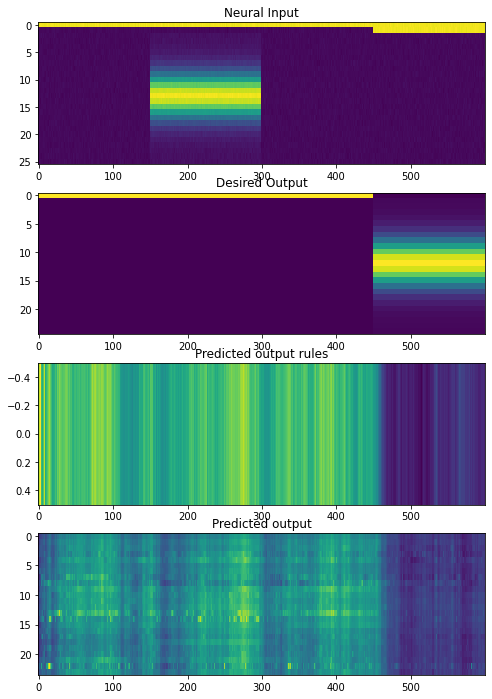

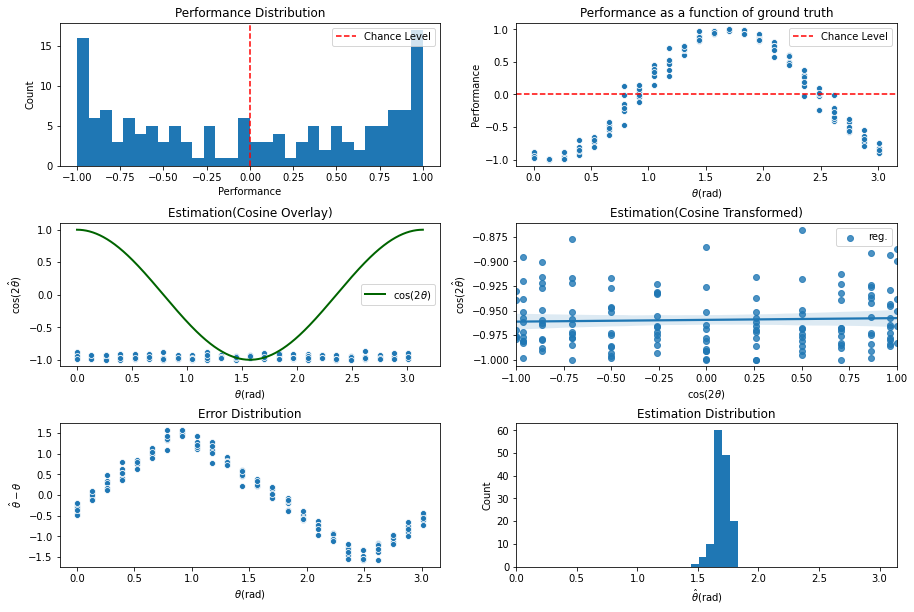

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter200\assets

 Training performance: 
Iter.  201 | Performance -0.0174 | Loss 0.3686 | Spike loss 2.6442
Testing performance: 
Iter.  201 | Performance 0.0081 | Loss 0.3704 | Spike loss 2.6500

 Training performance: 
Iter.  202 | Performance -0.0307 | Loss 0.3714 | Spike loss 2.6473
Testing performance: 
Iter.  202 | Performance 0.0073 | Loss 0.3689 | Spike loss 2.6638

 Training performance: 
Iter.  203 | Performance -0.0204 | Loss 0.3689 | Spike loss 2.6495
Testing performance: 
Iter.  203 | Performance 0.0012 | Loss 0.3663 | Spike loss 2.6779

 Training performance: 
Iter.  204 | Performance 0.0326 | Loss 0.3628 | Spike loss 2.6816
Testing performance: 
Iter.  204 | Performance 0.0040 | Loss 0.3662 | Spike loss 2.6941

 Training performance: 
Iter.  205 | Performance 0.0397 | Loss 0.3662 | Spike loss 2.6643
Testing performance: 
Iter.  205 | Performance 0.0138 | Loss 0.3640 | Spike loss 2.6972

 Trai


 Training performance: 
Iter.  247 | Performance -0.0217 | Loss 0.3564 | Spike loss 2.8512
Testing performance: 
Iter.  247 | Performance -0.0055 | Loss 0.3535 | Spike loss 2.8496

 Training performance: 
Iter.  248 | Performance -0.0205 | Loss 0.3531 | Spike loss 2.8497
Testing performance: 
Iter.  248 | Performance -0.0101 | Loss 0.3533 | Spike loss 2.8540

 Training performance: 
Iter.  249 | Performance 0.0805 | Loss 0.3531 | Spike loss 2.8539
Testing performance: 
Iter.  249 | Performance 0.0290 | Loss 0.3536 | Spike loss 2.8524

 Training performance: 
Iter.  250 | Performance 0.0800 | Loss 0.3542 | Spike loss 2.8511
Testing performance: 
Iter.  250 | Performance 0.0149 | Loss 0.3526 | Spike loss 2.8439

 Training performance: 
Iter.  251 | Performance -0.0121 | Loss 0.3524 | Spike loss 2.8425
Testing performance: 
Iter.  251 | Performance -0.0059 | Loss 0.3544 | Spike loss 2.8540

 Training performance: 
Iter.  252 | Performance -0.0473 | Loss 0.3536 | Spike loss 2.8573
Testing


 Training performance: 
Iter.  293 | Performance -0.0706 | Loss 0.3444 | Spike loss 2.9107
Testing performance: 
Iter.  293 | Performance 0.0236 | Loss 0.3477 | Spike loss 2.9014

 Training performance: 
Iter.  294 | Performance -0.0477 | Loss 0.3469 | Spike loss 2.8994
Testing performance: 
Iter.  294 | Performance 0.0667 | Loss 0.3504 | Spike loss 2.8790

 Training performance: 
Iter.  295 | Performance 0.0997 | Loss 0.3470 | Spike loss 2.8899
Testing performance: 
Iter.  295 | Performance -0.0168 | Loss 0.3463 | Spike loss 2.8810

 Training performance: 
Iter.  296 | Performance 0.0242 | Loss 0.3465 | Spike loss 2.8936
Testing performance: 
Iter.  296 | Performance 0.0027 | Loss 0.3469 | Spike loss 2.8710

 Training performance: 
Iter.  297 | Performance -0.1096 | Loss 0.3464 | Spike loss 2.9014
Testing performance: 
Iter.  297 | Performance 0.0662 | Loss 0.3478 | Spike loss 2.8787

 Training performance: 
Iter.  298 | Performance 0.0258 | Loss 0.3470 | Spike loss 2.8812
Testing pe

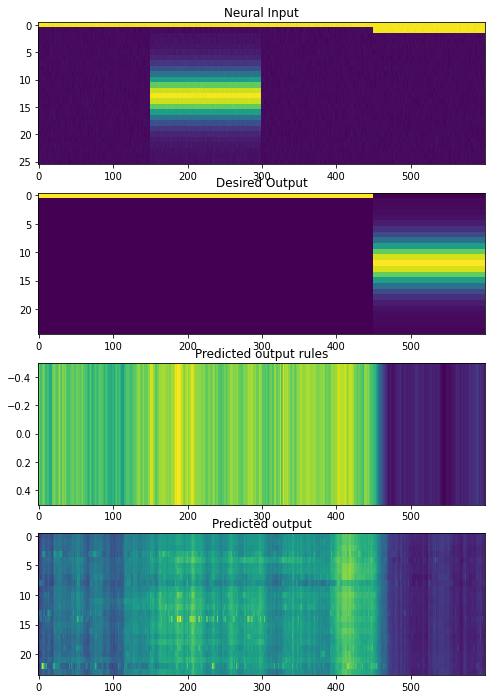

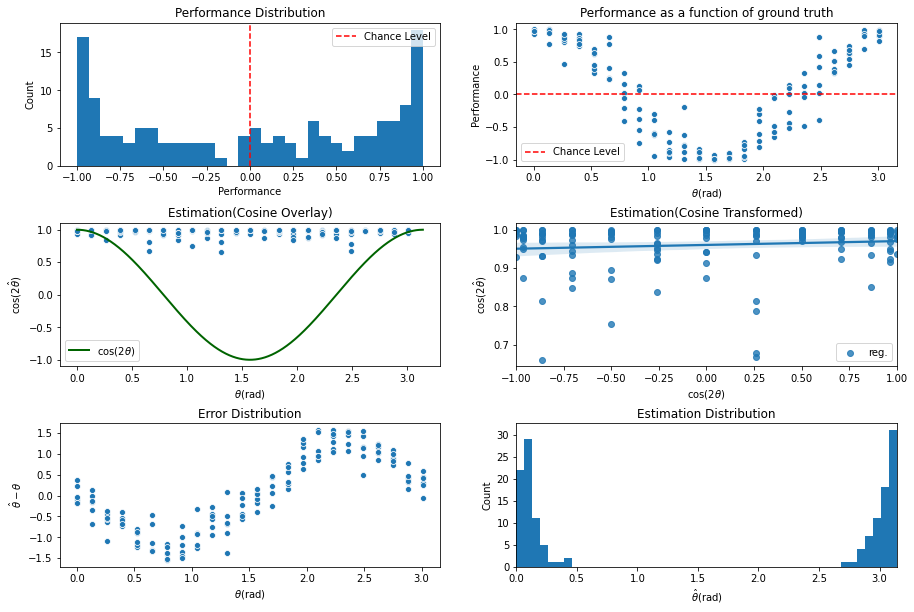

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter300\assets

 Training performance: 
Iter.  301 | Performance -0.0163 | Loss 0.3488 | Spike loss 2.9007
Testing performance: 
Iter.  301 | Performance -0.0018 | Loss 0.3452 | Spike loss 2.9093

 Training performance: 
Iter.  302 | Performance -0.0284 | Loss 0.3446 | Spike loss 2.9006
Testing performance: 
Iter.  302 | Performance 0.0145 | Loss 0.3457 | Spike loss 2.8811

 Training performance: 
Iter.  303 | Performance 0.1184 | Loss 0.3468 | Spike loss 2.9000
Testing performance: 
Iter.  303 | Performance 0.0374 | Loss 0.3480 | Spike loss 2.8885

 Training performance: 
Iter.  304 | Performance -0.0007 | Loss 0.3476 | Spike loss 2.8999
Testing performance: 
Iter.  304 | Performance 0.0067 | Loss 0.3467 | Spike loss 2.8947

 Training performance: 
Iter.  305 | Performance 0.0192 | Loss 0.3449 | Spike loss 2.9054
Testing performance: 
Iter.  305 | Performance 0.0027 | Loss 0.3453 | Spike loss 2.9077

 Tra


 Training performance: 
Iter.  347 | Performance -0.0703 | Loss 0.3418 | Spike loss 2.8969
Testing performance: 
Iter.  347 | Performance 0.0134 | Loss 0.3428 | Spike loss 2.9032

 Training performance: 
Iter.  348 | Performance -0.0615 | Loss 0.3408 | Spike loss 2.9004
Testing performance: 
Iter.  348 | Performance 0.0136 | Loss 0.3434 | Spike loss 2.8708

 Training performance: 
Iter.  349 | Performance -0.0747 | Loss 0.3439 | Spike loss 2.8942
Testing performance: 
Iter.  349 | Performance -0.0038 | Loss 0.3411 | Spike loss 2.8980

 Training performance: 
Iter.  350 | Performance -0.0289 | Loss 0.3404 | Spike loss 2.9006
Testing performance: 
Iter.  350 | Performance 0.0003 | Loss 0.3416 | Spike loss 2.8848

 Training performance: 
Iter.  351 | Performance 0.0576 | Loss 0.3416 | Spike loss 2.8731
Testing performance: 
Iter.  351 | Performance 0.0009 | Loss 0.3429 | Spike loss 2.8692

 Training performance: 
Iter.  352 | Performance 0.0076 | Loss 0.3426 | Spike loss 2.8858
Testing p


 Training performance: 
Iter.  393 | Performance 0.0457 | Loss 0.3393 | Spike loss 2.8830
Testing performance: 
Iter.  393 | Performance 0.0004 | Loss 0.3401 | Spike loss 2.9197

 Training performance: 
Iter.  394 | Performance -0.0579 | Loss 0.3390 | Spike loss 2.9076
Testing performance: 
Iter.  394 | Performance 0.0068 | Loss 0.3384 | Spike loss 2.9099

 Training performance: 
Iter.  395 | Performance -0.0673 | Loss 0.3386 | Spike loss 2.9068
Testing performance: 
Iter.  395 | Performance 0.0023 | Loss 0.3391 | Spike loss 2.9236

 Training performance: 
Iter.  396 | Performance -0.0283 | Loss 0.3385 | Spike loss 2.9140
Testing performance: 
Iter.  396 | Performance 0.0013 | Loss 0.3428 | Spike loss 2.9193

 Training performance: 
Iter.  397 | Performance -0.0090 | Loss 0.3397 | Spike loss 2.9135
Testing performance: 
Iter.  397 | Performance 0.0133 | Loss 0.3383 | Spike loss 2.8922

 Training performance: 
Iter.  398 | Performance -0.0740 | Loss 0.3380 | Spike loss 2.9197
Testing p

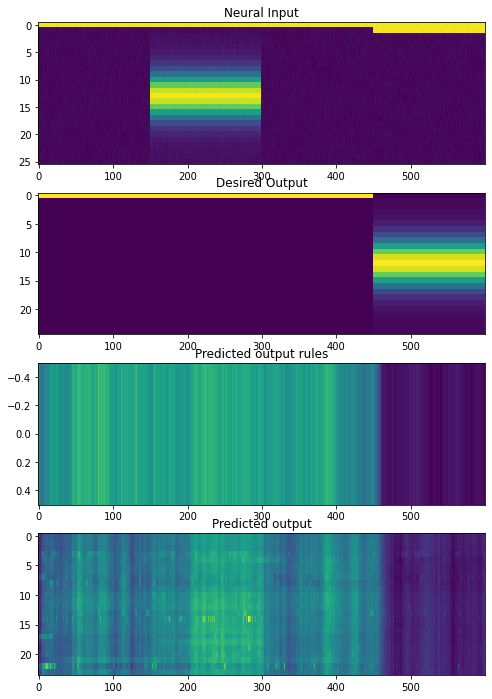

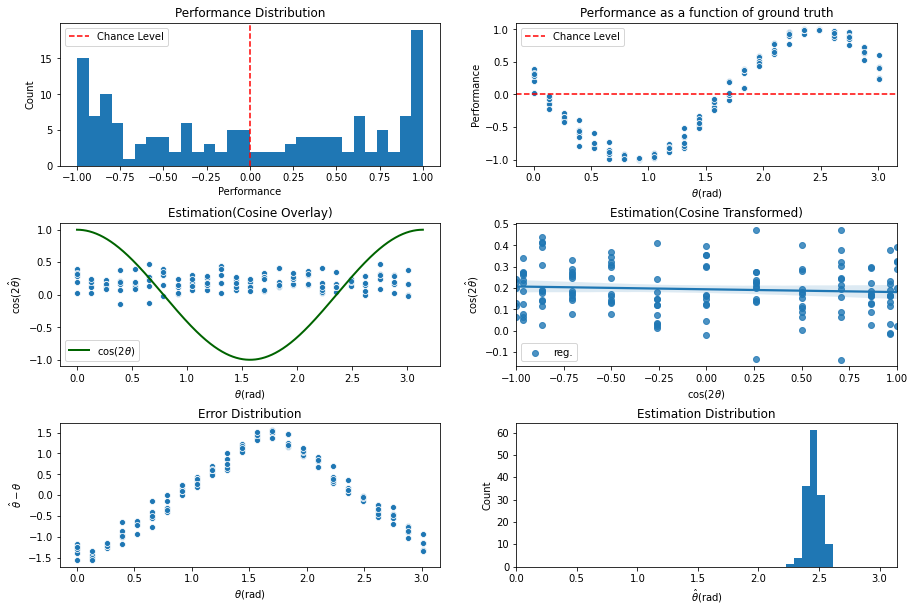

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter400\assets

 Training performance: 
Iter.  401 | Performance -0.0769 | Loss 0.3398 | Spike loss 2.8710
Testing performance: 
Iter.  401 | Performance 0.0057 | Loss 0.3389 | Spike loss 2.9053

 Training performance: 
Iter.  402 | Performance -0.0170 | Loss 0.3381 | Spike loss 2.8987
Testing performance: 
Iter.  402 | Performance 0.0100 | Loss 0.3414 | Spike loss 2.8881

 Training performance: 
Iter.  403 | Performance 0.0032 | Loss 0.3404 | Spike loss 2.9007
Testing performance: 
Iter.  403 | Performance 0.0019 | Loss 0.3377 | Spike loss 2.9136

 Training performance: 
Iter.  404 | Performance -0.0475 | Loss 0.3382 | Spike loss 2.8769
Testing performance: 
Iter.  404 | Performance 0.0009 | Loss 0.3385 | Spike loss 2.8990

 Training performance: 
Iter.  405 | Performance -0.0286 | Loss 0.3388 | Spike loss 2.8964
Testing performance: 
Iter.  405 | Performance -0.0094 | Loss 0.3396 | Spike loss 2.8743

 Tr


 Training performance: 
Iter.  447 | Performance -0.0008 | Loss 0.3363 | Spike loss 2.8834
Testing performance: 
Iter.  447 | Performance -0.0064 | Loss 0.3370 | Spike loss 2.9090

 Training performance: 
Iter.  448 | Performance -0.0352 | Loss 0.3379 | Spike loss 2.8884
Testing performance: 
Iter.  448 | Performance 0.0090 | Loss 0.3356 | Spike loss 2.9203

 Training performance: 
Iter.  449 | Performance -0.0296 | Loss 0.3362 | Spike loss 2.8853
Testing performance: 
Iter.  449 | Performance 0.0017 | Loss 0.3364 | Spike loss 2.9043

 Training performance: 
Iter.  450 | Performance 0.0323 | Loss 0.3354 | Spike loss 2.9130
Testing performance: 
Iter.  450 | Performance 0.0084 | Loss 0.3370 | Spike loss 2.8942

 Training performance: 
Iter.  451 | Performance 0.0276 | Loss 0.3379 | Spike loss 2.8974
Testing performance: 
Iter.  451 | Performance 0.0096 | Loss 0.3347 | Spike loss 2.9248

 Training performance: 
Iter.  452 | Performance -0.0033 | Loss 0.3350 | Spike loss 2.8973
Testing p


 Training performance: 
Iter.  493 | Performance 0.0176 | Loss 0.3354 | Spike loss 2.8628
Testing performance: 
Iter.  493 | Performance -0.0005 | Loss 0.3337 | Spike loss 2.8567

 Training performance: 
Iter.  494 | Performance 0.0465 | Loss 0.3333 | Spike loss 2.8598
Testing performance: 
Iter.  494 | Performance 0.0041 | Loss 0.3350 | Spike loss 2.8568

 Training performance: 
Iter.  495 | Performance 0.0133 | Loss 0.3349 | Spike loss 2.8471
Testing performance: 
Iter.  495 | Performance 0.0090 | Loss 0.3367 | Spike loss 2.8672

 Training performance: 
Iter.  496 | Performance 0.1437 | Loss 0.3346 | Spike loss 2.8693
Testing performance: 
Iter.  496 | Performance 0.0126 | Loss 0.3344 | Spike loss 2.8457

 Training performance: 
Iter.  497 | Performance -0.0029 | Loss 0.3337 | Spike loss 2.8516
Testing performance: 
Iter.  497 | Performance 0.0029 | Loss 0.3348 | Spike loss 2.8569

 Training performance: 
Iter.  498 | Performance 0.0033 | Loss 0.3338 | Spike loss 2.8728
Testing perf

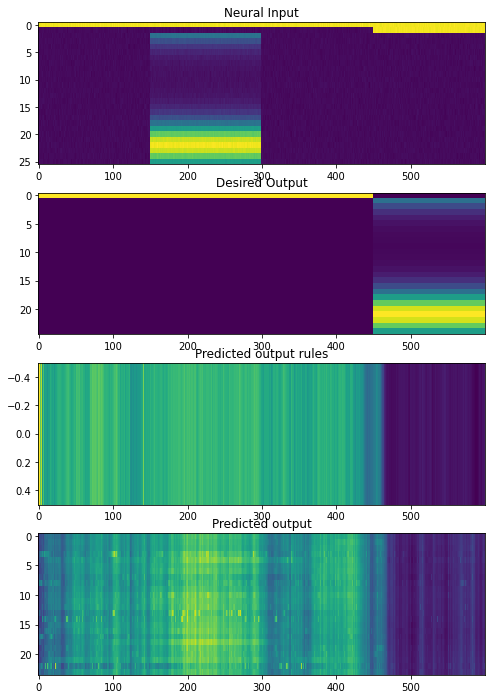

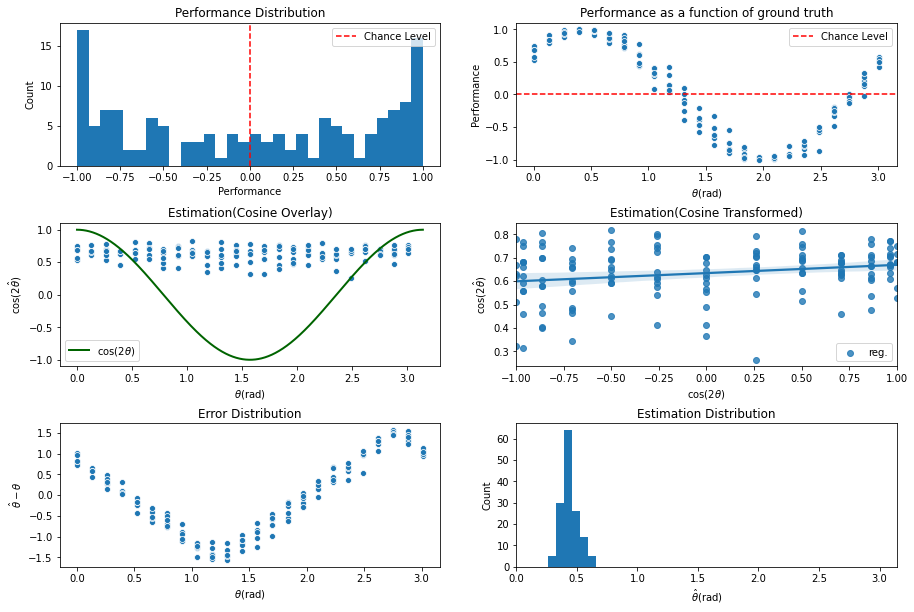

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter500\assets

 Training performance: 
Iter.  501 | Performance 0.0447 | Loss 0.3337 | Spike loss 2.8707
Testing performance: 
Iter.  501 | Performance -0.0129 | Loss 0.3345 | Spike loss 2.8527

 Training performance: 
Iter.  502 | Performance -0.0598 | Loss 0.3352 | Spike loss 2.8911
Testing performance: 
Iter.  502 | Performance 0.1515 | Loss 0.3339 | Spike loss 2.8687

 Training performance: 
Iter.  503 | Performance 0.0062 | Loss 0.3322 | Spike loss 2.8746
Testing performance: 
Iter.  503 | Performance 0.0407 | Loss 0.3340 | Spike loss 2.8848

 Training performance: 
Iter.  504 | Performance 0.0969 | Loss 0.3343 | Spike loss 2.8844
Testing performance: 
Iter.  504 | Performance 0.0084 | Loss 0.3348 | Spike loss 2.8830

 Training performance: 
Iter.  505 | Performance 0.0914 | Loss 0.3351 | Spike loss 2.8578
Testing performance: 
Iter.  505 | Performance 0.0134 | Loss 0.3322 | Spike loss 2.8911

 Train


 Training performance: 
Iter.  547 | Performance 0.0589 | Loss 0.3333 | Spike loss 2.8911
Testing performance: 
Iter.  547 | Performance 0.0051 | Loss 0.3319 | Spike loss 2.8520

 Training performance: 
Iter.  548 | Performance -0.0156 | Loss 0.3322 | Spike loss 2.8646
Testing performance: 
Iter.  548 | Performance -0.0087 | Loss 0.3319 | Spike loss 2.8664

 Training performance: 
Iter.  549 | Performance 0.1274 | Loss 0.3305 | Spike loss 2.8663
Testing performance: 
Iter.  549 | Performance 0.0079 | Loss 0.3329 | Spike loss 2.8729

 Training performance: 
Iter.  550 | Performance 0.0857 | Loss 0.3327 | Spike loss 2.8640
Testing performance: 
Iter.  550 | Performance 0.0061 | Loss 0.3315 | Spike loss 2.8649

 Training performance: 
Iter.  551 | Performance 0.0555 | Loss 0.3316 | Spike loss 2.8711
Testing performance: 
Iter.  551 | Performance 0.0042 | Loss 0.3325 | Spike loss 2.8726

 Training performance: 
Iter.  552 | Performance 0.0371 | Loss 0.3318 | Spike loss 2.8681
Testing perf


 Training performance: 
Iter.  593 | Performance 0.0719 | Loss 0.3296 | Spike loss 2.8427
Testing performance: 
Iter.  593 | Performance 0.0059 | Loss 0.3314 | Spike loss 2.8141

 Training performance: 
Iter.  594 | Performance -0.0007 | Loss 0.3299 | Spike loss 2.8420
Testing performance: 
Iter.  594 | Performance -0.0006 | Loss 0.3319 | Spike loss 2.8449

 Training performance: 
Iter.  595 | Performance -0.0293 | Loss 0.3318 | Spike loss 2.8303
Testing performance: 
Iter.  595 | Performance -0.0012 | Loss 0.3301 | Spike loss 2.8448

 Training performance: 
Iter.  596 | Performance 0.0461 | Loss 0.3297 | Spike loss 2.8431
Testing performance: 
Iter.  596 | Performance 0.0063 | Loss 0.3318 | Spike loss 2.8274

 Training performance: 
Iter.  597 | Performance 0.0891 | Loss 0.3309 | Spike loss 2.8328
Testing performance: 
Iter.  597 | Performance 0.0036 | Loss 0.3331 | Spike loss 2.8329

 Training performance: 
Iter.  598 | Performance -0.0272 | Loss 0.3330 | Spike loss 2.8482
Testing p

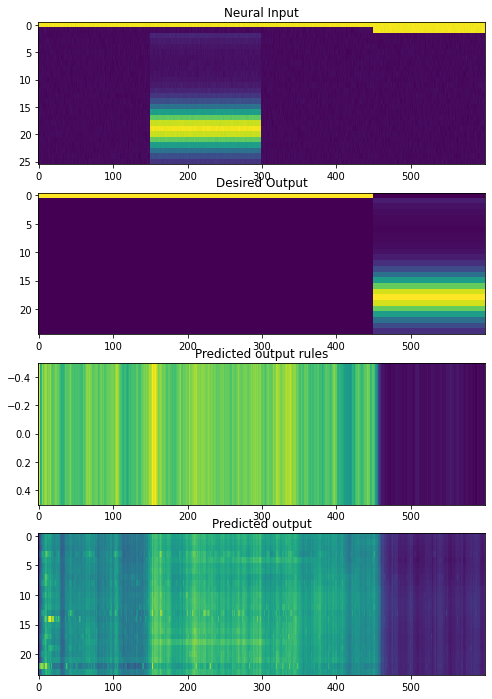

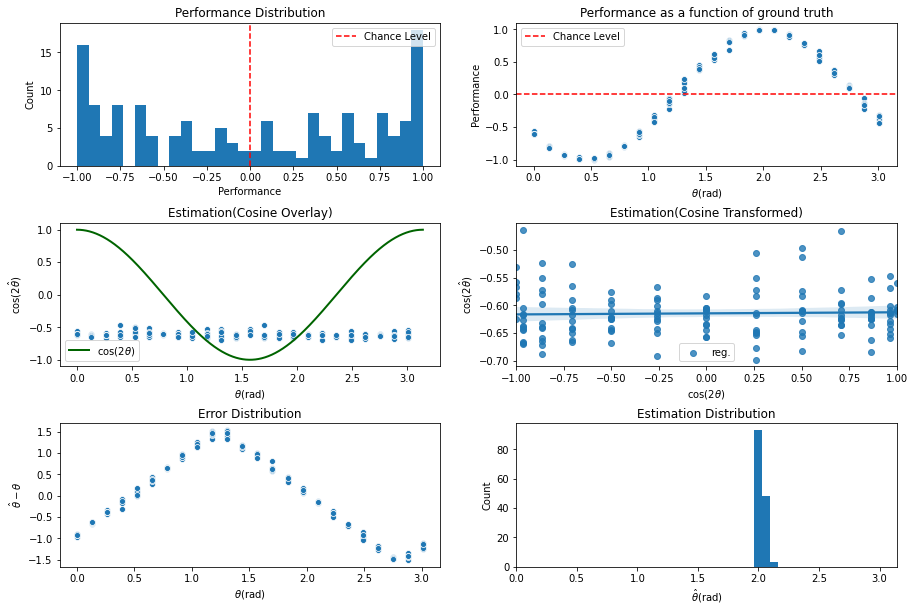

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter600\assets

 Training performance: 
Iter.  601 | Performance 0.0243 | Loss 0.3314 | Spike loss 2.8681
Testing performance: 
Iter.  601 | Performance -0.0045 | Loss 0.3302 | Spike loss 2.8537

 Training performance: 
Iter.  602 | Performance 0.1099 | Loss 0.3299 | Spike loss 2.8420
Testing performance: 
Iter.  602 | Performance -0.0014 | Loss 0.3310 | Spike loss 2.8617

 Training performance: 
Iter.  603 | Performance -0.0605 | Loss 0.3313 | Spike loss 2.8604
Testing performance: 
Iter.  603 | Performance -0.0029 | Loss 0.3323 | Spike loss 2.8475

 Training performance: 
Iter.  604 | Performance -0.0917 | Loss 0.3321 | Spike loss 2.8429
Testing performance: 
Iter.  604 | Performance 0.0020 | Loss 0.3307 | Spike loss 2.8468

 Training performance: 
Iter.  605 | Performance 0.0421 | Loss 0.3300 | Spike loss 2.8513
Testing performance: 
Iter.  605 | Performance 0.0094 | Loss 0.3307 | Spike loss 2.8630

 Tr


 Training performance: 
Iter.  647 | Performance -0.1598 | Loss 0.3300 | Spike loss 2.7935
Testing performance: 
Iter.  647 | Performance 0.0191 | Loss 0.3295 | Spike loss 2.7928

 Training performance: 
Iter.  648 | Performance -0.0685 | Loss 0.3293 | Spike loss 2.7947
Testing performance: 
Iter.  648 | Performance 0.0172 | Loss 0.3298 | Spike loss 2.7972

 Training performance: 
Iter.  649 | Performance -0.0231 | Loss 0.3290 | Spike loss 2.8040
Testing performance: 
Iter.  649 | Performance 0.0033 | Loss 0.3284 | Spike loss 2.7887

 Training performance: 
Iter.  650 | Performance -0.0108 | Loss 0.3283 | Spike loss 2.7957
Testing performance: 
Iter.  650 | Performance 0.0006 | Loss 0.3296 | Spike loss 2.7850

 Training performance: 
Iter.  651 | Performance 0.0823 | Loss 0.3294 | Spike loss 2.8056
Testing performance: 
Iter.  651 | Performance -0.0003 | Loss 0.3305 | Spike loss 2.7917

 Training performance: 
Iter.  652 | Performance 0.0464 | Loss 0.3305 | Spike loss 2.7920
Testing p


 Training performance: 
Iter.  693 | Performance -0.0374 | Loss 0.3291 | Spike loss 2.7795
Testing performance: 
Iter.  693 | Performance 0.0009 | Loss 0.3299 | Spike loss 2.7551

 Training performance: 
Iter.  694 | Performance -0.0496 | Loss 0.3298 | Spike loss 2.7759
Testing performance: 
Iter.  694 | Performance -0.0001 | Loss 0.3277 | Spike loss 2.7838

 Training performance: 
Iter.  695 | Performance 0.0095 | Loss 0.3284 | Spike loss 2.7630
Testing performance: 
Iter.  695 | Performance -0.0011 | Loss 0.3290 | Spike loss 2.7688

 Training performance: 
Iter.  696 | Performance 0.0893 | Loss 0.3275 | Spike loss 2.7761
Testing performance: 
Iter.  696 | Performance 0.0021 | Loss 0.3296 | Spike loss 2.7705

 Training performance: 
Iter.  697 | Performance 0.0446 | Loss 0.3288 | Spike loss 2.7712
Testing performance: 
Iter.  697 | Performance 0.0060 | Loss 0.3278 | Spike loss 2.7722

 Training performance: 
Iter.  698 | Performance -0.1176 | Loss 0.3289 | Spike loss 2.7813
Testing p

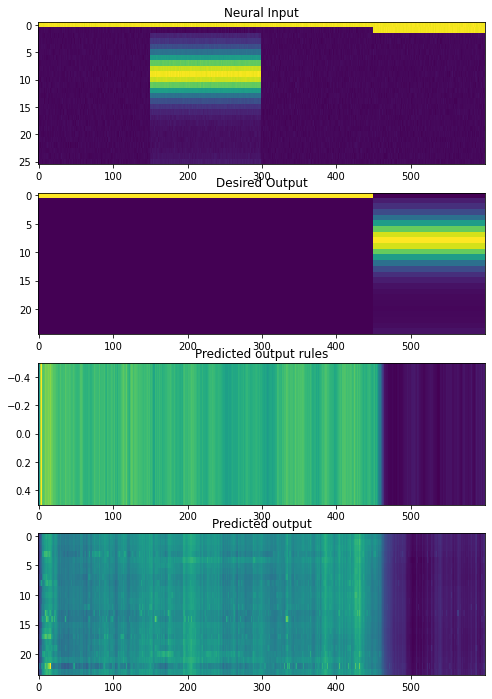

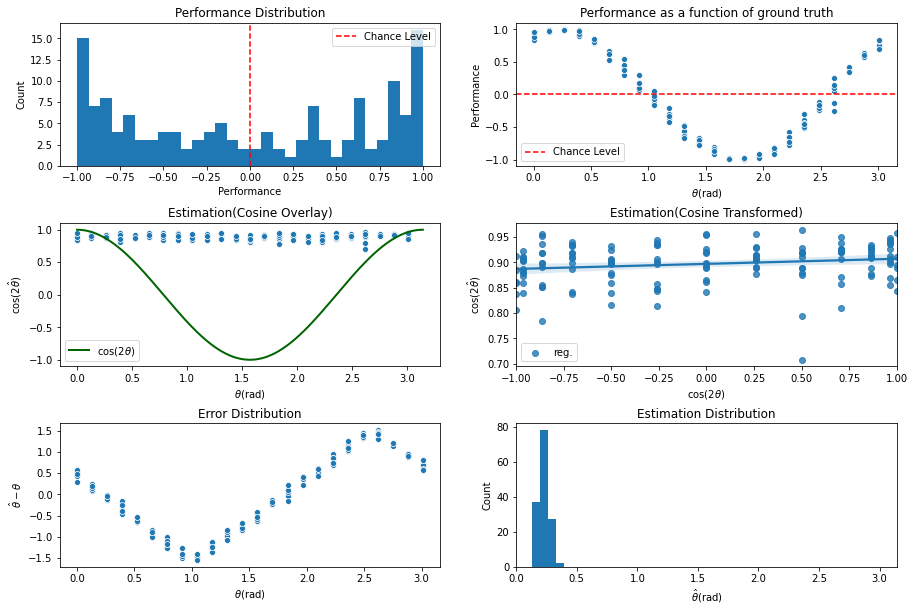

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter700\assets

 Training performance: 
Iter.  701 | Performance -0.0242 | Loss 0.3283 | Spike loss 2.7682
Testing performance: 
Iter.  701 | Performance 0.0038 | Loss 0.3291 | Spike loss 2.7797

 Training performance: 
Iter.  702 | Performance -0.0022 | Loss 0.3283 | Spike loss 2.7848
Testing performance: 
Iter.  702 | Performance 0.0050 | Loss 0.3294 | Spike loss 2.7766

 Training performance: 
Iter.  703 | Performance -0.0444 | Loss 0.3295 | Spike loss 2.7724
Testing performance: 
Iter.  703 | Performance -0.0069 | Loss 0.3282 | Spike loss 2.7677

 Training performance: 
Iter.  704 | Performance 0.1063 | Loss 0.3275 | Spike loss 2.7824
Testing performance: 
Iter.  704 | Performance 0.0101 | Loss 0.3285 | Spike loss 2.7503

 Training performance: 
Iter.  705 | Performance 0.0309 | Loss 0.3277 | Spike loss 2.7668
Testing performance: 
Iter.  705 | Performance 0.0028 | Loss 0.3291 | Spike loss 2.7604

 Tra


 Training performance: 
Iter.  747 | Performance -0.0197 | Loss 0.3279 | Spike loss 2.7002
Testing performance: 
Iter.  747 | Performance -0.0011 | Loss 0.3286 | Spike loss 2.6965

 Training performance: 
Iter.  748 | Performance -0.0513 | Loss 0.3297 | Spike loss 2.6869
Testing performance: 
Iter.  748 | Performance 0.0060 | Loss 0.3281 | Spike loss 2.6949

 Training performance: 
Iter.  749 | Performance -0.0027 | Loss 0.3269 | Spike loss 2.7100
Testing performance: 
Iter.  749 | Performance -0.0006 | Loss 0.3277 | Spike loss 2.7018

 Training performance: 
Iter.  750 | Performance 0.1555 | Loss 0.3268 | Spike loss 2.7194
Testing performance: 
Iter.  750 | Performance -0.0000 | Loss 0.3284 | Spike loss 2.7015

 Training performance: 
Iter.  751 | Performance 0.0123 | Loss 0.3277 | Spike loss 2.7050
Testing performance: 
Iter.  751 | Performance 0.0061 | Loss 0.3269 | Spike loss 2.6870

 Training performance: 
Iter.  752 | Performance 0.0425 | Loss 0.3265 | Spike loss 2.7095
Testing 


 Training performance: 
Iter.  793 | Performance -0.0282 | Loss 0.3279 | Spike loss 2.7042
Testing performance: 
Iter.  793 | Performance 0.0003 | Loss 0.3265 | Spike loss 2.6926

 Training performance: 
Iter.  794 | Performance -0.0438 | Loss 0.3269 | Spike loss 2.6918
Testing performance: 
Iter.  794 | Performance -0.0006 | Loss 0.3268 | Spike loss 2.6972

 Training performance: 
Iter.  795 | Performance -0.1182 | Loss 0.3273 | Spike loss 2.6925
Testing performance: 
Iter.  795 | Performance -0.0046 | Loss 0.3281 | Spike loss 2.6871

 Training performance: 
Iter.  796 | Performance 0.0056 | Loss 0.3278 | Spike loss 2.6799
Testing performance: 
Iter.  796 | Performance 0.0043 | Loss 0.3260 | Spike loss 2.6770

 Training performance: 
Iter.  797 | Performance 0.0447 | Loss 0.3260 | Spike loss 2.6764
Testing performance: 
Iter.  797 | Performance 0.0061 | Loss 0.3267 | Spike loss 2.6924

 Training performance: 
Iter.  798 | Performance 0.0862 | Loss 0.3261 | Spike loss 2.6939
Testing p

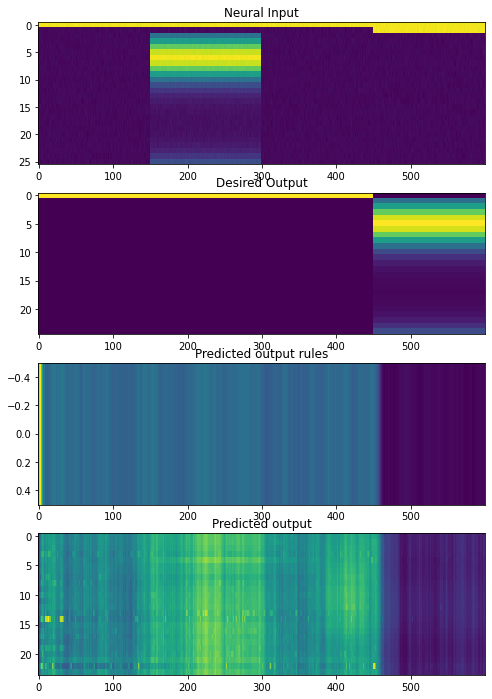

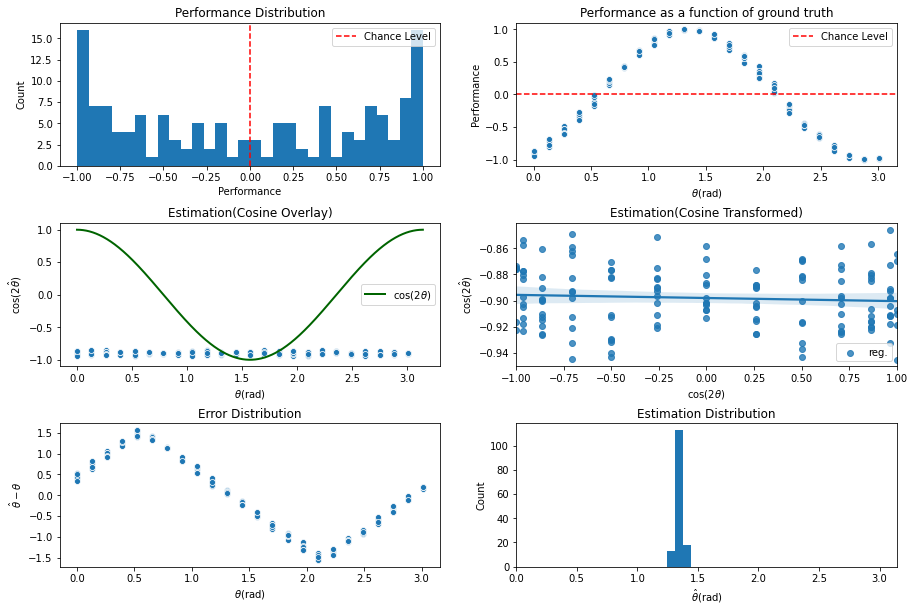

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter800\assets

 Training performance: 
Iter.  801 | Performance 0.0514 | Loss 0.3260 | Spike loss 2.6763
Testing performance: 
Iter.  801 | Performance 0.0022 | Loss 0.3280 | Spike loss 2.6831

 Training performance: 
Iter.  802 | Performance -0.0073 | Loss 0.3275 | Spike loss 2.6823
Testing performance: 
Iter.  802 | Performance 0.0034 | Loss 0.3262 | Spike loss 2.6921

 Training performance: 
Iter.  803 | Performance 0.0923 | Loss 0.3261 | Spike loss 2.6801
Testing performance: 
Iter.  803 | Performance 0.0008 | Loss 0.3255 | Spike loss 2.6909

 Training performance: 
Iter.  804 | Performance 0.0988 | Loss 0.3258 | Spike loss 2.6937
Testing performance: 
Iter.  804 | Performance -0.0022 | Loss 0.3275 | Spike loss 2.6977

 Training performance: 
Iter.  805 | Performance 0.0011 | Loss 0.3279 | Spike loss 2.7093
Testing performance: 
Iter.  805 | Performance 0.0074 | Loss 0.3261 | Spike loss 2.6783

 Train


 Training performance: 
Iter.  847 | Performance -0.0392 | Loss 0.3264 | Spike loss 2.6596
Testing performance: 
Iter.  847 | Performance 0.0025 | Loss 0.3256 | Spike loss 2.6692

 Training performance: 
Iter.  848 | Performance -0.0050 | Loss 0.3258 | Spike loss 2.6634
Testing performance: 
Iter.  848 | Performance -0.0027 | Loss 0.3271 | Spike loss 2.6677

 Training performance: 
Iter.  849 | Performance -0.0992 | Loss 0.3271 | Spike loss 2.6706
Testing performance: 
Iter.  849 | Performance -0.0011 | Loss 0.3271 | Spike loss 2.6687

 Training performance: 
Iter.  850 | Performance 0.0730 | Loss 0.3259 | Spike loss 2.6514
Testing performance: 
Iter.  850 | Performance 0.0062 | Loss 0.3250 | Spike loss 2.6712

 Training performance: 
Iter.  851 | Performance -0.0660 | Loss 0.3255 | Spike loss 2.6655
Testing performance: 
Iter.  851 | Performance 0.0014 | Loss 0.3256 | Spike loss 2.6782

 Training performance: 
Iter.  852 | Performance -0.0895 | Loss 0.3259 | Spike loss 2.6782
Testing


 Training performance: 
Iter.  893 | Performance 0.0402 | Loss 0.3244 | Spike loss 2.6448
Testing performance: 
Iter.  893 | Performance -0.0007 | Loss 0.3249 | Spike loss 2.6504

 Training performance: 
Iter.  894 | Performance 0.0422 | Loss 0.3251 | Spike loss 2.6496
Testing performance: 
Iter.  894 | Performance 0.0028 | Loss 0.3246 | Spike loss 2.6725

 Training performance: 
Iter.  895 | Performance -0.1036 | Loss 0.3254 | Spike loss 2.6672
Testing performance: 
Iter.  895 | Performance -0.0028 | Loss 0.3252 | Spike loss 2.6510

 Training performance: 
Iter.  896 | Performance -0.1036 | Loss 0.3266 | Spike loss 2.6468
Testing performance: 
Iter.  896 | Performance 0.0031 | Loss 0.3250 | Spike loss 2.6629

 Training performance: 
Iter.  897 | Performance 0.0118 | Loss 0.3248 | Spike loss 2.6640
Testing performance: 
Iter.  897 | Performance -0.0021 | Loss 0.3251 | Spike loss 2.6683

 Training performance: 
Iter.  898 | Performance -0.0324 | Loss 0.3262 | Spike loss 2.6341
Testing 

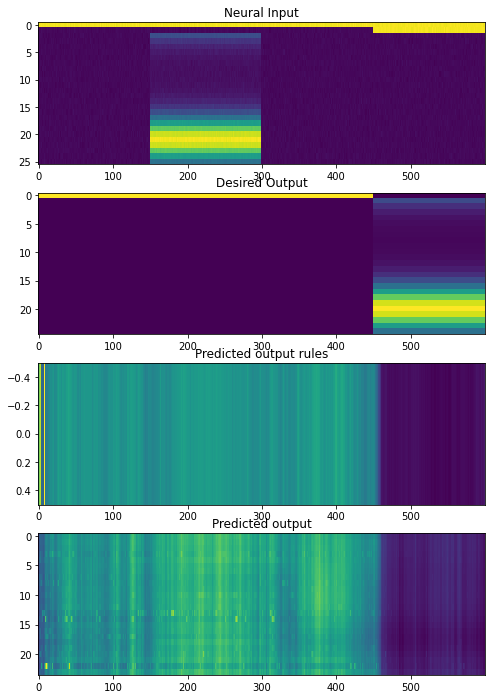

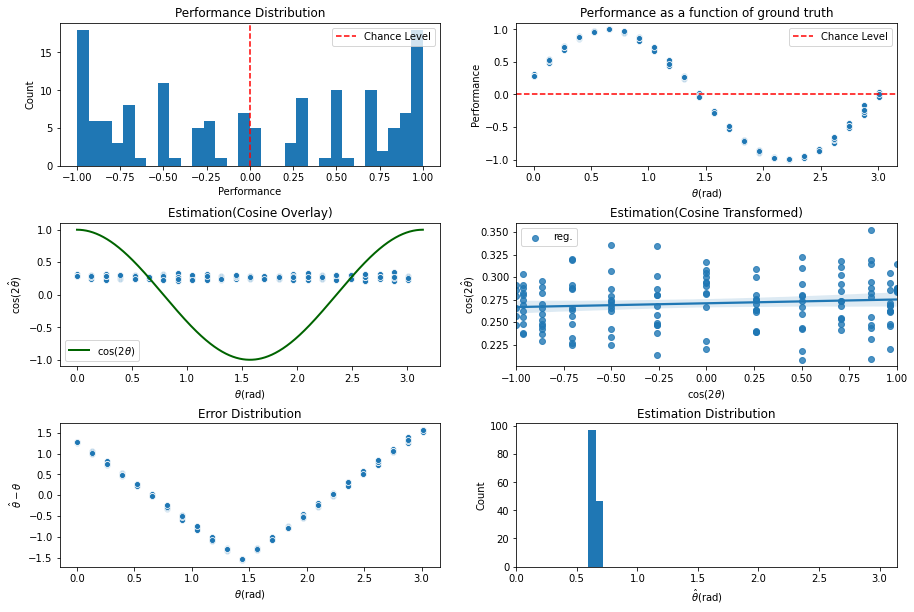

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter900\assets

 Training performance: 
Iter.  901 | Performance -0.0277 | Loss 0.3248 | Spike loss 2.6368
Testing performance: 
Iter.  901 | Performance 0.0039 | Loss 0.3254 | Spike loss 2.6437

 Training performance: 
Iter.  902 | Performance 0.0988 | Loss 0.3242 | Spike loss 2.6482
Testing performance: 
Iter.  902 | Performance 0.0028 | Loss 0.3249 | Spike loss 2.6240

 Training performance: 
Iter.  903 | Performance -0.0487 | Loss 0.3257 | Spike loss 2.6518
Testing performance: 
Iter.  903 | Performance 0.0010 | Loss 0.3250 | Spike loss 2.6465

 Training performance: 
Iter.  904 | Performance -0.0277 | Loss 0.3247 | Spike loss 2.6269
Testing performance: 
Iter.  904 | Performance -0.0018 | Loss 0.3242 | Spike loss 2.6436

 Training performance: 
Iter.  905 | Performance 0.0257 | Loss 0.3240 | Spike loss 2.6410
Testing performance: 
Iter.  905 | Performance 0.0081 | Loss 0.3245 | Spike loss 2.6351

 Tra


 Training performance: 
Iter.  947 | Performance 0.0538 | Loss 0.3233 | Spike loss 2.6268
Testing performance: 
Iter.  947 | Performance -0.0066 | Loss 0.3237 | Spike loss 2.6360

 Training performance: 
Iter.  948 | Performance -0.0138 | Loss 0.3241 | Spike loss 2.6420
Testing performance: 
Iter.  948 | Performance 0.0070 | Loss 0.3240 | Spike loss 2.6161

 Training performance: 
Iter.  949 | Performance 0.0909 | Loss 0.3238 | Spike loss 2.6314
Testing performance: 
Iter.  949 | Performance -0.0017 | Loss 0.3243 | Spike loss 2.6199

 Training performance: 
Iter.  950 | Performance -0.0313 | Loss 0.3241 | Spike loss 2.6331
Testing performance: 
Iter.  950 | Performance -0.0035 | Loss 0.3235 | Spike loss 2.6147

 Training performance: 
Iter.  951 | Performance 0.0700 | Loss 0.3236 | Spike loss 2.6300
Testing performance: 
Iter.  951 | Performance 0.0032 | Loss 0.3245 | Spike loss 2.6133

 Training performance: 
Iter.  952 | Performance -0.0488 | Loss 0.3240 | Spike loss 2.6271
Testing 


 Training performance: 
Iter.  993 | Performance 0.0531 | Loss 0.3234 | Spike loss 2.6237
Testing performance: 
Iter.  993 | Performance -0.0006 | Loss 0.3250 | Spike loss 2.6059

 Training performance: 
Iter.  994 | Performance -0.0106 | Loss 0.3248 | Spike loss 2.5977
Testing performance: 
Iter.  994 | Performance 0.0024 | Loss 0.3243 | Spike loss 2.6129

 Training performance: 
Iter.  995 | Performance 0.0869 | Loss 0.3234 | Spike loss 2.6092
Testing performance: 
Iter.  995 | Performance 0.0002 | Loss 0.3243 | Spike loss 2.6222

 Training performance: 
Iter.  996 | Performance -0.1329 | Loss 0.3251 | Spike loss 2.6131
Testing performance: 
Iter.  996 | Performance 0.0054 | Loss 0.3237 | Spike loss 2.6269

 Training performance: 
Iter.  997 | Performance -0.0189 | Loss 0.3237 | Spike loss 2.6284
Testing performance: 
Iter.  997 | Performance -0.0008 | Loss 0.3242 | Spike loss 2.6101

 Training performance: 
Iter.  998 | Performance 0.1219 | Loss 0.3231 | Spike loss 2.6079
Testing p

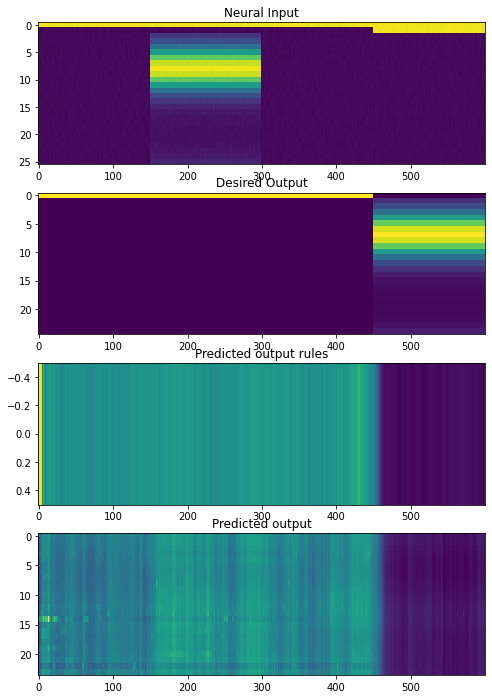

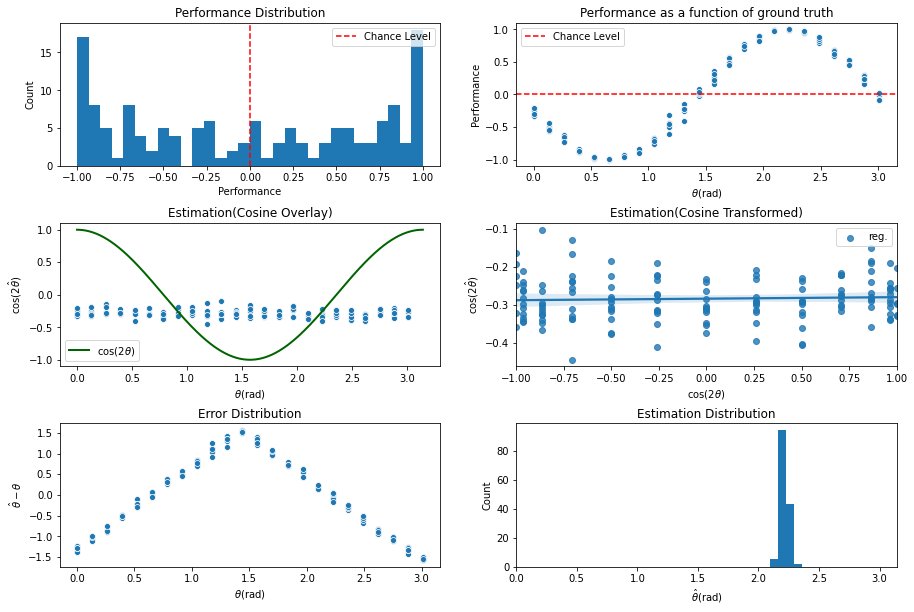

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1000\assets

 Training performance: 
Iter. 1001 | Performance -0.0182 | Loss 0.3236 | Spike loss 2.6167
Testing performance: 
Iter. 1001 | Performance 0.0025 | Loss 0.3237 | Spike loss 2.6188

 Training performance: 
Iter. 1002 | Performance -0.1234 | Loss 0.3249 | Spike loss 2.6178
Testing performance: 
Iter. 1002 | Performance 0.0003 | Loss 0.3237 | Spike loss 2.6239

 Training performance: 
Iter. 1003 | Performance 0.0681 | Loss 0.3230 | Spike loss 2.6328
Testing performance: 
Iter. 1003 | Performance 0.0039 | Loss 0.3243 | Spike loss 2.6318

 Training performance: 
Iter. 1004 | Performance -0.1496 | Loss 0.3245 | Spike loss 2.6412
Testing performance: 
Iter. 1004 | Performance 0.0257 | Loss 0.3234 | Spike loss 2.6238

 Training performance: 
Iter. 1005 | Performance 0.0272 | Loss 0.3236 | Spike loss 2.6259
Testing performance: 
Iter. 1005 | Performance -0.0014 | Loss 0.3233 | Spike loss 2.6107

 Tr


 Training performance: 
Iter. 1047 | Performance -0.0253 | Loss 0.3233 | Spike loss 2.6333
Testing performance: 
Iter. 1047 | Performance -0.0119 | Loss 0.3234 | Spike loss 2.6391

 Training performance: 
Iter. 1048 | Performance -0.0289 | Loss 0.3228 | Spike loss 2.6191
Testing performance: 
Iter. 1048 | Performance 0.0036 | Loss 0.3230 | Spike loss 2.6355

 Training performance: 
Iter. 1049 | Performance -0.0603 | Loss 0.3234 | Spike loss 2.6290
Testing performance: 
Iter. 1049 | Performance -0.0000 | Loss 0.3231 | Spike loss 2.6276

 Training performance: 
Iter. 1050 | Performance -0.0261 | Loss 0.3230 | Spike loss 2.6270
Testing performance: 
Iter. 1050 | Performance -0.0023 | Loss 0.3235 | Spike loss 2.6356

 Training performance: 
Iter. 1051 | Performance -0.0129 | Loss 0.3235 | Spike loss 2.6403
Testing performance: 
Iter. 1051 | Performance 0.0024 | Loss 0.3235 | Spike loss 2.6349

 Training performance: 
Iter. 1052 | Performance -0.0645 | Loss 0.3240 | Spike loss 2.6276
Testi


 Training performance: 
Iter. 1093 | Performance -0.0085 | Loss 0.3233 | Spike loss 2.6046
Testing performance: 
Iter. 1093 | Performance -0.0034 | Loss 0.3228 | Spike loss 2.5961

 Training performance: 
Iter. 1094 | Performance -0.0032 | Loss 0.3224 | Spike loss 2.6102
Testing performance: 
Iter. 1094 | Performance 0.0076 | Loss 0.3233 | Spike loss 2.6145

 Training performance: 
Iter. 1095 | Performance -0.0268 | Loss 0.3231 | Spike loss 2.5974
Testing performance: 
Iter. 1095 | Performance 0.0475 | Loss 0.3234 | Spike loss 2.6082

 Training performance: 
Iter. 1096 | Performance -0.0714 | Loss 0.3224 | Spike loss 2.6146
Testing performance: 
Iter. 1096 | Performance -0.0050 | Loss 0.3222 | Spike loss 2.6114

 Training performance: 
Iter. 1097 | Performance 0.0545 | Loss 0.3229 | Spike loss 2.6012
Testing performance: 
Iter. 1097 | Performance 0.0068 | Loss 0.3226 | Spike loss 2.5987

 Training performance: 
Iter. 1098 | Performance -0.0482 | Loss 0.3232 | Spike loss 2.6038
Testing

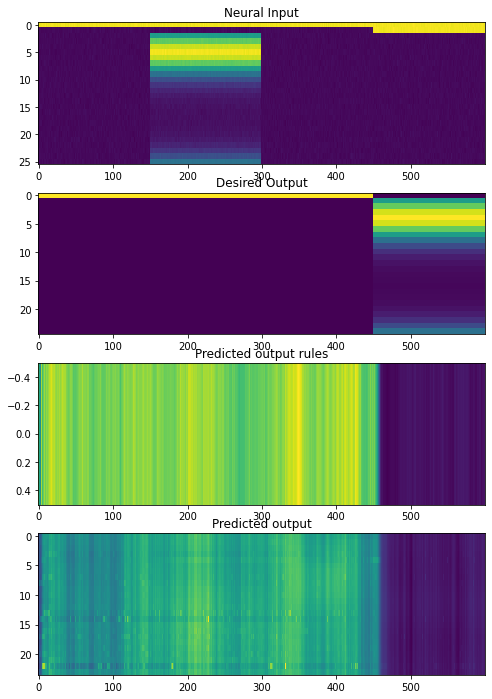

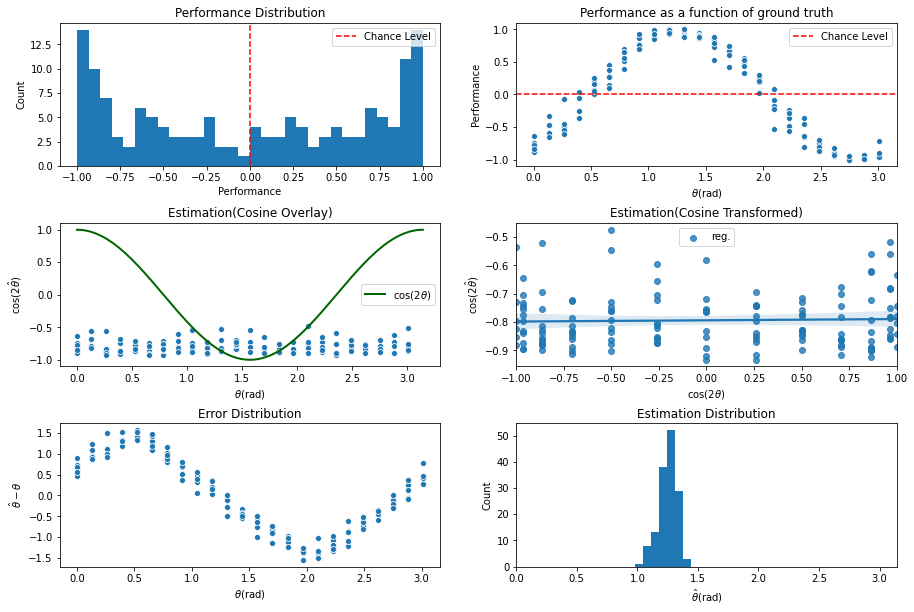

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1100\assets

 Training performance: 
Iter. 1101 | Performance 0.0703 | Loss 0.3224 | Spike loss 2.6073
Testing performance: 
Iter. 1101 | Performance 0.0060 | Loss 0.3224 | Spike loss 2.6068

 Training performance: 
Iter. 1102 | Performance -0.0377 | Loss 0.3228 | Spike loss 2.5963
Testing performance: 
Iter. 1102 | Performance 0.0073 | Loss 0.3229 | Spike loss 2.6046

 Training performance: 
Iter. 1103 | Performance 0.1268 | Loss 0.3222 | Spike loss 2.6097
Testing performance: 
Iter. 1103 | Performance 0.0130 | Loss 0.3226 | Spike loss 2.6030

 Training performance: 
Iter. 1104 | Performance 0.0173 | Loss 0.3225 | Spike loss 2.6234
Testing performance: 
Iter. 1104 | Performance 0.0004 | Loss 0.3221 | Spike loss 2.6063

 Training performance: 
Iter. 1105 | Performance 0.0627 | Loss 0.3221 | Spike loss 2.6238
Testing performance: 
Iter. 1105 | Performance 0.0035 | Loss 0.3237 | Spike loss 2.5936

 Train


 Training performance: 
Iter. 1147 | Performance -0.0359 | Loss 0.3220 | Spike loss 2.5747
Testing performance: 
Iter. 1147 | Performance 0.0125 | Loss 0.3220 | Spike loss 2.5735

 Training performance: 
Iter. 1148 | Performance -0.0035 | Loss 0.3222 | Spike loss 2.5792
Testing performance: 
Iter. 1148 | Performance 0.0022 | Loss 0.3219 | Spike loss 2.5787

 Training performance: 
Iter. 1149 | Performance -0.0399 | Loss 0.3225 | Spike loss 2.5732
Testing performance: 
Iter. 1149 | Performance 0.0245 | Loss 0.3222 | Spike loss 2.5646

 Training performance: 
Iter. 1150 | Performance -0.0430 | Loss 0.3225 | Spike loss 2.5620
Testing performance: 
Iter. 1150 | Performance 0.0093 | Loss 0.3220 | Spike loss 2.5728

 Training performance: 
Iter. 1151 | Performance -0.0726 | Loss 0.3228 | Spike loss 2.5752
Testing performance: 
Iter. 1151 | Performance 0.0111 | Loss 0.3222 | Spike loss 2.5721

 Training performance: 
Iter. 1152 | Performance 0.0125 | Loss 0.3226 | Spike loss 2.5768
Testing p


 Training performance: 
Iter. 1193 | Performance 0.0425 | Loss 0.3222 | Spike loss 2.5275
Testing performance: 
Iter. 1193 | Performance -0.0026 | Loss 0.3227 | Spike loss 2.5198

 Training performance: 
Iter. 1194 | Performance 0.0207 | Loss 0.3219 | Spike loss 2.5318
Testing performance: 
Iter. 1194 | Performance -0.0008 | Loss 0.3229 | Spike loss 2.5148

 Training performance: 
Iter. 1195 | Performance -0.0778 | Loss 0.3225 | Spike loss 2.5240
Testing performance: 
Iter. 1195 | Performance -0.0014 | Loss 0.3223 | Spike loss 2.5176

 Training performance: 
Iter. 1196 | Performance 0.1360 | Loss 0.3216 | Spike loss 2.5140
Testing performance: 
Iter. 1196 | Performance -0.0024 | Loss 0.3223 | Spike loss 2.5235

 Training performance: 
Iter. 1197 | Performance -0.0187 | Loss 0.3227 | Spike loss 2.5124
Testing performance: 
Iter. 1197 | Performance -0.0056 | Loss 0.3217 | Spike loss 2.5199

 Training performance: 
Iter. 1198 | Performance 0.0107 | Loss 0.3218 | Spike loss 2.5088
Testing

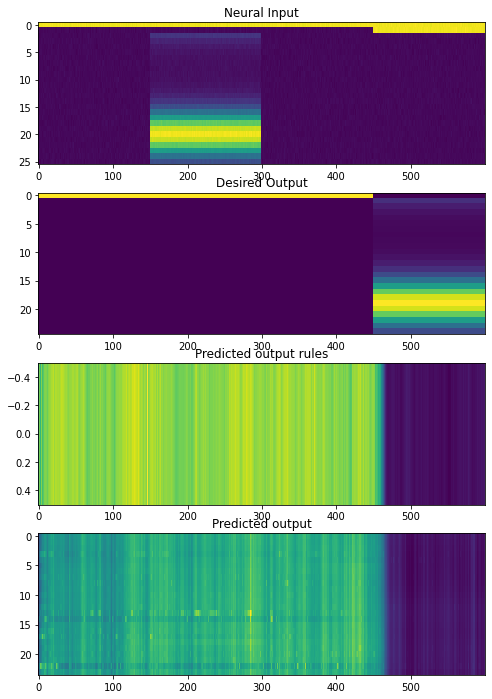

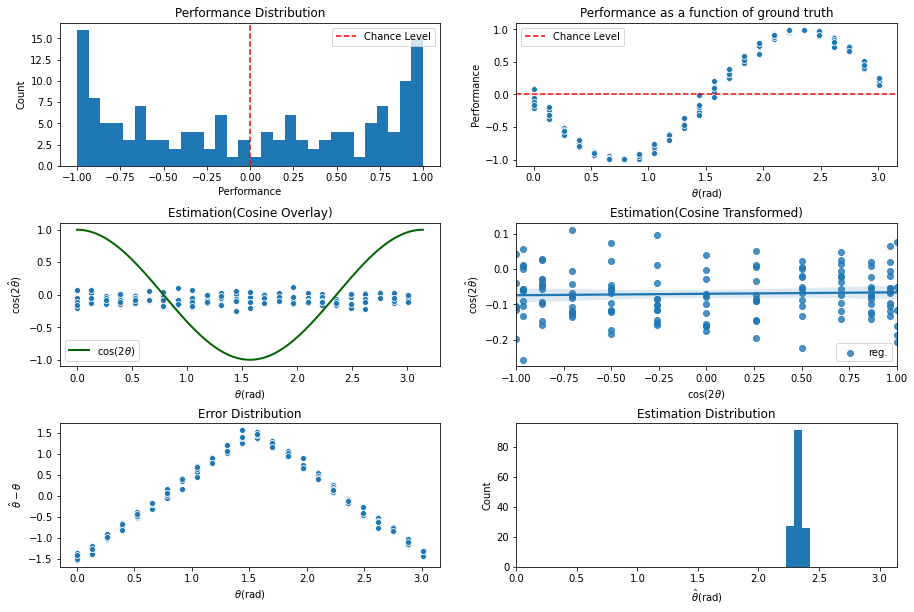

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1200\assets

 Training performance: 
Iter. 1201 | Performance 0.0415 | Loss 0.3220 | Spike loss 2.5033
Testing performance: 
Iter. 1201 | Performance 0.0011 | Loss 0.3220 | Spike loss 2.5127

 Training performance: 
Iter. 1202 | Performance 0.0642 | Loss 0.3222 | Spike loss 2.5053
Testing performance: 
Iter. 1202 | Performance 0.0001 | Loss 0.3222 | Spike loss 2.4992

 Training performance: 
Iter. 1203 | Performance -0.0488 | Loss 0.3223 | Spike loss 2.5059
Testing performance: 
Iter. 1203 | Performance 0.0008 | Loss 0.3219 | Spike loss 2.4944

 Training performance: 
Iter. 1204 | Performance -0.0213 | Loss 0.3223 | Spike loss 2.5114
Testing performance: 
Iter. 1204 | Performance 0.0024 | Loss 0.3217 | Spike loss 2.4960

 Training performance: 
Iter. 1205 | Performance 0.0034 | Loss 0.3222 | Spike loss 2.5087
Testing performance: 
Iter. 1205 | Performance -0.0026 | Loss 0.3221 | Spike loss 2.5012

 Tra


 Training performance: 
Iter. 1246 | Performance 0.0472 | Loss 0.3214 | Spike loss 2.4879
Testing performance: 
Iter. 1246 | Performance 0.0014 | Loss 0.3216 | Spike loss 2.4905

 Training performance: 
Iter. 1247 | Performance -0.0136 | Loss 0.3219 | Spike loss 2.4919
Testing performance: 
Iter. 1247 | Performance 0.0046 | Loss 0.3216 | Spike loss 2.4903

 Training performance: 
Iter. 1248 | Performance -0.0053 | Loss 0.3218 | Spike loss 2.4880
Testing performance: 
Iter. 1248 | Performance 0.0003 | Loss 0.3216 | Spike loss 2.4862

 Training performance: 
Iter. 1249 | Performance 0.0507 | Loss 0.3213 | Spike loss 2.4930
Testing performance: 
Iter. 1249 | Performance 0.0050 | Loss 0.3217 | Spike loss 2.4865

 Training performance: 
Iter. 1250 | Performance -0.0928 | Loss 0.3218 | Spike loss 2.5015
Testing performance: 
Iter. 1250 | Performance -0.0004 | Loss 0.3217 | Spike loss 2.4797

 Training performance: 
Iter. 1251 | Performance 0.0114 | Loss 0.3207 | Spike loss 2.4977
Testing pe


 Training performance: 
Iter. 1292 | Performance 0.0919 | Loss 0.3208 | Spike loss 2.4589
Testing performance: 
Iter. 1292 | Performance 0.0015 | Loss 0.3216 | Spike loss 2.4548

 Training performance: 
Iter. 1293 | Performance -0.0423 | Loss 0.3220 | Spike loss 2.4615
Testing performance: 
Iter. 1293 | Performance 0.0005 | Loss 0.3217 | Spike loss 2.4520

 Training performance: 
Iter. 1294 | Performance 0.0581 | Loss 0.3211 | Spike loss 2.4512
Testing performance: 
Iter. 1294 | Performance 0.0013 | Loss 0.3214 | Spike loss 2.4501

 Training performance: 
Iter. 1295 | Performance -0.0374 | Loss 0.3216 | Spike loss 2.4464
Testing performance: 
Iter. 1295 | Performance 0.0019 | Loss 0.3214 | Spike loss 2.4552

 Training performance: 
Iter. 1296 | Performance -0.0150 | Loss 0.3217 | Spike loss 2.4516
Testing performance: 
Iter. 1296 | Performance 0.0048 | Loss 0.3215 | Spike loss 2.4412

 Training performance: 
Iter. 1297 | Performance -0.0515 | Loss 0.3215 | Spike loss 2.4557
Testing pe

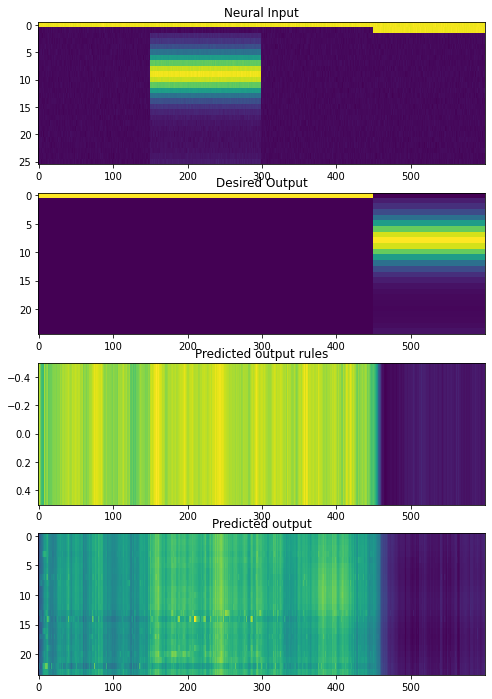

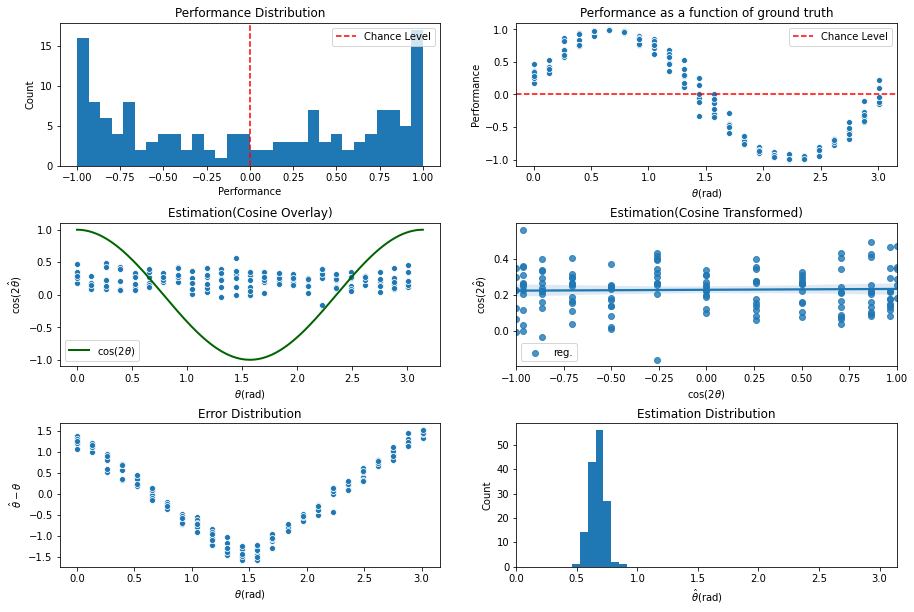

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1300\assets

 Training performance: 
Iter. 1301 | Performance -0.0018 | Loss 0.3207 | Spike loss 2.4566
Testing performance: 
Iter. 1301 | Performance -0.0015 | Loss 0.3217 | Spike loss 2.4375

 Training performance: 
Iter. 1302 | Performance 0.0769 | Loss 0.3208 | Spike loss 2.4441
Testing performance: 
Iter. 1302 | Performance 0.0038 | Loss 0.3215 | Spike loss 2.4519

 Training performance: 
Iter. 1303 | Performance 0.0773 | Loss 0.3209 | Spike loss 2.4413
Testing performance: 
Iter. 1303 | Performance -0.0008 | Loss 0.3218 | Spike loss 2.4420

 Training performance: 
Iter. 1304 | Performance 0.0385 | Loss 0.3217 | Spike loss 2.4410
Testing performance: 
Iter. 1304 | Performance 0.0002 | Loss 0.3230 | Spike loss 2.4487

 Training performance: 
Iter. 1305 | Performance -0.0214 | Loss 0.3222 | Spike loss 2.4418
Testing performance: 
Iter. 1305 | Performance 0.0069 | Loss 0.3215 | Spike loss 2.4477

 Tr


 Training performance: 
Iter. 1346 | Performance -0.0061 | Loss 0.3211 | Spike loss 2.4051
Testing performance: 
Iter. 1346 | Performance 0.0735 | Loss 0.3210 | Spike loss 2.4097

 Training performance: 
Iter. 1347 | Performance 0.0297 | Loss 0.3210 | Spike loss 2.4115
Testing performance: 
Iter. 1347 | Performance -0.0387 | Loss 0.3214 | Spike loss 2.3989

 Training performance: 
Iter. 1348 | Performance -0.0459 | Loss 0.3213 | Spike loss 2.4104
Testing performance: 
Iter. 1348 | Performance -0.0098 | Loss 0.3212 | Spike loss 2.4142

 Training performance: 
Iter. 1349 | Performance -0.0698 | Loss 0.3207 | Spike loss 2.4108
Testing performance: 
Iter. 1349 | Performance -0.0044 | Loss 0.3211 | Spike loss 2.3956

 Training performance: 
Iter. 1350 | Performance 0.1008 | Loss 0.3206 | Spike loss 2.4091
Testing performance: 
Iter. 1350 | Performance -0.0114 | Loss 0.3211 | Spike loss 2.4091

 Training performance: 
Iter. 1351 | Performance 0.0655 | Loss 0.3207 | Spike loss 2.4050
Testing


 Training performance: 
Iter. 1392 | Performance -0.0207 | Loss 0.3214 | Spike loss 2.3796
Testing performance: 
Iter. 1392 | Performance -0.0056 | Loss 0.3213 | Spike loss 2.3733

 Training performance: 
Iter. 1393 | Performance 0.0862 | Loss 0.3209 | Spike loss 2.3900
Testing performance: 
Iter. 1393 | Performance 0.0005 | Loss 0.3209 | Spike loss 2.3751

 Training performance: 
Iter. 1394 | Performance -0.0317 | Loss 0.3208 | Spike loss 2.3731
Testing performance: 
Iter. 1394 | Performance 0.0072 | Loss 0.3206 | Spike loss 2.3702

 Training performance: 
Iter. 1395 | Performance -0.0408 | Loss 0.3204 | Spike loss 2.3773
Testing performance: 
Iter. 1395 | Performance -0.0045 | Loss 0.3213 | Spike loss 2.3754

 Training performance: 
Iter. 1396 | Performance 0.0139 | Loss 0.3209 | Spike loss 2.3639
Testing performance: 
Iter. 1396 | Performance -0.0012 | Loss 0.3210 | Spike loss 2.3590

 Training performance: 
Iter. 1397 | Performance -0.0641 | Loss 0.3209 | Spike loss 2.3743
Testing

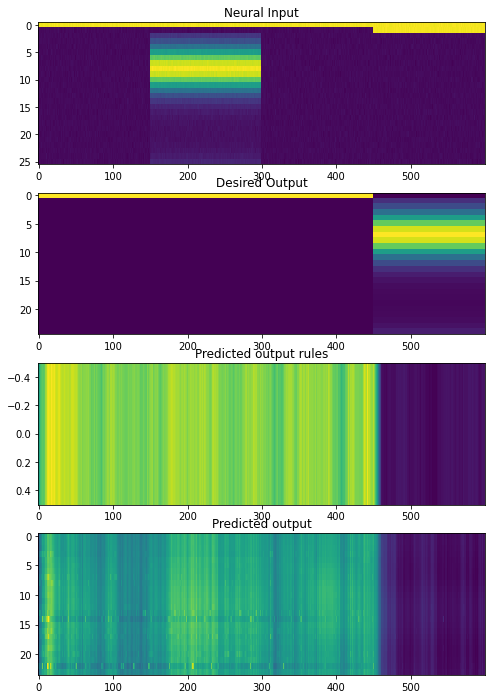

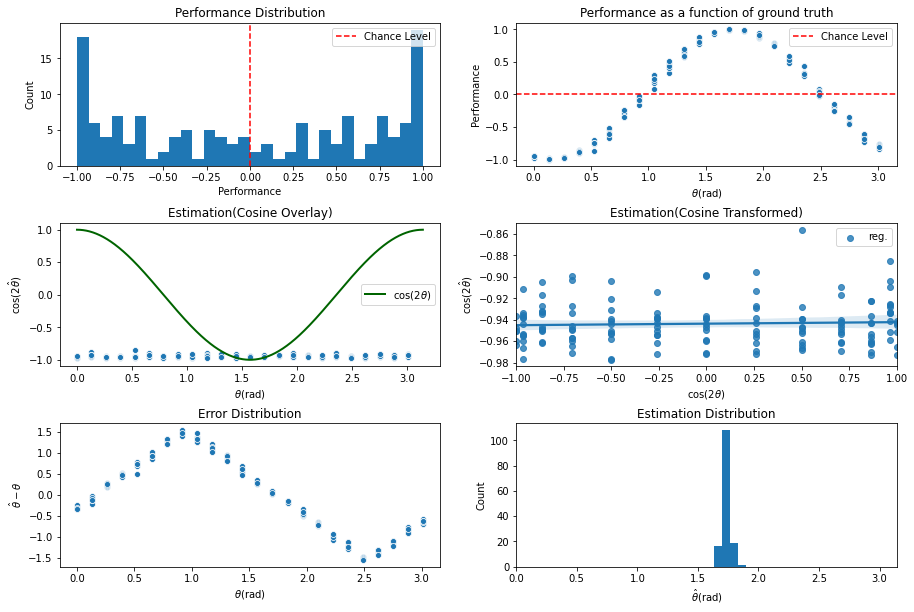

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1400\assets

 Training performance: 
Iter. 1401 | Performance -0.1449 | Loss 0.3210 | Spike loss 2.3627
Testing performance: 
Iter. 1401 | Performance 0.0013 | Loss 0.3209 | Spike loss 2.3622

 Training performance: 
Iter. 1402 | Performance -0.1077 | Loss 0.3205 | Spike loss 2.3475
Testing performance: 
Iter. 1402 | Performance -0.0014 | Loss 0.3208 | Spike loss 2.3549

 Training performance: 
Iter. 1403 | Performance 0.0070 | Loss 0.3206 | Spike loss 2.3564
Testing performance: 
Iter. 1403 | Performance 0.0017 | Loss 0.3208 | Spike loss 2.3520

 Training performance: 
Iter. 1404 | Performance 0.0441 | Loss 0.3204 | Spike loss 2.3596
Testing performance: 
Iter. 1404 | Performance -0.0013 | Loss 0.3207 | Spike loss 2.3561

 Training performance: 
Iter. 1405 | Performance 0.0900 | Loss 0.3204 | Spike loss 2.3528
Testing performance: 
Iter. 1405 | Performance -0.0004 | Loss 0.3212 | Spike loss 2.3449

 T


 Training performance: 
Iter. 1447 | Performance 0.0046 | Loss 0.3211 | Spike loss 2.3202
Testing performance: 
Iter. 1447 | Performance 0.0001 | Loss 0.3214 | Spike loss 2.3307

 Training performance: 
Iter. 1448 | Performance 0.0667 | Loss 0.3203 | Spike loss 2.3209
Testing performance: 
Iter. 1448 | Performance 0.0004 | Loss 0.3209 | Spike loss 2.3069

 Training performance: 
Iter. 1449 | Performance -0.0492 | Loss 0.3215 | Spike loss 2.3133
Testing performance: 
Iter. 1449 | Performance -0.0014 | Loss 0.3210 | Spike loss 2.3193

 Training performance: 
Iter. 1450 | Performance -0.0895 | Loss 0.3217 | Spike loss 2.3287
Testing performance: 
Iter. 1450 | Performance 0.0022 | Loss 0.3211 | Spike loss 2.3152

 Training performance: 
Iter. 1451 | Performance 0.0127 | Loss 0.3208 | Spike loss 2.3199
Testing performance: 
Iter. 1451 | Performance 0.0019 | Loss 0.3206 | Spike loss 2.3153

 Training performance: 
Iter. 1452 | Performance 0.0963 | Loss 0.3201 | Spike loss 2.3180
Testing per


 Training performance: 
Iter. 1493 | Performance -0.0354 | Loss 0.3207 | Spike loss 2.3044
Testing performance: 
Iter. 1493 | Performance 0.0089 | Loss 0.3202 | Spike loss 2.3165

 Training performance: 
Iter. 1494 | Performance -0.0614 | Loss 0.3205 | Spike loss 2.3075
Testing performance: 
Iter. 1494 | Performance 0.0660 | Loss 0.3202 | Spike loss 2.3077

 Training performance: 
Iter. 1495 | Performance 0.0102 | Loss 0.3201 | Spike loss 2.3096
Testing performance: 
Iter. 1495 | Performance 0.0233 | Loss 0.3206 | Spike loss 2.3114

 Training performance: 
Iter. 1496 | Performance 0.0235 | Loss 0.3203 | Spike loss 2.3107
Testing performance: 
Iter. 1496 | Performance 0.0014 | Loss 0.3206 | Spike loss 2.3033

 Training performance: 
Iter. 1497 | Performance 0.0136 | Loss 0.3202 | Spike loss 2.3095
Testing performance: 
Iter. 1497 | Performance -0.0002 | Loss 0.3204 | Spike loss 2.3083

 Training performance: 
Iter. 1498 | Performance -0.0796 | Loss 0.3210 | Spike loss 2.3142
Testing pe

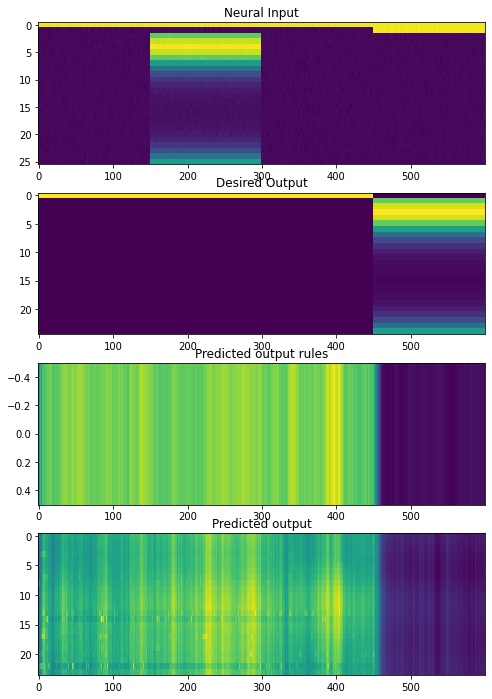

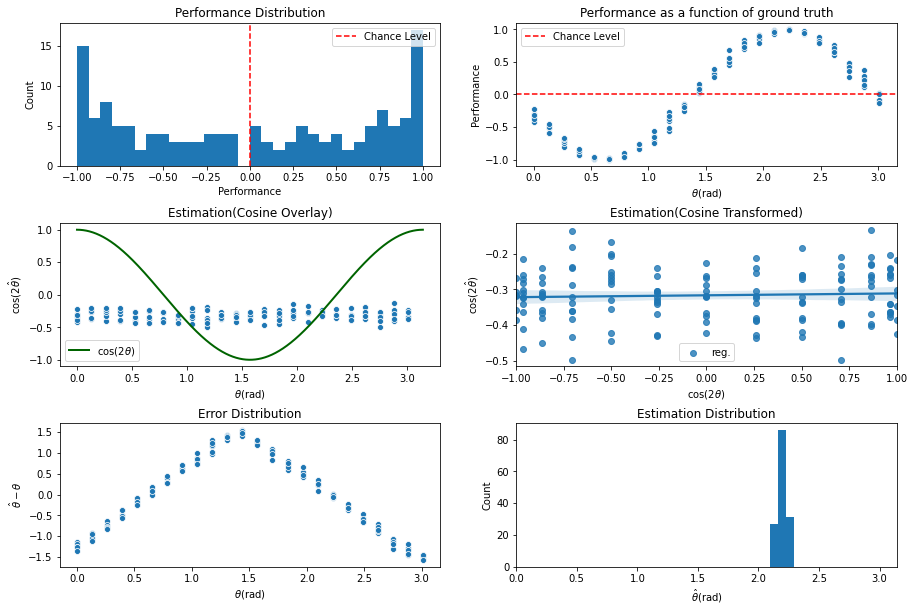

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1500\assets

 Training performance: 
Iter. 1501 | Performance 0.0279 | Loss 0.3200 | Spike loss 2.3123
Testing performance: 
Iter. 1501 | Performance 0.0035 | Loss 0.3207 | Spike loss 2.3114

 Training performance: 
Iter. 1502 | Performance -0.0171 | Loss 0.3206 | Spike loss 2.2969
Testing performance: 
Iter. 1502 | Performance 0.0051 | Loss 0.3203 | Spike loss 2.3092

 Training performance: 
Iter. 1503 | Performance 0.0233 | Loss 0.3208 | Spike loss 2.2981
Testing performance: 
Iter. 1503 | Performance 0.0078 | Loss 0.3205 | Spike loss 2.2959

 Training performance: 
Iter. 1504 | Performance 0.0027 | Loss 0.3201 | Spike loss 2.3231
Testing performance: 
Iter. 1504 | Performance 0.0205 | Loss 0.3204 | Spike loss 2.2989

 Training performance: 
Iter. 1505 | Performance 0.0284 | Loss 0.3201 | Spike loss 2.3046
Testing performance: 
Iter. 1505 | Performance -0.0051 | Loss 0.3204 | Spike loss 2.2957

 Trai


 Training performance: 
Iter. 1547 | Performance -0.0010 | Loss 0.3199 | Spike loss 2.2584
Testing performance: 
Iter. 1547 | Performance -0.0032 | Loss 0.3207 | Spike loss 2.2588

 Training performance: 
Iter. 1548 | Performance 0.0431 | Loss 0.3203 | Spike loss 2.2424
Testing performance: 
Iter. 1548 | Performance 0.0036 | Loss 0.3204 | Spike loss 2.2591

 Training performance: 
Iter. 1549 | Performance -0.0758 | Loss 0.3202 | Spike loss 2.2667
Testing performance: 
Iter. 1549 | Performance -0.0059 | Loss 0.3201 | Spike loss 2.2463

 Training performance: 
Iter. 1550 | Performance -0.0470 | Loss 0.3197 | Spike loss 2.2544
Testing performance: 
Iter. 1550 | Performance -0.0177 | Loss 0.3201 | Spike loss 2.2472

 Training performance: 
Iter. 1551 | Performance 0.1355 | Loss 0.3199 | Spike loss 2.2445
Testing performance: 
Iter. 1551 | Performance 0.0159 | Loss 0.3207 | Spike loss 2.2584

 Training performance: 
Iter. 1552 | Performance 0.1033 | Loss 0.3200 | Spike loss 2.2506
Testing 


 Training performance: 
Iter. 1593 | Performance 0.0807 | Loss 0.3196 | Spike loss 2.2229
Testing performance: 
Iter. 1593 | Performance 0.0006 | Loss 0.3206 | Spike loss 2.2218

 Training performance: 
Iter. 1594 | Performance 0.0425 | Loss 0.3201 | Spike loss 2.2201
Testing performance: 
Iter. 1594 | Performance 0.0075 | Loss 0.3203 | Spike loss 2.2211

 Training performance: 
Iter. 1595 | Performance -0.0572 | Loss 0.3209 | Spike loss 2.2223
Testing performance: 
Iter. 1595 | Performance 0.0021 | Loss 0.3203 | Spike loss 2.2180

 Training performance: 
Iter. 1596 | Performance 0.0780 | Loss 0.3201 | Spike loss 2.2281
Testing performance: 
Iter. 1596 | Performance 0.0008 | Loss 0.3201 | Spike loss 2.2119

 Training performance: 
Iter. 1597 | Performance -0.0786 | Loss 0.3206 | Spike loss 2.2193
Testing performance: 
Iter. 1597 | Performance 0.0099 | Loss 0.3200 | Spike loss 2.2217

 Training performance: 
Iter. 1598 | Performance 0.0263 | Loss 0.3202 | Spike loss 2.2213
Testing perf

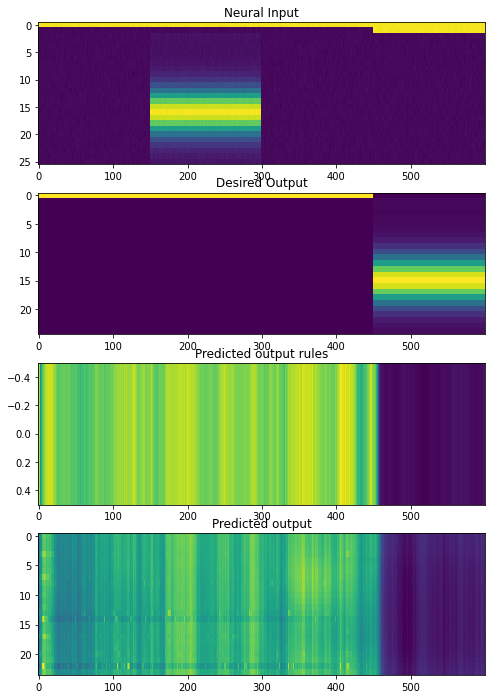

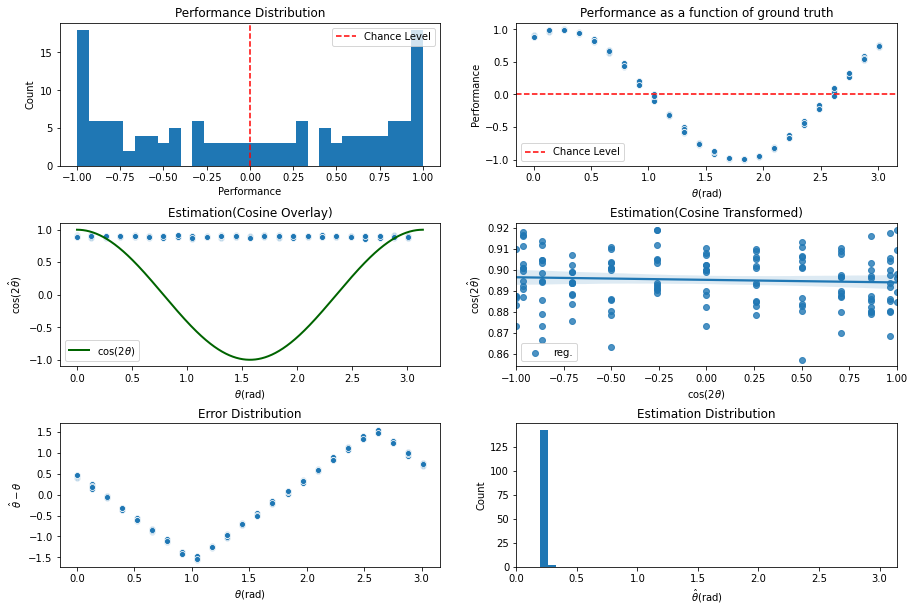

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1600\assets

 Training performance: 
Iter. 1601 | Performance -0.0766 | Loss 0.3210 | Spike loss 2.2214
Testing performance: 
Iter. 1601 | Performance 0.0034 | Loss 0.3199 | Spike loss 2.2197

 Training performance: 
Iter. 1602 | Performance -0.0718 | Loss 0.3204 | Spike loss 2.2215
Testing performance: 
Iter. 1602 | Performance 0.0004 | Loss 0.3204 | Spike loss 2.2035

 Training performance: 
Iter. 1603 | Performance 0.1087 | Loss 0.3192 | Spike loss 2.2124
Testing performance: 
Iter. 1603 | Performance 0.0022 | Loss 0.3201 | Spike loss 2.2156

 Training performance: 
Iter. 1604 | Performance 0.0312 | Loss 0.3202 | Spike loss 2.2142
Testing performance: 
Iter. 1604 | Performance 0.0053 | Loss 0.3198 | Spike loss 2.2174

 Training performance: 
Iter. 1605 | Performance -0.0625 | Loss 0.3200 | Spike loss 2.2145
Testing performance: 
Iter. 1605 | Performance 0.0046 | Loss 0.3200 | Spike loss 2.2102

 Tra


 Training performance: 
Iter. 1647 | Performance -0.0187 | Loss 0.3198 | Spike loss 2.2329
Testing performance: 
Iter. 1647 | Performance 0.0035 | Loss 0.3196 | Spike loss 2.2266

 Training performance: 
Iter. 1648 | Performance -0.0650 | Loss 0.3199 | Spike loss 2.2247
Testing performance: 
Iter. 1648 | Performance -0.0072 | Loss 0.3196 | Spike loss 2.2200

 Training performance: 
Iter. 1649 | Performance -0.0255 | Loss 0.3195 | Spike loss 2.2106
Testing performance: 
Iter. 1649 | Performance -0.0008 | Loss 0.3196 | Spike loss 2.2293

 Training performance: 
Iter. 1650 | Performance 0.0222 | Loss 0.3195 | Spike loss 2.2230
Testing performance: 
Iter. 1650 | Performance 0.0045 | Loss 0.3193 | Spike loss 2.2162

 Training performance: 
Iter. 1651 | Performance -0.1546 | Loss 0.3201 | Spike loss 2.2152
Testing performance: 
Iter. 1651 | Performance 0.0043 | Loss 0.3200 | Spike loss 2.2148

 Training performance: 
Iter. 1652 | Performance 0.0859 | Loss 0.3197 | Spike loss 2.2237
Testing 


 Training performance: 
Iter. 1693 | Performance -0.0497 | Loss 0.3198 | Spike loss 2.1954
Testing performance: 
Iter. 1693 | Performance -0.0553 | Loss 0.3199 | Spike loss 2.1910

 Training performance: 
Iter. 1694 | Performance -0.0827 | Loss 0.3196 | Spike loss 2.1862
Testing performance: 
Iter. 1694 | Performance -0.0144 | Loss 0.3197 | Spike loss 2.1909

 Training performance: 
Iter. 1695 | Performance -0.0365 | Loss 0.3196 | Spike loss 2.1918
Testing performance: 
Iter. 1695 | Performance 0.0135 | Loss 0.3198 | Spike loss 2.1802

 Training performance: 
Iter. 1696 | Performance -0.0845 | Loss 0.3196 | Spike loss 2.1902
Testing performance: 
Iter. 1696 | Performance 0.0032 | Loss 0.3195 | Spike loss 2.1783

 Training performance: 
Iter. 1697 | Performance 0.0645 | Loss 0.3194 | Spike loss 2.1852
Testing performance: 
Iter. 1697 | Performance 0.0113 | Loss 0.3196 | Spike loss 2.1824

 Training performance: 
Iter. 1698 | Performance -0.0817 | Loss 0.3201 | Spike loss 2.1841
Testing

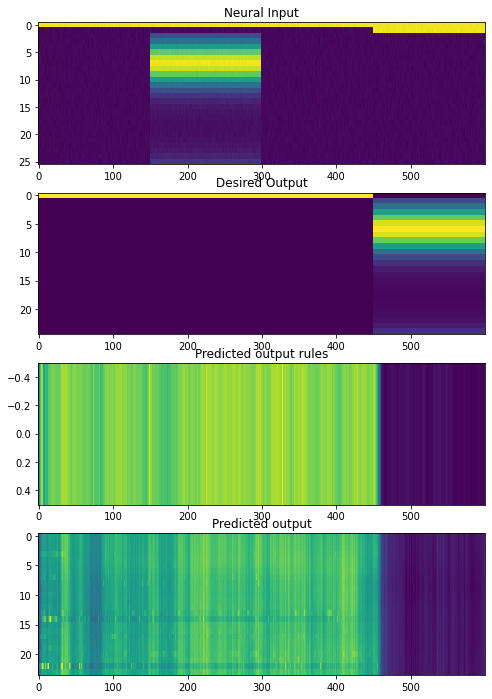

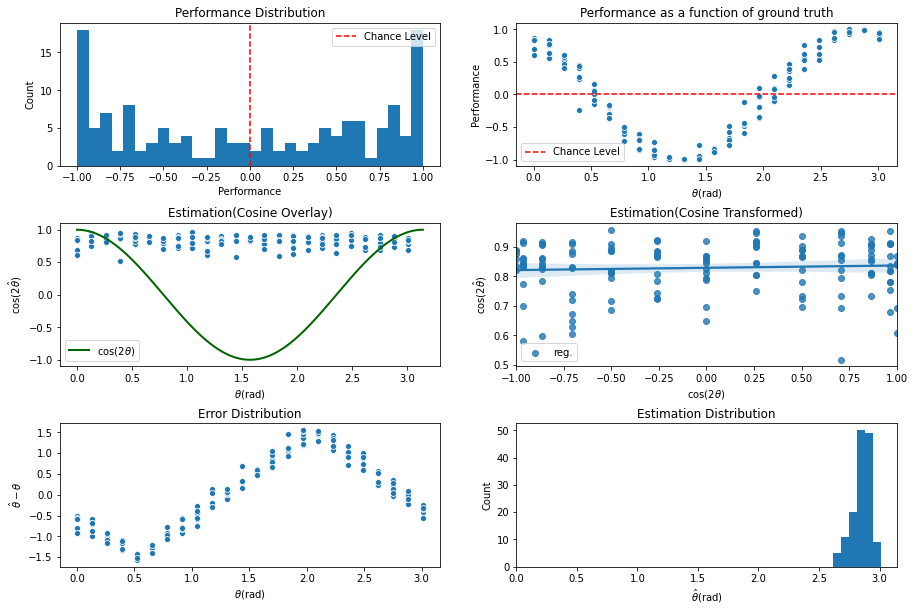

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1700\assets

 Training performance: 
Iter. 1701 | Performance 0.0044 | Loss 0.3193 | Spike loss 2.1919
Testing performance: 
Iter. 1701 | Performance 0.0108 | Loss 0.3196 | Spike loss 2.1856

 Training performance: 
Iter. 1702 | Performance 0.0250 | Loss 0.3197 | Spike loss 2.1804
Testing performance: 
Iter. 1702 | Performance 0.0049 | Loss 0.3195 | Spike loss 2.1828

 Training performance: 
Iter. 1703 | Performance 0.0553 | Loss 0.3193 | Spike loss 2.1915
Testing performance: 
Iter. 1703 | Performance -0.0009 | Loss 0.3197 | Spike loss 2.2010

 Training performance: 
Iter. 1704 | Performance 0.0434 | Loss 0.3196 | Spike loss 2.1838
Testing performance: 
Iter. 1704 | Performance 0.0006 | Loss 0.3194 | Spike loss 2.1841

 Training performance: 
Iter. 1705 | Performance -0.0419 | Loss 0.3197 | Spike loss 2.1770
Testing performance: 
Iter. 1705 | Performance -0.0007 | Loss 0.3195 | Spike loss 2.1896

 Tra


 Training performance: 
Iter. 1747 | Performance 0.0867 | Loss 0.3187 | Spike loss 2.1870
Testing performance: 
Iter. 1747 | Performance -0.0008 | Loss 0.3198 | Spike loss 2.1833

 Training performance: 
Iter. 1748 | Performance -0.0724 | Loss 0.3197 | Spike loss 2.1739
Testing performance: 
Iter. 1748 | Performance 0.0015 | Loss 0.3198 | Spike loss 2.1795

 Training performance: 
Iter. 1749 | Performance -0.1352 | Loss 0.3202 | Spike loss 2.1762
Testing performance: 
Iter. 1749 | Performance 0.0060 | Loss 0.3197 | Spike loss 2.1765

 Training performance: 
Iter. 1750 | Performance -0.0641 | Loss 0.3194 | Spike loss 2.1790
Testing performance: 
Iter. 1750 | Performance -0.0014 | Loss 0.3195 | Spike loss 2.1732

 Training performance: 
Iter. 1751 | Performance -0.0225 | Loss 0.3193 | Spike loss 2.1666
Testing performance: 
Iter. 1751 | Performance 0.0078 | Loss 0.3195 | Spike loss 2.1715

 Training performance: 
Iter. 1752 | Performance 0.0181 | Loss 0.3193 | Spike loss 2.1739
Testing 


 Training performance: 
Iter. 1793 | Performance 0.0042 | Loss 0.3190 | Spike loss 2.1443
Testing performance: 
Iter. 1793 | Performance 0.0106 | Loss 0.3190 | Spike loss 2.1478

 Training performance: 
Iter. 1794 | Performance -0.1023 | Loss 0.3189 | Spike loss 2.1447
Testing performance: 
Iter. 1794 | Performance 0.0196 | Loss 0.3194 | Spike loss 2.1479

 Training performance: 
Iter. 1795 | Performance -0.0502 | Loss 0.3192 | Spike loss 2.1334
Testing performance: 
Iter. 1795 | Performance 0.0132 | Loss 0.3194 | Spike loss 2.1407

 Training performance: 
Iter. 1796 | Performance 0.0620 | Loss 0.3193 | Spike loss 2.1449
Testing performance: 
Iter. 1796 | Performance 0.0117 | Loss 0.3194 | Spike loss 2.1415

 Training performance: 
Iter. 1797 | Performance 0.0100 | Loss 0.3190 | Spike loss 2.1418
Testing performance: 
Iter. 1797 | Performance 0.0036 | Loss 0.3194 | Spike loss 2.1272

 Training performance: 
Iter. 1798 | Performance 0.0057 | Loss 0.3189 | Spike loss 2.1356
Testing perf

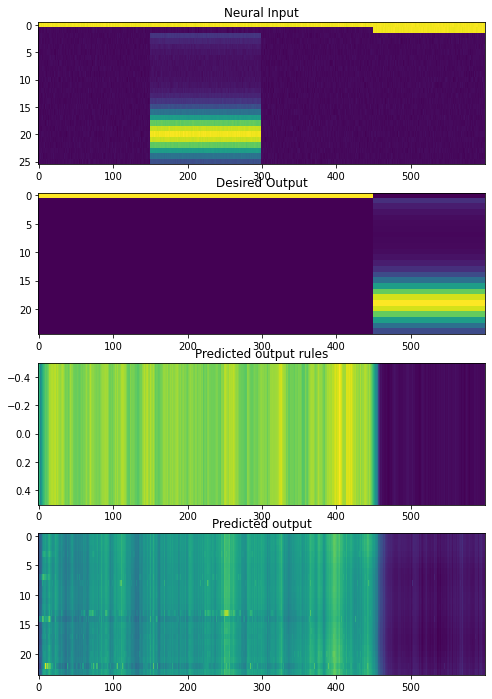

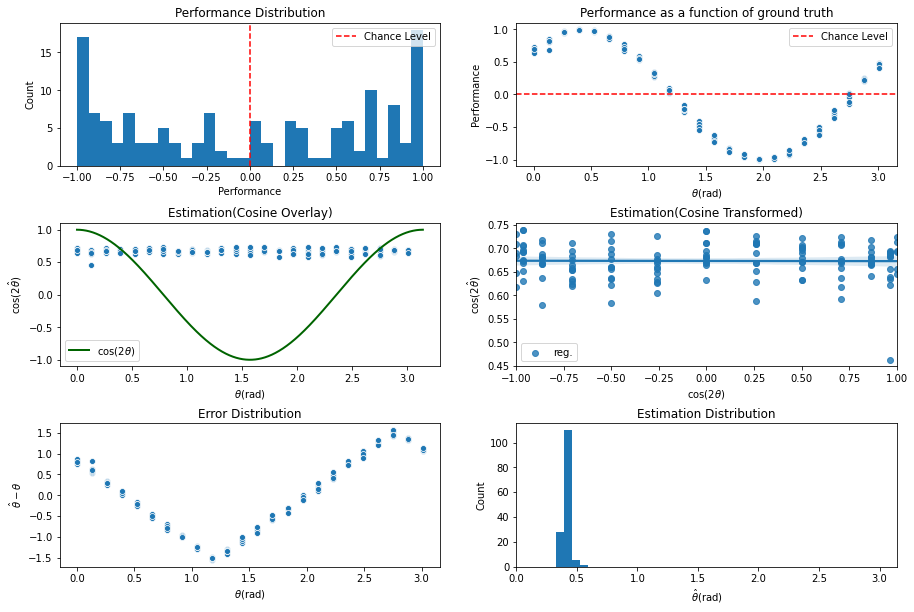

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1800\assets

 Training performance: 
Iter. 1801 | Performance 0.0455 | Loss 0.3192 | Spike loss 2.1320
Testing performance: 
Iter. 1801 | Performance 0.0028 | Loss 0.3196 | Spike loss 2.1345

 Training performance: 
Iter. 1802 | Performance 0.1391 | Loss 0.3187 | Spike loss 2.1362
Testing performance: 
Iter. 1802 | Performance 0.0027 | Loss 0.3196 | Spike loss 2.1369

 Training performance: 
Iter. 1803 | Performance 0.0258 | Loss 0.3193 | Spike loss 2.1229
Testing performance: 
Iter. 1803 | Performance 0.0002 | Loss 0.3199 | Spike loss 2.1323

 Training performance: 
Iter. 1804 | Performance 0.1155 | Loss 0.3184 | Spike loss 2.1296
Testing performance: 
Iter. 1804 | Performance 0.0039 | Loss 0.3195 | Spike loss 2.1227

 Training performance: 
Iter. 1805 | Performance -0.0030 | Loss 0.3197 | Spike loss 2.1328
Testing performance: 
Iter. 1805 | Performance 0.0000 | Loss 0.3199 | Spike loss 2.1162

 Train


 Training performance: 
Iter. 1847 | Performance -0.0659 | Loss 0.3194 | Spike loss 2.1216
Testing performance: 
Iter. 1847 | Performance 0.0005 | Loss 0.3196 | Spike loss 2.1232

 Training performance: 
Iter. 1848 | Performance -0.0115 | Loss 0.3192 | Spike loss 2.1182
Testing performance: 
Iter. 1848 | Performance 0.0013 | Loss 0.3201 | Spike loss 2.1075

 Training performance: 
Iter. 1849 | Performance -0.0213 | Loss 0.3196 | Spike loss 2.1085
Testing performance: 
Iter. 1849 | Performance 0.0009 | Loss 0.3190 | Spike loss 2.1215

 Training performance: 
Iter. 1850 | Performance -0.1019 | Loss 0.3195 | Spike loss 2.1129
Testing performance: 
Iter. 1850 | Performance 0.0024 | Loss 0.3191 | Spike loss 2.1180

 Training performance: 
Iter. 1851 | Performance -0.0339 | Loss 0.3191 | Spike loss 2.1178
Testing performance: 
Iter. 1851 | Performance 0.0044 | Loss 0.3191 | Spike loss 2.1115

 Training performance: 
Iter. 1852 | Performance -0.0047 | Loss 0.3191 | Spike loss 2.1167
Testing 


 Training performance: 
Iter. 1893 | Performance 0.0645 | Loss 0.3187 | Spike loss 2.0828
Testing performance: 
Iter. 1893 | Performance 0.0011 | Loss 0.3196 | Spike loss 2.0861

 Training performance: 
Iter. 1894 | Performance 0.0044 | Loss 0.3197 | Spike loss 2.0784
Testing performance: 
Iter. 1894 | Performance -0.0005 | Loss 0.3195 | Spike loss 2.0809

 Training performance: 
Iter. 1895 | Performance 0.0390 | Loss 0.3193 | Spike loss 2.0843
Testing performance: 
Iter. 1895 | Performance 0.0007 | Loss 0.3195 | Spike loss 2.0816

 Training performance: 
Iter. 1896 | Performance -0.0074 | Loss 0.3196 | Spike loss 2.0893
Testing performance: 
Iter. 1896 | Performance 0.0017 | Loss 0.3194 | Spike loss 2.0755

 Training performance: 
Iter. 1897 | Performance 0.0241 | Loss 0.3188 | Spike loss 2.0837
Testing performance: 
Iter. 1897 | Performance -0.0022 | Loss 0.3194 | Spike loss 2.0851

 Training performance: 
Iter. 1898 | Performance 0.1036 | Loss 0.3185 | Spike loss 2.0884
Testing per

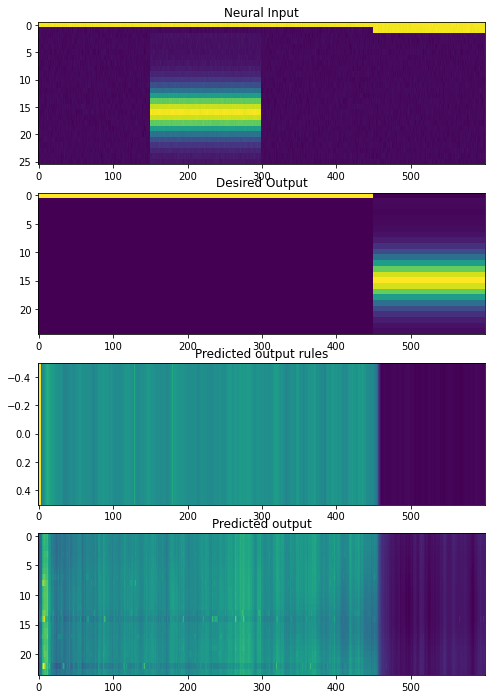

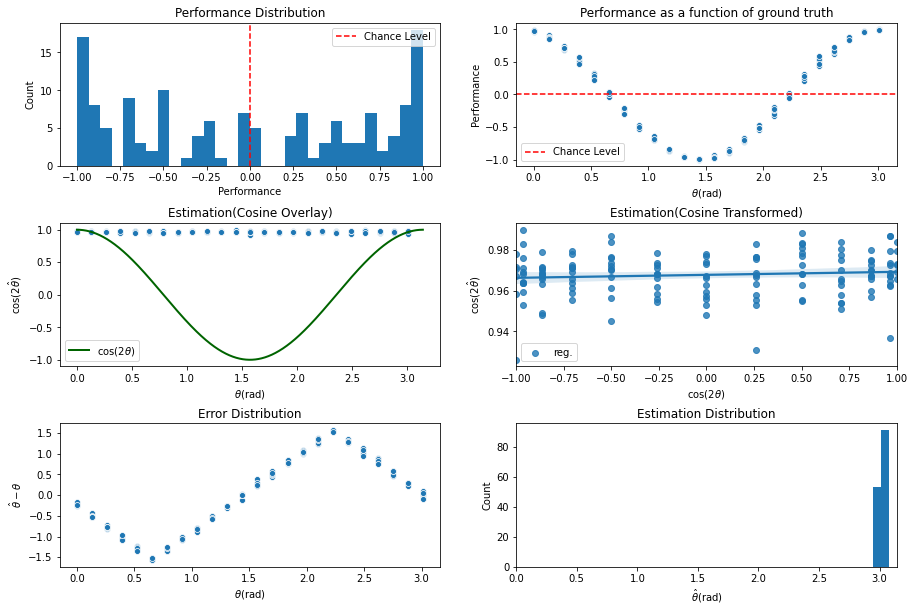

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter1900\assets

 Training performance: 
Iter. 1901 | Performance -0.0530 | Loss 0.3195 | Spike loss 2.0847
Testing performance: 
Iter. 1901 | Performance 0.0027 | Loss 0.3190 | Spike loss 2.0762

 Training performance: 
Iter. 1902 | Performance 0.0828 | Loss 0.3186 | Spike loss 2.0739
Testing performance: 
Iter. 1902 | Performance 0.0006 | Loss 0.3191 | Spike loss 2.0744

 Training performance: 
Iter. 1903 | Performance -0.0192 | Loss 0.3189 | Spike loss 2.0676
Testing performance: 
Iter. 1903 | Performance 0.0149 | Loss 0.3189 | Spike loss 2.0737

 Training performance: 
Iter. 1904 | Performance -0.0256 | Loss 0.3191 | Spike loss 2.0783
Testing performance: 
Iter. 1904 | Performance 0.0205 | Loss 0.3189 | Spike loss 2.0747

 Training performance: 
Iter. 1905 | Performance -0.1039 | Loss 0.3196 | Spike loss 2.0725
Testing performance: 
Iter. 1905 | Performance -0.0089 | Loss 0.3190 | Spike loss 2.0793

 T


 Training performance: 
Iter. 1947 | Performance 0.0088 | Loss 0.3187 | Spike loss 2.0403
Testing performance: 
Iter. 1947 | Performance 0.0094 | Loss 0.3187 | Spike loss 2.0402

 Training performance: 
Iter. 1948 | Performance 0.0131 | Loss 0.3191 | Spike loss 2.0318
Testing performance: 
Iter. 1948 | Performance 0.0505 | Loss 0.3186 | Spike loss 2.0395

 Training performance: 
Iter. 1949 | Performance 0.1002 | Loss 0.3186 | Spike loss 2.0293
Testing performance: 
Iter. 1949 | Performance -0.0018 | Loss 0.3188 | Spike loss 2.0376

 Training performance: 
Iter. 1950 | Performance -0.0907 | Loss 0.3188 | Spike loss 2.0313
Testing performance: 
Iter. 1950 | Performance 0.0187 | Loss 0.3185 | Spike loss 2.0375

 Training performance: 
Iter. 1951 | Performance -0.0510 | Loss 0.3186 | Spike loss 2.0443
Testing performance: 
Iter. 1951 | Performance -0.0103 | Loss 0.3187 | Spike loss 2.0366

 Training performance: 
Iter. 1952 | Performance -0.0242 | Loss 0.3190 | Spike loss 2.0453
Testing p


 Training performance: 
Iter. 1993 | Performance 0.0435 | Loss 0.3184 | Spike loss 2.0276
Testing performance: 
Iter. 1993 | Performance 0.0125 | Loss 0.3188 | Spike loss 2.0299

 Training performance: 
Iter. 1994 | Performance -0.0230 | Loss 0.3185 | Spike loss 2.0236
Testing performance: 
Iter. 1994 | Performance -0.0045 | Loss 0.3187 | Spike loss 2.0229

 Training performance: 
Iter. 1995 | Performance 0.0084 | Loss 0.3185 | Spike loss 2.0186
Testing performance: 
Iter. 1995 | Performance -0.0011 | Loss 0.3186 | Spike loss 2.0320

 Training performance: 
Iter. 1996 | Performance 0.0093 | Loss 0.3188 | Spike loss 2.0210
Testing performance: 
Iter. 1996 | Performance 0.0037 | Loss 0.3186 | Spike loss 2.0324

 Training performance: 
Iter. 1997 | Performance 0.0320 | Loss 0.3185 | Spike loss 2.0325
Testing performance: 
Iter. 1997 | Performance -0.0003 | Loss 0.3187 | Spike loss 2.0218

 Training performance: 
Iter. 1998 | Performance 0.0412 | Loss 0.3184 | Spike loss 2.0300
Testing pe

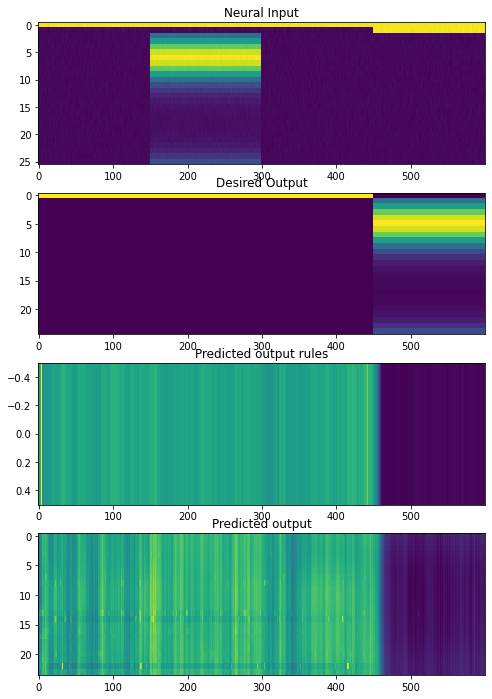

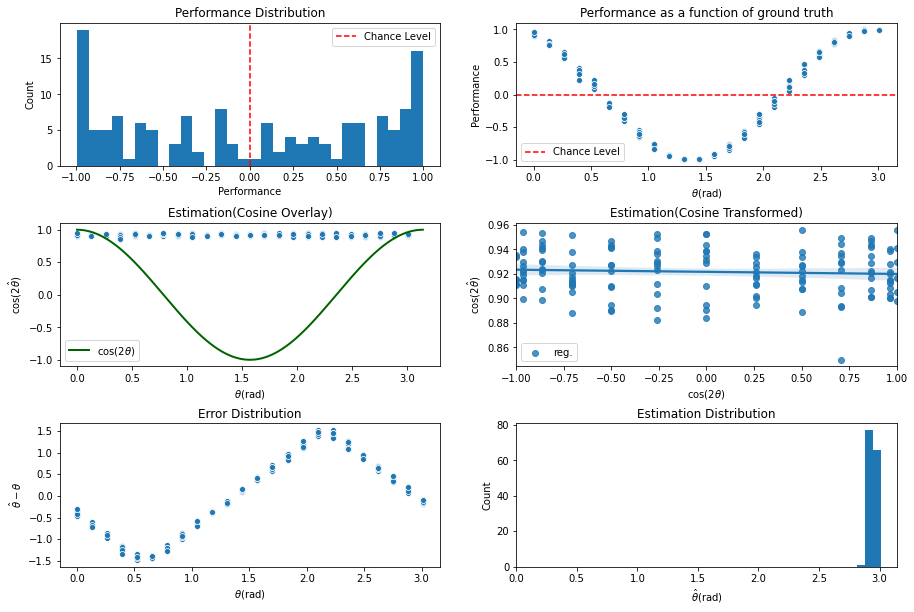

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2000\assets

 Training performance: 
Iter. 2001 | Performance 0.0519 | Loss 0.3186 | Spike loss 2.0236
Testing performance: 
Iter. 2001 | Performance 0.0030 | Loss 0.3190 | Spike loss 2.0239

 Training performance: 
Iter. 2002 | Performance 0.0244 | Loss 0.3185 | Spike loss 2.0212
Testing performance: 
Iter. 2002 | Performance 0.0069 | Loss 0.3190 | Spike loss 2.0209

 Training performance: 
Iter. 2003 | Performance 0.0260 | Loss 0.3186 | Spike loss 2.0220
Testing performance: 
Iter. 2003 | Performance -0.0004 | Loss 0.3192 | Spike loss 2.0271

 Training performance: 
Iter. 2004 | Performance 0.0180 | Loss 0.3191 | Spike loss 2.0181
Testing performance: 
Iter. 2004 | Performance -0.0026 | Loss 0.3189 | Spike loss 2.0267

 Training performance: 
Iter. 2005 | Performance -0.0357 | Loss 0.3190 | Spike loss 2.0198
Testing performance: 
Iter. 2005 | Performance 0.0100 | Loss 0.3187 | Spike loss 2.0335

 Tra


 Training performance: 
Iter. 2047 | Performance 0.0283 | Loss 0.3181 | Spike loss 2.0102
Testing performance: 
Iter. 2047 | Performance 0.0057 | Loss 0.3187 | Spike loss 2.0037

 Training performance: 
Iter. 2048 | Performance -0.0211 | Loss 0.3187 | Spike loss 2.0180
Testing performance: 
Iter. 2048 | Performance 0.0074 | Loss 0.3186 | Spike loss 2.0126

 Training performance: 
Iter. 2049 | Performance 0.0840 | Loss 0.3183 | Spike loss 2.0071
Testing performance: 
Iter. 2049 | Performance 0.0102 | Loss 0.3189 | Spike loss 2.0103

 Training performance: 
Iter. 2050 | Performance -0.0268 | Loss 0.3189 | Spike loss 2.0132
Testing performance: 
Iter. 2050 | Performance 0.0053 | Loss 0.3185 | Spike loss 2.0148

 Training performance: 
Iter. 2051 | Performance 0.0900 | Loss 0.3184 | Spike loss 2.0085
Testing performance: 
Iter. 2051 | Performance 0.0104 | Loss 0.3189 | Spike loss 2.0078

 Training performance: 
Iter. 2052 | Performance 0.0498 | Loss 0.3187 | Spike loss 2.0102
Testing perf


 Training performance: 
Iter. 2093 | Performance 0.1441 | Loss 0.3180 | Spike loss 2.0020
Testing performance: 
Iter. 2093 | Performance 0.0128 | Loss 0.3188 | Spike loss 2.0057

 Training performance: 
Iter. 2094 | Performance -0.0688 | Loss 0.3189 | Spike loss 2.0052
Testing performance: 
Iter. 2094 | Performance 0.0148 | Loss 0.3186 | Spike loss 1.9964

 Training performance: 
Iter. 2095 | Performance 0.1020 | Loss 0.3177 | Spike loss 2.0121
Testing performance: 
Iter. 2095 | Performance 0.0078 | Loss 0.3186 | Spike loss 2.0073

 Training performance: 
Iter. 2096 | Performance -0.0684 | Loss 0.3192 | Spike loss 2.0082
Testing performance: 
Iter. 2096 | Performance 0.0085 | Loss 0.3185 | Spike loss 2.0126

 Training performance: 
Iter. 2097 | Performance 0.0437 | Loss 0.3186 | Spike loss 2.0058
Testing performance: 
Iter. 2097 | Performance 0.0033 | Loss 0.3187 | Spike loss 1.9996

 Training performance: 
Iter. 2098 | Performance -0.0971 | Loss 0.3194 | Spike loss 2.0030
Testing per

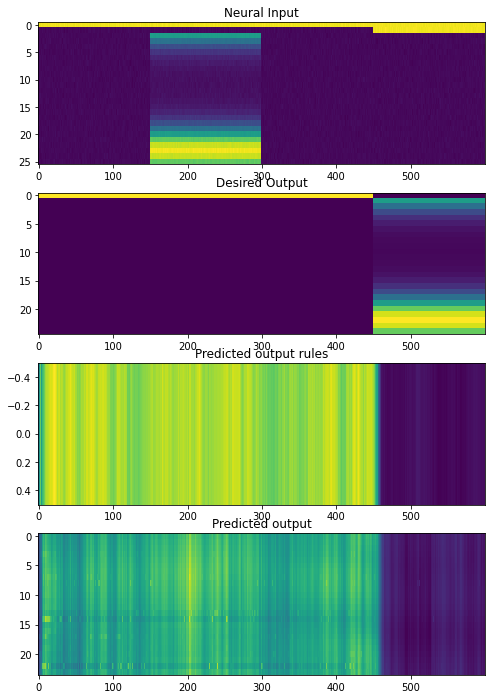

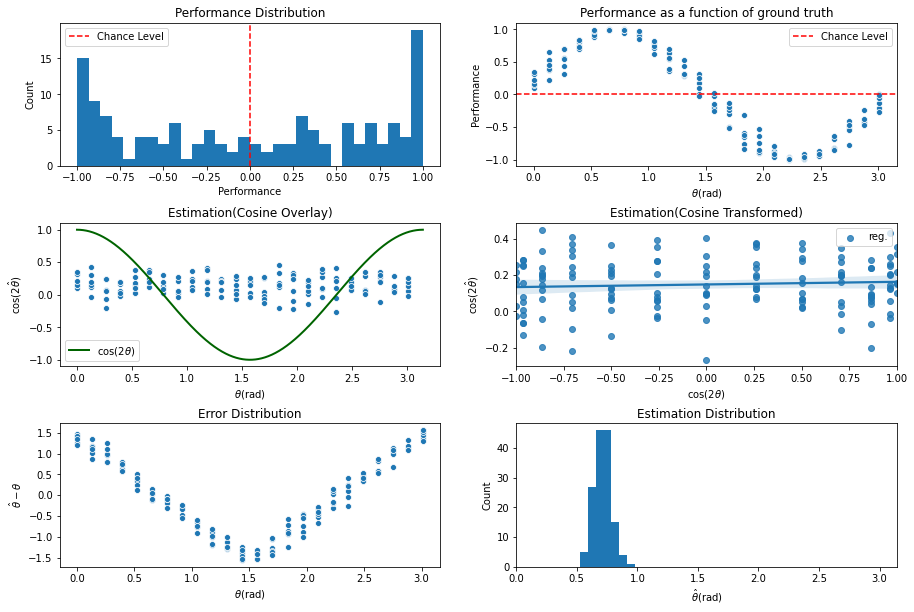

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2100\assets

 Training performance: 
Iter. 2101 | Performance 0.0044 | Loss 0.3185 | Spike loss 2.0041
Testing performance: 
Iter. 2101 | Performance 0.0199 | Loss 0.3184 | Spike loss 2.0016

 Training performance: 
Iter. 2102 | Performance 0.0128 | Loss 0.3182 | Spike loss 2.0062
Testing performance: 
Iter. 2102 | Performance -0.0160 | Loss 0.3184 | Spike loss 2.0002

 Training performance: 
Iter. 2103 | Performance 0.0253 | Loss 0.3181 | Spike loss 2.0034
Testing performance: 
Iter. 2103 | Performance 0.0154 | Loss 0.3186 | Spike loss 2.0001

 Training performance: 
Iter. 2104 | Performance 0.0237 | Loss 0.3187 | Spike loss 2.0053
Testing performance: 
Iter. 2104 | Performance 0.0217 | Loss 0.3186 | Spike loss 2.0029

 Training performance: 
Iter. 2105 | Performance 0.0634 | Loss 0.3184 | Spike loss 1.9941
Testing performance: 
Iter. 2105 | Performance 0.0143 | Loss 0.3182 | Spike loss 2.0051

 Train


 Training performance: 
Iter. 2147 | Performance 0.0357 | Loss 0.3181 | Spike loss 1.9727
Testing performance: 
Iter. 2147 | Performance 0.0027 | Loss 0.3187 | Spike loss 1.9773

 Training performance: 
Iter. 2148 | Performance 0.0025 | Loss 0.3189 | Spike loss 1.9702
Testing performance: 
Iter. 2148 | Performance 0.0035 | Loss 0.3186 | Spike loss 1.9748

 Training performance: 
Iter. 2149 | Performance 0.1563 | Loss 0.3173 | Spike loss 1.9769
Testing performance: 
Iter. 2149 | Performance 0.0073 | Loss 0.3189 | Spike loss 1.9846

 Training performance: 
Iter. 2150 | Performance -0.0290 | Loss 0.3191 | Spike loss 1.9804
Testing performance: 
Iter. 2150 | Performance 0.0026 | Loss 0.3187 | Spike loss 1.9791

 Training performance: 
Iter. 2151 | Performance -0.0467 | Loss 0.3190 | Spike loss 1.9767
Testing performance: 
Iter. 2151 | Performance 0.0043 | Loss 0.3185 | Spike loss 1.9760

 Training performance: 
Iter. 2152 | Performance 0.0848 | Loss 0.3180 | Spike loss 1.9683
Testing perf


 Training performance: 
Iter. 2193 | Performance -0.0030 | Loss 0.3181 | Spike loss 1.9488
Testing performance: 
Iter. 2193 | Performance 0.0419 | Loss 0.3182 | Spike loss 1.9510

 Training performance: 
Iter. 2194 | Performance 0.0182 | Loss 0.3182 | Spike loss 1.9506
Testing performance: 
Iter. 2194 | Performance 0.0077 | Loss 0.3183 | Spike loss 1.9531

 Training performance: 
Iter. 2195 | Performance 0.0675 | Loss 0.3180 | Spike loss 1.9515
Testing performance: 
Iter. 2195 | Performance 0.0057 | Loss 0.3182 | Spike loss 1.9522

 Training performance: 
Iter. 2196 | Performance 0.0600 | Loss 0.3181 | Spike loss 1.9530
Testing performance: 
Iter. 2196 | Performance 0.0099 | Loss 0.3182 | Spike loss 1.9459

 Training performance: 
Iter. 2197 | Performance 0.0465 | Loss 0.3181 | Spike loss 1.9456
Testing performance: 
Iter. 2197 | Performance 0.0032 | Loss 0.3183 | Spike loss 1.9546

 Training performance: 
Iter. 2198 | Performance -0.0220 | Loss 0.3184 | Spike loss 1.9550
Testing perf

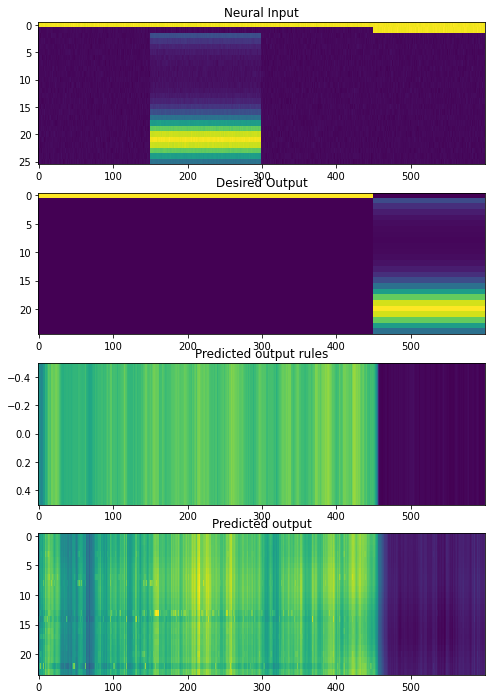

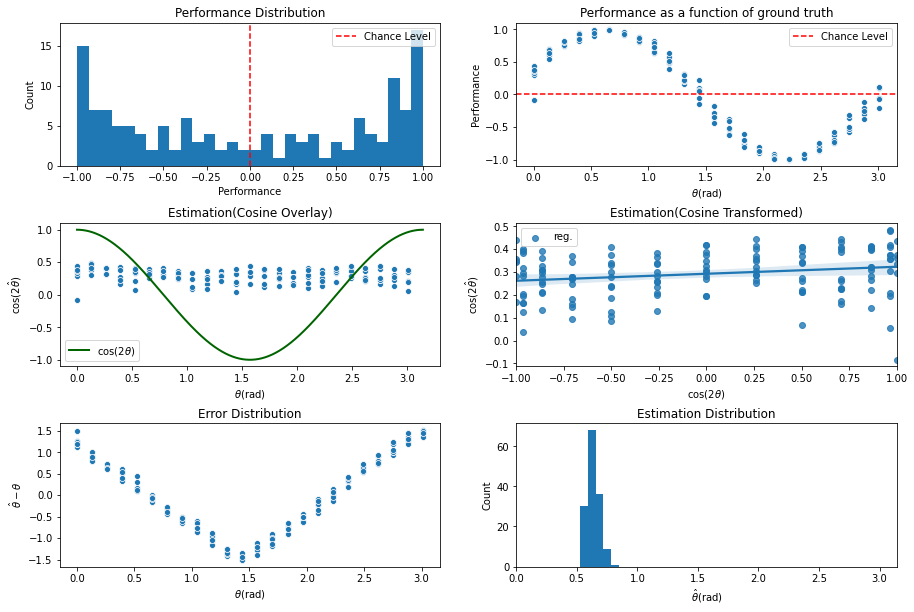

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2200\assets

 Training performance: 
Iter. 2201 | Performance 0.1688 | Loss 0.3171 | Spike loss 1.9368
Testing performance: 
Iter. 2201 | Performance -0.0047 | Loss 0.3187 | Spike loss 1.9496

 Training performance: 
Iter. 2202 | Performance 0.0264 | Loss 0.3183 | Spike loss 1.9446
Testing performance: 
Iter. 2202 | Performance 0.0054 | Loss 0.3185 | Spike loss 1.9412

 Training performance: 
Iter. 2203 | Performance 0.1461 | Loss 0.3174 | Spike loss 1.9471
Testing performance: 
Iter. 2203 | Performance 0.0028 | Loss 0.3185 | Spike loss 1.9453

 Training performance: 
Iter. 2204 | Performance -0.0291 | Loss 0.3184 | Spike loss 1.9362
Testing performance: 
Iter. 2204 | Performance 0.0032 | Loss 0.3184 | Spike loss 1.9402

 Training performance: 
Iter. 2205 | Performance -0.0062 | Loss 0.3187 | Spike loss 1.9424
Testing performance: 
Iter. 2205 | Performance 0.0015 | Loss 0.3185 | Spike loss 1.9380

 Tra


 Training performance: 
Iter. 2247 | Performance -0.0341 | Loss 0.3187 | Spike loss 1.9582
Testing performance: 
Iter. 2247 | Performance 0.0052 | Loss 0.3179 | Spike loss 1.9499

 Training performance: 
Iter. 2248 | Performance 0.1046 | Loss 0.3173 | Spike loss 1.9473
Testing performance: 
Iter. 2248 | Performance 0.0014 | Loss 0.3190 | Spike loss 1.9553

 Training performance: 
Iter. 2249 | Performance 0.0834 | Loss 0.3183 | Spike loss 1.9588
Testing performance: 
Iter. 2249 | Performance 0.0007 | Loss 0.3189 | Spike loss 1.9585

 Training performance: 
Iter. 2250 | Performance 0.0949 | Loss 0.3175 | Spike loss 1.9547
Testing performance: 
Iter. 2250 | Performance 0.0033 | Loss 0.3193 | Spike loss 1.9491

 Training performance: 
Iter. 2251 | Performance -0.0743 | Loss 0.3199 | Spike loss 1.9462
Testing performance: 
Iter. 2251 | Performance 0.0120 | Loss 0.3192 | Spike loss 1.9508

 Training performance: 
Iter. 2252 | Performance -0.0361 | Loss 0.3200 | Spike loss 1.9500
Testing per


 Training performance: 
Iter. 2293 | Performance 0.0784 | Loss 0.3179 | Spike loss 1.9311
Testing performance: 
Iter. 2293 | Performance 0.0122 | Loss 0.3179 | Spike loss 1.9258

 Training performance: 
Iter. 2294 | Performance 0.1054 | Loss 0.3176 | Spike loss 1.9283
Testing performance: 
Iter. 2294 | Performance 0.0357 | Loss 0.3181 | Spike loss 1.9349

 Training performance: 
Iter. 2295 | Performance -0.0157 | Loss 0.3179 | Spike loss 1.9303
Testing performance: 
Iter. 2295 | Performance -0.0006 | Loss 0.3183 | Spike loss 1.9343

 Training performance: 
Iter. 2296 | Performance -0.0090 | Loss 0.3180 | Spike loss 1.9285
Testing performance: 
Iter. 2296 | Performance 0.0170 | Loss 0.3178 | Spike loss 1.9324

 Training performance: 
Iter. 2297 | Performance 0.0337 | Loss 0.3175 | Spike loss 1.9339
Testing performance: 
Iter. 2297 | Performance 0.0240 | Loss 0.3178 | Spike loss 1.9282

 Training performance: 
Iter. 2298 | Performance 0.0053 | Loss 0.3177 | Spike loss 1.9313
Testing per

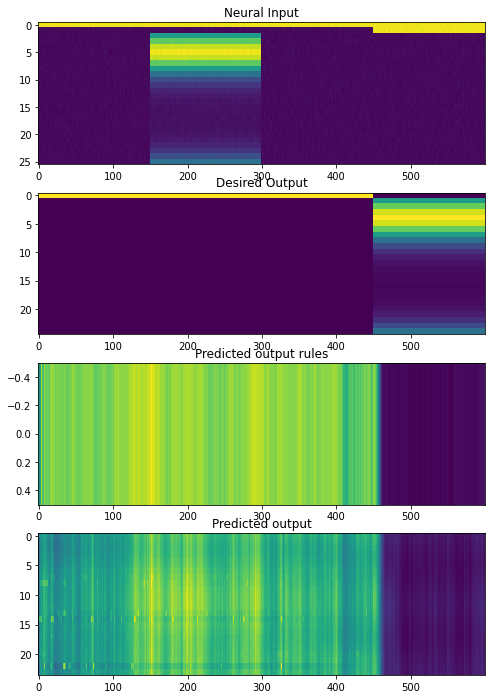

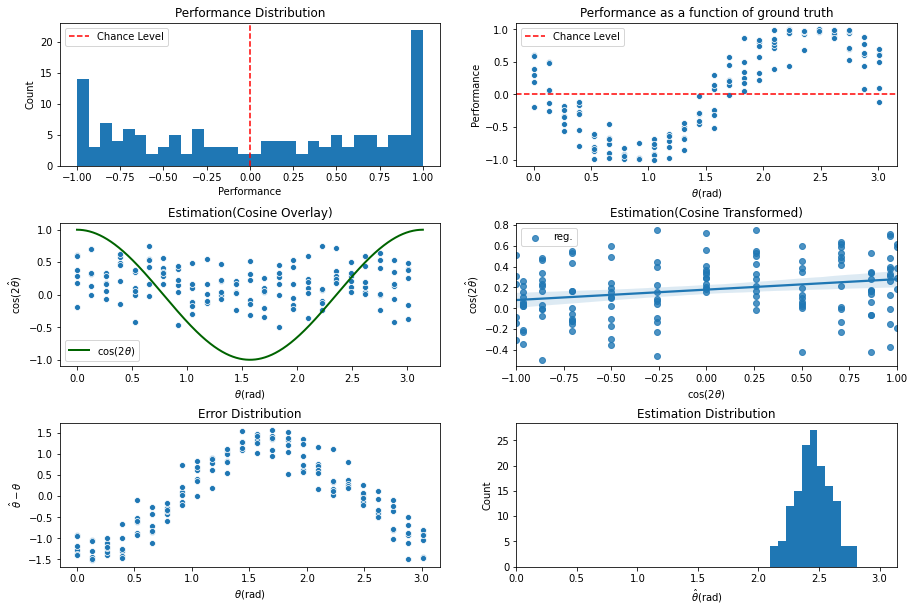

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2300\assets

 Training performance: 
Iter. 2301 | Performance 0.0104 | Loss 0.3181 | Spike loss 1.9308
Testing performance: 
Iter. 2301 | Performance 0.0928 | Loss 0.3180 | Spike loss 1.9383

 Training performance: 
Iter. 2302 | Performance 0.0414 | Loss 0.3180 | Spike loss 1.9385
Testing performance: 
Iter. 2302 | Performance 0.0467 | Loss 0.3179 | Spike loss 1.9252

 Training performance: 
Iter. 2303 | Performance 0.0645 | Loss 0.3177 | Spike loss 1.9297
Testing performance: 
Iter. 2303 | Performance 0.0160 | Loss 0.3179 | Spike loss 1.9327

 Training performance: 
Iter. 2304 | Performance 0.0249 | Loss 0.3177 | Spike loss 1.9334
Testing performance: 
Iter. 2304 | Performance 0.0401 | Loss 0.3178 | Spike loss 1.9335

 Training performance: 
Iter. 2305 | Performance 0.1069 | Loss 0.3176 | Spike loss 1.9218
Testing performance: 
Iter. 2305 | Performance -0.0030 | Loss 0.3180 | Spike loss 1.9236

 Train


 Training performance: 
Iter. 2347 | Performance -0.0489 | Loss 0.3182 | Spike loss 1.9242
Testing performance: 
Iter. 2347 | Performance 0.0120 | Loss 0.3177 | Spike loss 1.9286

 Training performance: 
Iter. 2348 | Performance 0.0434 | Loss 0.3176 | Spike loss 1.9251
Testing performance: 
Iter. 2348 | Performance 0.0182 | Loss 0.3178 | Spike loss 1.9311

 Training performance: 
Iter. 2349 | Performance 0.0697 | Loss 0.3175 | Spike loss 1.9344
Testing performance: 
Iter. 2349 | Performance 0.0281 | Loss 0.3176 | Spike loss 1.9267

 Training performance: 
Iter. 2350 | Performance 0.0429 | Loss 0.3178 | Spike loss 1.9343
Testing performance: 
Iter. 2350 | Performance 0.0400 | Loss 0.3178 | Spike loss 1.9148

 Training performance: 
Iter. 2351 | Performance -0.0189 | Loss 0.3179 | Spike loss 1.9344
Testing performance: 
Iter. 2351 | Performance 0.0591 | Loss 0.3180 | Spike loss 1.9264

 Training performance: 
Iter. 2352 | Performance 0.0582 | Loss 0.3179 | Spike loss 1.9284
Testing perf


 Training performance: 
Iter. 2393 | Performance 0.0477 | Loss 0.3177 | Spike loss 1.9412
Testing performance: 
Iter. 2393 | Performance 0.0134 | Loss 0.3175 | Spike loss 1.9372

 Training performance: 
Iter. 2394 | Performance -0.0185 | Loss 0.3176 | Spike loss 1.9489
Testing performance: 
Iter. 2394 | Performance 0.0201 | Loss 0.3180 | Spike loss 1.9365

 Training performance: 
Iter. 2395 | Performance -0.0428 | Loss 0.3180 | Spike loss 1.9508
Testing performance: 
Iter. 2395 | Performance 0.0020 | Loss 0.3179 | Spike loss 1.9310

 Training performance: 
Iter. 2396 | Performance 0.1373 | Loss 0.3178 | Spike loss 1.9388
Testing performance: 
Iter. 2396 | Performance 0.0214 | Loss 0.3177 | Spike loss 1.9514

 Training performance: 
Iter. 2397 | Performance 0.0382 | Loss 0.3172 | Spike loss 1.9483
Testing performance: 
Iter. 2397 | Performance 0.0480 | Loss 0.3173 | Spike loss 1.9392

 Training performance: 
Iter. 2398 | Performance 0.0897 | Loss 0.3176 | Spike loss 1.9438
Testing perf

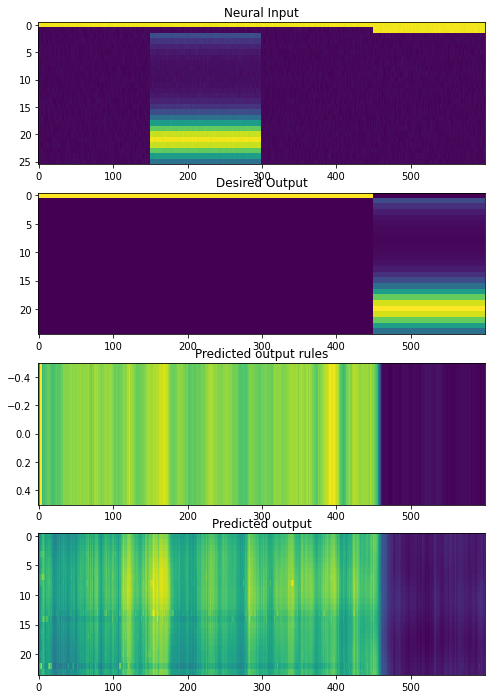

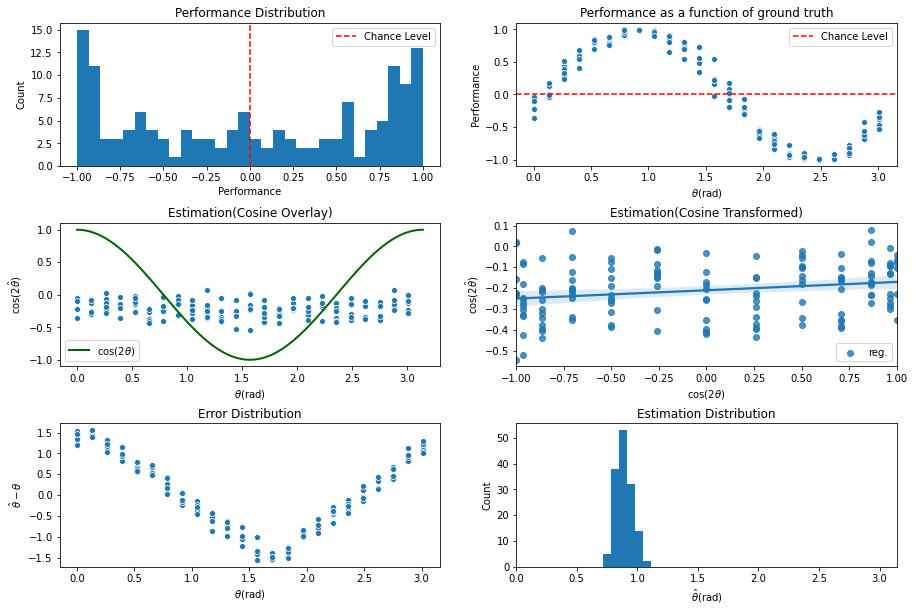

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2400\assets

 Training performance: 
Iter. 2401 | Performance -0.0120 | Loss 0.3181 | Spike loss 1.9528
Testing performance: 
Iter. 2401 | Performance 0.0080 | Loss 0.3179 | Spike loss 1.9543

 Training performance: 
Iter. 2402 | Performance -0.0269 | Loss 0.3182 | Spike loss 1.9461
Testing performance: 
Iter. 2402 | Performance 0.0143 | Loss 0.3181 | Spike loss 1.9519

 Training performance: 
Iter. 2403 | Performance -0.0556 | Loss 0.3184 | Spike loss 1.9492
Testing performance: 
Iter. 2403 | Performance 0.0161 | Loss 0.3179 | Spike loss 1.9574

 Training performance: 
Iter. 2404 | Performance 0.0581 | Loss 0.3176 | Spike loss 1.9567
Testing performance: 
Iter. 2404 | Performance 0.0204 | Loss 0.3181 | Spike loss 1.9559

 Training performance: 
Iter. 2405 | Performance -0.0403 | Loss 0.3183 | Spike loss 1.9603
Testing performance: 
Iter. 2405 | Performance 0.0125 | Loss 0.3179 | Spike loss 1.9536

 Tr


 Training performance: 
Iter. 2447 | Performance 0.1030 | Loss 0.3172 | Spike loss 1.9252
Testing performance: 
Iter. 2447 | Performance 0.0149 | Loss 0.3176 | Spike loss 1.9208

 Training performance: 
Iter. 2448 | Performance 0.0160 | Loss 0.3177 | Spike loss 1.9162
Testing performance: 
Iter. 2448 | Performance 0.0057 | Loss 0.3180 | Spike loss 1.9261

 Training performance: 
Iter. 2449 | Performance -0.0099 | Loss 0.3178 | Spike loss 1.9205
Testing performance: 
Iter. 2449 | Performance 0.0138 | Loss 0.3176 | Spike loss 1.9103

 Training performance: 
Iter. 2450 | Performance 0.0106 | Loss 0.3177 | Spike loss 1.9150
Testing performance: 
Iter. 2450 | Performance 0.0115 | Loss 0.3182 | Spike loss 1.9182

 Training performance: 
Iter. 2451 | Performance 0.0394 | Loss 0.3176 | Spike loss 1.9219
Testing performance: 
Iter. 2451 | Performance 0.0102 | Loss 0.3180 | Spike loss 1.9149

 Training performance: 
Iter. 2452 | Performance 0.1235 | Loss 0.3171 | Spike loss 1.9154
Testing perfo


 Training performance: 
Iter. 2493 | Performance 0.0882 | Loss 0.3178 | Spike loss 1.9068
Testing performance: 
Iter. 2493 | Performance 0.0369 | Loss 0.3178 | Spike loss 1.9048

 Training performance: 
Iter. 2494 | Performance 0.1067 | Loss 0.3176 | Spike loss 1.9124
Testing performance: 
Iter. 2494 | Performance 0.0159 | Loss 0.3173 | Spike loss 1.8915

 Training performance: 
Iter. 2495 | Performance 0.0092 | Loss 0.3174 | Spike loss 1.9035
Testing performance: 
Iter. 2495 | Performance 0.0127 | Loss 0.3178 | Spike loss 1.8946

 Training performance: 
Iter. 2496 | Performance 0.1044 | Loss 0.3173 | Spike loss 1.8985
Testing performance: 
Iter. 2496 | Performance 0.0122 | Loss 0.3176 | Spike loss 1.8951

 Training performance: 
Iter. 2497 | Performance 0.0264 | Loss 0.3175 | Spike loss 1.9079
Testing performance: 
Iter. 2497 | Performance 0.0183 | Loss 0.3181 | Spike loss 1.9001

 Training performance: 
Iter. 2498 | Performance 0.0177 | Loss 0.3181 | Spike loss 1.8918
Testing perfor

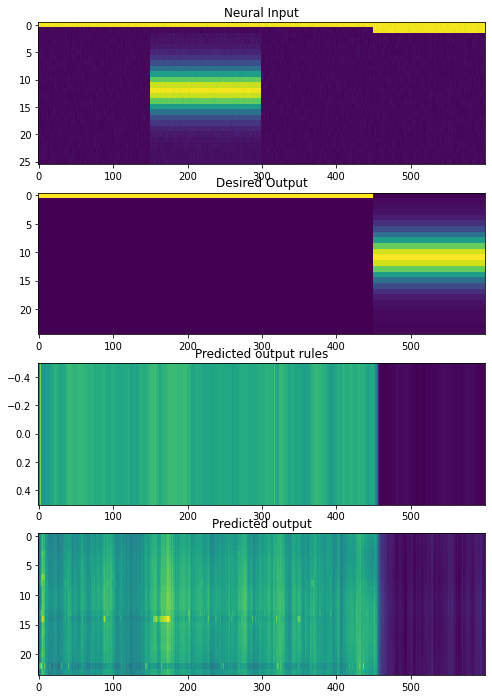

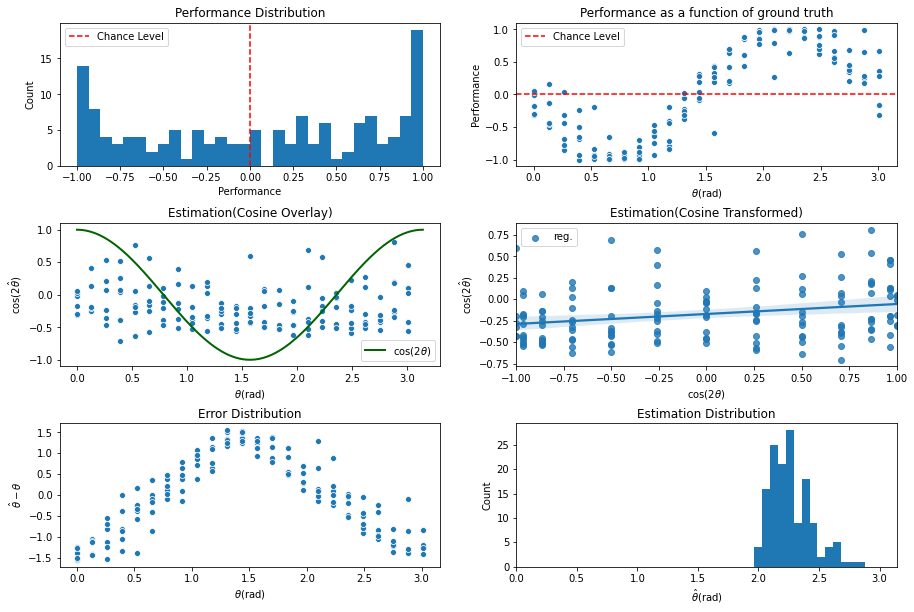

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2500\assets

 Training performance: 
Iter. 2501 | Performance -0.0923 | Loss 0.3179 | Spike loss 1.8870
Testing performance: 
Iter. 2501 | Performance 0.0500 | Loss 0.3181 | Spike loss 1.8852

 Training performance: 
Iter. 2502 | Performance 0.1211 | Loss 0.3175 | Spike loss 1.8735
Testing performance: 
Iter. 2502 | Performance 0.0308 | Loss 0.3174 | Spike loss 1.8772

 Training performance: 
Iter. 2503 | Performance -0.0274 | Loss 0.3180 | Spike loss 1.8867
Testing performance: 
Iter. 2503 | Performance 0.0222 | Loss 0.3179 | Spike loss 1.8797

 Training performance: 
Iter. 2504 | Performance 0.0932 | Loss 0.3174 | Spike loss 1.8796
Testing performance: 
Iter. 2504 | Performance 0.0187 | Loss 0.3182 | Spike loss 1.8704

 Training performance: 
Iter. 2505 | Performance 0.1558 | Loss 0.3168 | Spike loss 1.8759
Testing performance: 
Iter. 2505 | Performance 0.0164 | Loss 0.3175 | Spike loss 1.8733

 Trai


 Training performance: 
Iter. 2547 | Performance 0.1345 | Loss 0.3175 | Spike loss 1.8600
Testing performance: 
Iter. 2547 | Performance 0.0191 | Loss 0.3177 | Spike loss 1.8507

 Training performance: 
Iter. 2548 | Performance -0.1171 | Loss 0.3178 | Spike loss 1.8569
Testing performance: 
Iter. 2548 | Performance 0.0274 | Loss 0.3177 | Spike loss 1.8529

 Training performance: 
Iter. 2549 | Performance 0.1190 | Loss 0.3172 | Spike loss 1.8472
Testing performance: 
Iter. 2549 | Performance 0.0617 | Loss 0.3177 | Spike loss 1.8455

 Training performance: 
Iter. 2550 | Performance 0.0216 | Loss 0.3176 | Spike loss 1.8502
Testing performance: 
Iter. 2550 | Performance 0.0153 | Loss 0.3176 | Spike loss 1.8464

 Training performance: 
Iter. 2551 | Performance 0.0731 | Loss 0.3174 | Spike loss 1.8492
Testing performance: 
Iter. 2551 | Performance 0.0472 | Loss 0.3174 | Spike loss 1.8460

 Training performance: 
Iter. 2552 | Performance 0.0326 | Loss 0.3174 | Spike loss 1.8462
Testing perfo


 Training performance: 
Iter. 2593 | Performance 0.1079 | Loss 0.3174 | Spike loss 1.8149
Testing performance: 
Iter. 2593 | Performance 0.0106 | Loss 0.3173 | Spike loss 1.8138

 Training performance: 
Iter. 2594 | Performance 0.1031 | Loss 0.3170 | Spike loss 1.8073
Testing performance: 
Iter. 2594 | Performance 0.0216 | Loss 0.3184 | Spike loss 1.7988

 Training performance: 
Iter. 2595 | Performance -0.0528 | Loss 0.3186 | Spike loss 1.8071
Testing performance: 
Iter. 2595 | Performance 0.0060 | Loss 0.3193 | Spike loss 1.8087

 Training performance: 
Iter. 2596 | Performance 0.1289 | Loss 0.3186 | Spike loss 1.8091
Testing performance: 
Iter. 2596 | Performance 0.0315 | Loss 0.3181 | Spike loss 1.8120

 Training performance: 
Iter. 2597 | Performance 0.0259 | Loss 0.3184 | Spike loss 1.8135
Testing performance: 
Iter. 2597 | Performance 0.0125 | Loss 0.3178 | Spike loss 1.8042

 Training performance: 
Iter. 2598 | Performance 0.1501 | Loss 0.3166 | Spike loss 1.7996
Testing perfo

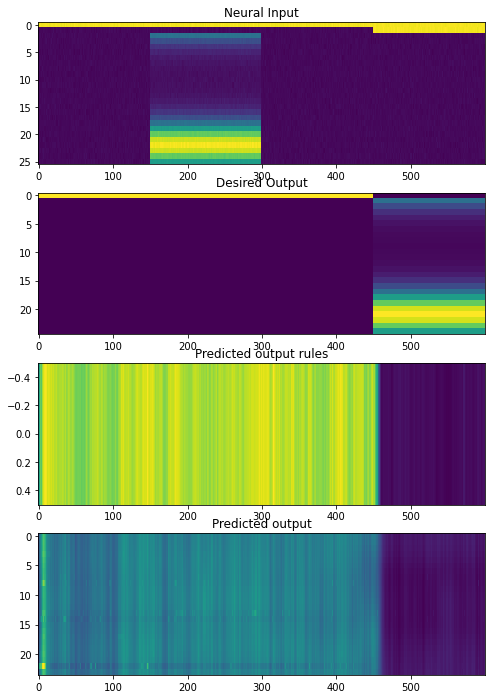

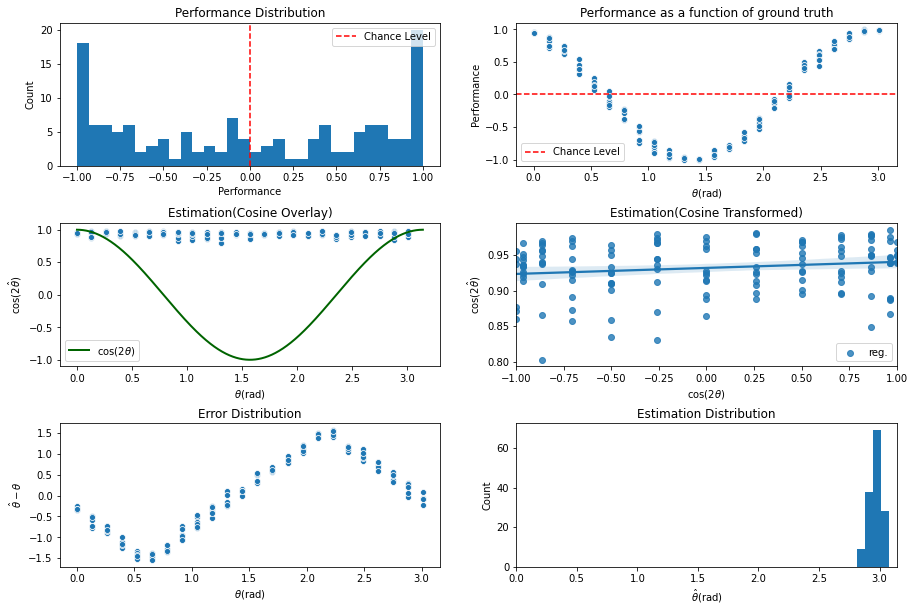

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2600\assets

 Training performance: 
Iter. 2601 | Performance 0.0252 | Loss 0.3180 | Spike loss 1.8014
Testing performance: 
Iter. 2601 | Performance 0.0087 | Loss 0.3179 | Spike loss 1.8007

 Training performance: 
Iter. 2602 | Performance -0.0246 | Loss 0.3180 | Spike loss 1.8006
Testing performance: 
Iter. 2602 | Performance 0.0070 | Loss 0.3181 | Spike loss 1.8036

 Training performance: 
Iter. 2603 | Performance 0.0734 | Loss 0.3173 | Spike loss 1.8040
Testing performance: 
Iter. 2603 | Performance 0.0025 | Loss 0.3174 | Spike loss 1.8028

 Training performance: 
Iter. 2604 | Performance 0.0154 | Loss 0.3171 | Spike loss 1.8063
Testing performance: 
Iter. 2604 | Performance 0.0071 | Loss 0.3173 | Spike loss 1.8014

 Training performance: 
Iter. 2605 | Performance -0.0023 | Loss 0.3177 | Spike loss 1.7947
Testing performance: 
Iter. 2605 | Performance -0.0099 | Loss 0.3175 | Spike loss 1.8026

 Tra


 Training performance: 
Iter. 2647 | Performance -0.0545 | Loss 0.3173 | Spike loss 1.8054
Testing performance: 
Iter. 2647 | Performance 0.1023 | Loss 0.3172 | Spike loss 1.7937

 Training performance: 
Iter. 2648 | Performance 0.1071 | Loss 0.3174 | Spike loss 1.8004
Testing performance: 
Iter. 2648 | Performance 0.0780 | Loss 0.3174 | Spike loss 1.8018

 Training performance: 
Iter. 2649 | Performance 0.1532 | Loss 0.3174 | Spike loss 1.8001
Testing performance: 
Iter. 2649 | Performance 0.1194 | Loss 0.3171 | Spike loss 1.8037

 Training performance: 
Iter. 2650 | Performance 0.2600 | Loss 0.3170 | Spike loss 1.7962
Testing performance: 
Iter. 2650 | Performance 0.0416 | Loss 0.3174 | Spike loss 1.7965

 Training performance: 
Iter. 2651 | Performance 0.0006 | Loss 0.3179 | Spike loss 1.8011
Testing performance: 
Iter. 2651 | Performance 0.0463 | Loss 0.3171 | Spike loss 1.7956

 Training performance: 
Iter. 2652 | Performance 0.0395 | Loss 0.3169 | Spike loss 1.7989
Testing perfo


 Training performance: 
Iter. 2693 | Performance -0.0517 | Loss 0.3181 | Spike loss 1.8049
Testing performance: 
Iter. 2693 | Performance 0.0207 | Loss 0.3172 | Spike loss 1.7998

 Training performance: 
Iter. 2694 | Performance -0.1659 | Loss 0.3184 | Spike loss 1.7942
Testing performance: 
Iter. 2694 | Performance 0.0315 | Loss 0.3174 | Spike loss 1.7994

 Training performance: 
Iter. 2695 | Performance -0.0537 | Loss 0.3177 | Spike loss 1.7986
Testing performance: 
Iter. 2695 | Performance 0.0623 | Loss 0.3176 | Spike loss 1.8033

 Training performance: 
Iter. 2696 | Performance 0.0435 | Loss 0.3177 | Spike loss 1.8024
Testing performance: 
Iter. 2696 | Performance 0.0587 | Loss 0.3171 | Spike loss 1.7987

 Training performance: 
Iter. 2697 | Performance 0.0476 | Loss 0.3171 | Spike loss 1.8006
Testing performance: 
Iter. 2697 | Performance 0.0158 | Loss 0.3176 | Spike loss 1.8029

 Training performance: 
Iter. 2698 | Performance 0.0542 | Loss 0.3172 | Spike loss 1.7965
Testing per

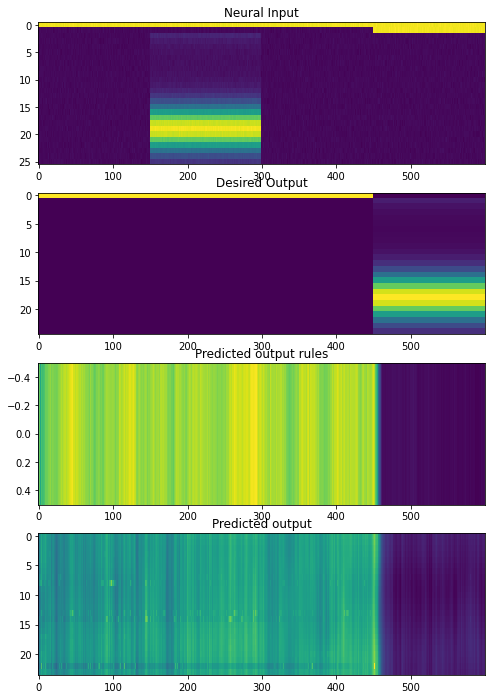

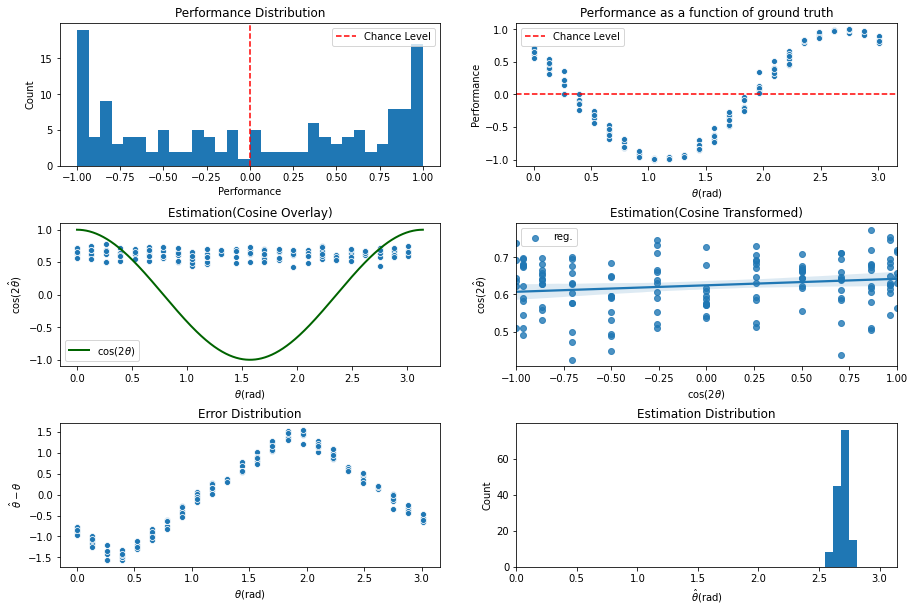

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2700\assets

 Training performance: 
Iter. 2701 | Performance 0.0571 | Loss 0.3173 | Spike loss 1.8030
Testing performance: 
Iter. 2701 | Performance 0.0133 | Loss 0.3183 | Spike loss 1.7959

 Training performance: 
Iter. 2702 | Performance 0.0901 | Loss 0.3170 | Spike loss 1.8011
Testing performance: 
Iter. 2702 | Performance 0.0153 | Loss 0.3176 | Spike loss 1.8088

 Training performance: 
Iter. 2703 | Performance 0.0399 | Loss 0.3172 | Spike loss 1.8017
Testing performance: 
Iter. 2703 | Performance 0.0225 | Loss 0.3178 | Spike loss 1.7979

 Training performance: 
Iter. 2704 | Performance 0.0940 | Loss 0.3171 | Spike loss 1.8005
Testing performance: 
Iter. 2704 | Performance 0.0241 | Loss 0.3183 | Spike loss 1.7971

 Training performance: 
Iter. 2705 | Performance -0.0654 | Loss 0.3193 | Spike loss 1.8056
Testing performance: 
Iter. 2705 | Performance 0.0268 | Loss 0.3175 | Spike loss 1.7920

 Train


 Training performance: 
Iter. 2747 | Performance -0.0163 | Loss 0.3173 | Spike loss 1.7984
Testing performance: 
Iter. 2747 | Performance 0.0011 | Loss 0.3170 | Spike loss 1.7843

 Training performance: 
Iter. 2748 | Performance 0.0153 | Loss 0.3173 | Spike loss 1.7854
Testing performance: 
Iter. 2748 | Performance 0.0224 | Loss 0.3171 | Spike loss 1.7865

 Training performance: 
Iter. 2749 | Performance 0.1470 | Loss 0.3164 | Spike loss 1.7895
Testing performance: 
Iter. 2749 | Performance 0.0353 | Loss 0.3169 | Spike loss 1.7849

 Training performance: 
Iter. 2750 | Performance -0.0733 | Loss 0.3175 | Spike loss 1.7820
Testing performance: 
Iter. 2750 | Performance 0.0287 | Loss 0.3169 | Spike loss 1.7817

 Training performance: 
Iter. 2751 | Performance -0.0590 | Loss 0.3175 | Spike loss 1.7922
Testing performance: 
Iter. 2751 | Performance 0.0394 | Loss 0.3169 | Spike loss 1.7796

 Training performance: 
Iter. 2752 | Performance -0.0218 | Loss 0.3170 | Spike loss 1.7799
Testing pe


 Training performance: 
Iter. 2793 | Performance 0.1054 | Loss 0.3170 | Spike loss 1.7600
Testing performance: 
Iter. 2793 | Performance 0.0247 | Loss 0.3172 | Spike loss 1.7545

 Training performance: 
Iter. 2794 | Performance -0.0801 | Loss 0.3176 | Spike loss 1.7488
Testing performance: 
Iter. 2794 | Performance 0.0262 | Loss 0.3169 | Spike loss 1.7478

 Training performance: 
Iter. 2795 | Performance -0.0207 | Loss 0.3172 | Spike loss 1.7439
Testing performance: 
Iter. 2795 | Performance 0.0331 | Loss 0.3173 | Spike loss 1.7483

 Training performance: 
Iter. 2796 | Performance -0.0346 | Loss 0.3180 | Spike loss 1.7532
Testing performance: 
Iter. 2796 | Performance 0.0608 | Loss 0.3172 | Spike loss 1.7433

 Training performance: 
Iter. 2797 | Performance 0.1128 | Loss 0.3168 | Spike loss 1.7470
Testing performance: 
Iter. 2797 | Performance 0.0452 | Loss 0.3170 | Spike loss 1.7493

 Training performance: 
Iter. 2798 | Performance 0.0788 | Loss 0.3169 | Spike loss 1.7471
Testing per

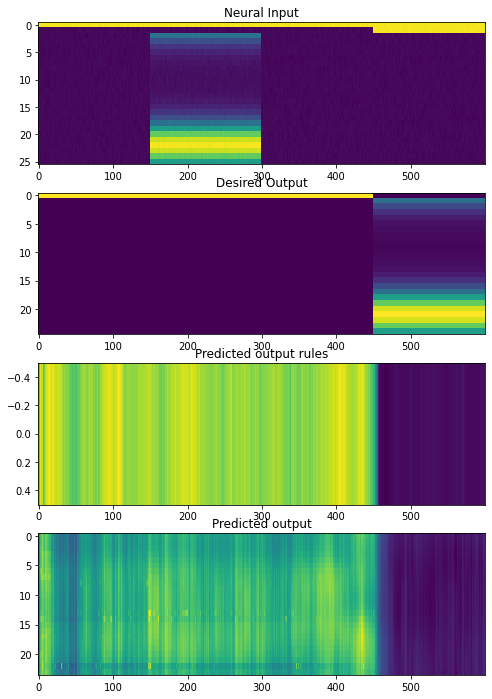

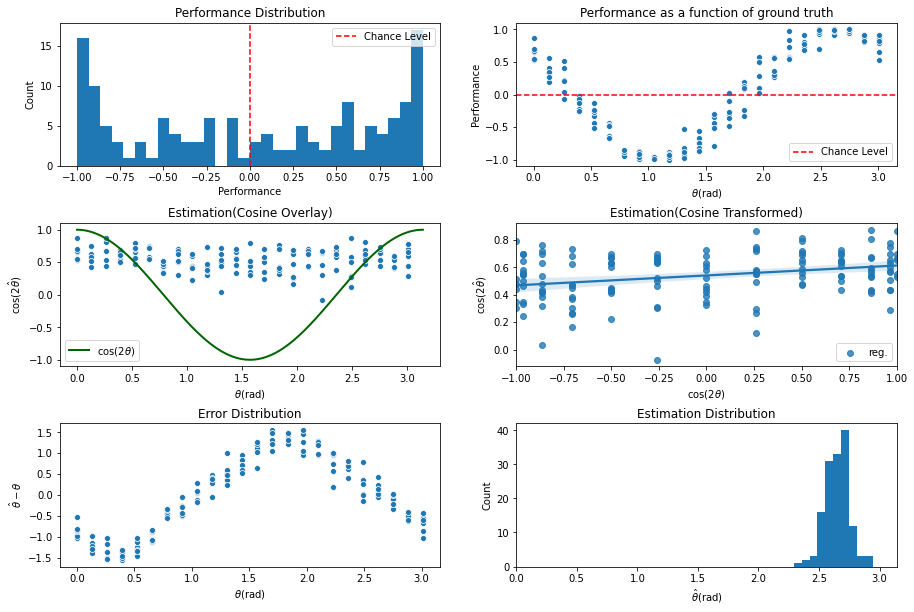

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2800\assets

 Training performance: 
Iter. 2801 | Performance -0.0015 | Loss 0.3172 | Spike loss 1.7370
Testing performance: 
Iter. 2801 | Performance 0.0421 | Loss 0.3171 | Spike loss 1.7450

 Training performance: 
Iter. 2802 | Performance 0.0363 | Loss 0.3173 | Spike loss 1.7518
Testing performance: 
Iter. 2802 | Performance 0.0397 | Loss 0.3168 | Spike loss 1.7454

 Training performance: 
Iter. 2803 | Performance -0.0373 | Loss 0.3173 | Spike loss 1.7405
Testing performance: 
Iter. 2803 | Performance 0.0461 | Loss 0.3172 | Spike loss 1.7427

 Training performance: 
Iter. 2804 | Performance -0.0007 | Loss 0.3175 | Spike loss 1.7513
Testing performance: 
Iter. 2804 | Performance -0.0048 | Loss 0.3171 | Spike loss 1.7413

 Training performance: 
Iter. 2805 | Performance 0.0881 | Loss 0.3171 | Spike loss 1.7436
Testing performance: 
Iter. 2805 | Performance 0.0217 | Loss 0.3167 | Spike loss 1.7378

 Tr


 Training performance: 
Iter. 2847 | Performance 0.0693 | Loss 0.3170 | Spike loss 1.7046
Testing performance: 
Iter. 2847 | Performance 0.0739 | Loss 0.3169 | Spike loss 1.7002

 Training performance: 
Iter. 2848 | Performance 0.1190 | Loss 0.3167 | Spike loss 1.7089
Testing performance: 
Iter. 2848 | Performance 0.0586 | Loss 0.3168 | Spike loss 1.6989

 Training performance: 
Iter. 2849 | Performance 0.0780 | Loss 0.3165 | Spike loss 1.7090
Testing performance: 
Iter. 2849 | Performance 0.0371 | Loss 0.3171 | Spike loss 1.7077

 Training performance: 
Iter. 2850 | Performance 0.0632 | Loss 0.3169 | Spike loss 1.7014
Testing performance: 
Iter. 2850 | Performance 0.0514 | Loss 0.3169 | Spike loss 1.7027

 Training performance: 
Iter. 2851 | Performance 0.0733 | Loss 0.3169 | Spike loss 1.7034
Testing performance: 
Iter. 2851 | Performance 0.0656 | Loss 0.3167 | Spike loss 1.6955

 Training performance: 
Iter. 2852 | Performance 0.0306 | Loss 0.3171 | Spike loss 1.6965
Testing perfor


 Training performance: 
Iter. 2893 | Performance -0.0349 | Loss 0.3170 | Spike loss 1.6901
Testing performance: 
Iter. 2893 | Performance 0.0329 | Loss 0.3169 | Spike loss 1.6876

 Training performance: 
Iter. 2894 | Performance 0.0725 | Loss 0.3166 | Spike loss 1.6969
Testing performance: 
Iter. 2894 | Performance 0.0372 | Loss 0.3166 | Spike loss 1.6928

 Training performance: 
Iter. 2895 | Performance 0.0480 | Loss 0.3167 | Spike loss 1.6946
Testing performance: 
Iter. 2895 | Performance 0.0220 | Loss 0.3172 | Spike loss 1.6921

 Training performance: 
Iter. 2896 | Performance 0.1201 | Loss 0.3163 | Spike loss 1.6924
Testing performance: 
Iter. 2896 | Performance 0.0258 | Loss 0.3172 | Spike loss 1.6938

 Training performance: 
Iter. 2897 | Performance 0.0690 | Loss 0.3165 | Spike loss 1.6813
Testing performance: 
Iter. 2897 | Performance 0.0114 | Loss 0.3170 | Spike loss 1.6857

 Training performance: 
Iter. 2898 | Performance 0.0666 | Loss 0.3165 | Spike loss 1.6802
Testing perfo

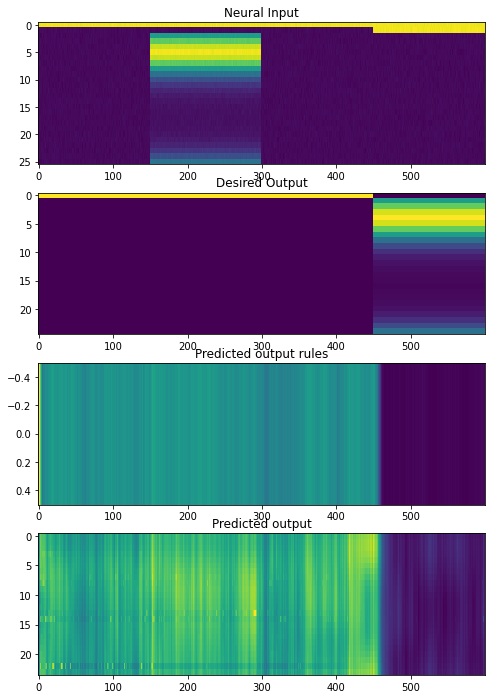

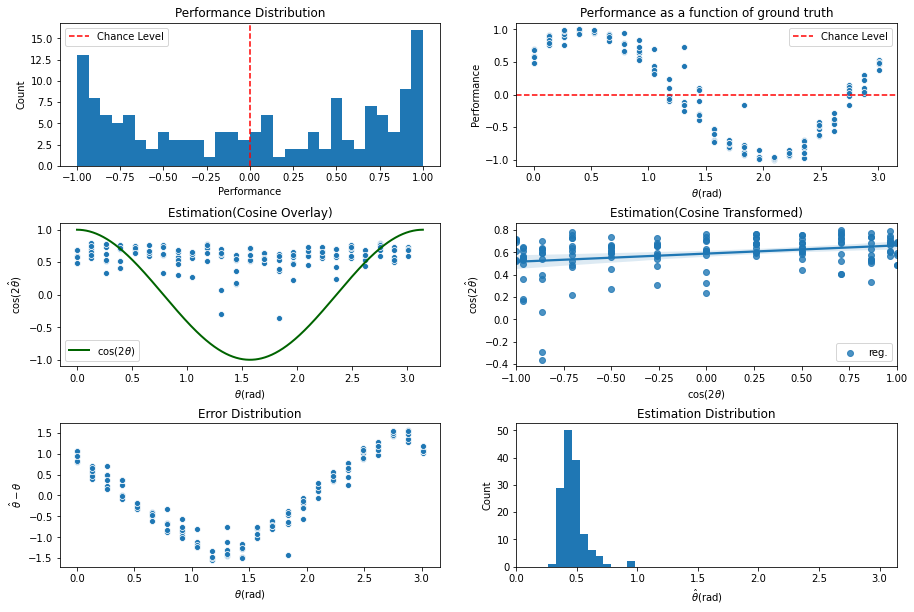

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter2900\assets

 Training performance: 
Iter. 2901 | Performance -0.0311 | Loss 0.3172 | Spike loss 1.6852
Testing performance: 
Iter. 2901 | Performance 0.0041 | Loss 0.3171 | Spike loss 1.6800

 Training performance: 
Iter. 2902 | Performance 0.0481 | Loss 0.3170 | Spike loss 1.6825
Testing performance: 
Iter. 2902 | Performance -0.0051 | Loss 0.3171 | Spike loss 1.6865

 Training performance: 
Iter. 2903 | Performance 0.1442 | Loss 0.3163 | Spike loss 1.6829
Testing performance: 
Iter. 2903 | Performance 0.0346 | Loss 0.3168 | Spike loss 1.6883

 Training performance: 
Iter. 2904 | Performance 0.0489 | Loss 0.3165 | Spike loss 1.6853
Testing performance: 
Iter. 2904 | Performance 0.0699 | Loss 0.3165 | Spike loss 1.6788

 Training performance: 
Iter. 2905 | Performance 0.0441 | Loss 0.3165 | Spike loss 1.6855
Testing performance: 
Iter. 2905 | Performance 0.0310 | Loss 0.3171 | Spike loss 1.6838

 Trai


 Training performance: 
Iter. 2947 | Performance 0.1183 | Loss 0.3163 | Spike loss 1.6894
Testing performance: 
Iter. 2947 | Performance 0.0531 | Loss 0.3170 | Spike loss 1.6964

 Training performance: 
Iter. 2948 | Performance 0.0962 | Loss 0.3167 | Spike loss 1.6888
Testing performance: 
Iter. 2948 | Performance 0.0752 | Loss 0.3166 | Spike loss 1.6878

 Training performance: 
Iter. 2949 | Performance -0.0363 | Loss 0.3172 | Spike loss 1.6916
Testing performance: 
Iter. 2949 | Performance 0.0694 | Loss 0.3172 | Spike loss 1.6878

 Training performance: 
Iter. 2950 | Performance 0.1275 | Loss 0.3169 | Spike loss 1.6943
Testing performance: 
Iter. 2950 | Performance 0.0964 | Loss 0.3169 | Spike loss 1.6880

 Training performance: 
Iter. 2951 | Performance 0.0828 | Loss 0.3167 | Spike loss 1.6970
Testing performance: 
Iter. 2951 | Performance 0.0746 | Loss 0.3168 | Spike loss 1.6882

 Training performance: 
Iter. 2952 | Performance 0.0802 | Loss 0.3164 | Spike loss 1.7048
Testing perfo


 Training performance: 
Iter. 2993 | Performance 0.1168 | Loss 0.3164 | Spike loss 1.6835
Testing performance: 
Iter. 2993 | Performance 0.1191 | Loss 0.3164 | Spike loss 1.6843

 Training performance: 
Iter. 2994 | Performance 0.1047 | Loss 0.3165 | Spike loss 1.6879
Testing performance: 
Iter. 2994 | Performance 0.1153 | Loss 0.3166 | Spike loss 1.6836

 Training performance: 
Iter. 2995 | Performance 0.1430 | Loss 0.3166 | Spike loss 1.6890
Testing performance: 
Iter. 2995 | Performance 0.0612 | Loss 0.3167 | Spike loss 1.6871

 Training performance: 
Iter. 2996 | Performance 0.1026 | Loss 0.3166 | Spike loss 1.6864
Testing performance: 
Iter. 2996 | Performance 0.0939 | Loss 0.3166 | Spike loss 1.6889

 Training performance: 
Iter. 2997 | Performance 0.0098 | Loss 0.3169 | Spike loss 1.6973
Testing performance: 
Iter. 2997 | Performance 0.0720 | Loss 0.3165 | Spike loss 1.6871

 Training performance: 
Iter. 2998 | Performance 0.0891 | Loss 0.3169 | Spike loss 1.6813
Testing perfor

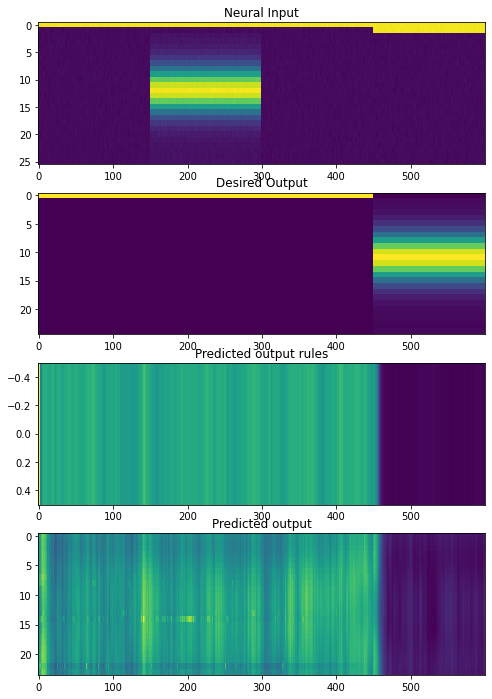

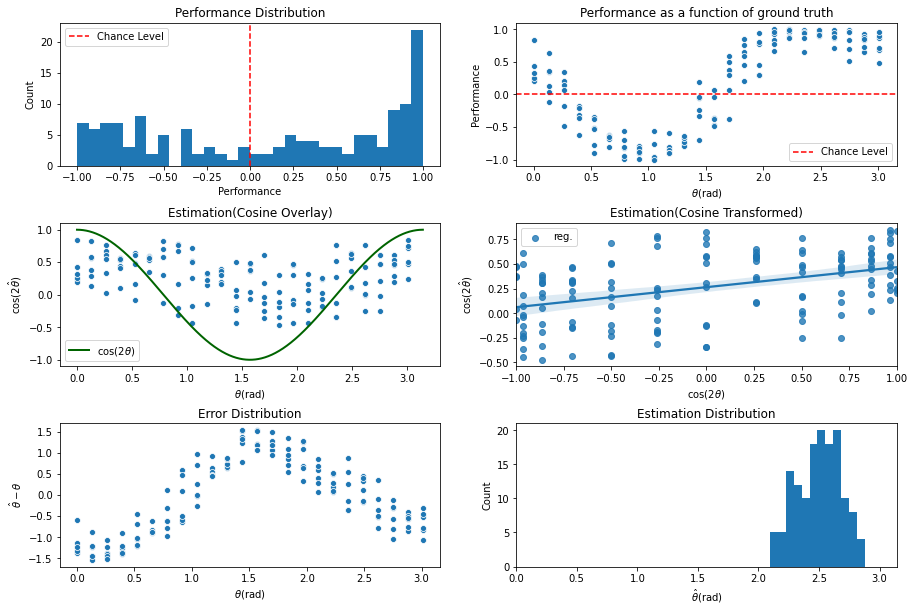

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3000\assets

 Training performance: 
Iter. 3001 | Performance 0.0532 | Loss 0.3168 | Spike loss 1.6870
Testing performance: 
Iter. 3001 | Performance 0.0966 | Loss 0.3167 | Spike loss 1.6850

 Training performance: 
Iter. 3002 | Performance 0.0079 | Loss 0.3165 | Spike loss 1.6840
Testing performance: 
Iter. 3002 | Performance 0.1276 | Loss 0.3167 | Spike loss 1.6843

 Training performance: 
Iter. 3003 | Performance 0.0758 | Loss 0.3165 | Spike loss 1.6900
Testing performance: 
Iter. 3003 | Performance 0.1103 | Loss 0.3170 | Spike loss 1.6838

 Training performance: 
Iter. 3004 | Performance 0.1180 | Loss 0.3165 | Spike loss 1.6839
Testing performance: 
Iter. 3004 | Performance 0.1006 | Loss 0.3165 | Spike loss 1.6863

 Training performance: 
Iter. 3005 | Performance 0.0903 | Loss 0.3164 | Spike loss 1.6783
Testing performance: 
Iter. 3005 | Performance 0.0649 | Loss 0.3168 | Spike loss 1.6778

 Traini


 Training performance: 
Iter. 3047 | Performance 0.0651 | Loss 0.3163 | Spike loss 1.6780
Testing performance: 
Iter. 3047 | Performance 0.0473 | Loss 0.3170 | Spike loss 1.6746

 Training performance: 
Iter. 3048 | Performance 0.0431 | Loss 0.3171 | Spike loss 1.6769
Testing performance: 
Iter. 3048 | Performance 0.1038 | Loss 0.3165 | Spike loss 1.6722

 Training performance: 
Iter. 3049 | Performance 0.0502 | Loss 0.3170 | Spike loss 1.6832
Testing performance: 
Iter. 3049 | Performance 0.1536 | Loss 0.3164 | Spike loss 1.6674

 Training performance: 
Iter. 3050 | Performance 0.1216 | Loss 0.3166 | Spike loss 1.6591
Testing performance: 
Iter. 3050 | Performance 0.1227 | Loss 0.3164 | Spike loss 1.6716

 Training performance: 
Iter. 3051 | Performance 0.0965 | Loss 0.3163 | Spike loss 1.6697
Testing performance: 
Iter. 3051 | Performance 0.1216 | Loss 0.3164 | Spike loss 1.6711

 Training performance: 
Iter. 3052 | Performance 0.1763 | Loss 0.3165 | Spike loss 1.6727
Testing perfor


 Training performance: 
Iter. 3093 | Performance -0.0016 | Loss 0.3167 | Spike loss 1.6852
Testing performance: 
Iter. 3093 | Performance 0.0009 | Loss 0.3169 | Spike loss 1.6767

 Training performance: 
Iter. 3094 | Performance 0.0048 | Loss 0.3163 | Spike loss 1.6742
Testing performance: 
Iter. 3094 | Performance 0.0311 | Loss 0.3168 | Spike loss 1.6796

 Training performance: 
Iter. 3095 | Performance 0.1600 | Loss 0.3149 | Spike loss 1.6833
Testing performance: 
Iter. 3095 | Performance 0.0583 | Loss 0.3167 | Spike loss 1.6860

 Training performance: 
Iter. 3096 | Performance 0.0962 | Loss 0.3159 | Spike loss 1.6864
Testing performance: 
Iter. 3096 | Performance 0.0748 | Loss 0.3164 | Spike loss 1.6778

 Training performance: 
Iter. 3097 | Performance 0.1144 | Loss 0.3159 | Spike loss 1.6821
Testing performance: 
Iter. 3097 | Performance 0.0882 | Loss 0.3166 | Spike loss 1.6790

 Training performance: 
Iter. 3098 | Performance 0.1246 | Loss 0.3160 | Spike loss 1.6781
Testing perfo

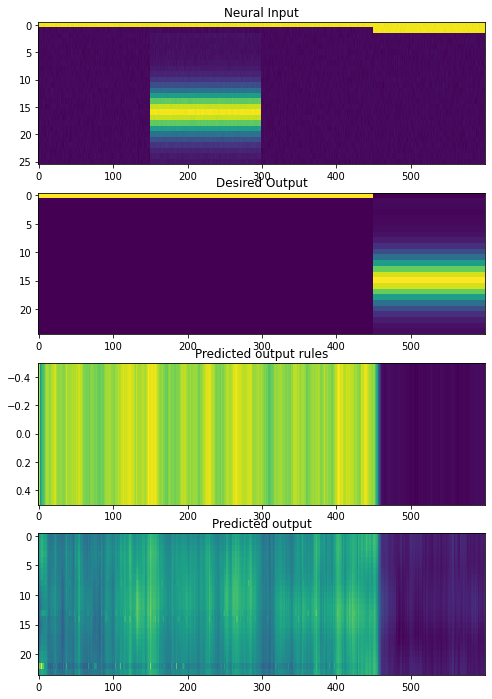

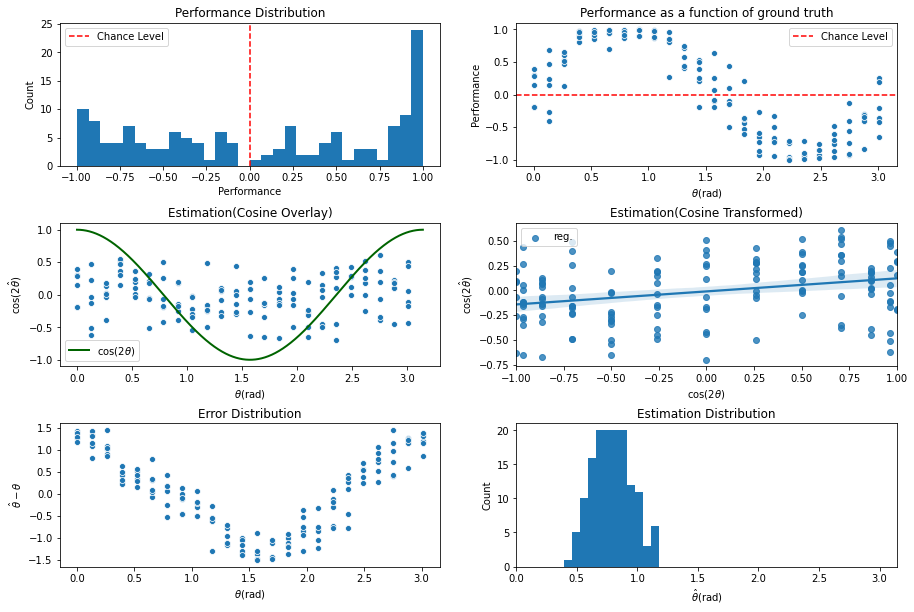

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3100\assets

 Training performance: 
Iter. 3101 | Performance 0.0724 | Loss 0.3163 | Spike loss 1.6787
Testing performance: 
Iter. 3101 | Performance 0.1063 | Loss 0.3163 | Spike loss 1.6782

 Training performance: 
Iter. 3102 | Performance 0.0818 | Loss 0.3164 | Spike loss 1.6878
Testing performance: 
Iter. 3102 | Performance 0.1170 | Loss 0.3164 | Spike loss 1.6764

 Training performance: 
Iter. 3103 | Performance 0.1440 | Loss 0.3159 | Spike loss 1.6801
Testing performance: 
Iter. 3103 | Performance 0.1817 | Loss 0.3163 | Spike loss 1.6798

 Training performance: 
Iter. 3104 | Performance 0.0890 | Loss 0.3166 | Spike loss 1.6791
Testing performance: 
Iter. 3104 | Performance 0.1067 | Loss 0.3165 | Spike loss 1.6795

 Training performance: 
Iter. 3105 | Performance 0.1079 | Loss 0.3164 | Spike loss 1.6831
Testing performance: 
Iter. 3105 | Performance 0.1676 | Loss 0.3164 | Spike loss 1.6736

 Traini


 Training performance: 
Iter. 3147 | Performance 0.0003 | Loss 0.3165 | Spike loss 1.6955
Testing performance: 
Iter. 3147 | Performance 0.0447 | Loss 0.3166 | Spike loss 1.6836

 Training performance: 
Iter. 3148 | Performance 0.0532 | Loss 0.3161 | Spike loss 1.6940
Testing performance: 
Iter. 3148 | Performance 0.0687 | Loss 0.3164 | Spike loss 1.6871

 Training performance: 
Iter. 3149 | Performance 0.0977 | Loss 0.3160 | Spike loss 1.6961
Testing performance: 
Iter. 3149 | Performance 0.0689 | Loss 0.3163 | Spike loss 1.6911

 Training performance: 
Iter. 3150 | Performance 0.1068 | Loss 0.3160 | Spike loss 1.6918
Testing performance: 
Iter. 3150 | Performance 0.0590 | Loss 0.3166 | Spike loss 1.6918

 Training performance: 
Iter. 3151 | Performance 0.0008 | Loss 0.3165 | Spike loss 1.6873
Testing performance: 
Iter. 3151 | Performance 0.0956 | Loss 0.3163 | Spike loss 1.6792

 Training performance: 
Iter. 3152 | Performance 0.1844 | Loss 0.3157 | Spike loss 1.6852
Testing perfor


 Training performance: 
Iter. 3193 | Performance 0.2947 | Loss 0.3159 | Spike loss 1.7154
Testing performance: 
Iter. 3193 | Performance 0.1787 | Loss 0.3160 | Spike loss 1.7081

 Training performance: 
Iter. 3194 | Performance 0.2782 | Loss 0.3154 | Spike loss 1.7083
Testing performance: 
Iter. 3194 | Performance 0.1737 | Loss 0.3160 | Spike loss 1.7010

 Training performance: 
Iter. 3195 | Performance 0.1418 | Loss 0.3160 | Spike loss 1.7069
Testing performance: 
Iter. 3195 | Performance 0.1599 | Loss 0.3161 | Spike loss 1.7037

 Training performance: 
Iter. 3196 | Performance 0.1081 | Loss 0.3163 | Spike loss 1.7054
Testing performance: 
Iter. 3196 | Performance 0.1225 | Loss 0.3164 | Spike loss 1.7112

 Training performance: 
Iter. 3197 | Performance 0.1932 | Loss 0.3157 | Spike loss 1.7016
Testing performance: 
Iter. 3197 | Performance 0.1942 | Loss 0.3160 | Spike loss 1.6961

 Training performance: 
Iter. 3198 | Performance 0.2261 | Loss 0.3152 | Spike loss 1.7065
Testing perfor

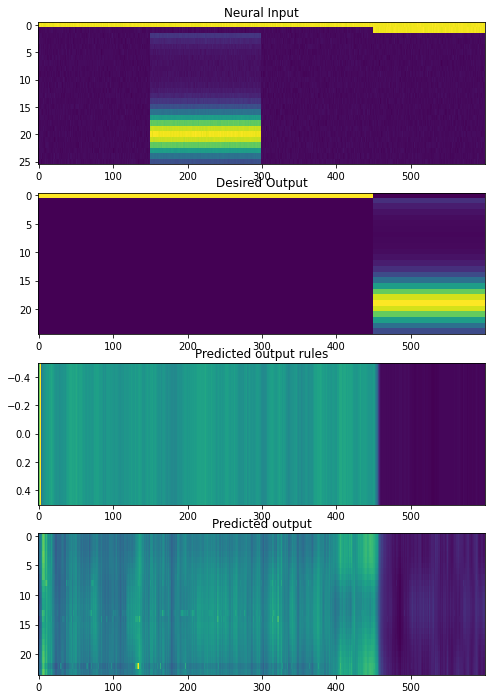

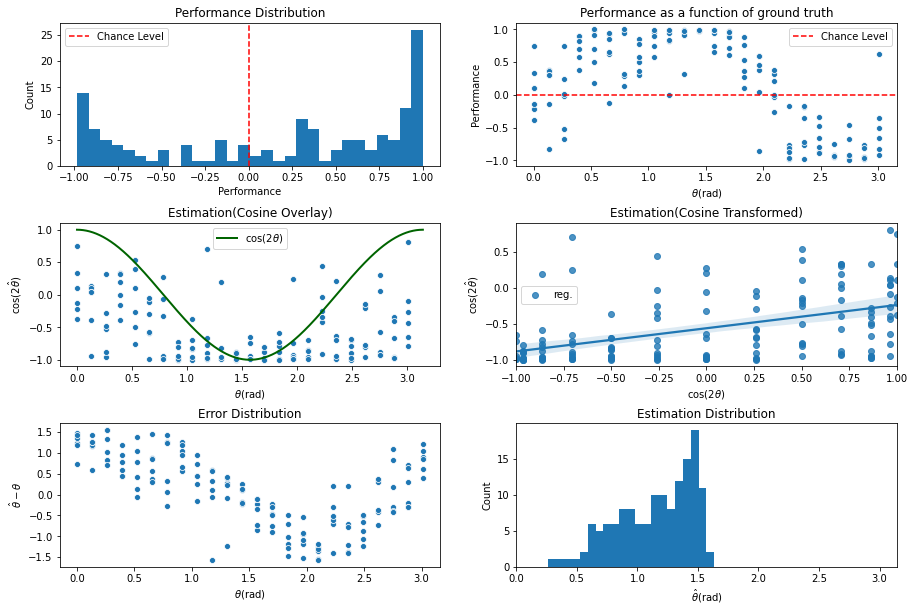

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3200\assets

 Training performance: 
Iter. 3201 | Performance 0.2351 | Loss 0.3158 | Spike loss 1.6990
Testing performance: 
Iter. 3201 | Performance 0.1617 | Loss 0.3160 | Spike loss 1.6909

 Training performance: 
Iter. 3202 | Performance 0.0649 | Loss 0.3165 | Spike loss 1.6939
Testing performance: 
Iter. 3202 | Performance 0.1763 | Loss 0.3157 | Spike loss 1.7022

 Training performance: 
Iter. 3203 | Performance 0.1907 | Loss 0.3160 | Spike loss 1.7037
Testing performance: 
Iter. 3203 | Performance 0.1946 | Loss 0.3158 | Spike loss 1.6917

 Training performance: 
Iter. 3204 | Performance 0.1939 | Loss 0.3152 | Spike loss 1.6914
Testing performance: 
Iter. 3204 | Performance 0.1310 | Loss 0.3159 | Spike loss 1.6975

 Training performance: 
Iter. 3205 | Performance 0.1554 | Loss 0.3158 | Spike loss 1.7001
Testing performance: 
Iter. 3205 | Performance 0.1333 | Loss 0.3162 | Spike loss 1.6877

 Traini


 Training performance: 
Iter. 3247 | Performance 0.3351 | Loss 0.3158 | Spike loss 1.7025
Testing performance: 
Iter. 3247 | Performance 0.2400 | Loss 0.3154 | Spike loss 1.7181

 Training performance: 
Iter. 3248 | Performance 0.2263 | Loss 0.3158 | Spike loss 1.7201
Testing performance: 
Iter. 3248 | Performance 0.1946 | Loss 0.3158 | Spike loss 1.7088

 Training performance: 
Iter. 3249 | Performance 0.1946 | Loss 0.3154 | Spike loss 1.7254
Testing performance: 
Iter. 3249 | Performance 0.2019 | Loss 0.3161 | Spike loss 1.7118

 Training performance: 
Iter. 3250 | Performance 0.1049 | Loss 0.3159 | Spike loss 1.7186
Testing performance: 
Iter. 3250 | Performance 0.1969 | Loss 0.3158 | Spike loss 1.7091

 Training performance: 
Iter. 3251 | Performance 0.1774 | Loss 0.3158 | Spike loss 1.7174
Testing performance: 
Iter. 3251 | Performance 0.1266 | Loss 0.3163 | Spike loss 1.7129

 Training performance: 
Iter. 3252 | Performance 0.1246 | Loss 0.3159 | Spike loss 1.7213
Testing perfor


 Training performance: 
Iter. 3293 | Performance 0.2619 | Loss 0.3150 | Spike loss 1.7247
Testing performance: 
Iter. 3293 | Performance 0.2924 | Loss 0.3157 | Spike loss 1.7190

 Training performance: 
Iter. 3294 | Performance 0.2840 | Loss 0.3161 | Spike loss 1.7287
Testing performance: 
Iter. 3294 | Performance 0.3777 | Loss 0.3155 | Spike loss 1.7234

 Training performance: 
Iter. 3295 | Performance 0.3003 | Loss 0.3152 | Spike loss 1.7253
Testing performance: 
Iter. 3295 | Performance 0.2951 | Loss 0.3152 | Spike loss 1.7202

 Training performance: 
Iter. 3296 | Performance 0.2895 | Loss 0.3158 | Spike loss 1.7251
Testing performance: 
Iter. 3296 | Performance 0.2688 | Loss 0.3155 | Spike loss 1.7170

 Training performance: 
Iter. 3297 | Performance 0.3770 | Loss 0.3145 | Spike loss 1.7313
Testing performance: 
Iter. 3297 | Performance 0.2770 | Loss 0.3149 | Spike loss 1.7251

 Training performance: 
Iter. 3298 | Performance 0.2640 | Loss 0.3150 | Spike loss 1.7329
Testing perfor

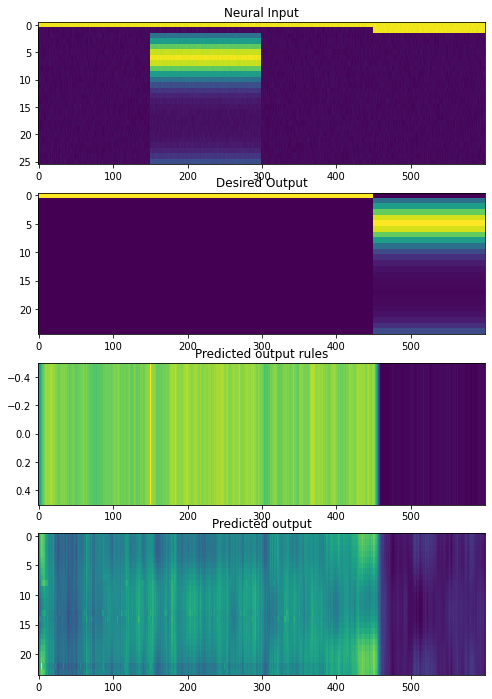

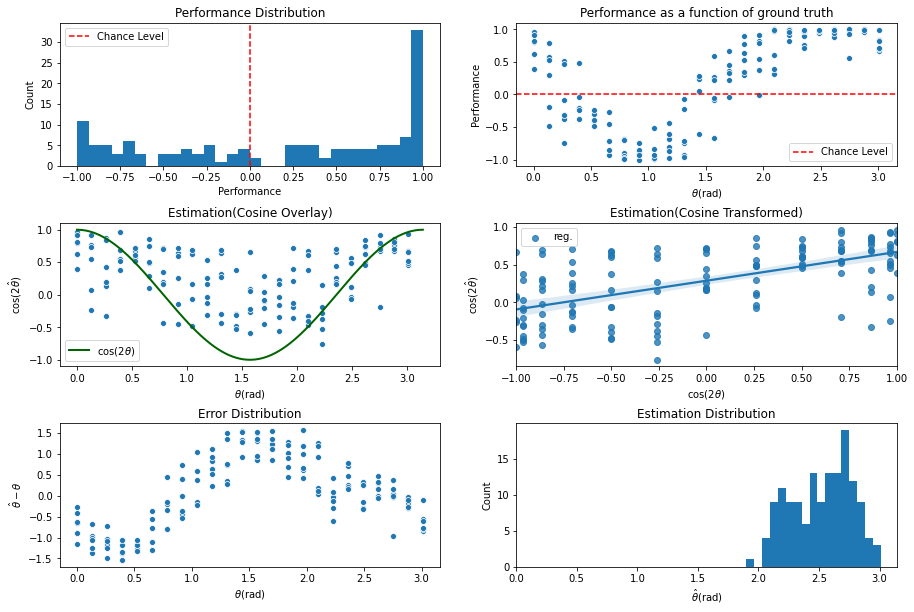

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3300\assets

 Training performance: 
Iter. 3301 | Performance 0.2000 | Loss 0.3153 | Spike loss 1.7342
Testing performance: 
Iter. 3301 | Performance 0.1476 | Loss 0.3162 | Spike loss 1.7243

 Training performance: 
Iter. 3302 | Performance 0.3666 | Loss 0.3140 | Spike loss 1.7309
Testing performance: 
Iter. 3302 | Performance 0.1772 | Loss 0.3156 | Spike loss 1.7251

 Training performance: 
Iter. 3303 | Performance 0.2136 | Loss 0.3152 | Spike loss 1.7310
Testing performance: 
Iter. 3303 | Performance 0.2108 | Loss 0.3148 | Spike loss 1.7278

 Training performance: 
Iter. 3304 | Performance 0.1281 | Loss 0.3155 | Spike loss 1.7327
Testing performance: 
Iter. 3304 | Performance 0.2030 | Loss 0.3151 | Spike loss 1.7290

 Training performance: 
Iter. 3305 | Performance 0.2982 | Loss 0.3140 | Spike loss 1.7378
Testing performance: 
Iter. 3305 | Performance 0.1882 | Loss 0.3154 | Spike loss 1.7284

 Traini


 Training performance: 
Iter. 3347 | Performance 0.1921 | Loss 0.3154 | Spike loss 1.7714
Testing performance: 
Iter. 3347 | Performance 0.3040 | Loss 0.3147 | Spike loss 1.7758

 Training performance: 
Iter. 3348 | Performance 0.2706 | Loss 0.3150 | Spike loss 1.7743
Testing performance: 
Iter. 3348 | Performance 0.3161 | Loss 0.3147 | Spike loss 1.7768

 Training performance: 
Iter. 3349 | Performance 0.3391 | Loss 0.3145 | Spike loss 1.7856
Testing performance: 
Iter. 3349 | Performance 0.3373 | Loss 0.3145 | Spike loss 1.7743

 Training performance: 
Iter. 3350 | Performance 0.3160 | Loss 0.3152 | Spike loss 1.7796
Testing performance: 
Iter. 3350 | Performance 0.3004 | Loss 0.3153 | Spike loss 1.7780

 Training performance: 
Iter. 3351 | Performance 0.3935 | Loss 0.3143 | Spike loss 1.7939
Testing performance: 
Iter. 3351 | Performance 0.3739 | Loss 0.3140 | Spike loss 1.7744

 Training performance: 
Iter. 3352 | Performance 0.4017 | Loss 0.3145 | Spike loss 1.7751
Testing perfor


 Training performance: 
Iter. 3393 | Performance 0.5097 | Loss 0.3132 | Spike loss 1.8570
Testing performance: 
Iter. 3393 | Performance 0.4056 | Loss 0.3132 | Spike loss 1.8382

 Training performance: 
Iter. 3394 | Performance 0.4090 | Loss 0.3131 | Spike loss 1.8415
Testing performance: 
Iter. 3394 | Performance 0.4103 | Loss 0.3130 | Spike loss 1.8367

 Training performance: 
Iter. 3395 | Performance 0.5357 | Loss 0.3128 | Spike loss 1.8609
Testing performance: 
Iter. 3395 | Performance 0.3164 | Loss 0.3148 | Spike loss 1.8469

 Training performance: 
Iter. 3396 | Performance 0.4599 | Loss 0.3126 | Spike loss 1.8444
Testing performance: 
Iter. 3396 | Performance 0.3953 | Loss 0.3134 | Spike loss 1.8436

 Training performance: 
Iter. 3397 | Performance 0.3724 | Loss 0.3137 | Spike loss 1.8533
Testing performance: 
Iter. 3397 | Performance 0.3528 | Loss 0.3131 | Spike loss 1.8440

 Training performance: 
Iter. 3398 | Performance 0.3568 | Loss 0.3136 | Spike loss 1.8461
Testing perfor

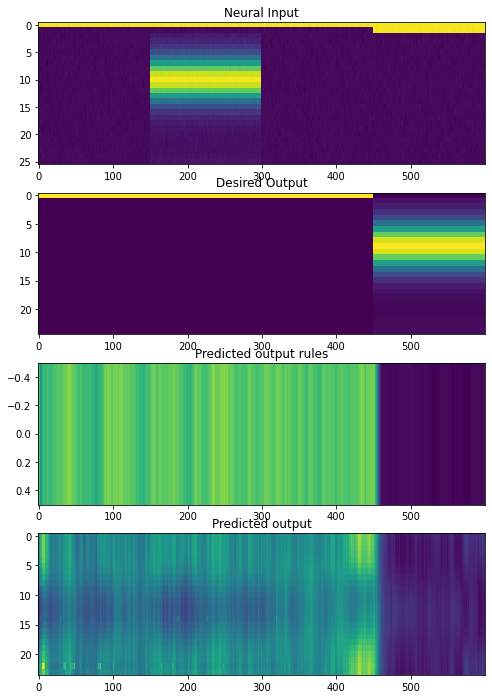

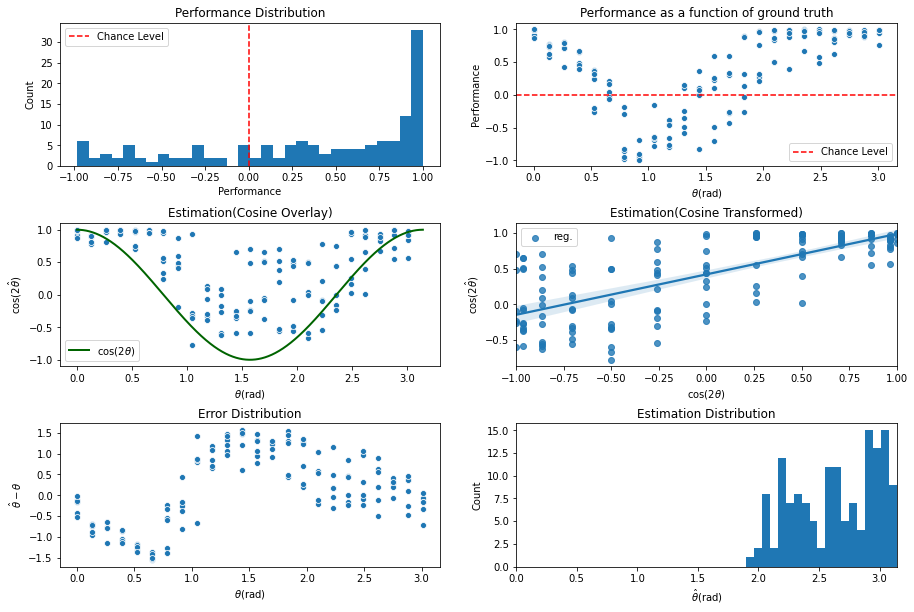

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3400\assets

 Training performance: 
Iter. 3401 | Performance 0.3142 | Loss 0.3130 | Spike loss 1.8513
Testing performance: 
Iter. 3401 | Performance 0.2946 | Loss 0.3142 | Spike loss 1.8507

 Training performance: 
Iter. 3402 | Performance 0.3643 | Loss 0.3128 | Spike loss 1.8583
Testing performance: 
Iter. 3402 | Performance 0.3024 | Loss 0.3136 | Spike loss 1.8584

 Training performance: 
Iter. 3403 | Performance 0.3333 | Loss 0.3136 | Spike loss 1.8413
Testing performance: 
Iter. 3403 | Performance 0.3269 | Loss 0.3134 | Spike loss 1.8476

 Training performance: 
Iter. 3404 | Performance 0.4323 | Loss 0.3126 | Spike loss 1.8804
Testing performance: 
Iter. 3404 | Performance 0.4175 | Loss 0.3125 | Spike loss 1.8502

 Training performance: 
Iter. 3405 | Performance 0.3992 | Loss 0.3130 | Spike loss 1.8649
Testing performance: 
Iter. 3405 | Performance 0.4282 | Loss 0.3130 | Spike loss 1.8693

 Traini


 Training performance: 
Iter. 3447 | Performance 0.5595 | Loss 0.3084 | Spike loss 1.9523
Testing performance: 
Iter. 3447 | Performance 0.5812 | Loss 0.3094 | Spike loss 1.9528

 Training performance: 
Iter. 3448 | Performance 0.6187 | Loss 0.3082 | Spike loss 1.9683
Testing performance: 
Iter. 3448 | Performance 0.5813 | Loss 0.3090 | Spike loss 1.9574

 Training performance: 
Iter. 3449 | Performance 0.6075 | Loss 0.3077 | Spike loss 1.9684
Testing performance: 
Iter. 3449 | Performance 0.5015 | Loss 0.3101 | Spike loss 1.9814

 Training performance: 
Iter. 3450 | Performance 0.5299 | Loss 0.3076 | Spike loss 1.9843
Testing performance: 
Iter. 3450 | Performance 0.5469 | Loss 0.3073 | Spike loss 1.9913

 Training performance: 
Iter. 3451 | Performance 0.5338 | Loss 0.3086 | Spike loss 2.0068
Testing performance: 
Iter. 3451 | Performance 0.5475 | Loss 0.3084 | Spike loss 2.0088

 Training performance: 
Iter. 3452 | Performance 0.5369 | Loss 0.3078 | Spike loss 2.0007
Testing perfor


 Training performance: 
Iter. 3493 | Performance 0.6071 | Loss 0.3010 | Spike loss 2.0146
Testing performance: 
Iter. 3493 | Performance 0.6027 | Loss 0.3027 | Spike loss 2.0319

 Training performance: 
Iter. 3494 | Performance 0.6253 | Loss 0.3004 | Spike loss 2.0536
Testing performance: 
Iter. 3494 | Performance 0.5927 | Loss 0.3012 | Spike loss 2.0375

 Training performance: 
Iter. 3495 | Performance 0.6201 | Loss 0.3000 | Spike loss 2.0526
Testing performance: 
Iter. 3495 | Performance 0.6220 | Loss 0.3015 | Spike loss 2.0448

 Training performance: 
Iter. 3496 | Performance 0.6380 | Loss 0.2998 | Spike loss 2.0905
Testing performance: 
Iter. 3496 | Performance 0.5904 | Loss 0.3019 | Spike loss 2.0868

 Training performance: 
Iter. 3497 | Performance 0.6284 | Loss 0.2994 | Spike loss 2.1105
Testing performance: 
Iter. 3497 | Performance 0.5855 | Loss 0.3015 | Spike loss 2.0656

 Training performance: 
Iter. 3498 | Performance 0.6560 | Loss 0.2993 | Spike loss 2.0967
Testing perfor

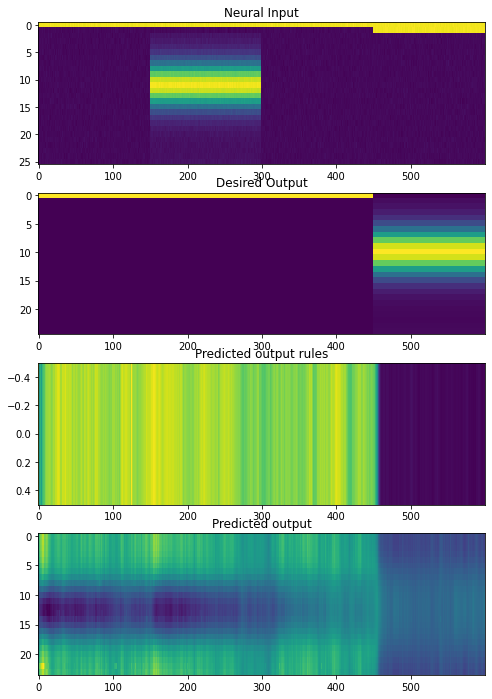

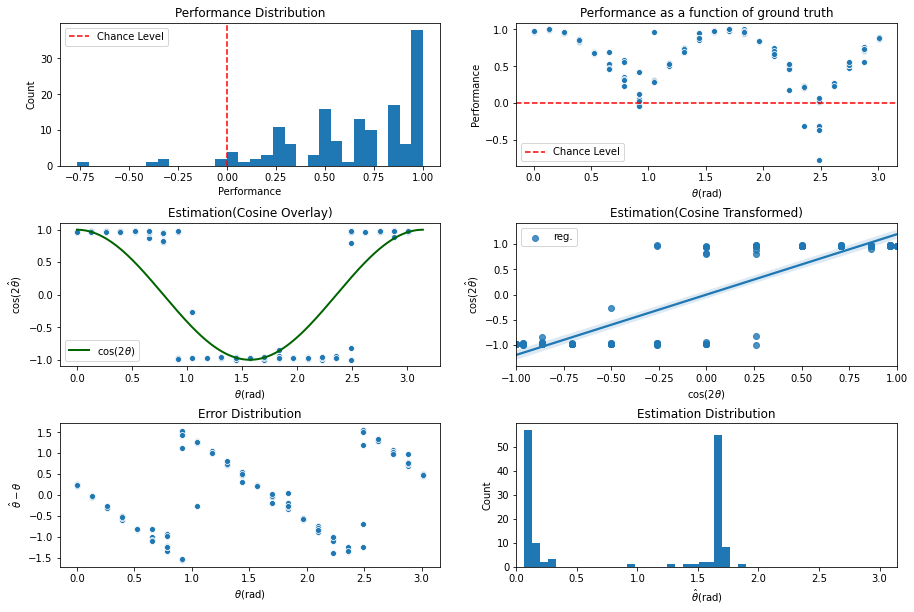

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3500\assets

 Training performance: 
Iter. 3501 | Performance 0.6396 | Loss 0.3035 | Spike loss 1.9901
Testing performance: 
Iter. 3501 | Performance 0.6042 | Loss 0.3014 | Spike loss 1.9999

 Training performance: 
Iter. 3502 | Performance 0.6695 | Loss 0.2987 | Spike loss 2.0147
Testing performance: 
Iter. 3502 | Performance 0.6120 | Loss 0.3010 | Spike loss 2.0143

 Training performance: 
Iter. 3503 | Performance 0.6449 | Loss 0.2995 | Spike loss 2.0230
Testing performance: 
Iter. 3503 | Performance 0.6249 | Loss 0.3023 | Spike loss 2.0176

 Training performance: 
Iter. 3504 | Performance 0.6492 | Loss 0.3016 | Spike loss 2.0129
Testing performance: 
Iter. 3504 | Performance 0.6134 | Loss 0.3006 | Spike loss 2.0229

 Training performance: 
Iter. 3505 | Performance 0.5599 | Loss 0.3017 | Spike loss 2.0506
Testing performance: 
Iter. 3505 | Performance 0.6127 | Loss 0.3033 | Spike loss 2.0471

 Traini


 Training performance: 
Iter. 3547 | Performance 0.6519 | Loss 0.2964 | Spike loss 1.9559
Testing performance: 
Iter. 3547 | Performance 0.6218 | Loss 0.2984 | Spike loss 1.9987

 Training performance: 
Iter. 3548 | Performance 0.6733 | Loss 0.2953 | Spike loss 2.0431
Testing performance: 
Iter. 3548 | Performance 0.6307 | Loss 0.2998 | Spike loss 1.9733

 Training performance: 
Iter. 3549 | Performance 0.5807 | Loss 0.3019 | Spike loss 1.9149
Testing performance: 
Iter. 3549 | Performance 0.6348 | Loss 0.2981 | Spike loss 1.9791

 Training performance: 
Iter. 3550 | Performance 0.6414 | Loss 0.2964 | Spike loss 1.9660
Testing performance: 
Iter. 3550 | Performance 0.6228 | Loss 0.2970 | Spike loss 1.9762

 Training performance: 
Iter. 3551 | Performance 0.6557 | Loss 0.2965 | Spike loss 2.0265
Testing performance: 
Iter. 3551 | Performance 0.6047 | Loss 0.3000 | Spike loss 1.9972

 Training performance: 
Iter. 3552 | Performance 0.6617 | Loss 0.2974 | Spike loss 1.9931
Testing perfor


 Training performance: 
Iter. 3593 | Performance 0.5808 | Loss 0.2991 | Spike loss 1.8634
Testing performance: 
Iter. 3593 | Performance 0.5986 | Loss 0.2994 | Spike loss 1.9590

 Training performance: 
Iter. 3594 | Performance 0.6193 | Loss 0.2982 | Spike loss 1.9542
Testing performance: 
Iter. 3594 | Performance 0.6152 | Loss 0.2967 | Spike loss 1.9692

 Training performance: 
Iter. 3595 | Performance 0.6014 | Loss 0.2987 | Spike loss 1.9347
Testing performance: 
Iter. 3595 | Performance 0.6219 | Loss 0.2975 | Spike loss 1.9589

 Training performance: 
Iter. 3596 | Performance 0.6384 | Loss 0.2954 | Spike loss 1.9586
Testing performance: 
Iter. 3596 | Performance 0.6248 | Loss 0.2989 | Spike loss 1.9636

 Training performance: 
Iter. 3597 | Performance 0.6475 | Loss 0.2964 | Spike loss 2.0100
Testing performance: 
Iter. 3597 | Performance 0.6166 | Loss 0.2973 | Spike loss 1.9729

 Training performance: 
Iter. 3598 | Performance 0.6467 | Loss 0.2953 | Spike loss 1.9442
Testing perfor

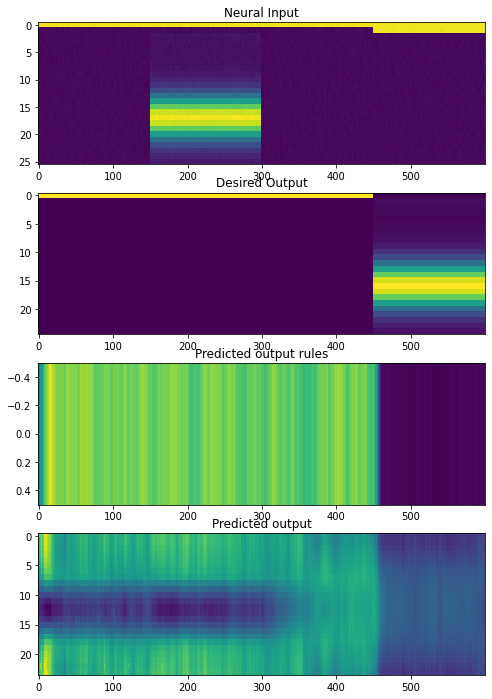

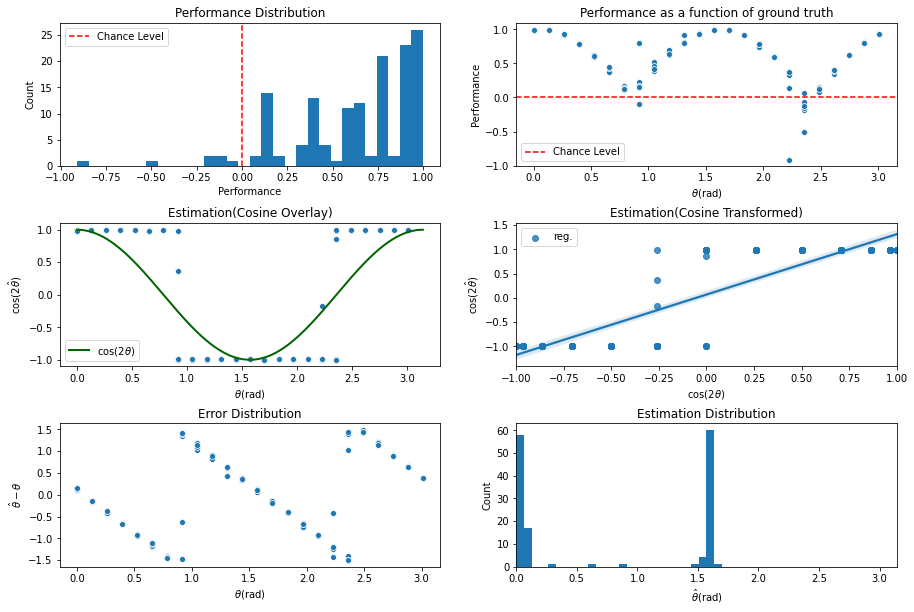

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3600\assets

 Training performance: 
Iter. 3601 | Performance 0.6782 | Loss 0.2930 | Spike loss 1.9452
Testing performance: 
Iter. 3601 | Performance 0.6308 | Loss 0.2977 | Spike loss 1.9811

 Training performance: 
Iter. 3602 | Performance 0.6268 | Loss 0.2975 | Spike loss 1.9873
Testing performance: 
Iter. 3602 | Performance 0.6334 | Loss 0.2985 | Spike loss 1.9935

 Training performance: 
Iter. 3603 | Performance 0.6320 | Loss 0.2974 | Spike loss 1.9728
Testing performance: 
Iter. 3603 | Performance 0.6195 | Loss 0.2969 | Spike loss 1.9868

 Training performance: 
Iter. 3604 | Performance 0.5717 | Loss 0.3003 | Spike loss 1.9646
Testing performance: 
Iter. 3604 | Performance 0.6147 | Loss 0.2980 | Spike loss 1.9972

 Training performance: 
Iter. 3605 | Performance 0.6754 | Loss 0.2940 | Spike loss 1.9991
Testing performance: 
Iter. 3605 | Performance 0.6260 | Loss 0.2973 | Spike loss 1.9916

 Traini


 Training performance: 
Iter. 3647 | Performance 0.6565 | Loss 0.2941 | Spike loss 1.9392
Testing performance: 
Iter. 3647 | Performance 0.6145 | Loss 0.2976 | Spike loss 1.9405

 Training performance: 
Iter. 3648 | Performance 0.6107 | Loss 0.2999 | Spike loss 1.9372
Testing performance: 
Iter. 3648 | Performance 0.6248 | Loss 0.2977 | Spike loss 1.9391

 Training performance: 
Iter. 3649 | Performance 0.6272 | Loss 0.2953 | Spike loss 1.8974
Testing performance: 
Iter. 3649 | Performance 0.6233 | Loss 0.2962 | Spike loss 1.9408

 Training performance: 
Iter. 3650 | Performance 0.6709 | Loss 0.2942 | Spike loss 1.9472
Testing performance: 
Iter. 3650 | Performance 0.6282 | Loss 0.2971 | Spike loss 1.9438

 Training performance: 
Iter. 3651 | Performance 0.6667 | Loss 0.2948 | Spike loss 1.9749
Testing performance: 
Iter. 3651 | Performance 0.6381 | Loss 0.2955 | Spike loss 1.9585

 Training performance: 
Iter. 3652 | Performance 0.6231 | Loss 0.2957 | Spike loss 1.9373
Testing perfor


 Training performance: 
Iter. 3693 | Performance 0.6420 | Loss 0.2960 | Spike loss 1.9567
Testing performance: 
Iter. 3693 | Performance 0.6397 | Loss 0.2946 | Spike loss 1.9611

 Training performance: 
Iter. 3694 | Performance 0.6314 | Loss 0.2955 | Spike loss 1.9614
Testing performance: 
Iter. 3694 | Performance 0.6523 | Loss 0.2960 | Spike loss 1.9644

 Training performance: 
Iter. 3695 | Performance 0.6304 | Loss 0.2956 | Spike loss 1.9386
Testing performance: 
Iter. 3695 | Performance 0.6311 | Loss 0.2957 | Spike loss 1.9583

 Training performance: 
Iter. 3696 | Performance 0.6374 | Loss 0.2956 | Spike loss 1.9567
Testing performance: 
Iter. 3696 | Performance 0.6184 | Loss 0.2951 | Spike loss 1.9516

 Training performance: 
Iter. 3697 | Performance 0.6873 | Loss 0.2920 | Spike loss 1.9611
Testing performance: 
Iter. 3697 | Performance 0.6365 | Loss 0.2956 | Spike loss 1.9504

 Training performance: 
Iter. 3698 | Performance 0.6932 | Loss 0.2934 | Spike loss 1.9599
Testing perfor

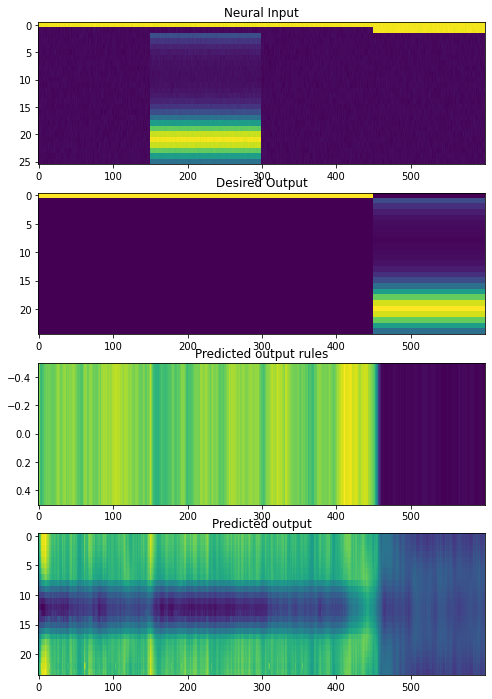

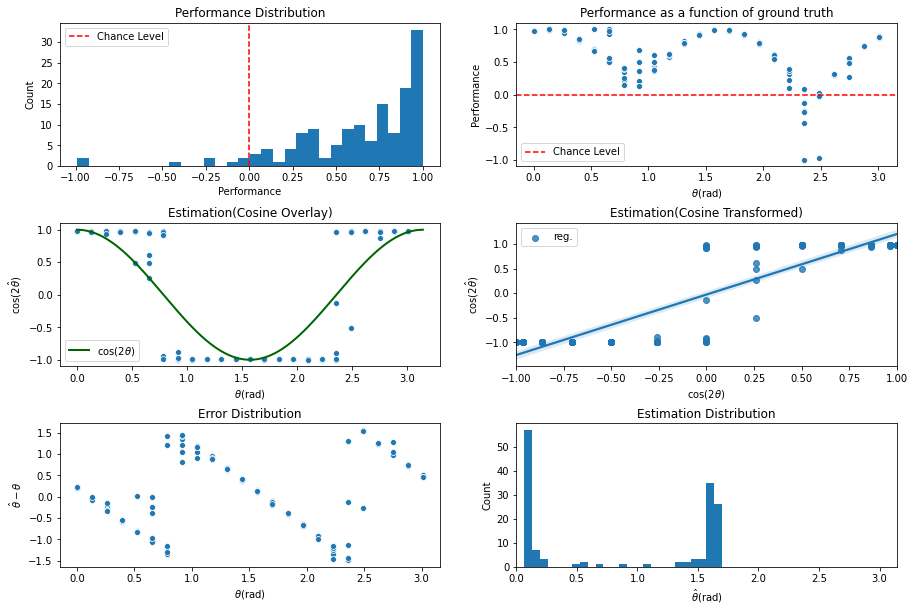

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3700\assets

 Training performance: 
Iter. 3701 | Performance 0.6163 | Loss 0.2952 | Spike loss 1.9508
Testing performance: 
Iter. 3701 | Performance 0.6243 | Loss 0.2967 | Spike loss 1.9672

 Training performance: 
Iter. 3702 | Performance 0.7061 | Loss 0.2932 | Spike loss 1.9992
Testing performance: 
Iter. 3702 | Performance 0.6286 | Loss 0.2952 | Spike loss 1.9693

 Training performance: 
Iter. 3703 | Performance 0.7103 | Loss 0.2909 | Spike loss 2.0151
Testing performance: 
Iter. 3703 | Performance 0.6354 | Loss 0.2957 | Spike loss 1.9526

 Training performance: 
Iter. 3704 | Performance 0.6793 | Loss 0.2929 | Spike loss 2.0080
Testing performance: 
Iter. 3704 | Performance 0.6188 | Loss 0.2970 | Spike loss 1.9477

 Training performance: 
Iter. 3705 | Performance 0.6677 | Loss 0.2953 | Spike loss 1.9660
Testing performance: 
Iter. 3705 | Performance 0.6135 | Loss 0.2952 | Spike loss 1.9479

 Traini


 Training performance: 
Iter. 3747 | Performance 0.6420 | Loss 0.2956 | Spike loss 1.9983
Testing performance: 
Iter. 3747 | Performance 0.6491 | Loss 0.2944 | Spike loss 1.9695

 Training performance: 
Iter. 3748 | Performance 0.6353 | Loss 0.2943 | Spike loss 1.9616
Testing performance: 
Iter. 3748 | Performance 0.6576 | Loss 0.2948 | Spike loss 1.9845

 Training performance: 
Iter. 3749 | Performance 0.6736 | Loss 0.2942 | Spike loss 2.0346
Testing performance: 
Iter. 3749 | Performance 0.6500 | Loss 0.2964 | Spike loss 1.9897

 Training performance: 
Iter. 3750 | Performance 0.6736 | Loss 0.2939 | Spike loss 1.9995
Testing performance: 
Iter. 3750 | Performance 0.6381 | Loss 0.2946 | Spike loss 1.9777

 Training performance: 
Iter. 3751 | Performance 0.6500 | Loss 0.2938 | Spike loss 1.9728
Testing performance: 
Iter. 3751 | Performance 0.6427 | Loss 0.2951 | Spike loss 1.9704

 Training performance: 
Iter. 3752 | Performance 0.6805 | Loss 0.2926 | Spike loss 1.9956
Testing perfor


 Training performance: 
Iter. 3793 | Performance 0.6340 | Loss 0.2953 | Spike loss 1.9443
Testing performance: 
Iter. 3793 | Performance 0.6406 | Loss 0.2941 | Spike loss 1.9646

 Training performance: 
Iter. 3794 | Performance 0.7521 | Loss 0.2888 | Spike loss 1.9867
Testing performance: 
Iter. 3794 | Performance 0.6420 | Loss 0.2951 | Spike loss 1.9878

 Training performance: 
Iter. 3795 | Performance 0.6794 | Loss 0.2935 | Spike loss 1.9424
Testing performance: 
Iter. 3795 | Performance 0.6373 | Loss 0.2948 | Spike loss 1.9857

 Training performance: 
Iter. 3796 | Performance 0.6547 | Loss 0.2940 | Spike loss 1.9412
Testing performance: 
Iter. 3796 | Performance 0.6437 | Loss 0.2940 | Spike loss 1.9954

 Training performance: 
Iter. 3797 | Performance 0.6410 | Loss 0.2946 | Spike loss 1.9842
Testing performance: 
Iter. 3797 | Performance 0.6425 | Loss 0.2957 | Spike loss 2.0016

 Training performance: 
Iter. 3798 | Performance 0.6946 | Loss 0.2938 | Spike loss 2.0059
Testing perfor

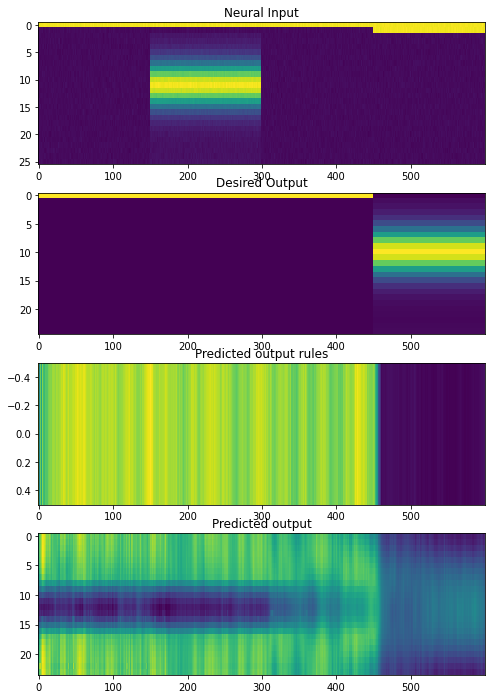

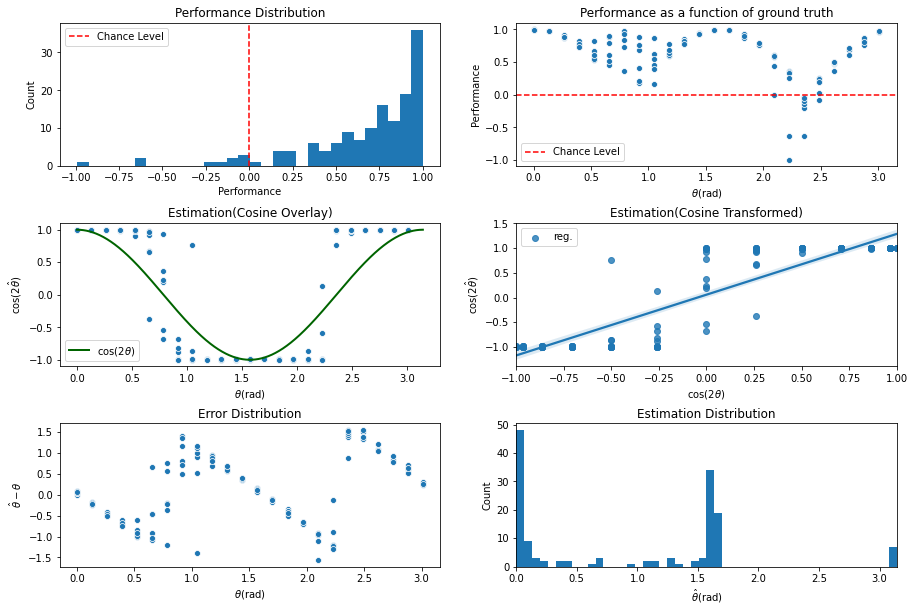

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3800\assets

 Training performance: 
Iter. 3801 | Performance 0.6765 | Loss 0.2934 | Spike loss 2.0049
Testing performance: 
Iter. 3801 | Performance 0.6506 | Loss 0.2946 | Spike loss 1.9718

 Training performance: 
Iter. 3802 | Performance 0.6268 | Loss 0.2948 | Spike loss 1.9957
Testing performance: 
Iter. 3802 | Performance 0.6744 | Loss 0.2943 | Spike loss 1.9705

 Training performance: 
Iter. 3803 | Performance 0.6184 | Loss 0.2950 | Spike loss 1.9366
Testing performance: 
Iter. 3803 | Performance 0.6373 | Loss 0.2962 | Spike loss 1.9765

 Training performance: 
Iter. 3804 | Performance 0.7189 | Loss 0.2937 | Spike loss 2.0256
Testing performance: 
Iter. 3804 | Performance 0.6384 | Loss 0.2941 | Spike loss 1.9809

 Training performance: 
Iter. 3805 | Performance 0.6658 | Loss 0.2936 | Spike loss 1.9376
Testing performance: 
Iter. 3805 | Performance 0.6795 | Loss 0.2943 | Spike loss 1.9817

 Traini


 Training performance: 
Iter. 3847 | Performance 0.6937 | Loss 0.2918 | Spike loss 1.9650
Testing performance: 
Iter. 3847 | Performance 0.6846 | Loss 0.2939 | Spike loss 1.9959

 Training performance: 
Iter. 3848 | Performance 0.7435 | Loss 0.2908 | Spike loss 1.9693
Testing performance: 
Iter. 3848 | Performance 0.6832 | Loss 0.2944 | Spike loss 1.9972

 Training performance: 
Iter. 3849 | Performance 0.7160 | Loss 0.2925 | Spike loss 1.9895
Testing performance: 
Iter. 3849 | Performance 0.6860 | Loss 0.2940 | Spike loss 1.9782

 Training performance: 
Iter. 3850 | Performance 0.7090 | Loss 0.2929 | Spike loss 2.0306
Testing performance: 
Iter. 3850 | Performance 0.6739 | Loss 0.2940 | Spike loss 1.9697

 Training performance: 
Iter. 3851 | Performance 0.7219 | Loss 0.2913 | Spike loss 1.9686
Testing performance: 
Iter. 3851 | Performance 0.7161 | Loss 0.2928 | Spike loss 1.9836

 Training performance: 
Iter. 3852 | Performance 0.7752 | Loss 0.2883 | Spike loss 2.0282
Testing perfor


 Training performance: 
Iter. 3893 | Performance 0.6853 | Loss 0.2931 | Spike loss 2.0283
Testing performance: 
Iter. 3893 | Performance 0.7126 | Loss 0.2937 | Spike loss 2.0420

 Training performance: 
Iter. 3894 | Performance 0.7243 | Loss 0.2922 | Spike loss 2.0488
Testing performance: 
Iter. 3894 | Performance 0.6874 | Loss 0.2923 | Spike loss 2.0347

 Training performance: 
Iter. 3895 | Performance 0.6898 | Loss 0.2929 | Spike loss 2.0095
Testing performance: 
Iter. 3895 | Performance 0.7003 | Loss 0.2922 | Spike loss 2.0487

 Training performance: 
Iter. 3896 | Performance 0.7126 | Loss 0.2927 | Spike loss 2.0270
Testing performance: 
Iter. 3896 | Performance 0.7062 | Loss 0.2927 | Spike loss 2.0404

 Training performance: 
Iter. 3897 | Performance 0.7160 | Loss 0.2928 | Spike loss 2.0579
Testing performance: 
Iter. 3897 | Performance 0.6980 | Loss 0.2911 | Spike loss 2.0194

 Training performance: 
Iter. 3898 | Performance 0.6937 | Loss 0.2913 | Spike loss 1.9513
Testing perfor

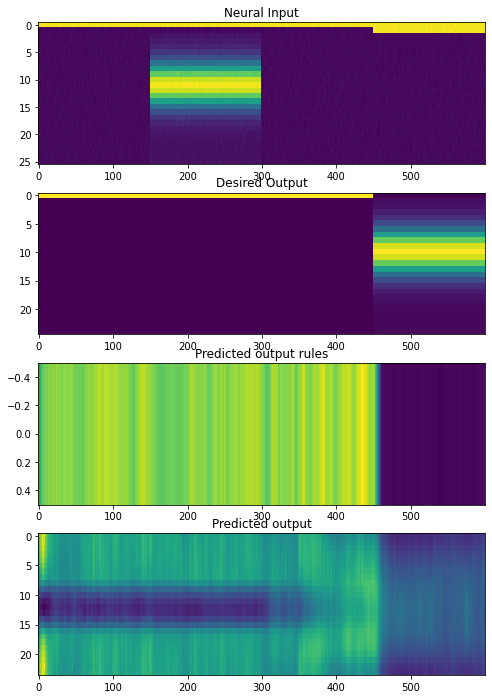

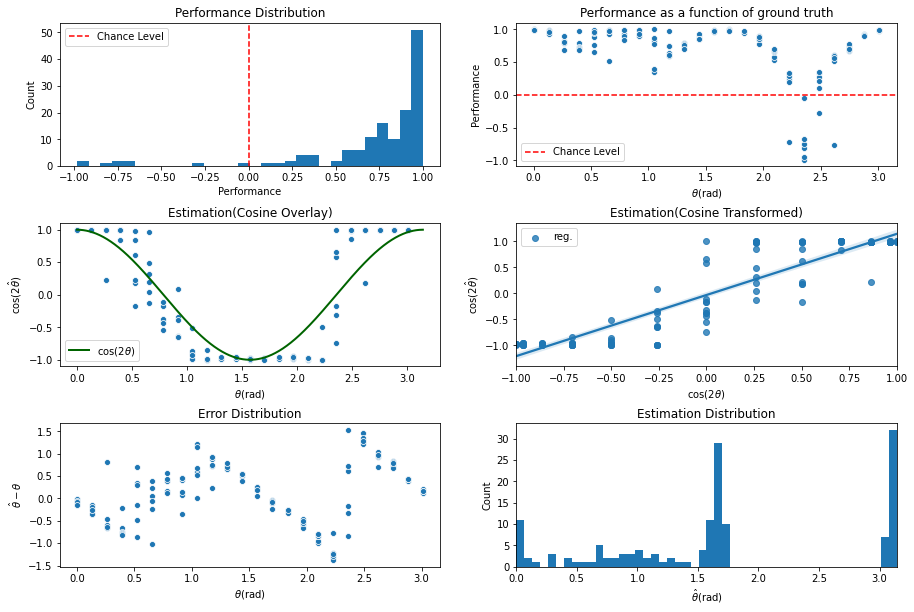

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter3900\assets

 Training performance: 
Iter. 3901 | Performance 0.7099 | Loss 0.2919 | Spike loss 2.0311
Testing performance: 
Iter. 3901 | Performance 0.6846 | Loss 0.2930 | Spike loss 2.0084

 Training performance: 
Iter. 3902 | Performance 0.7499 | Loss 0.2896 | Spike loss 2.0440
Testing performance: 
Iter. 3902 | Performance 0.7350 | Loss 0.2928 | Spike loss 2.0038

 Training performance: 
Iter. 3903 | Performance 0.7182 | Loss 0.2917 | Spike loss 2.0511
Testing performance: 
Iter. 3903 | Performance 0.7003 | Loss 0.2926 | Spike loss 2.0106

 Training performance: 
Iter. 3904 | Performance 0.7368 | Loss 0.2894 | Spike loss 2.0937
Testing performance: 
Iter. 3904 | Performance 0.7097 | Loss 0.2920 | Spike loss 2.0250

 Training performance: 
Iter. 3905 | Performance 0.7175 | Loss 0.2916 | Spike loss 2.1009
Testing performance: 
Iter. 3905 | Performance 0.7285 | Loss 0.2926 | Spike loss 2.0214

 Traini


 Training performance: 
Iter. 3947 | Performance 0.7949 | Loss 0.2874 | Spike loss 2.1029
Testing performance: 
Iter. 3947 | Performance 0.7280 | Loss 0.2921 | Spike loss 2.0916

 Training performance: 
Iter. 3948 | Performance 0.7758 | Loss 0.2900 | Spike loss 2.1603
Testing performance: 
Iter. 3948 | Performance 0.7573 | Loss 0.2886 | Spike loss 2.1106

 Training performance: 
Iter. 3949 | Performance 0.7687 | Loss 0.2876 | Spike loss 2.1220
Testing performance: 
Iter. 3949 | Performance 0.7630 | Loss 0.2893 | Spike loss 2.1112

 Training performance: 
Iter. 3950 | Performance 0.7585 | Loss 0.2894 | Spike loss 2.1070
Testing performance: 
Iter. 3950 | Performance 0.7109 | Loss 0.2925 | Spike loss 2.1095

 Training performance: 
Iter. 3951 | Performance 0.7883 | Loss 0.2880 | Spike loss 2.1724
Testing performance: 
Iter. 3951 | Performance 0.7467 | Loss 0.2893 | Spike loss 2.1041

 Training performance: 
Iter. 3952 | Performance 0.7725 | Loss 0.2890 | Spike loss 2.0963
Testing perfor


 Training performance: 
Iter. 3993 | Performance 0.8008 | Loss 0.2870 | Spike loss 2.0940
Testing performance: 
Iter. 3993 | Performance 0.7775 | Loss 0.2876 | Spike loss 2.1845

 Training performance: 
Iter. 3994 | Performance 0.8404 | Loss 0.2843 | Spike loss 2.2060
Testing performance: 
Iter. 3994 | Performance 0.7914 | Loss 0.2865 | Spike loss 2.1946

 Training performance: 
Iter. 3995 | Performance 0.8090 | Loss 0.2854 | Spike loss 2.1656
Testing performance: 
Iter. 3995 | Performance 0.7951 | Loss 0.2871 | Spike loss 2.1780

 Training performance: 
Iter. 3996 | Performance 0.8049 | Loss 0.2873 | Spike loss 2.2737
Testing performance: 
Iter. 3996 | Performance 0.7840 | Loss 0.2868 | Spike loss 2.1818

 Training performance: 
Iter. 3997 | Performance 0.7729 | Loss 0.2873 | Spike loss 2.2481
Testing performance: 
Iter. 3997 | Performance 0.7685 | Loss 0.2883 | Spike loss 2.2093

 Training performance: 
Iter. 3998 | Performance 0.8205 | Loss 0.2841 | Spike loss 2.1869
Testing perfor

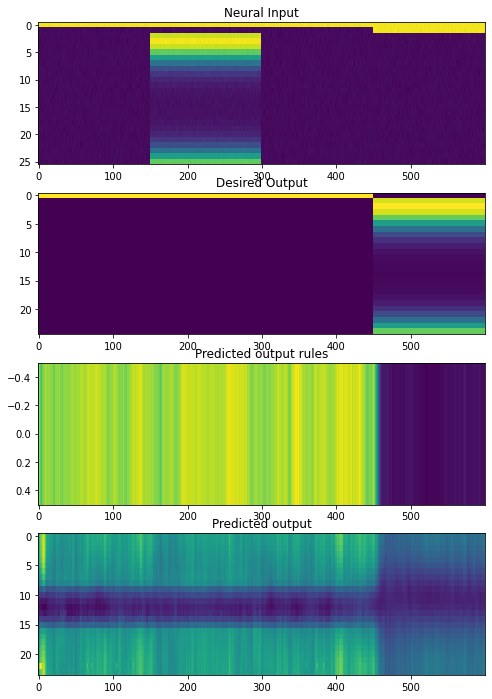

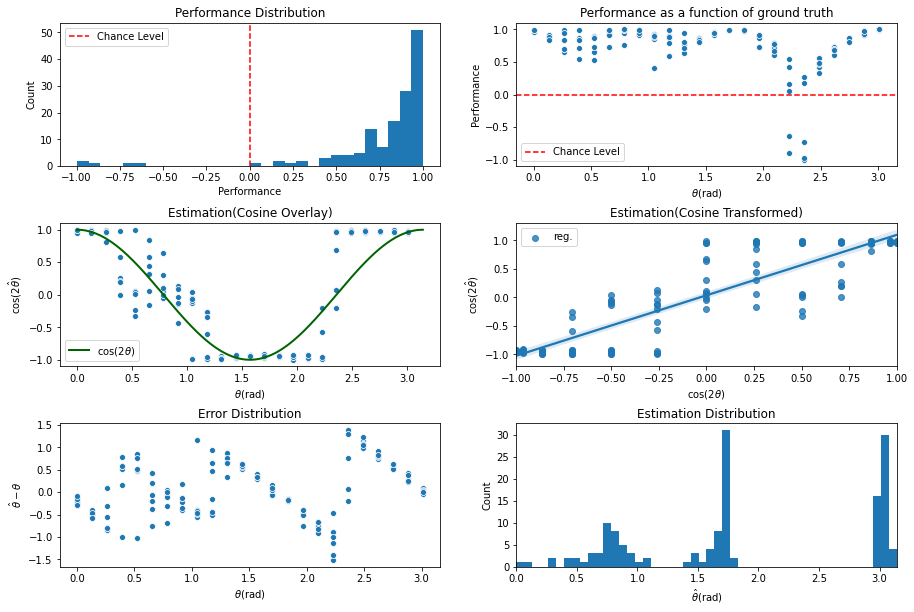

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4000\assets

 Training performance: 
Iter. 4001 | Performance 0.8006 | Loss 0.2871 | Spike loss 2.1690
Testing performance: 
Iter. 4001 | Performance 0.8060 | Loss 0.2872 | Spike loss 2.1735

 Training performance: 
Iter. 4002 | Performance 0.8342 | Loss 0.2862 | Spike loss 2.2595
Testing performance: 
Iter. 4002 | Performance 0.8046 | Loss 0.2865 | Spike loss 2.1510

 Training performance: 
Iter. 4003 | Performance 0.7822 | Loss 0.2865 | Spike loss 2.1707
Testing performance: 
Iter. 4003 | Performance 0.8082 | Loss 0.2870 | Spike loss 2.1750

 Training performance: 
Iter. 4004 | Performance 0.8095 | Loss 0.2863 | Spike loss 2.2700
Testing performance: 
Iter. 4004 | Performance 0.8225 | Loss 0.2870 | Spike loss 2.1652

 Training performance: 
Iter. 4005 | Performance 0.7794 | Loss 0.2889 | Spike loss 2.2464
Testing performance: 
Iter. 4005 | Performance 0.8107 | Loss 0.2860 | Spike loss 2.1598

 Traini


 Training performance: 
Iter. 4047 | Performance 0.8071 | Loss 0.2869 | Spike loss 2.1850
Testing performance: 
Iter. 4047 | Performance 0.7898 | Loss 0.2860 | Spike loss 2.2506

 Training performance: 
Iter. 4048 | Performance 0.7844 | Loss 0.2859 | Spike loss 2.2609
Testing performance: 
Iter. 4048 | Performance 0.7710 | Loss 0.2873 | Spike loss 2.2448

 Training performance: 
Iter. 4049 | Performance 0.8076 | Loss 0.2844 | Spike loss 2.3152
Testing performance: 
Iter. 4049 | Performance 0.7940 | Loss 0.2859 | Spike loss 2.2547

 Training performance: 
Iter. 4050 | Performance 0.8081 | Loss 0.2863 | Spike loss 2.3531
Testing performance: 
Iter. 4050 | Performance 0.7809 | Loss 0.2871 | Spike loss 2.2510

 Training performance: 
Iter. 4051 | Performance 0.8258 | Loss 0.2831 | Spike loss 2.2257
Testing performance: 
Iter. 4051 | Performance 0.8108 | Loss 0.2849 | Spike loss 2.2285

 Training performance: 
Iter. 4052 | Performance 0.8225 | Loss 0.2832 | Spike loss 2.1776
Testing perfor


 Training performance: 
Iter. 4093 | Performance 0.8148 | Loss 0.2848 | Spike loss 2.3139
Testing performance: 
Iter. 4093 | Performance 0.8331 | Loss 0.2837 | Spike loss 2.3118

 Training performance: 
Iter. 4094 | Performance 0.8225 | Loss 0.2842 | Spike loss 2.3479
Testing performance: 
Iter. 4094 | Performance 0.8406 | Loss 0.2848 | Spike loss 2.2973

 Training performance: 
Iter. 4095 | Performance 0.8359 | Loss 0.2851 | Spike loss 2.3293
Testing performance: 
Iter. 4095 | Performance 0.8218 | Loss 0.2839 | Spike loss 2.3252

 Training performance: 
Iter. 4096 | Performance 0.8483 | Loss 0.2813 | Spike loss 2.3440
Testing performance: 
Iter. 4096 | Performance 0.8390 | Loss 0.2842 | Spike loss 2.2972

 Training performance: 
Iter. 4097 | Performance 0.8355 | Loss 0.2837 | Spike loss 2.3191
Testing performance: 
Iter. 4097 | Performance 0.8322 | Loss 0.2858 | Spike loss 2.3088

 Training performance: 
Iter. 4098 | Performance 0.8540 | Loss 0.2837 | Spike loss 2.3326
Testing perfor

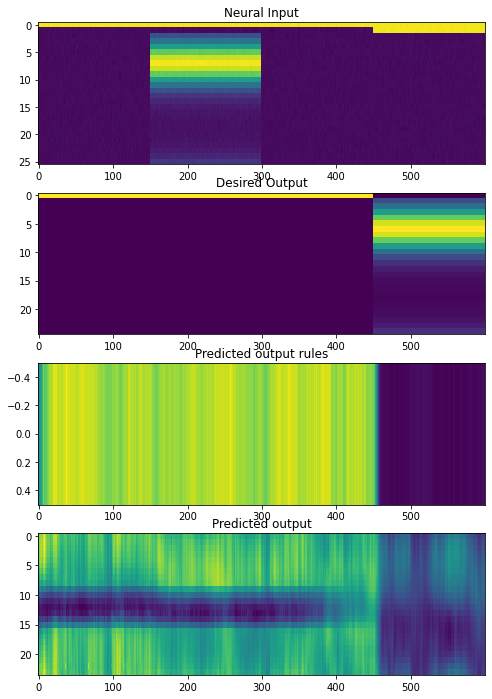

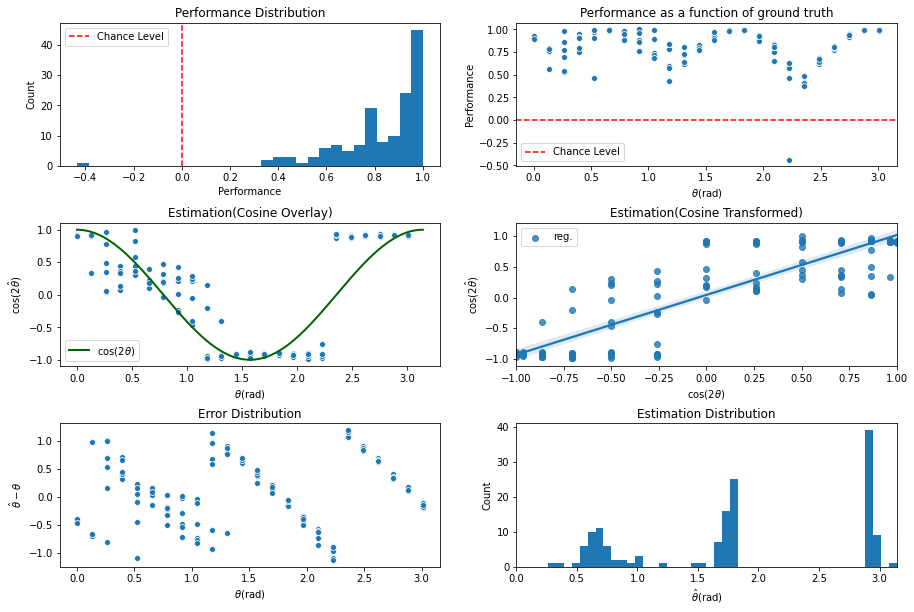

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4100\assets

 Training performance: 
Iter. 4101 | Performance 0.8508 | Loss 0.2850 | Spike loss 2.2657
Testing performance: 
Iter. 4101 | Performance 0.8078 | Loss 0.2844 | Spike loss 2.2826

 Training performance: 
Iter. 4102 | Performance 0.8402 | Loss 0.2820 | Spike loss 2.2465
Testing performance: 
Iter. 4102 | Performance 0.8341 | Loss 0.2834 | Spike loss 2.3114

 Training performance: 
Iter. 4103 | Performance 0.8411 | Loss 0.2832 | Spike loss 2.2320
Testing performance: 
Iter. 4103 | Performance 0.8170 | Loss 0.2853 | Spike loss 2.3117

 Training performance: 
Iter. 4104 | Performance 0.8377 | Loss 0.2843 | Spike loss 2.2747
Testing performance: 
Iter. 4104 | Performance 0.7939 | Loss 0.2852 | Spike loss 2.3360

 Training performance: 
Iter. 4105 | Performance 0.8053 | Loss 0.2844 | Spike loss 2.2995
Testing performance: 
Iter. 4105 | Performance 0.8049 | Loss 0.2847 | Spike loss 2.3290

 Traini


 Training performance: 
Iter. 4147 | Performance 0.8032 | Loss 0.2864 | Spike loss 2.2667
Testing performance: 
Iter. 4147 | Performance 0.8303 | Loss 0.2837 | Spike loss 2.2560

 Training performance: 
Iter. 4148 | Performance 0.8348 | Loss 0.2829 | Spike loss 2.3870
Testing performance: 
Iter. 4148 | Performance 0.8130 | Loss 0.2863 | Spike loss 2.2620

 Training performance: 
Iter. 4149 | Performance 0.8551 | Loss 0.2826 | Spike loss 2.3108
Testing performance: 
Iter. 4149 | Performance 0.8329 | Loss 0.2837 | Spike loss 2.2711

 Training performance: 
Iter. 4150 | Performance 0.8417 | Loss 0.2817 | Spike loss 2.2431
Testing performance: 
Iter. 4150 | Performance 0.8336 | Loss 0.2831 | Spike loss 2.2712

 Training performance: 
Iter. 4151 | Performance 0.8069 | Loss 0.2845 | Spike loss 2.2337
Testing performance: 
Iter. 4151 | Performance 0.8162 | Loss 0.2852 | Spike loss 2.2819

 Training performance: 
Iter. 4152 | Performance 0.8120 | Loss 0.2845 | Spike loss 2.2256
Testing perfor


 Training performance: 
Iter. 4193 | Performance 0.8466 | Loss 0.2825 | Spike loss 2.3554
Testing performance: 
Iter. 4193 | Performance 0.8183 | Loss 0.2845 | Spike loss 2.3316

 Training performance: 
Iter. 4194 | Performance 0.8274 | Loss 0.2842 | Spike loss 2.3275
Testing performance: 
Iter. 4194 | Performance 0.8277 | Loss 0.2831 | Spike loss 2.3238

 Training performance: 
Iter. 4195 | Performance 0.8106 | Loss 0.2831 | Spike loss 2.2894
Testing performance: 
Iter. 4195 | Performance 0.7937 | Loss 0.2864 | Spike loss 2.3362

 Training performance: 
Iter. 4196 | Performance 0.8075 | Loss 0.2845 | Spike loss 2.3544
Testing performance: 
Iter. 4196 | Performance 0.7912 | Loss 0.2873 | Spike loss 2.3200

 Training performance: 
Iter. 4197 | Performance 0.8305 | Loss 0.2843 | Spike loss 2.3460
Testing performance: 
Iter. 4197 | Performance 0.7931 | Loss 0.2853 | Spike loss 2.3306

 Training performance: 
Iter. 4198 | Performance 0.7829 | Loss 0.2873 | Spike loss 2.2882
Testing perfor

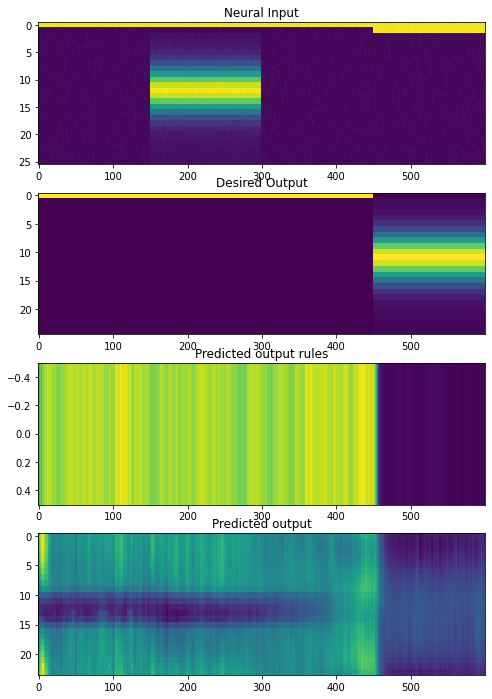

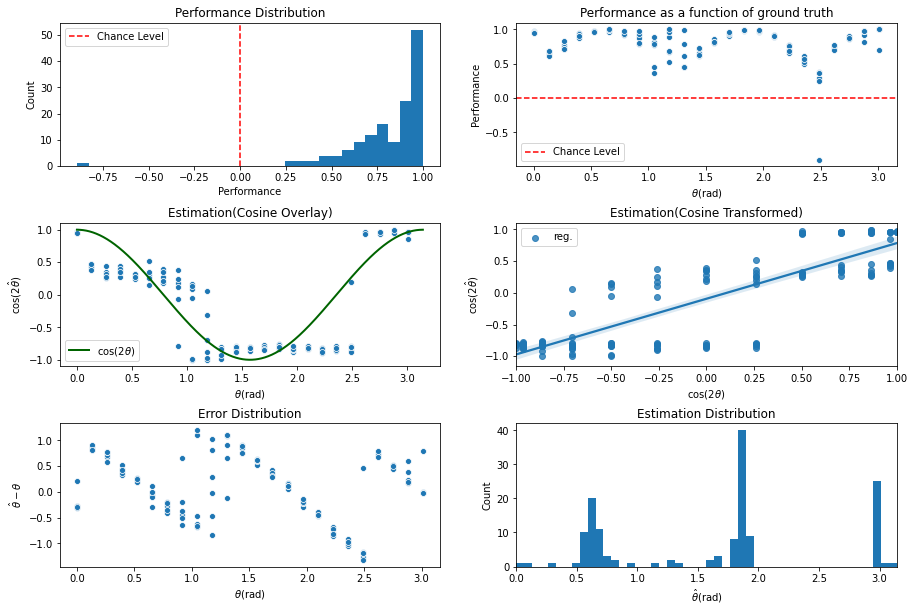

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4200\assets

 Training performance: 
Iter. 4201 | Performance 0.8243 | Loss 0.2842 | Spike loss 2.3941
Testing performance: 
Iter. 4201 | Performance 0.8142 | Loss 0.2857 | Spike loss 2.3136

 Training performance: 
Iter. 4202 | Performance 0.7947 | Loss 0.2866 | Spike loss 2.3096
Testing performance: 
Iter. 4202 | Performance 0.8104 | Loss 0.2865 | Spike loss 2.3074

 Training performance: 
Iter. 4203 | Performance 0.8314 | Loss 0.2852 | Spike loss 2.3042
Testing performance: 
Iter. 4203 | Performance 0.8162 | Loss 0.2854 | Spike loss 2.3096

 Training performance: 
Iter. 4204 | Performance 0.8224 | Loss 0.2828 | Spike loss 2.3337
Testing performance: 
Iter. 4204 | Performance 0.8210 | Loss 0.2853 | Spike loss 2.3325

 Training performance: 
Iter. 4205 | Performance 0.7830 | Loss 0.2865 | Spike loss 2.2879
Testing performance: 
Iter. 4205 | Performance 0.8149 | Loss 0.2862 | Spike loss 2.3250

 Traini


 Training performance: 
Iter. 4247 | Performance 0.8081 | Loss 0.2848 | Spike loss 2.1482
Testing performance: 
Iter. 4247 | Performance 0.8367 | Loss 0.2835 | Spike loss 2.2110

 Training performance: 
Iter. 4248 | Performance 0.8317 | Loss 0.2837 | Spike loss 2.2071
Testing performance: 
Iter. 4248 | Performance 0.8245 | Loss 0.2836 | Spike loss 2.2106

 Training performance: 
Iter. 4249 | Performance 0.8557 | Loss 0.2808 | Spike loss 2.2409
Testing performance: 
Iter. 4249 | Performance 0.8156 | Loss 0.2839 | Spike loss 2.2041

 Training performance: 
Iter. 4250 | Performance 0.8262 | Loss 0.2824 | Spike loss 2.1918
Testing performance: 
Iter. 4250 | Performance 0.8263 | Loss 0.2838 | Spike loss 2.1981

 Training performance: 
Iter. 4251 | Performance 0.8563 | Loss 0.2821 | Spike loss 2.1970
Testing performance: 
Iter. 4251 | Performance 0.8093 | Loss 0.2840 | Spike loss 2.2205

 Training performance: 
Iter. 4252 | Performance 0.8502 | Loss 0.2805 | Spike loss 2.2369
Testing perfor


 Training performance: 
Iter. 4293 | Performance 0.8375 | Loss 0.2839 | Spike loss 2.2503
Testing performance: 
Iter. 4293 | Performance 0.8170 | Loss 0.2847 | Spike loss 2.2561

 Training performance: 
Iter. 4294 | Performance 0.8528 | Loss 0.2806 | Spike loss 2.1729
Testing performance: 
Iter. 4294 | Performance 0.8463 | Loss 0.2825 | Spike loss 2.2565

 Training performance: 
Iter. 4295 | Performance 0.8527 | Loss 0.2817 | Spike loss 2.2851
Testing performance: 
Iter. 4295 | Performance 0.8265 | Loss 0.2852 | Spike loss 2.2235

 Training performance: 
Iter. 4296 | Performance 0.8421 | Loss 0.2835 | Spike loss 2.2647
Testing performance: 
Iter. 4296 | Performance 0.8303 | Loss 0.2842 | Spike loss 2.2327

 Training performance: 
Iter. 4297 | Performance 0.8415 | Loss 0.2824 | Spike loss 2.2894
Testing performance: 
Iter. 4297 | Performance 0.8414 | Loss 0.2842 | Spike loss 2.2075

 Training performance: 
Iter. 4298 | Performance 0.8483 | Loss 0.2852 | Spike loss 2.2564
Testing perfor

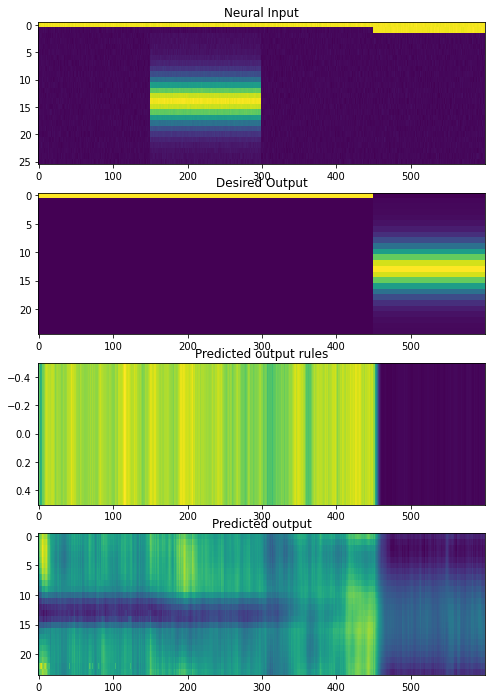

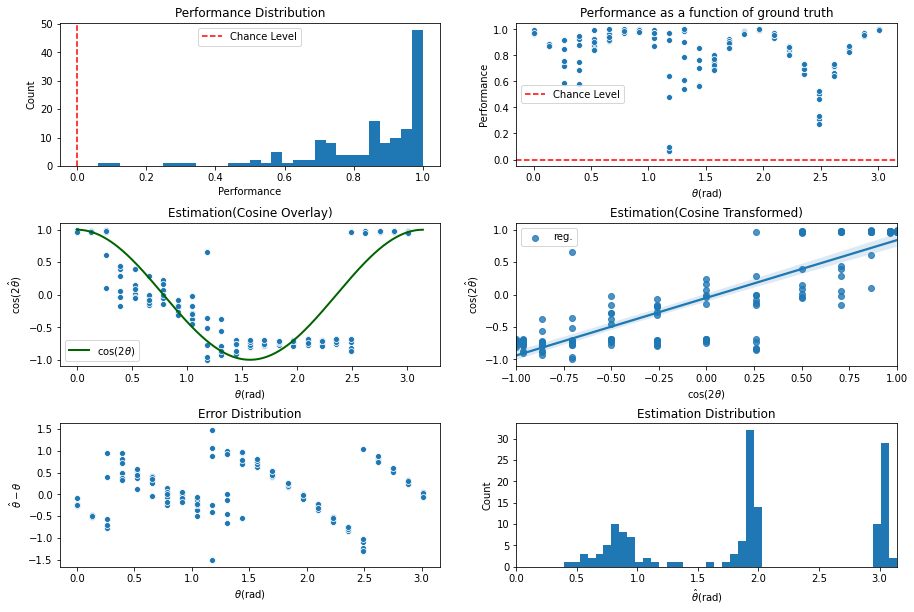

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4300\assets

 Training performance: 
Iter. 4301 | Performance 0.7787 | Loss 0.2890 | Spike loss 2.2400
Testing performance: 
Iter. 4301 | Performance 0.8494 | Loss 0.2833 | Spike loss 2.2597

 Training performance: 
Iter. 4302 | Performance 0.8339 | Loss 0.2843 | Spike loss 2.2476
Testing performance: 
Iter. 4302 | Performance 0.8246 | Loss 0.2832 | Spike loss 2.2821

 Training performance: 
Iter. 4303 | Performance 0.8450 | Loss 0.2823 | Spike loss 2.2830
Testing performance: 
Iter. 4303 | Performance 0.8262 | Loss 0.2844 | Spike loss 2.3050

 Training performance: 
Iter. 4304 | Performance 0.7843 | Loss 0.2874 | Spike loss 2.3286
Testing performance: 
Iter. 4304 | Performance 0.7946 | Loss 0.2866 | Spike loss 2.3232

 Training performance: 
Iter. 4305 | Performance 0.8183 | Loss 0.2855 | Spike loss 2.3141
Testing performance: 
Iter. 4305 | Performance 0.8069 | Loss 0.2844 | Spike loss 2.3255

 Traini


 Training performance: 
Iter. 4347 | Performance 0.8551 | Loss 0.2845 | Spike loss 2.3045
Testing performance: 
Iter. 4347 | Performance 0.8580 | Loss 0.2828 | Spike loss 2.2762

 Training performance: 
Iter. 4348 | Performance 0.8802 | Loss 0.2818 | Spike loss 2.2089
Testing performance: 
Iter. 4348 | Performance 0.8750 | Loss 0.2818 | Spike loss 2.2634

 Training performance: 
Iter. 4349 | Performance 0.8762 | Loss 0.2811 | Spike loss 2.3032
Testing performance: 
Iter. 4349 | Performance 0.8559 | Loss 0.2851 | Spike loss 2.2443

 Training performance: 
Iter. 4350 | Performance 0.8263 | Loss 0.2855 | Spike loss 2.2081
Testing performance: 
Iter. 4350 | Performance 0.8645 | Loss 0.2817 | Spike loss 2.2885

 Training performance: 
Iter. 4351 | Performance 0.8498 | Loss 0.2846 | Spike loss 2.2951
Testing performance: 
Iter. 4351 | Performance 0.8625 | Loss 0.2827 | Spike loss 2.2653

 Training performance: 
Iter. 4352 | Performance 0.8629 | Loss 0.2824 | Spike loss 2.2044
Testing perfor


 Training performance: 
Iter. 4393 | Performance 0.8700 | Loss 0.2805 | Spike loss 2.2622
Testing performance: 
Iter. 4393 | Performance 0.8718 | Loss 0.2805 | Spike loss 2.2848

 Training performance: 
Iter. 4394 | Performance 0.8498 | Loss 0.2823 | Spike loss 2.2793
Testing performance: 
Iter. 4394 | Performance 0.8703 | Loss 0.2815 | Spike loss 2.2923

 Training performance: 
Iter. 4395 | Performance 0.8667 | Loss 0.2810 | Spike loss 2.3535
Testing performance: 
Iter. 4395 | Performance 0.8599 | Loss 0.2808 | Spike loss 2.2857

 Training performance: 
Iter. 4396 | Performance 0.8753 | Loss 0.2796 | Spike loss 2.3397
Testing performance: 
Iter. 4396 | Performance 0.8582 | Loss 0.2818 | Spike loss 2.2696

 Training performance: 
Iter. 4397 | Performance 0.8700 | Loss 0.2809 | Spike loss 2.2634
Testing performance: 
Iter. 4397 | Performance 0.8608 | Loss 0.2826 | Spike loss 2.2851

 Training performance: 
Iter. 4398 | Performance 0.8468 | Loss 0.2840 | Spike loss 2.3022
Testing perfor

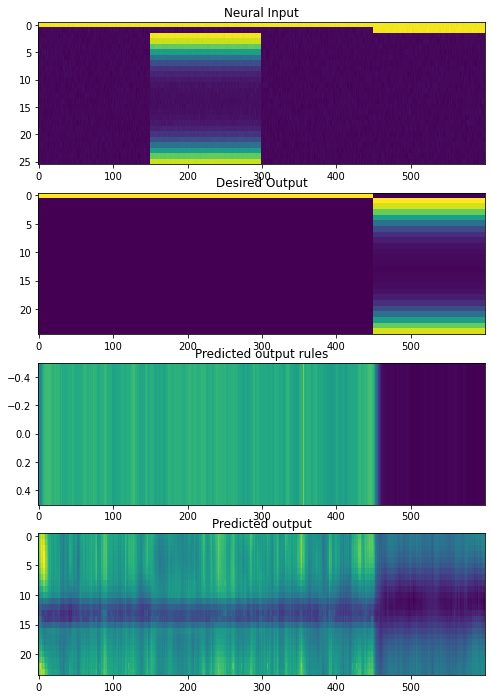

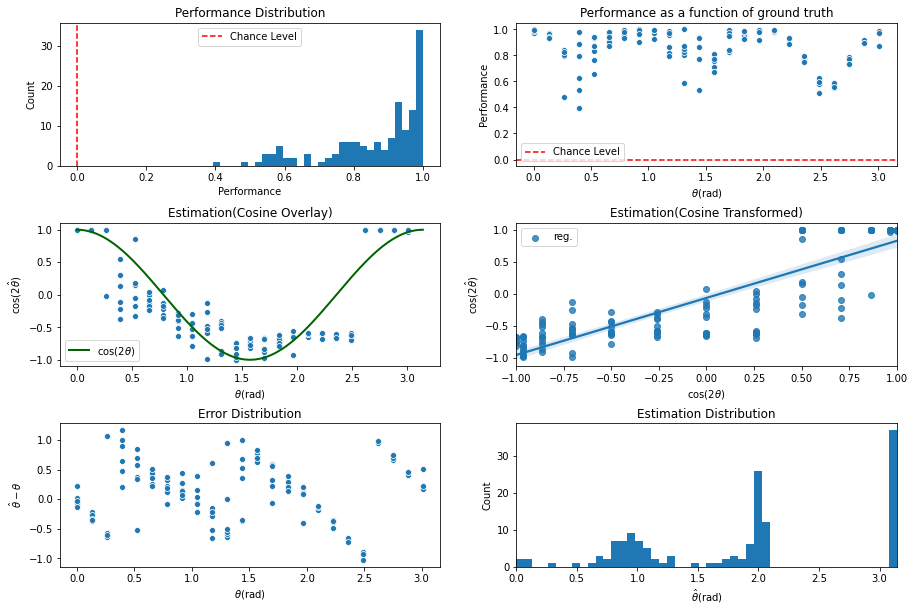

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4400\assets

 Training performance: 
Iter. 4401 | Performance 0.8831 | Loss 0.2806 | Spike loss 2.2476
Testing performance: 
Iter. 4401 | Performance 0.8632 | Loss 0.2810 | Spike loss 2.2748

 Training performance: 
Iter. 4402 | Performance 0.8602 | Loss 0.2810 | Spike loss 2.3201
Testing performance: 
Iter. 4402 | Performance 0.8585 | Loss 0.2822 | Spike loss 2.2744

 Training performance: 
Iter. 4403 | Performance 0.8782 | Loss 0.2792 | Spike loss 2.2168
Testing performance: 
Iter. 4403 | Performance 0.8564 | Loss 0.2827 | Spike loss 2.2578

 Training performance: 
Iter. 4404 | Performance 0.8742 | Loss 0.2820 | Spike loss 2.3303
Testing performance: 
Iter. 4404 | Performance 0.8623 | Loss 0.2810 | Spike loss 2.2676

 Training performance: 
Iter. 4405 | Performance 0.8612 | Loss 0.2810 | Spike loss 2.2485
Testing performance: 
Iter. 4405 | Performance 0.8622 | Loss 0.2829 | Spike loss 2.2583

 Traini


 Training performance: 
Iter. 4447 | Performance 0.8555 | Loss 0.2817 | Spike loss 2.2743
Testing performance: 
Iter. 4447 | Performance 0.8617 | Loss 0.2821 | Spike loss 2.2886

 Training performance: 
Iter. 4448 | Performance 0.8786 | Loss 0.2804 | Spike loss 2.1752
Testing performance: 
Iter. 4448 | Performance 0.8677 | Loss 0.2833 | Spike loss 2.2964

 Training performance: 
Iter. 4449 | Performance 0.8657 | Loss 0.2830 | Spike loss 2.2982
Testing performance: 
Iter. 4449 | Performance 0.8869 | Loss 0.2796 | Spike loss 2.3128

 Training performance: 
Iter. 4450 | Performance 0.8578 | Loss 0.2819 | Spike loss 2.2014
Testing performance: 
Iter. 4450 | Performance 0.8644 | Loss 0.2817 | Spike loss 2.3103

 Training performance: 
Iter. 4451 | Performance 0.8840 | Loss 0.2808 | Spike loss 2.3100
Testing performance: 
Iter. 4451 | Performance 0.8849 | Loss 0.2809 | Spike loss 2.3289

 Training performance: 
Iter. 4452 | Performance 0.8709 | Loss 0.2826 | Spike loss 2.2867
Testing perfor


 Training performance: 
Iter. 4493 | Performance 0.8943 | Loss 0.2795 | Spike loss 2.3110
Testing performance: 
Iter. 4493 | Performance 0.8850 | Loss 0.2822 | Spike loss 2.2753

 Training performance: 
Iter. 4494 | Performance 0.8677 | Loss 0.2826 | Spike loss 2.2781
Testing performance: 
Iter. 4494 | Performance 0.8738 | Loss 0.2813 | Spike loss 2.3107

 Training performance: 
Iter. 4495 | Performance 0.8850 | Loss 0.2799 | Spike loss 2.2191
Testing performance: 
Iter. 4495 | Performance 0.9029 | Loss 0.2784 | Spike loss 2.3256

 Training performance: 
Iter. 4496 | Performance 0.8793 | Loss 0.2797 | Spike loss 2.2858
Testing performance: 
Iter. 4496 | Performance 0.8793 | Loss 0.2813 | Spike loss 2.3204

 Training performance: 
Iter. 4497 | Performance 0.8961 | Loss 0.2801 | Spike loss 2.4297
Testing performance: 
Iter. 4497 | Performance 0.8713 | Loss 0.2800 | Spike loss 2.3225

 Training performance: 
Iter. 4498 | Performance 0.8619 | Loss 0.2811 | Spike loss 2.3787
Testing perfor

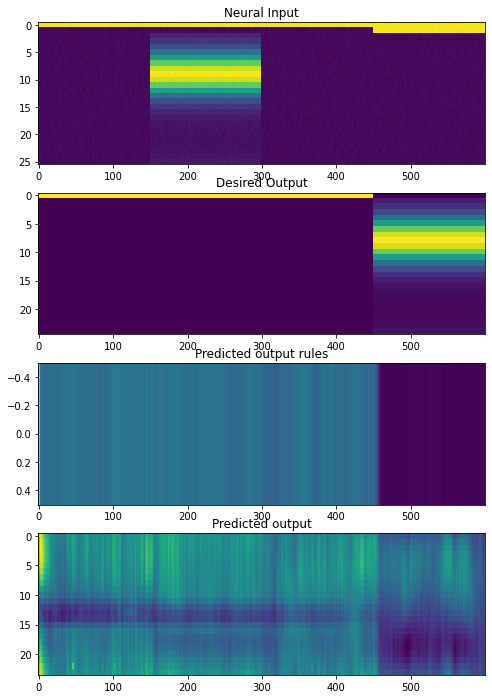

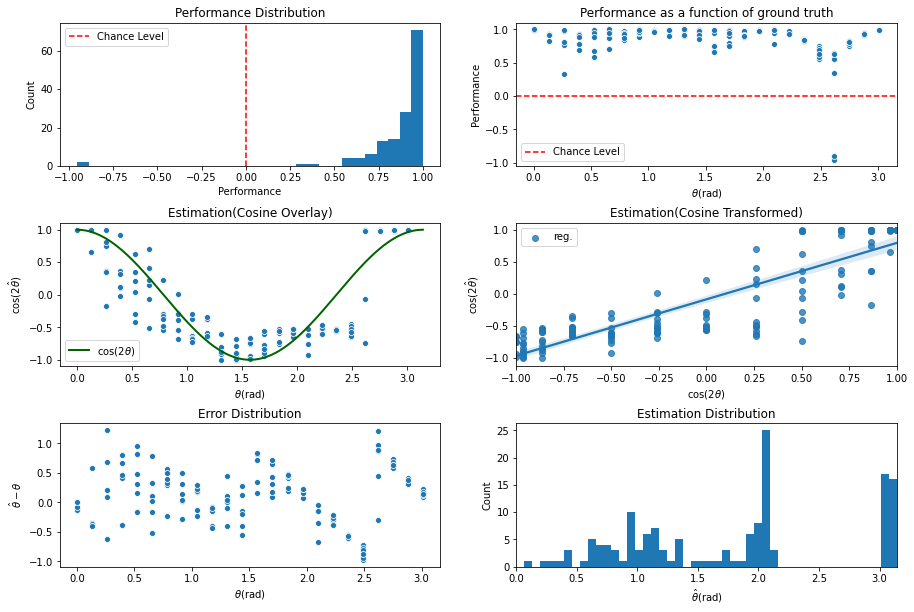

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4500\assets

 Training performance: 
Iter. 4501 | Performance 0.8709 | Loss 0.2818 | Spike loss 2.3129
Testing performance: 
Iter. 4501 | Performance 0.8766 | Loss 0.2814 | Spike loss 2.3083

 Training performance: 
Iter. 4502 | Performance 0.8735 | Loss 0.2814 | Spike loss 2.2843
Testing performance: 
Iter. 4502 | Performance 0.8815 | Loss 0.2817 | Spike loss 2.3096

 Training performance: 
Iter. 4503 | Performance 0.8947 | Loss 0.2802 | Spike loss 2.2374
Testing performance: 
Iter. 4503 | Performance 0.8881 | Loss 0.2797 | Spike loss 2.3033

 Training performance: 
Iter. 4504 | Performance 0.8958 | Loss 0.2795 | Spike loss 2.2928
Testing performance: 
Iter. 4504 | Performance 0.8742 | Loss 0.2820 | Spike loss 2.3084

 Training performance: 
Iter. 4505 | Performance 0.8945 | Loss 0.2797 | Spike loss 2.2851
Testing performance: 
Iter. 4505 | Performance 0.8918 | Loss 0.2809 | Spike loss 2.3369

 Traini


 Training performance: 
Iter. 4547 | Performance 0.9090 | Loss 0.2776 | Spike loss 2.2910
Testing performance: 
Iter. 4547 | Performance 0.8879 | Loss 0.2799 | Spike loss 2.3445

 Training performance: 
Iter. 4548 | Performance 0.8922 | Loss 0.2802 | Spike loss 2.3193
Testing performance: 
Iter. 4548 | Performance 0.8724 | Loss 0.2796 | Spike loss 2.3434

 Training performance: 
Iter. 4549 | Performance 0.8732 | Loss 0.2805 | Spike loss 2.3985
Testing performance: 
Iter. 4549 | Performance 0.8796 | Loss 0.2793 | Spike loss 2.3330

 Training performance: 
Iter. 4550 | Performance 0.8653 | Loss 0.2819 | Spike loss 2.3669
Testing performance: 
Iter. 4550 | Performance 0.9046 | Loss 0.2791 | Spike loss 2.3366

 Training performance: 
Iter. 4551 | Performance 0.8750 | Loss 0.2815 | Spike loss 2.3358
Testing performance: 
Iter. 4551 | Performance 0.8825 | Loss 0.2784 | Spike loss 2.3218

 Training performance: 
Iter. 4552 | Performance 0.8947 | Loss 0.2781 | Spike loss 2.2927
Testing perfor


 Training performance: 
Iter. 4593 | Performance 0.8985 | Loss 0.2802 | Spike loss 2.3649
Testing performance: 
Iter. 4593 | Performance 0.9022 | Loss 0.2783 | Spike loss 2.3381

 Training performance: 
Iter. 4594 | Performance 0.8954 | Loss 0.2794 | Spike loss 2.3485
Testing performance: 
Iter. 4594 | Performance 0.9100 | Loss 0.2769 | Spike loss 2.3281

 Training performance: 
Iter. 4595 | Performance 0.8779 | Loss 0.2801 | Spike loss 2.3415
Testing performance: 
Iter. 4595 | Performance 0.9228 | Loss 0.2767 | Spike loss 2.3222

 Training performance: 
Iter. 4596 | Performance 0.8942 | Loss 0.2790 | Spike loss 2.2978
Testing performance: 
Iter. 4596 | Performance 0.9086 | Loss 0.2773 | Spike loss 2.3145

 Training performance: 
Iter. 4597 | Performance 0.9039 | Loss 0.2768 | Spike loss 2.2458
Testing performance: 
Iter. 4597 | Performance 0.9148 | Loss 0.2779 | Spike loss 2.3134

 Training performance: 
Iter. 4598 | Performance 0.9149 | Loss 0.2784 | Spike loss 2.3314
Testing perfor

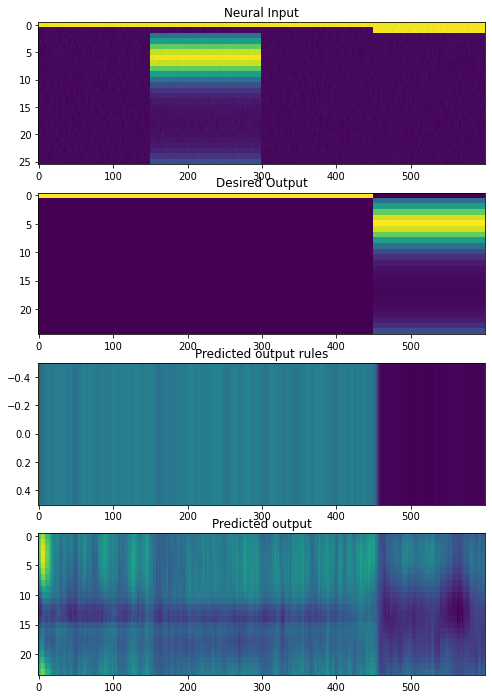

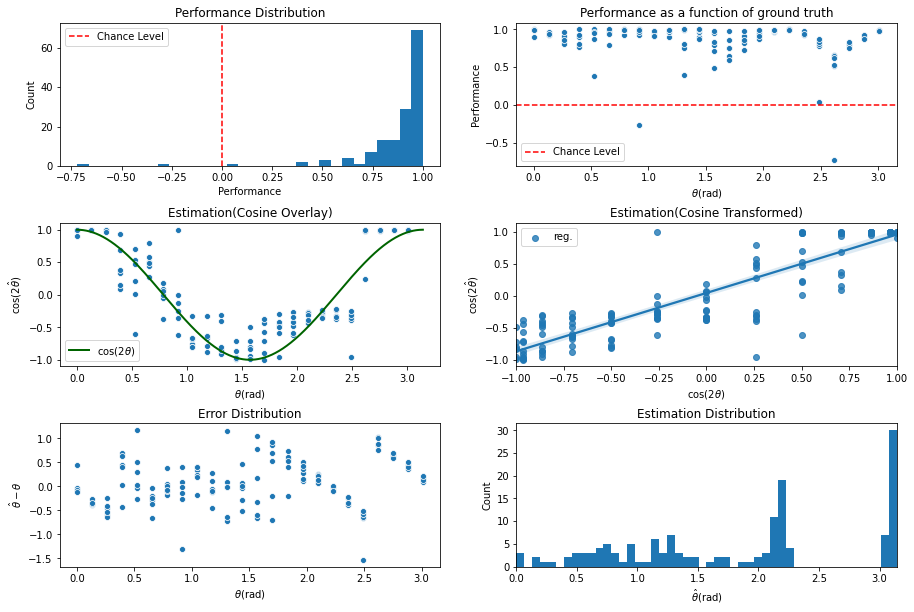

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4600\assets

 Training performance: 
Iter. 4601 | Performance 0.9089 | Loss 0.2790 | Spike loss 2.3142
Testing performance: 
Iter. 4601 | Performance 0.9112 | Loss 0.2790 | Spike loss 2.3445

 Training performance: 
Iter. 4602 | Performance 0.9166 | Loss 0.2779 | Spike loss 2.3445
Testing performance: 
Iter. 4602 | Performance 0.8924 | Loss 0.2778 | Spike loss 2.3508

 Training performance: 
Iter. 4603 | Performance 0.8860 | Loss 0.2782 | Spike loss 2.3338
Testing performance: 
Iter. 4603 | Performance 0.8807 | Loss 0.2784 | Spike loss 2.3763

 Training performance: 
Iter. 4604 | Performance 0.8812 | Loss 0.2782 | Spike loss 2.3370
Testing performance: 
Iter. 4604 | Performance 0.9018 | Loss 0.2777 | Spike loss 2.3697

 Training performance: 
Iter. 4605 | Performance 0.8847 | Loss 0.2785 | Spike loss 2.3326
Testing performance: 
Iter. 4605 | Performance 0.8714 | Loss 0.2781 | Spike loss 2.3688

 Traini


 Training performance: 
Iter. 4647 | Performance 0.9072 | Loss 0.2795 | Spike loss 2.3863
Testing performance: 
Iter. 4647 | Performance 0.9129 | Loss 0.2766 | Spike loss 2.3736

 Training performance: 
Iter. 4648 | Performance 0.9193 | Loss 0.2766 | Spike loss 2.3336
Testing performance: 
Iter. 4648 | Performance 0.8965 | Loss 0.2769 | Spike loss 2.3676

 Training performance: 
Iter. 4649 | Performance 0.8933 | Loss 0.2773 | Spike loss 2.4056
Testing performance: 
Iter. 4649 | Performance 0.8901 | Loss 0.2781 | Spike loss 2.3955

 Training performance: 
Iter. 4650 | Performance 0.9105 | Loss 0.2770 | Spike loss 2.4435
Testing performance: 
Iter. 4650 | Performance 0.9082 | Loss 0.2762 | Spike loss 2.3808

 Training performance: 
Iter. 4651 | Performance 0.8874 | Loss 0.2771 | Spike loss 2.3226
Testing performance: 
Iter. 4651 | Performance 0.9041 | Loss 0.2767 | Spike loss 2.3806

 Training performance: 
Iter. 4652 | Performance 0.9056 | Loss 0.2778 | Spike loss 2.3383
Testing perfor


 Training performance: 
Iter. 4693 | Performance 0.9177 | Loss 0.2763 | Spike loss 2.4704
Testing performance: 
Iter. 4693 | Performance 0.9089 | Loss 0.2762 | Spike loss 2.4051

 Training performance: 
Iter. 4694 | Performance 0.9046 | Loss 0.2757 | Spike loss 2.3154
Testing performance: 
Iter. 4694 | Performance 0.9127 | Loss 0.2763 | Spike loss 2.3802

 Training performance: 
Iter. 4695 | Performance 0.9152 | Loss 0.2758 | Spike loss 2.3186
Testing performance: 
Iter. 4695 | Performance 0.9094 | Loss 0.2768 | Spike loss 2.3799

 Training performance: 
Iter. 4696 | Performance 0.9156 | Loss 0.2757 | Spike loss 2.3972
Testing performance: 
Iter. 4696 | Performance 0.9315 | Loss 0.2744 | Spike loss 2.3770

 Training performance: 
Iter. 4697 | Performance 0.9242 | Loss 0.2760 | Spike loss 2.4065
Testing performance: 
Iter. 4697 | Performance 0.9136 | Loss 0.2768 | Spike loss 2.3578

 Training performance: 
Iter. 4698 | Performance 0.9217 | Loss 0.2756 | Spike loss 2.2453
Testing perfor

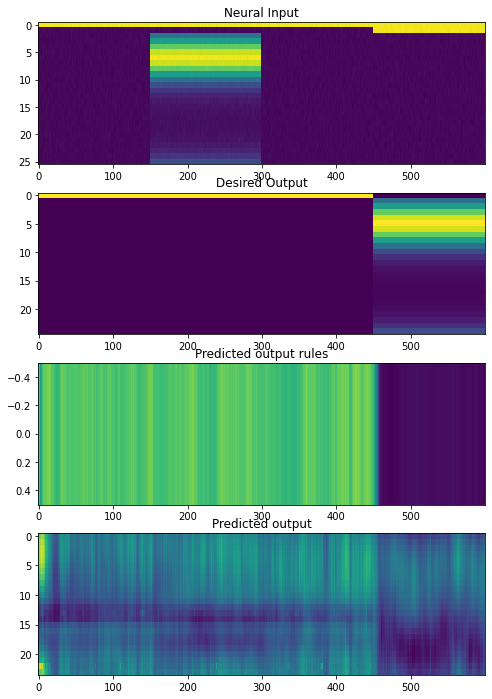

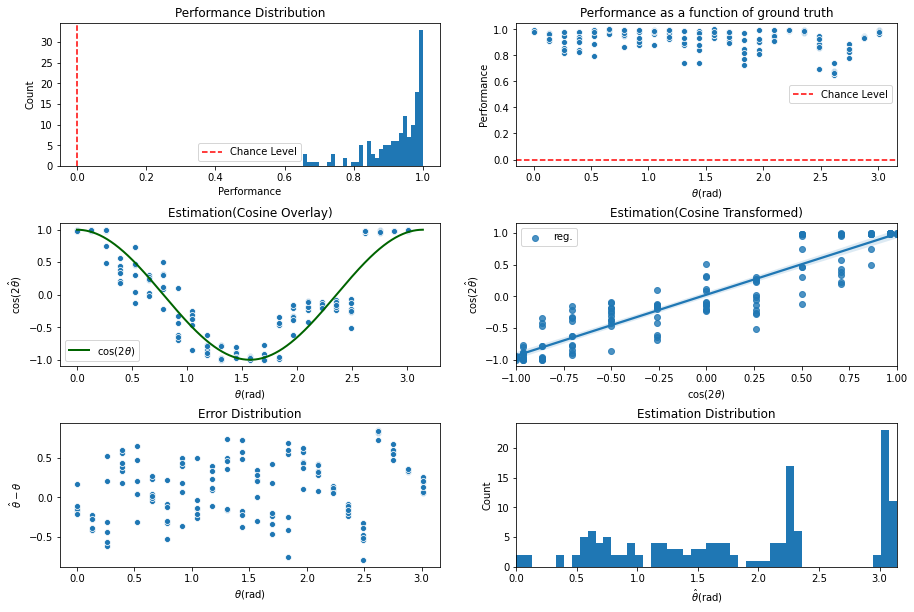

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4700\assets

 Training performance: 
Iter. 4701 | Performance 0.9338 | Loss 0.2747 | Spike loss 2.3759
Testing performance: 
Iter. 4701 | Performance 0.9206 | Loss 0.2755 | Spike loss 2.3876

 Training performance: 
Iter. 4702 | Performance 0.9157 | Loss 0.2754 | Spike loss 2.3124
Testing performance: 
Iter. 4702 | Performance 0.9093 | Loss 0.2765 | Spike loss 2.3859

 Training performance: 
Iter. 4703 | Performance 0.8997 | Loss 0.2764 | Spike loss 2.3324
Testing performance: 
Iter. 4703 | Performance 0.9050 | Loss 0.2754 | Spike loss 2.3998

 Training performance: 
Iter. 4704 | Performance 0.8848 | Loss 0.2769 | Spike loss 2.3708
Testing performance: 
Iter. 4704 | Performance 0.9033 | Loss 0.2759 | Spike loss 2.3921

 Training performance: 
Iter. 4705 | Performance 0.8920 | Loss 0.2765 | Spike loss 2.3365
Testing performance: 
Iter. 4705 | Performance 0.9203 | Loss 0.2753 | Spike loss 2.3779

 Traini


 Training performance: 
Iter. 4747 | Performance 0.8650 | Loss 0.2818 | Spike loss 2.6717
Testing performance: 
Iter. 4747 | Performance 0.8898 | Loss 0.2780 | Spike loss 2.6600

 Training performance: 
Iter. 4748 | Performance 0.8869 | Loss 0.2783 | Spike loss 2.5369
Testing performance: 
Iter. 4748 | Performance 0.8959 | Loss 0.2781 | Spike loss 2.6342

 Training performance: 
Iter. 4749 | Performance 0.8828 | Loss 0.2785 | Spike loss 2.6678
Testing performance: 
Iter. 4749 | Performance 0.9012 | Loss 0.2771 | Spike loss 2.6640

 Training performance: 
Iter. 4750 | Performance 0.9206 | Loss 0.2755 | Spike loss 2.6413
Testing performance: 
Iter. 4750 | Performance 0.9026 | Loss 0.2783 | Spike loss 2.6425

 Training performance: 
Iter. 4751 | Performance 0.9192 | Loss 0.2763 | Spike loss 2.6221
Testing performance: 
Iter. 4751 | Performance 0.9164 | Loss 0.2771 | Spike loss 2.5934

 Training performance: 
Iter. 4752 | Performance 0.9254 | Loss 0.2777 | Spike loss 2.5563
Testing perfor


 Training performance: 
Iter. 4793 | Performance 0.9047 | Loss 0.2770 | Spike loss 2.5527
Testing performance: 
Iter. 4793 | Performance 0.9147 | Loss 0.2771 | Spike loss 2.5641

 Training performance: 
Iter. 4794 | Performance 0.9204 | Loss 0.2759 | Spike loss 2.4910
Testing performance: 
Iter. 4794 | Performance 0.9182 | Loss 0.2766 | Spike loss 2.5397

 Training performance: 
Iter. 4795 | Performance 0.9129 | Loss 0.2761 | Spike loss 2.6086
Testing performance: 
Iter. 4795 | Performance 0.9179 | Loss 0.2757 | Spike loss 2.5512

 Training performance: 
Iter. 4796 | Performance 0.9226 | Loss 0.2756 | Spike loss 2.5418
Testing performance: 
Iter. 4796 | Performance 0.9077 | Loss 0.2770 | Spike loss 2.5504

 Training performance: 
Iter. 4797 | Performance 0.9288 | Loss 0.2754 | Spike loss 2.5760
Testing performance: 
Iter. 4797 | Performance 0.9131 | Loss 0.2757 | Spike loss 2.5628

 Training performance: 
Iter. 4798 | Performance 0.9233 | Loss 0.2755 | Spike loss 2.4420
Testing perfor

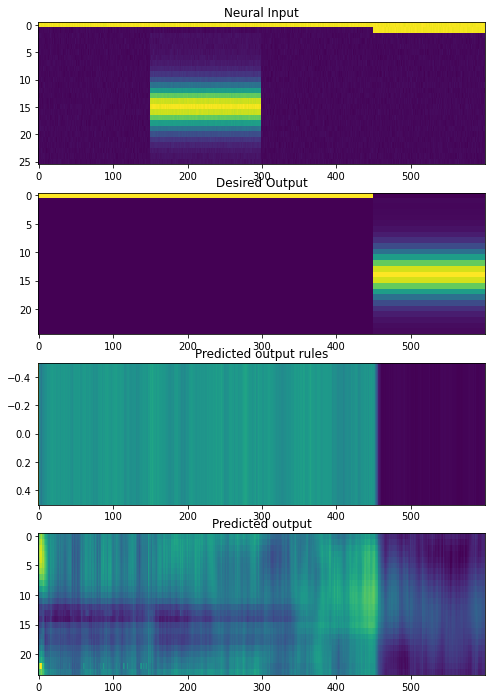

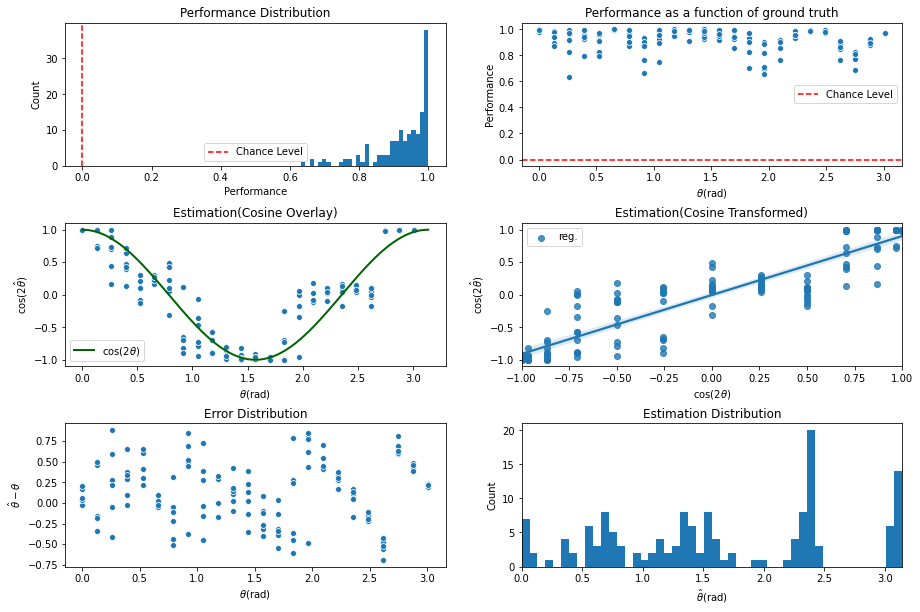

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4800\assets

 Training performance: 
Iter. 4801 | Performance 0.9194 | Loss 0.2762 | Spike loss 2.5576
Testing performance: 
Iter. 4801 | Performance 0.9259 | Loss 0.2755 | Spike loss 2.5619

 Training performance: 
Iter. 4802 | Performance 0.9215 | Loss 0.2755 | Spike loss 2.4979
Testing performance: 
Iter. 4802 | Performance 0.9307 | Loss 0.2746 | Spike loss 2.5537

 Training performance: 
Iter. 4803 | Performance 0.9194 | Loss 0.2749 | Spike loss 2.5337
Testing performance: 
Iter. 4803 | Performance 0.9162 | Loss 0.2746 | Spike loss 2.5794

 Training performance: 
Iter. 4804 | Performance 0.9028 | Loss 0.2761 | Spike loss 2.5705
Testing performance: 
Iter. 4804 | Performance 0.9117 | Loss 0.2762 | Spike loss 2.5821

 Training performance: 
Iter. 4805 | Performance 0.9278 | Loss 0.2746 | Spike loss 2.5558
Testing performance: 
Iter. 4805 | Performance 0.9239 | Loss 0.2756 | Spike loss 2.5741

 Traini


 Training performance: 
Iter. 4847 | Performance 0.9329 | Loss 0.2752 | Spike loss 2.4424
Testing performance: 
Iter. 4847 | Performance 0.9226 | Loss 0.2744 | Spike loss 2.4257

 Training performance: 
Iter. 4848 | Performance 0.9320 | Loss 0.2738 | Spike loss 2.4136
Testing performance: 
Iter. 4848 | Performance 0.9348 | Loss 0.2744 | Spike loss 2.4125

 Training performance: 
Iter. 4849 | Performance 0.9237 | Loss 0.2747 | Spike loss 2.3880
Testing performance: 
Iter. 4849 | Performance 0.9325 | Loss 0.2746 | Spike loss 2.4316

 Training performance: 
Iter. 4850 | Performance 0.9254 | Loss 0.2758 | Spike loss 2.3718
Testing performance: 
Iter. 4850 | Performance 0.9218 | Loss 0.2754 | Spike loss 2.4242

 Training performance: 
Iter. 4851 | Performance 0.9361 | Loss 0.2732 | Spike loss 2.3152
Testing performance: 
Iter. 4851 | Performance 0.9220 | Loss 0.2753 | Spike loss 2.4218

 Training performance: 
Iter. 4852 | Performance 0.9113 | Loss 0.2754 | Spike loss 2.3846
Testing perfor


 Training performance: 
Iter. 4893 | Performance 0.9325 | Loss 0.2735 | Spike loss 2.4855
Testing performance: 
Iter. 4893 | Performance 0.9272 | Loss 0.2733 | Spike loss 2.4612

 Training performance: 
Iter. 4894 | Performance 0.9334 | Loss 0.2736 | Spike loss 2.4158
Testing performance: 
Iter. 4894 | Performance 0.9462 | Loss 0.2730 | Spike loss 2.4650

 Training performance: 
Iter. 4895 | Performance 0.9335 | Loss 0.2733 | Spike loss 2.3802
Testing performance: 
Iter. 4895 | Performance 0.9459 | Loss 0.2716 | Spike loss 2.4567

 Training performance: 
Iter. 4896 | Performance 0.9340 | Loss 0.2728 | Spike loss 2.3659
Testing performance: 
Iter. 4896 | Performance 0.9341 | Loss 0.2744 | Spike loss 2.4538

 Training performance: 
Iter. 4897 | Performance 0.9362 | Loss 0.2742 | Spike loss 2.4424
Testing performance: 
Iter. 4897 | Performance 0.9312 | Loss 0.2744 | Spike loss 2.4724

 Training performance: 
Iter. 4898 | Performance 0.9387 | Loss 0.2734 | Spike loss 2.5304
Testing perfor

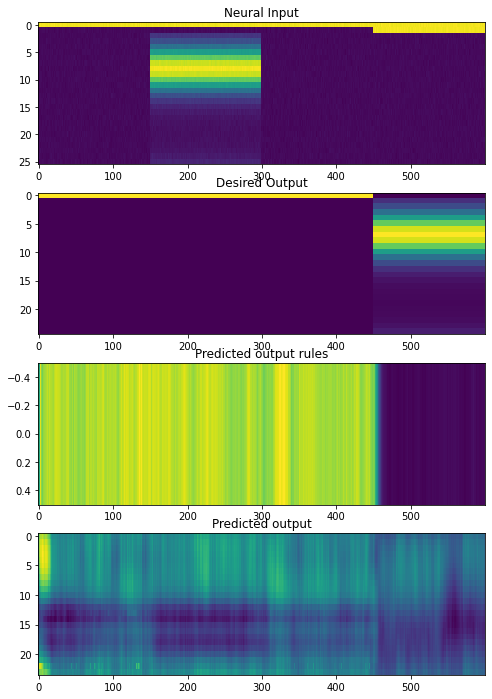

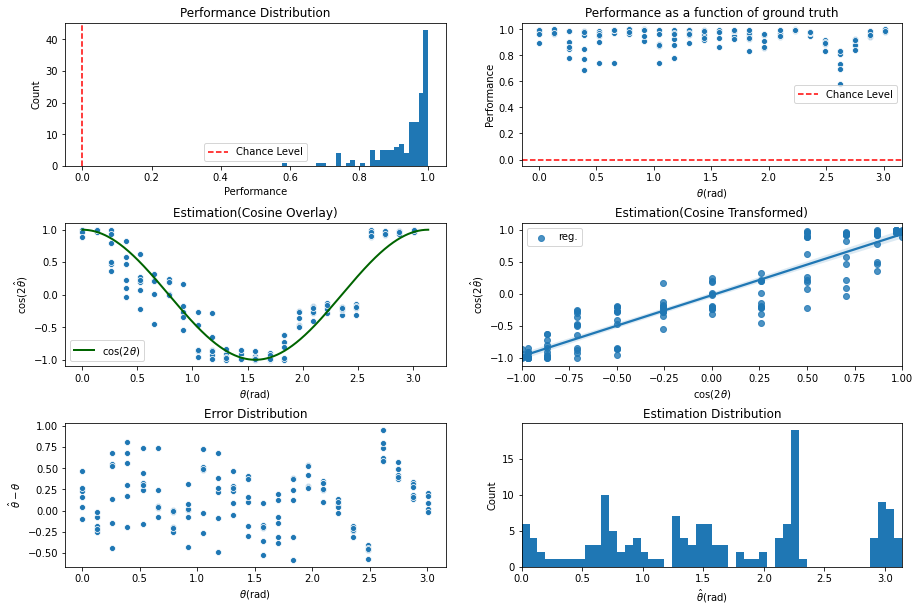

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter4900\assets

 Training performance: 
Iter. 4901 | Performance 0.9226 | Loss 0.2740 | Spike loss 2.3957
Testing performance: 
Iter. 4901 | Performance 0.9325 | Loss 0.2725 | Spike loss 2.4883

 Training performance: 
Iter. 4902 | Performance 0.9289 | Loss 0.2728 | Spike loss 2.4126
Testing performance: 
Iter. 4902 | Performance 0.9311 | Loss 0.2730 | Spike loss 2.4911

 Training performance: 
Iter. 4903 | Performance 0.9256 | Loss 0.2728 | Spike loss 2.4186
Testing performance: 
Iter. 4903 | Performance 0.9456 | Loss 0.2715 | Spike loss 2.4672

 Training performance: 
Iter. 4904 | Performance 0.9324 | Loss 0.2726 | Spike loss 2.3451
Testing performance: 
Iter. 4904 | Performance 0.9334 | Loss 0.2727 | Spike loss 2.4779

 Training performance: 
Iter. 4905 | Performance 0.9422 | Loss 0.2717 | Spike loss 2.3968
Testing performance: 
Iter. 4905 | Performance 0.9432 | Loss 0.2724 | Spike loss 2.4498

 Traini


 Training performance: 
Iter. 4947 | Performance 0.9406 | Loss 0.2721 | Spike loss 2.5372
Testing performance: 
Iter. 4947 | Performance 0.9227 | Loss 0.2746 | Spike loss 2.5368

 Training performance: 
Iter. 4948 | Performance 0.9483 | Loss 0.2715 | Spike loss 2.5148
Testing performance: 
Iter. 4948 | Performance 0.9322 | Loss 0.2731 | Spike loss 2.5416

 Training performance: 
Iter. 4949 | Performance 0.9505 | Loss 0.2722 | Spike loss 2.5644
Testing performance: 
Iter. 4949 | Performance 0.9268 | Loss 0.2746 | Spike loss 2.5308

 Training performance: 
Iter. 4950 | Performance 0.9260 | Loss 0.2745 | Spike loss 2.5230
Testing performance: 
Iter. 4950 | Performance 0.9491 | Loss 0.2715 | Spike loss 2.5505

 Training performance: 
Iter. 4951 | Performance 0.9425 | Loss 0.2713 | Spike loss 2.4502
Testing performance: 
Iter. 4951 | Performance 0.9448 | Loss 0.2716 | Spike loss 2.5491

 Training performance: 
Iter. 4952 | Performance 0.9427 | Loss 0.2714 | Spike loss 2.4424
Testing perfor


 Training performance: 
Iter. 4993 | Performance 0.9473 | Loss 0.2729 | Spike loss 2.6486
Testing performance: 
Iter. 4993 | Performance 0.9350 | Loss 0.2734 | Spike loss 2.6410

 Training performance: 
Iter. 4994 | Performance 0.9344 | Loss 0.2735 | Spike loss 2.6676
Testing performance: 
Iter. 4994 | Performance 0.9370 | Loss 0.2748 | Spike loss 2.6380

 Training performance: 
Iter. 4995 | Performance 0.9456 | Loss 0.2737 | Spike loss 2.5890
Testing performance: 
Iter. 4995 | Performance 0.9454 | Loss 0.2733 | Spike loss 2.6332

 Training performance: 
Iter. 4996 | Performance 0.9371 | Loss 0.2758 | Spike loss 2.5598
Testing performance: 
Iter. 4996 | Performance 0.9365 | Loss 0.2736 | Spike loss 2.6214

 Training performance: 
Iter. 4997 | Performance 0.9421 | Loss 0.2723 | Spike loss 2.5368
Testing performance: 
Iter. 4997 | Performance 0.9281 | Loss 0.2750 | Spike loss 2.6430

 Training performance: 
Iter. 4998 | Performance 0.9344 | Loss 0.2736 | Spike loss 2.5556
Testing perfor

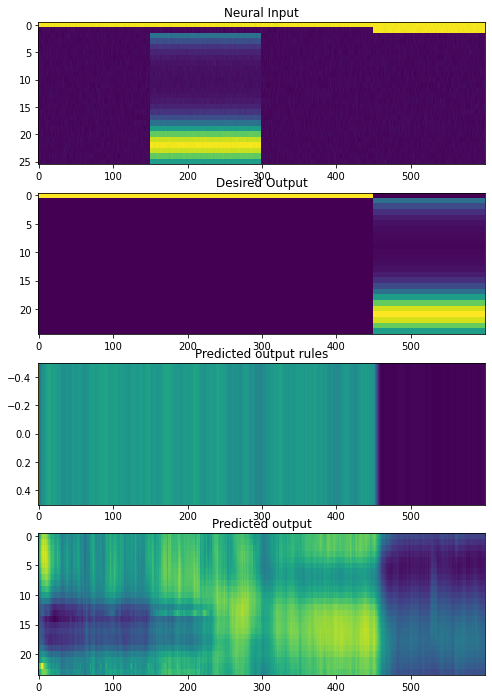

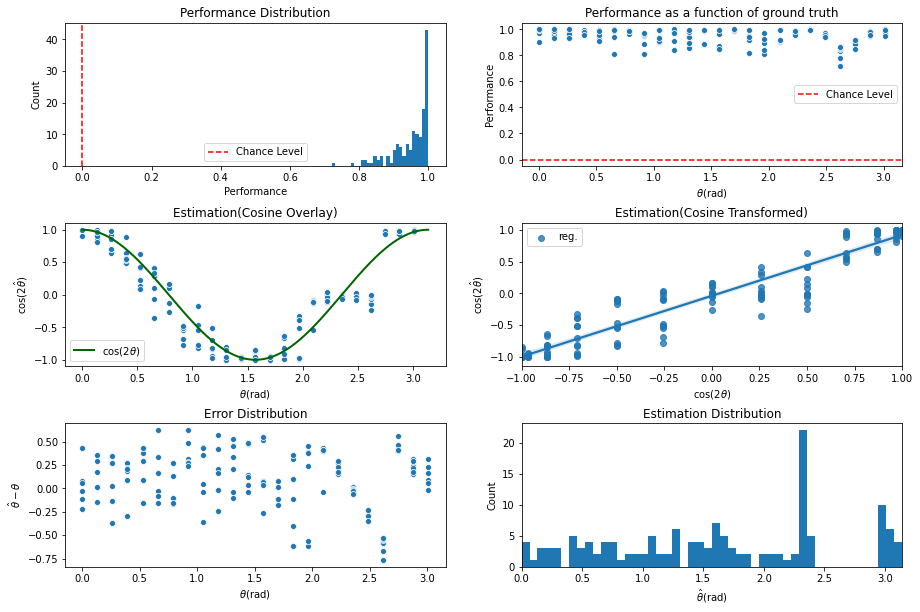

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter5000\assets

 Training performance: 
Iter. 5001 | Performance 0.9440 | Loss 0.2727 | Spike loss 2.7178
Testing performance: 
Iter. 5001 | Performance 0.9343 | Loss 0.2739 | Spike loss 2.6182

 Training performance: 
Iter. 5002 | Performance 0.9395 | Loss 0.2731 | Spike loss 2.6682
Testing performance: 
Iter. 5002 | Performance 0.9415 | Loss 0.2721 | Spike loss 2.6455

 Training performance: 
Iter. 5003 | Performance 0.9501 | Loss 0.2715 | Spike loss 2.5619
Testing performance: 
Iter. 5003 | Performance 0.9421 | Loss 0.2745 | Spike loss 2.6402

 Training performance: 
Iter. 5004 | Performance 0.9388 | Loss 0.2736 | Spike loss 2.5167
Testing performance: 
Iter. 5004 | Performance 0.9372 | Loss 0.2765 | Spike loss 2.6447

 Training performance: 
Iter. 5005 | Performance 0.9429 | Loss 0.2759 | Spike loss 2.5531
Testing performance: 
Iter. 5005 | Performance 0.9393 | Loss 0.2751 | Spike loss 2.6182

 Traini


 Training performance: 
Iter. 5047 | Performance 0.9437 | Loss 0.2720 | Spike loss 2.4778
Testing performance: 
Iter. 5047 | Performance 0.9308 | Loss 0.2730 | Spike loss 2.5376

 Training performance: 
Iter. 5048 | Performance 0.9387 | Loss 0.2719 | Spike loss 2.5079
Testing performance: 
Iter. 5048 | Performance 0.9315 | Loss 0.2728 | Spike loss 2.5188

 Training performance: 
Iter. 5049 | Performance 0.9310 | Loss 0.2726 | Spike loss 2.4606
Testing performance: 
Iter. 5049 | Performance 0.9261 | Loss 0.2734 | Spike loss 2.5212

 Training performance: 
Iter. 5050 | Performance 0.9453 | Loss 0.2715 | Spike loss 2.5662
Testing performance: 
Iter. 5050 | Performance 0.9451 | Loss 0.2723 | Spike loss 2.5298

 Training performance: 
Iter. 5051 | Performance 0.9362 | Loss 0.2729 | Spike loss 2.5043
Testing performance: 
Iter. 5051 | Performance 0.9438 | Loss 0.2728 | Spike loss 2.5080

 Training performance: 
Iter. 5052 | Performance 0.9397 | Loss 0.2729 | Spike loss 2.5118
Testing perfor


 Training performance: 
Iter. 5093 | Performance 0.9240 | Loss 0.2738 | Spike loss 2.5377
Testing performance: 
Iter. 5093 | Performance 0.9200 | Loss 0.2749 | Spike loss 2.6478

 Training performance: 
Iter. 5094 | Performance 0.9448 | Loss 0.2727 | Spike loss 2.5587
Testing performance: 
Iter. 5094 | Performance 0.9417 | Loss 0.2729 | Spike loss 2.6168

 Training performance: 
Iter. 5095 | Performance 0.9297 | Loss 0.2736 | Spike loss 2.6494
Testing performance: 
Iter. 5095 | Performance 0.9239 | Loss 0.2752 | Spike loss 2.6222

 Training performance: 
Iter. 5096 | Performance 0.9366 | Loss 0.2736 | Spike loss 2.6909
Testing performance: 
Iter. 5096 | Performance 0.9318 | Loss 0.2745 | Spike loss 2.6110

 Training performance: 
Iter. 5097 | Performance 0.9493 | Loss 0.2720 | Spike loss 2.5468
Testing performance: 
Iter. 5097 | Performance 0.9361 | Loss 0.2744 | Spike loss 2.5868

 Training performance: 
Iter. 5098 | Performance 0.9433 | Loss 0.2724 | Spike loss 2.5195
Testing perfor

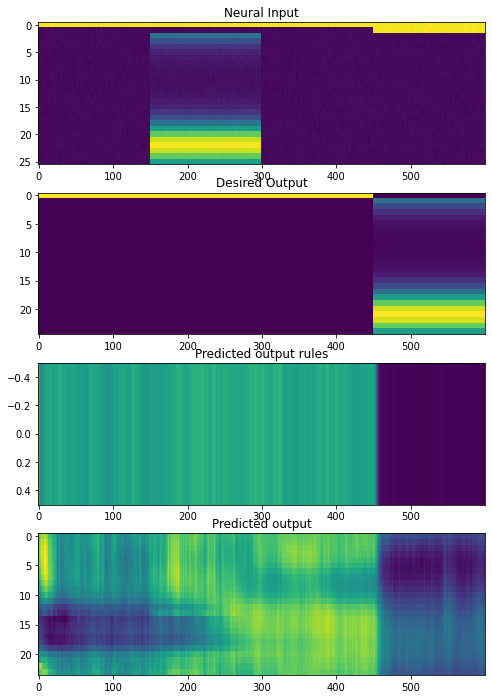

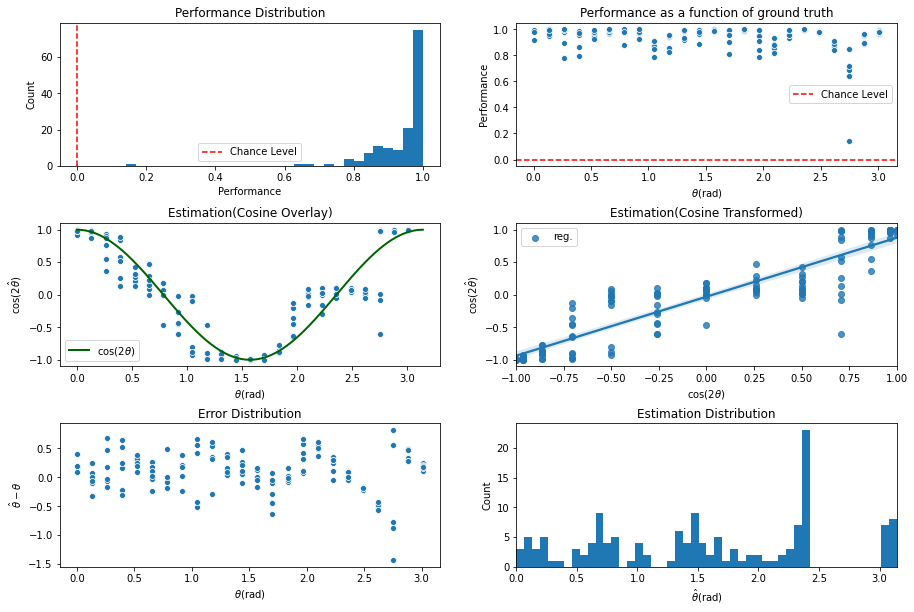

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter5100\assets

 Training performance: 
Iter. 5101 | Performance 0.9208 | Loss 0.2747 | Spike loss 2.6086
Testing performance: 
Iter. 5101 | Performance 0.9135 | Loss 0.2748 | Spike loss 2.6625

 Training performance: 
Iter. 5102 | Performance 0.9450 | Loss 0.2710 | Spike loss 2.6173
Testing performance: 
Iter. 5102 | Performance 0.9027 | Loss 0.2753 | Spike loss 2.6641

 Training performance: 
Iter. 5103 | Performance 0.9251 | Loss 0.2735 | Spike loss 2.6017
Testing performance: 
Iter. 5103 | Performance 0.9262 | Loss 0.2741 | Spike loss 2.7025

 Training performance: 
Iter. 5104 | Performance 0.9147 | Loss 0.2751 | Spike loss 2.6883
Testing performance: 
Iter. 5104 | Performance 0.9229 | Loss 0.2737 | Spike loss 2.7277

 Training performance: 
Iter. 5105 | Performance 0.9059 | Loss 0.2755 | Spike loss 2.6211
Testing performance: 
Iter. 5105 | Performance 0.9178 | Loss 0.2745 | Spike loss 2.7365

 Traini


 Training performance: 
Iter. 5147 | Performance 0.9233 | Loss 0.2739 | Spike loss 2.7564
Testing performance: 
Iter. 5147 | Performance 0.9394 | Loss 0.2734 | Spike loss 2.7137

 Training performance: 
Iter. 5148 | Performance 0.9204 | Loss 0.2748 | Spike loss 2.6465
Testing performance: 
Iter. 5148 | Performance 0.9427 | Loss 0.2736 | Spike loss 2.6764

 Training performance: 
Iter. 5149 | Performance 0.9462 | Loss 0.2721 | Spike loss 2.6020
Testing performance: 
Iter. 5149 | Performance 0.9497 | Loss 0.2722 | Spike loss 2.6685

 Training performance: 
Iter. 5150 | Performance 0.9439 | Loss 0.2731 | Spike loss 2.6539
Testing performance: 
Iter. 5150 | Performance 0.9464 | Loss 0.2729 | Spike loss 2.6958

 Training performance: 
Iter. 5151 | Performance 0.9328 | Loss 0.2730 | Spike loss 2.6362
Testing performance: 
Iter. 5151 | Performance 0.9390 | Loss 0.2737 | Spike loss 2.6626

 Training performance: 
Iter. 5152 | Performance 0.9395 | Loss 0.2746 | Spike loss 2.6568
Testing perfor


 Training performance: 
Iter. 5193 | Performance 0.9325 | Loss 0.2733 | Spike loss 2.6811
Testing performance: 
Iter. 5193 | Performance 0.9415 | Loss 0.2714 | Spike loss 2.6327

 Training performance: 
Iter. 5194 | Performance 0.9295 | Loss 0.2730 | Spike loss 2.6036
Testing performance: 
Iter. 5194 | Performance 0.9342 | Loss 0.2724 | Spike loss 2.6376

 Training performance: 
Iter. 5195 | Performance 0.9286 | Loss 0.2730 | Spike loss 2.5801
Testing performance: 
Iter. 5195 | Performance 0.9372 | Loss 0.2727 | Spike loss 2.6192

 Training performance: 
Iter. 5196 | Performance 0.9344 | Loss 0.2725 | Spike loss 2.5664
Testing performance: 
Iter. 5196 | Performance 0.9438 | Loss 0.2720 | Spike loss 2.6029

 Training performance: 
Iter. 5197 | Performance 0.9318 | Loss 0.2738 | Spike loss 2.5735
Testing performance: 
Iter. 5197 | Performance 0.9369 | Loss 0.2727 | Spike loss 2.6199

 Training performance: 
Iter. 5198 | Performance 0.9476 | Loss 0.2714 | Spike loss 2.5671
Testing perfor

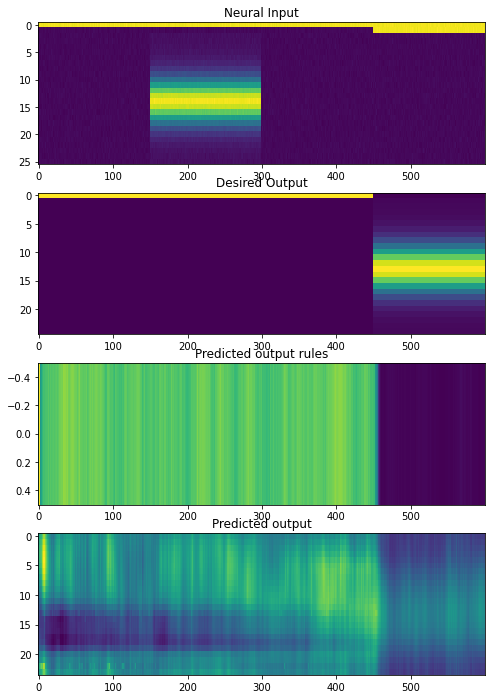

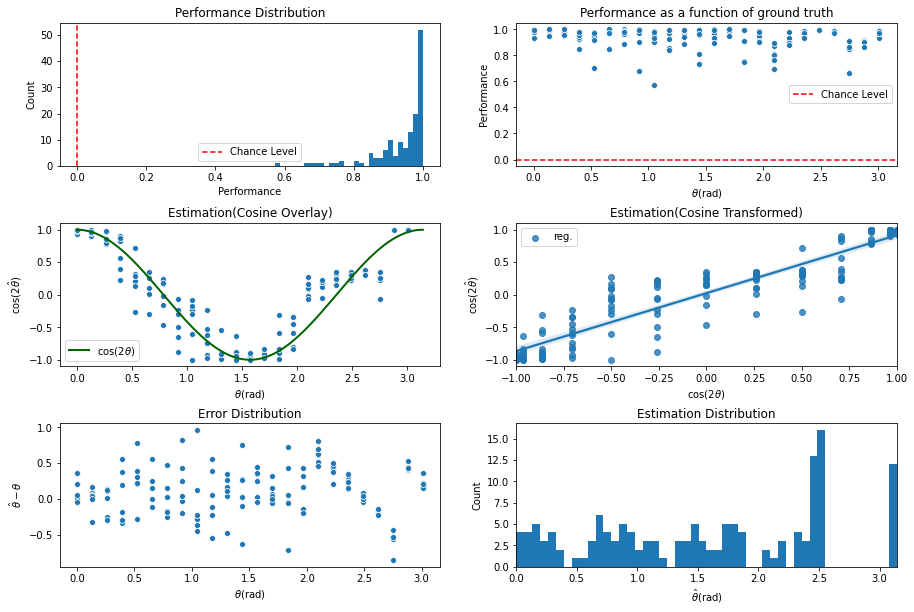

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter5200\assets

 Training performance: 
Iter. 5201 | Performance 0.9455 | Loss 0.2711 | Spike loss 2.6531
Testing performance: 
Iter. 5201 | Performance 0.9345 | Loss 0.2731 | Spike loss 2.6076

 Training performance: 
Iter. 5202 | Performance 0.9428 | Loss 0.2719 | Spike loss 2.5716
Testing performance: 
Iter. 5202 | Performance 0.9538 | Loss 0.2711 | Spike loss 2.6102

 Training performance: 
Iter. 5203 | Performance 0.9613 | Loss 0.2709 | Spike loss 2.6183
Testing performance: 
Iter. 5203 | Performance 0.9420 | Loss 0.2720 | Spike loss 2.6183

 Training performance: 
Iter. 5204 | Performance 0.9495 | Loss 0.2712 | Spike loss 2.5703
Testing performance: 
Iter. 5204 | Performance 0.9402 | Loss 0.2729 | Spike loss 2.6022

 Training performance: 
Iter. 5205 | Performance 0.9489 | Loss 0.2719 | Spike loss 2.6227
Testing performance: 
Iter. 5205 | Performance 0.9254 | Loss 0.2729 | Spike loss 2.6093

 Traini


 Training performance: 
Iter. 5247 | Performance 0.9160 | Loss 0.2745 | Spike loss 2.7755
Testing performance: 
Iter. 5247 | Performance 0.9105 | Loss 0.2766 | Spike loss 2.8531

 Training performance: 
Iter. 5248 | Performance 0.9074 | Loss 0.2774 | Spike loss 2.9577
Testing performance: 
Iter. 5248 | Performance 0.9029 | Loss 0.2771 | Spike loss 2.8605

 Training performance: 
Iter. 5249 | Performance 0.8902 | Loss 0.2781 | Spike loss 2.8396
Testing performance: 
Iter. 5249 | Performance 0.8922 | Loss 0.2770 | Spike loss 2.9383

 Training performance: 
Iter. 5250 | Performance 0.8489 | Loss 0.2817 | Spike loss 2.9235
Testing performance: 
Iter. 5250 | Performance 0.8826 | Loss 0.2787 | Spike loss 2.9788

 Training performance: 
Iter. 5251 | Performance 0.8514 | Loss 0.2813 | Spike loss 2.9666
Testing performance: 
Iter. 5251 | Performance 0.9139 | Loss 0.2765 | Spike loss 2.9499

 Training performance: 
Iter. 5252 | Performance 0.8909 | Loss 0.2795 | Spike loss 3.0588
Testing perfor


 Training performance: 
Iter. 5293 | Performance 0.9221 | Loss 0.2736 | Spike loss 2.5039
Testing performance: 
Iter. 5293 | Performance 0.9282 | Loss 0.2729 | Spike loss 2.5298

 Training performance: 
Iter. 5294 | Performance 0.9306 | Loss 0.2728 | Spike loss 2.5001
Testing performance: 
Iter. 5294 | Performance 0.9335 | Loss 0.2722 | Spike loss 2.5305

 Training performance: 
Iter. 5295 | Performance 0.9274 | Loss 0.2731 | Spike loss 2.5003
Testing performance: 
Iter. 5295 | Performance 0.9344 | Loss 0.2732 | Spike loss 2.5491

 Training performance: 
Iter. 5296 | Performance 0.9416 | Loss 0.2717 | Spike loss 2.4692
Testing performance: 
Iter. 5296 | Performance 0.9384 | Loss 0.2718 | Spike loss 2.5572

 Training performance: 
Iter. 5297 | Performance 0.9326 | Loss 0.2727 | Spike loss 2.5556
Testing performance: 
Iter. 5297 | Performance 0.9299 | Loss 0.2729 | Spike loss 2.5451

 Training performance: 
Iter. 5298 | Performance 0.9468 | Loss 0.2717 | Spike loss 2.5496
Testing perfor

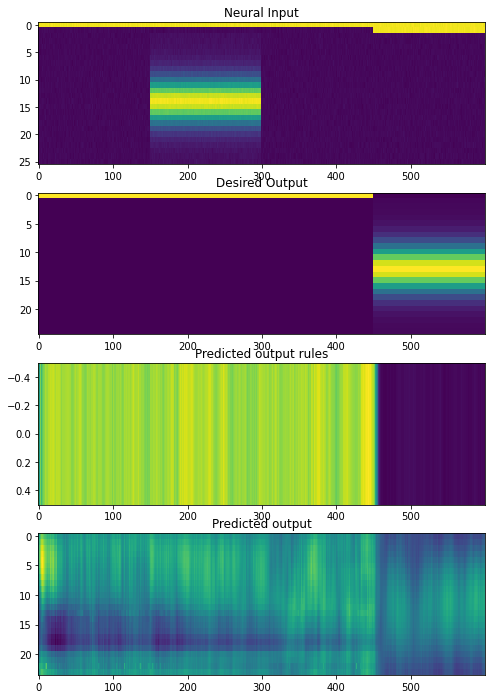

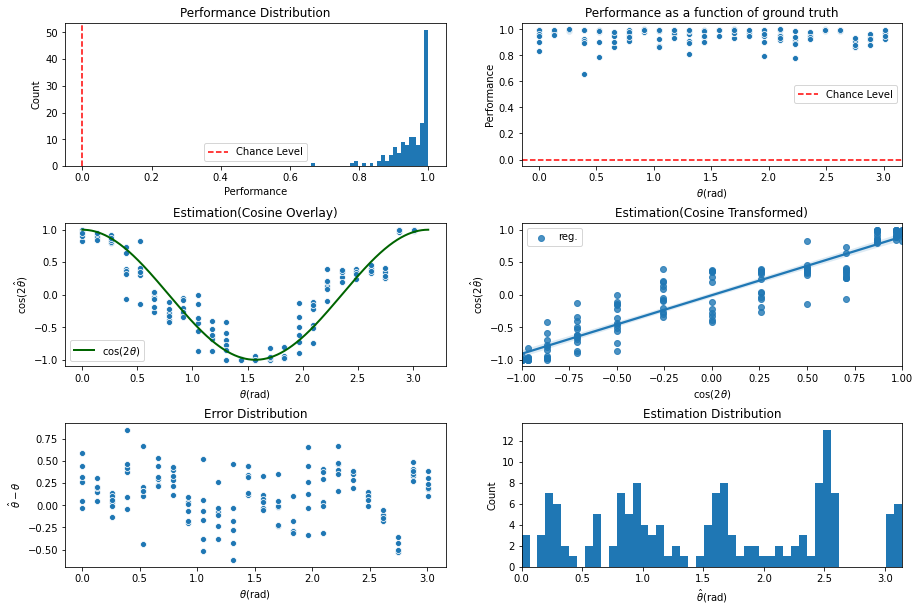

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter5300\assets

 Training performance: 
Iter. 5301 | Performance 0.9498 | Loss 0.2707 | Spike loss 2.4492
Testing performance: 
Iter. 5301 | Performance 0.9298 | Loss 0.2739 | Spike loss 2.5111

 Training performance: 
Iter. 5302 | Performance 0.9448 | Loss 0.2717 | Spike loss 2.4916
Testing performance: 
Iter. 5302 | Performance 0.9447 | Loss 0.2720 | Spike loss 2.5238

 Training performance: 
Iter. 5303 | Performance 0.9441 | Loss 0.2721 | Spike loss 2.6083
Testing performance: 
Iter. 5303 | Performance 0.9511 | Loss 0.2728 | Spike loss 2.5012

 Training performance: 
Iter. 5304 | Performance 0.9465 | Loss 0.2726 | Spike loss 2.5398
Testing performance: 
Iter. 5304 | Performance 0.9482 | Loss 0.2720 | Spike loss 2.5281

 Training performance: 
Iter. 5305 | Performance 0.9547 | Loss 0.2709 | Spike loss 2.5135
Testing performance: 
Iter. 5305 | Performance 0.9433 | Loss 0.2727 | Spike loss 2.5273

 Traini


 Training performance: 
Iter. 5347 | Performance 0.9522 | Loss 0.2710 | Spike loss 2.5065
Testing performance: 
Iter. 5347 | Performance 0.9513 | Loss 0.2704 | Spike loss 2.4751

 Training performance: 
Iter. 5348 | Performance 0.9609 | Loss 0.2700 | Spike loss 2.4112
Testing performance: 
Iter. 5348 | Performance 0.9436 | Loss 0.2714 | Spike loss 2.4692

 Training performance: 
Iter. 5349 | Performance 0.9564 | Loss 0.2704 | Spike loss 2.4595
Testing performance: 
Iter. 5349 | Performance 0.9488 | Loss 0.2710 | Spike loss 2.4828

 Training performance: 
Iter. 5350 | Performance 0.9513 | Loss 0.2711 | Spike loss 2.4396
Testing performance: 
Iter. 5350 | Performance 0.9397 | Loss 0.2718 | Spike loss 2.4642

 Training performance: 
Iter. 5351 | Performance 0.9457 | Loss 0.2712 | Spike loss 2.5238
Testing performance: 
Iter. 5351 | Performance 0.9516 | Loss 0.2702 | Spike loss 2.4681

 Training performance: 
Iter. 5352 | Performance 0.9572 | Loss 0.2701 | Spike loss 2.4931
Testing perfor


 Training performance: 
Iter. 5393 | Performance 0.9583 | Loss 0.2694 | Spike loss 2.4931
Testing performance: 
Iter. 5393 | Performance 0.9538 | Loss 0.2710 | Spike loss 2.4899

 Training performance: 
Iter. 5394 | Performance 0.9524 | Loss 0.2710 | Spike loss 2.5571
Testing performance: 
Iter. 5394 | Performance 0.9505 | Loss 0.2710 | Spike loss 2.5026

 Training performance: 
Iter. 5395 | Performance 0.9336 | Loss 0.2720 | Spike loss 2.5209
Testing performance: 
Iter. 5395 | Performance 0.9463 | Loss 0.2709 | Spike loss 2.4967

 Training performance: 
Iter. 5396 | Performance 0.9596 | Loss 0.2695 | Spike loss 2.5050
Testing performance: 
Iter. 5396 | Performance 0.9425 | Loss 0.2711 | Spike loss 2.5082

 Training performance: 
Iter. 5397 | Performance 0.9453 | Loss 0.2715 | Spike loss 2.5526
Testing performance: 
Iter. 5397 | Performance 0.9382 | Loss 0.2714 | Spike loss 2.5030

 Training performance: 
Iter. 5398 | Performance 0.9355 | Loss 0.2716 | Spike loss 2.5435
Testing perfor

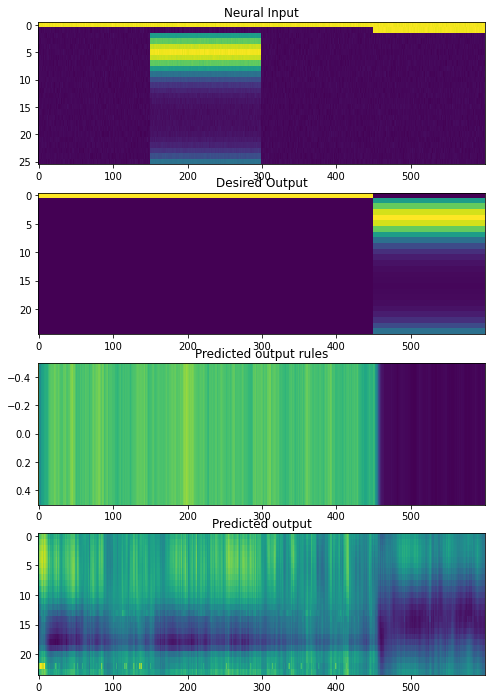

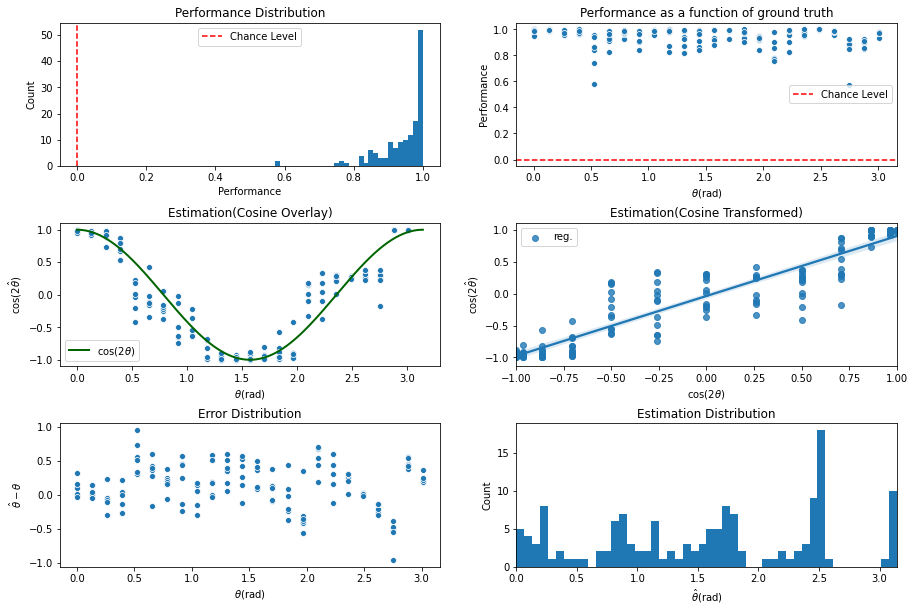

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter5400\assets

 Training performance: 
Iter. 5401 | Performance 0.9394 | Loss 0.2710 | Spike loss 2.5826
Testing performance: 
Iter. 5401 | Performance 0.9473 | Loss 0.2709 | Spike loss 2.5046

 Training performance: 
Iter. 5402 | Performance 0.9456 | Loss 0.2711 | Spike loss 2.4394
Testing performance: 
Iter. 5402 | Performance 0.9440 | Loss 0.2710 | Spike loss 2.5022

 Training performance: 
Iter. 5403 | Performance 0.9567 | Loss 0.2699 | Spike loss 2.4860
Testing performance: 
Iter. 5403 | Performance 0.9490 | Loss 0.2706 | Spike loss 2.5075

 Training performance: 
Iter. 5404 | Performance 0.9397 | Loss 0.2724 | Spike loss 2.5815
Testing performance: 
Iter. 5404 | Performance 0.9476 | Loss 0.2708 | Spike loss 2.5050

 Training performance: 
Iter. 5405 | Performance 0.9499 | Loss 0.2704 | Spike loss 2.4964
Testing performance: 
Iter. 5405 | Performance 0.9451 | Loss 0.2712 | Spike loss 2.5056

 Traini


 Training performance: 
Iter. 5447 | Performance 0.9549 | Loss 0.2703 | Spike loss 2.4826
Testing performance: 
Iter. 5447 | Performance 0.9421 | Loss 0.2718 | Spike loss 2.4986

 Training performance: 
Iter. 5448 | Performance 0.9513 | Loss 0.2703 | Spike loss 2.4441
Testing performance: 
Iter. 5448 | Performance 0.9448 | Loss 0.2709 | Spike loss 2.5203

 Training performance: 
Iter. 5449 | Performance 0.9479 | Loss 0.2712 | Spike loss 2.5511
Testing performance: 
Iter. 5449 | Performance 0.9464 | Loss 0.2710 | Spike loss 2.5131

 Training performance: 
Iter. 5450 | Performance 0.9489 | Loss 0.2701 | Spike loss 2.4495
Testing performance: 
Iter. 5450 | Performance 0.9460 | Loss 0.2716 | Spike loss 2.5040

 Training performance: 
Iter. 5451 | Performance 0.9481 | Loss 0.2700 | Spike loss 2.4158
Testing performance: 
Iter. 5451 | Performance 0.9496 | Loss 0.2700 | Spike loss 2.5203

 Training performance: 
Iter. 5452 | Performance 0.9471 | Loss 0.2707 | Spike loss 2.5403
Testing perfor


 Training performance: 
Iter. 5493 | Performance 0.9534 | Loss 0.2701 | Spike loss 2.5729
Testing performance: 
Iter. 5493 | Performance 0.9504 | Loss 0.2699 | Spike loss 2.5027

 Training performance: 
Iter. 5494 | Performance 0.9468 | Loss 0.2707 | Spike loss 2.5339
Testing performance: 
Iter. 5494 | Performance 0.9445 | Loss 0.2700 | Spike loss 2.5230

 Training performance: 
Iter. 5495 | Performance 0.9504 | Loss 0.2701 | Spike loss 2.5588
Testing performance: 
Iter. 5495 | Performance 0.9462 | Loss 0.2707 | Spike loss 2.5111

 Training performance: 
Iter. 5496 | Performance 0.9514 | Loss 0.2707 | Spike loss 2.5124
Testing performance: 
Iter. 5496 | Performance 0.9449 | Loss 0.2700 | Spike loss 2.5232

 Training performance: 
Iter. 5497 | Performance 0.9421 | Loss 0.2707 | Spike loss 2.4907
Testing performance: 
Iter. 5497 | Performance 0.9566 | Loss 0.2693 | Spike loss 2.5022

 Training performance: 
Iter. 5498 | Performance 0.9482 | Loss 0.2703 | Spike loss 2.4593
Testing perfor

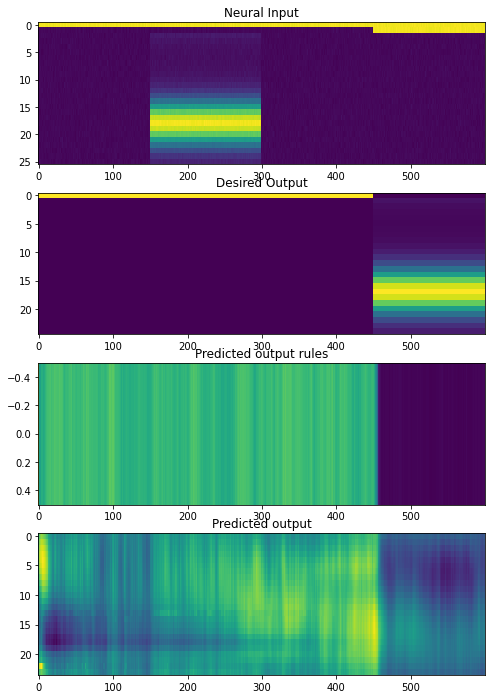

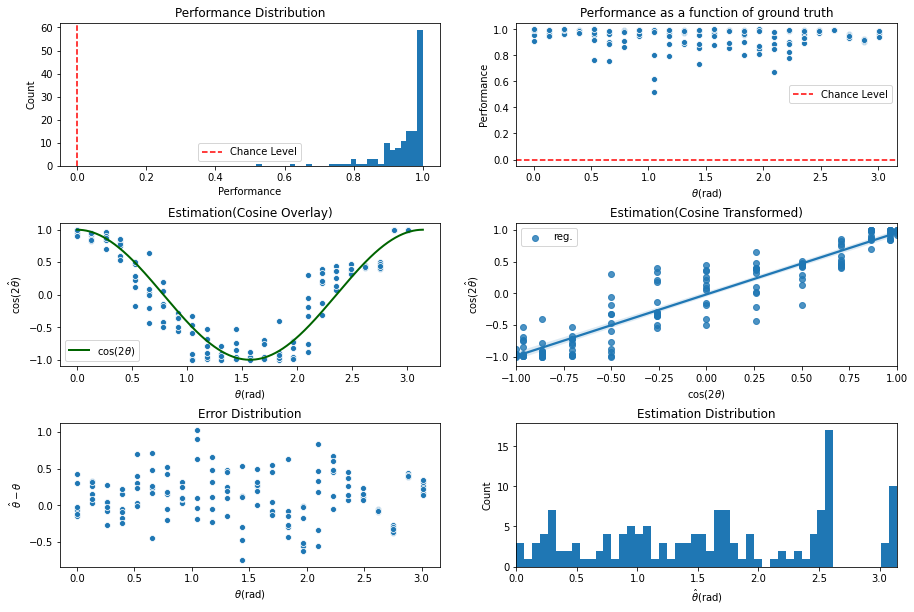

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622_24ori/cont_iter5500\assets

 Training performance: 
Iter. 5501 | Performance 0.9613 | Loss 0.2690 | Spike loss 2.4347
Testing performance: 
Iter. 5501 | Performance 0.9506 | Loss 0.2704 | Spike loss 2.5019

 Training performance: 
Iter. 5502 | Performance 0.9489 | Loss 0.2703 | Spike loss 2.3784
Testing performance: 
Iter. 5502 | Performance 0.9411 | Loss 0.2714 | Spike loss 2.5084

 Training performance: 
Iter. 5503 | Performance 0.9567 | Loss 0.2698 | Spike loss 2.4460
Testing performance: 
Iter. 5503 | Performance 0.9539 | Loss 0.2706 | Spike loss 2.4957

 Training performance: 
Iter. 5504 | Performance 0.9590 | Loss 0.2703 | Spike loss 2.5108
Testing performance: 
Iter. 5504 | Performance 0.9555 | Loss 0.2699 | Spike loss 2.4998

 Training performance: 
Iter. 5505 | Performance 0.9525 | Loss 0.2690 | Spike loss 2.3914
Testing performance: 
Iter. 5505 | Performance 0.9461 | Loss 0.2707 | Spike loss 2.4843

 Traini


 Training performance: 
Iter. 5547 | Performance 0.9588 | Loss 0.2711 | Spike loss 2.4510
Testing performance: 
Iter. 5547 | Performance 0.9422 | Loss 0.2713 | Spike loss 2.4155

 Training performance: 
Iter. 5548 | Performance 0.9564 | Loss 0.2701 | Spike loss 2.3850
Testing performance: 
Iter. 5548 | Performance 0.9559 | Loss 0.2707 | Spike loss 2.4346

 Training performance: 
Iter. 5549 | Performance 0.9542 | Loss 0.2707 | Spike loss 2.3820
Testing performance: 
Iter. 5549 | Performance 0.9524 | Loss 0.2718 | Spike loss 2.4274

 Training performance: 
Iter. 5550 | Performance 0.9560 | Loss 0.2714 | Spike loss 2.4025
Testing performance: 
Iter. 5550 | Performance 0.9553 | Loss 0.2702 | Spike loss 2.4240

 Training performance: 
Iter. 5551 | Performance 0.9574 | Loss 0.2703 | Spike loss 2.3867
Testing performance: 
Iter. 5551 | Performance 0.9542 | Loss 0.2694 | Spike loss 2.4296

 Training performance: 
Iter. 5552 | Performance 0.9518 | Loss 0.2697 | Spike loss 2.3767
Testing perfor

In [23]:
###### Train network ######
model_dir = "../experiments/naturalprior/200622_24ori/"
os.makedirs(model_dir, exist_ok=True)

N_iter = 10000
N_save = 100  # save model every N_save iterations

# define model
hp = utils_train.hp
hp['learning_rate'] = 5e-3
model = Model(hp=hp)

alllosses =[]
performance_train = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}
performance_test = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}

for iter_n in range(N_iter+1):
    ################ train on testing set ################
    train_data = utils_train.tensorize_trial(stim_test.generate_trial())
    Y, Loss = model(train_data, hp)

    performance_train = utils_train.append_model_performance(performance_train,
                                                             train_data, Y, Loss, par_test)
    # append performance on testing set
    test_data = utils_train.tensorize_trial(stim_test.generate_trial(balanced=True))
    test_Y, test_loss = model.return_losses(test_data['neural_input'], test_data['desired_output'],
                                            test_data['mask'], hp)
    performance_test = utils_train.append_model_performance(performance_test,
                                                            test_data, test_Y, test_loss, par_test)
    
    print('\n Training performance: ')
    utils_train.print_results(performance_train, iter_n)
    print('Testing performance: ')
    utils_train.print_results(performance_test, iter_n)
    if (iter_n % N_save) == 0:
        # predict from testing set
        plot_rnn_output(par_test, test_data, test_Y, stim_test, TEST_TRIAL=None)

        test_Y = utils_analysis.softmax_pred_output(test_Y) # change to softmax
        ground_truth, estim_mean, raw_error, beh_perf = utils_analysis.behavior_summary(test_data, test_Y, par=par_test)
        utils_analysis.behavior_figure(ground_truth, estim_mean, raw_error, beh_perf)

        tf.saved_model.save(model, os.path.join(model_dir, "cont_iter" + str(iter_n)))
        
    if iter_n > 20 and np.sum(np.array(performance_test['perf'][-20:]) > 0.95) > 18:
        print('Good performance achieved... saving final model')
        break

# save final model
tf.saved_model.save(model, os.path.join(model_dir, "cont_iter" + str(iter_n)))

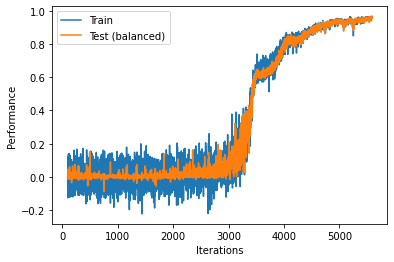

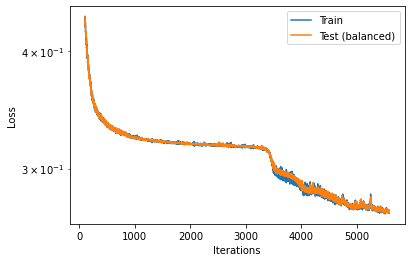

In [25]:
#performance_train = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}
#performance_test = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}
plt.figure()
plt.plot(np.arange(100,len(performance_train['perf'])), 
         performance_train['perf'][100:], label='Train')
plt.plot(np.arange(100,len(performance_test['perf'])), 
         performance_test['perf'][100:], label='Test (balanced)')
plt.ylabel('Performance')
plt.xlabel('Iterations')
plt.legend()
plt.show()

plt.figure()
plt.plot(np.arange(100,len(performance_train['perf'])),
         performance_train['loss'][100:], label='Train')
plt.plot(np.arange(100,len(performance_test['perf'])),
         performance_test['loss'][100:], label='Test (balanced)')
plt.ylabel('Loss')
plt.xlabel('Iterations')
plt.yscale('log')
plt.legend()
plt.show()

### Train on 1000 orientations


 Training performance: 
Iter.    0 | Performance -0.0055 | Loss 56836.0273 | Spike loss 123.9552
Testing performance: 
Iter.    0 | Performance 0.0000 | Loss 39174.5000 | Spike loss 97.4952


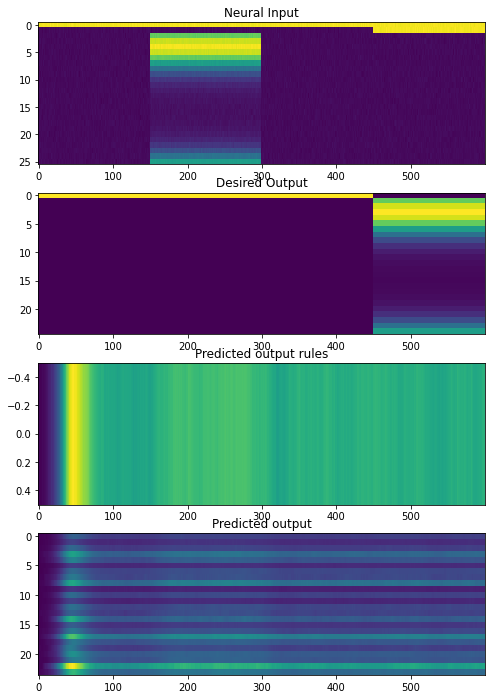

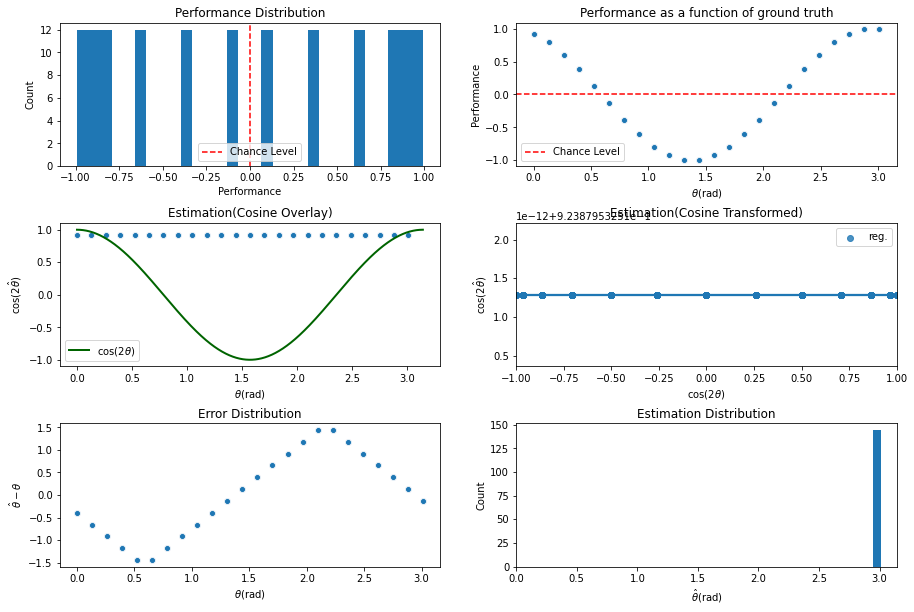

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter0\assets

 Training performance: 
Iter.    1 | Performance -0.0370 | Loss 39112.0703 | Spike loss 97.5503
Testing performance: 
Iter.    1 | Performance 0.0000 | Loss 25903.2480 | Spike loss 75.0219

 Training performance: 
Iter.    2 | Performance -0.1159 | Loss 25903.1504 | Spike loss 75.1971
Testing performance: 
Iter.    2 | Performance -0.0000 | Loss 16062.9600 | Spike loss 55.2807

 Training performance: 
Iter.    3 | Performance -0.0068 | Loss 16037.6211 | Spike loss 55.1850
Testing performance: 
Iter.    3 | Performance -0.0000 | Loss 8899.1582 | Spike loss 37.8634

 Training performance: 
Iter.    4 | Performance 0.0228 | Loss 8840.8604 | Spike loss 37.8082
Testing performance: 
Iter.    4 | Performance 0.0025 | Loss 4089.1392 | Spike loss 23.2447

 Training performance: 
Iter.    5 | Performance -0.0206 | Loss 4183.1782 | Spike loss 23.4078
Testing performance: 
Iter.    5 | Performance 0.0164 | Lo


 Training performance: 
Iter.   46 | Performance 0.0080 | Loss 1.0583 | Spike loss 0.7514
Testing performance: 
Iter.   46 | Performance 0.1214 | Loss 0.9891 | Spike loss 0.7648

 Training performance: 
Iter.   47 | Performance 0.0287 | Loss 1.0048 | Spike loss 0.7631
Testing performance: 
Iter.   47 | Performance 0.0079 | Loss 0.9536 | Spike loss 0.7827

 Training performance: 
Iter.   48 | Performance -0.0553 | Loss 0.9503 | Spike loss 0.7826
Testing performance: 
Iter.   48 | Performance 0.0256 | Loss 0.9056 | Spike loss 0.8037

 Training performance: 
Iter.   49 | Performance 0.0641 | Loss 0.9062 | Spike loss 0.8053
Testing performance: 
Iter.   49 | Performance -0.0163 | Loss 0.8642 | Spike loss 0.8287

 Training performance: 
Iter.   50 | Performance 0.0161 | Loss 0.8470 | Spike loss 0.8331
Testing performance: 
Iter.   50 | Performance 0.0622 | Loss 0.8181 | Spike loss 0.8583

 Training performance: 
Iter.   51 | Performance -0.0191 | Loss 0.8273 | Spike loss 0.8548
Testing per


 Training performance: 
Iter.   92 | Performance 0.0366 | Loss 0.4509 | Spike loss 2.2892
Testing performance: 
Iter.   92 | Performance -0.0036 | Loss 0.4490 | Spike loss 2.3113

 Training performance: 
Iter.   93 | Performance -0.0840 | Loss 0.4448 | Spike loss 2.3155
Testing performance: 
Iter.   93 | Performance -0.0024 | Loss 0.4510 | Spike loss 2.3271

 Training performance: 
Iter.   94 | Performance 0.0162 | Loss 0.4494 | Spike loss 2.3299
Testing performance: 
Iter.   94 | Performance 0.0097 | Loss 0.4461 | Spike loss 2.3474

 Training performance: 
Iter.   95 | Performance 0.0617 | Loss 0.4476 | Spike loss 2.3382
Testing performance: 
Iter.   95 | Performance 0.0071 | Loss 0.4438 | Spike loss 2.3556

 Training performance: 
Iter.   96 | Performance 0.0673 | Loss 0.4415 | Spike loss 2.3650
Testing performance: 
Iter.   96 | Performance -0.0007 | Loss 0.4450 | Spike loss 2.3730

 Training performance: 
Iter.   97 | Performance -0.0746 | Loss 0.4426 | Spike loss 2.3568
Testing p

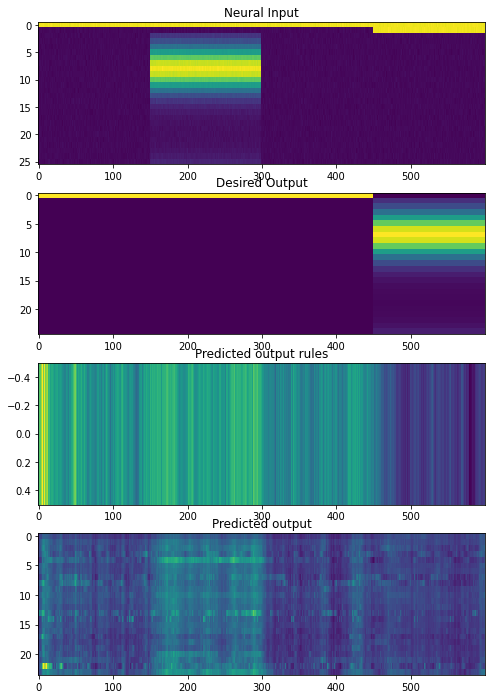

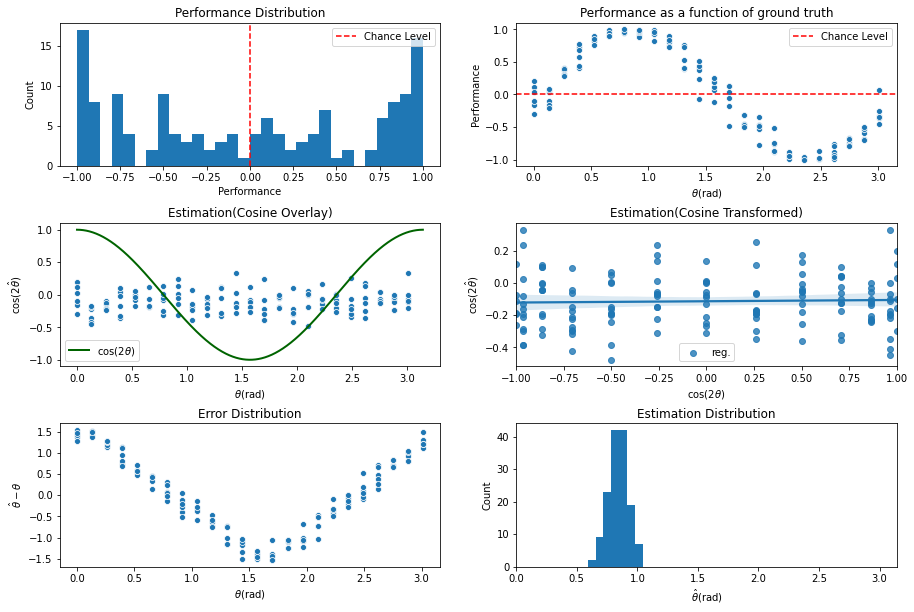

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter100\assets

 Training performance: 
Iter.  101 | Performance -0.0680 | Loss 0.4388 | Spike loss 2.4023
Testing performance: 
Iter.  101 | Performance -0.0076 | Loss 0.4391 | Spike loss 2.3881

 Training performance: 
Iter.  102 | Performance 0.0423 | Loss 0.4414 | Spike loss 2.4076
Testing performance: 
Iter.  102 | Performance -0.0149 | Loss 0.4414 | Spike loss 2.3861

 Training performance: 
Iter.  103 | Performance -0.0466 | Loss 0.4371 | Spike loss 2.3810
Testing performance: 
Iter.  103 | Performance 0.0025 | Loss 0.4387 | Spike loss 2.3791

 Training performance: 
Iter.  104 | Performance -0.0311 | Loss 0.4406 | Spike loss 2.3879
Testing performance: 
Iter.  104 | Performance -0.0015 | Loss 0.4328 | Spike loss 2.4077

 Training performance: 
Iter.  105 | Performance 0.0559 | Loss 0.4342 | Spike loss 2.4148
Testing performance: 
Iter.  105 | Performance 0.0004 | Loss 0.4306 | Spike loss 2.4374

 Trainin


 Training performance: 
Iter.  147 | Performance 0.0519 | Loss 0.3991 | Spike loss 2.6220
Testing performance: 
Iter.  147 | Performance 0.0034 | Loss 0.3999 | Spike loss 2.6339

 Training performance: 
Iter.  148 | Performance 0.0106 | Loss 0.3982 | Spike loss 2.6463
Testing performance: 
Iter.  148 | Performance 0.0130 | Loss 0.3970 | Spike loss 2.6626

 Training performance: 
Iter.  149 | Performance -0.1108 | Loss 0.4019 | Spike loss 2.6541
Testing performance: 
Iter.  149 | Performance 0.0258 | Loss 0.3951 | Spike loss 2.6390

 Training performance: 
Iter.  150 | Performance -0.0862 | Loss 0.3955 | Spike loss 2.6473
Testing performance: 
Iter.  150 | Performance -0.0213 | Loss 0.3949 | Spike loss 2.6167

 Training performance: 
Iter.  151 | Performance 0.0679 | Loss 0.3963 | Spike loss 2.6261
Testing performance: 
Iter.  151 | Performance 0.0221 | Loss 0.3975 | Spike loss 2.6469

 Training performance: 
Iter.  152 | Performance -0.0777 | Loss 0.3966 | Spike loss 2.6287
Testing pe


 Training performance: 
Iter.  193 | Performance -0.0202 | Loss 0.3762 | Spike loss 2.6751
Testing performance: 
Iter.  193 | Performance -0.0117 | Loss 0.3776 | Spike loss 2.6837

 Training performance: 
Iter.  194 | Performance 0.0744 | Loss 0.3761 | Spike loss 2.6861
Testing performance: 
Iter.  194 | Performance 0.0024 | Loss 0.3765 | Spike loss 2.6984

 Training performance: 
Iter.  195 | Performance 0.0871 | Loss 0.3751 | Spike loss 2.7161
Testing performance: 
Iter.  195 | Performance -0.0038 | Loss 0.3745 | Spike loss 2.7132

 Training performance: 
Iter.  196 | Performance -0.0385 | Loss 0.3759 | Spike loss 2.6999
Testing performance: 
Iter.  196 | Performance 0.0021 | Loss 0.3768 | Spike loss 2.6960

 Training performance: 
Iter.  197 | Performance 0.0478 | Loss 0.3767 | Spike loss 2.7115
Testing performance: 
Iter.  197 | Performance 0.0097 | Loss 0.3728 | Spike loss 2.6903

 Training performance: 
Iter.  198 | Performance 0.0978 | Loss 0.3724 | Spike loss 2.6818
Testing pe

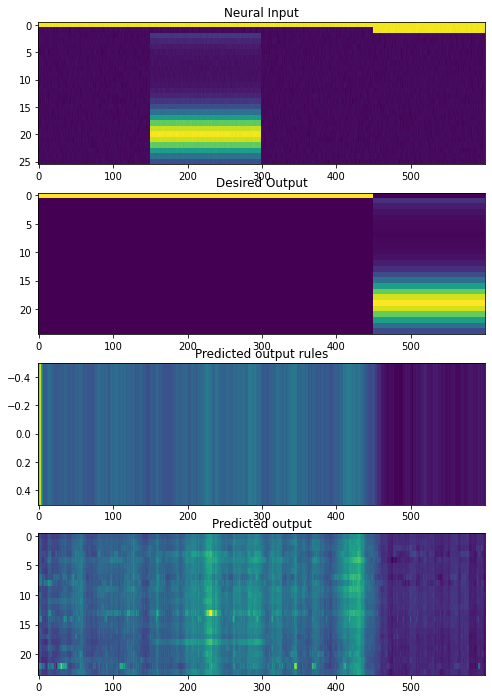

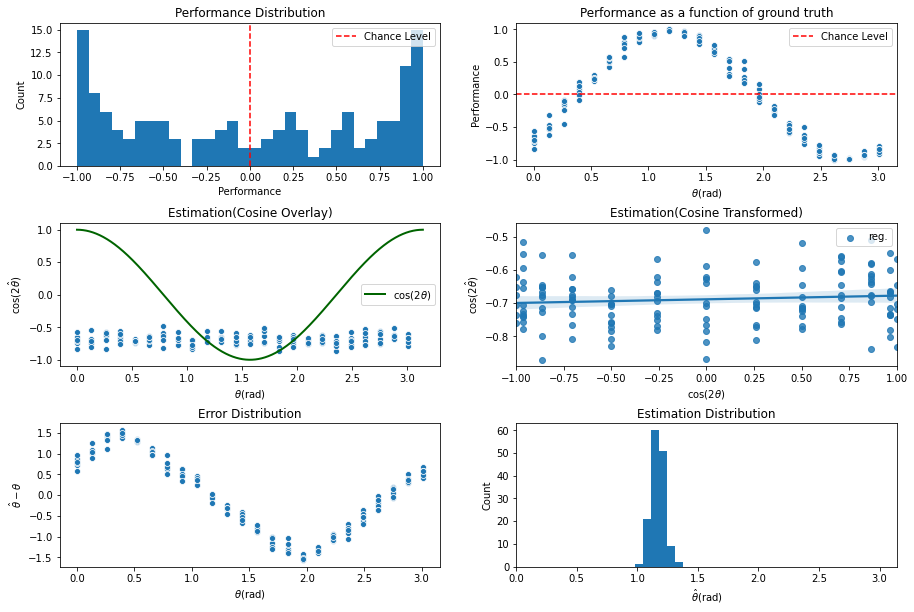

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter200\assets

 Training performance: 
Iter.  201 | Performance 0.0098 | Loss 0.3718 | Spike loss 2.6875
Testing performance: 
Iter.  201 | Performance 0.0071 | Loss 0.3740 | Spike loss 2.6967

 Training performance: 
Iter.  202 | Performance -0.0831 | Loss 0.3732 | Spike loss 2.6893
Testing performance: 
Iter.  202 | Performance -0.0002 | Loss 0.3743 | Spike loss 2.7011

 Training performance: 
Iter.  203 | Performance 0.0195 | Loss 0.3714 | Spike loss 2.7225
Testing performance: 
Iter.  203 | Performance 0.0041 | Loss 0.3726 | Spike loss 2.7077

 Training performance: 
Iter.  204 | Performance 0.0674 | Loss 0.3708 | Spike loss 2.7020
Testing performance: 
Iter.  204 | Performance 0.0183 | Loss 0.3727 | Spike loss 2.7091

 Training performance: 
Iter.  205 | Performance -0.0048 | Loss 0.3715 | Spike loss 2.6952
Testing performance: 
Iter.  205 | Performance 0.0141 | Loss 0.3757 | Spike loss 2.7069

 Training p


 Training performance: 
Iter.  247 | Performance 0.0143 | Loss 0.3598 | Spike loss 2.7852
Testing performance: 
Iter.  247 | Performance -0.0012 | Loss 0.3607 | Spike loss 2.7820

 Training performance: 
Iter.  248 | Performance -0.0346 | Loss 0.3612 | Spike loss 2.7978
Testing performance: 
Iter.  248 | Performance 0.0075 | Loss 0.3590 | Spike loss 2.8033

 Training performance: 
Iter.  249 | Performance 0.0793 | Loss 0.3575 | Spike loss 2.8004
Testing performance: 
Iter.  249 | Performance -0.0105 | Loss 0.3590 | Spike loss 2.8106

 Training performance: 
Iter.  250 | Performance 0.0028 | Loss 0.3578 | Spike loss 2.7898
Testing performance: 
Iter.  250 | Performance -0.0285 | Loss 0.3598 | Spike loss 2.8033

 Training performance: 
Iter.  251 | Performance 0.0217 | Loss 0.3589 | Spike loss 2.8315
Testing performance: 
Iter.  251 | Performance 0.0416 | Loss 0.3578 | Spike loss 2.8193

 Training performance: 
Iter.  252 | Performance 0.0107 | Loss 0.3585 | Spike loss 2.8399
Testing pe


 Training performance: 
Iter.  293 | Performance -0.0283 | Loss 0.3515 | Spike loss 2.8093
Testing performance: 
Iter.  293 | Performance -0.0098 | Loss 0.3490 | Spike loss 2.8097

 Training performance: 
Iter.  294 | Performance 0.0517 | Loss 0.3496 | Spike loss 2.8019
Testing performance: 
Iter.  294 | Performance 0.0044 | Loss 0.3488 | Spike loss 2.7982

 Training performance: 
Iter.  295 | Performance 0.0185 | Loss 0.3493 | Spike loss 2.7747
Testing performance: 
Iter.  295 | Performance 0.0036 | Loss 0.3501 | Spike loss 2.7721

 Training performance: 
Iter.  296 | Performance 0.1050 | Loss 0.3503 | Spike loss 2.7870
Testing performance: 
Iter.  296 | Performance 0.0009 | Loss 0.3496 | Spike loss 2.7875

 Training performance: 
Iter.  297 | Performance -0.0037 | Loss 0.3475 | Spike loss 2.7702
Testing performance: 
Iter.  297 | Performance 0.0062 | Loss 0.3501 | Spike loss 2.8040

 Training performance: 
Iter.  298 | Performance 0.0769 | Loss 0.3486 | Spike loss 2.7843
Testing per

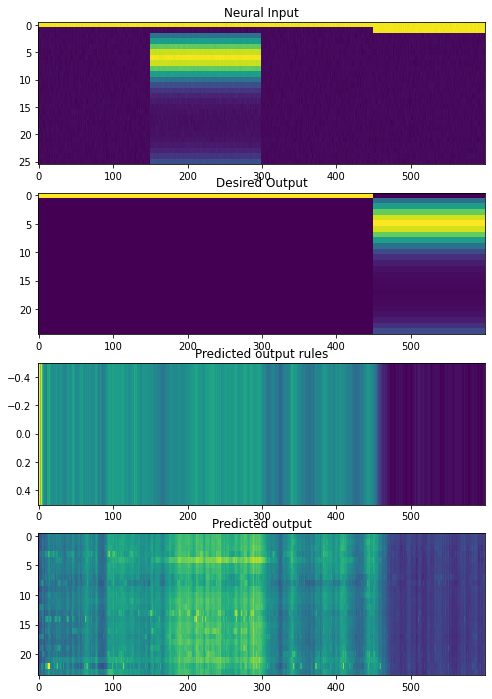

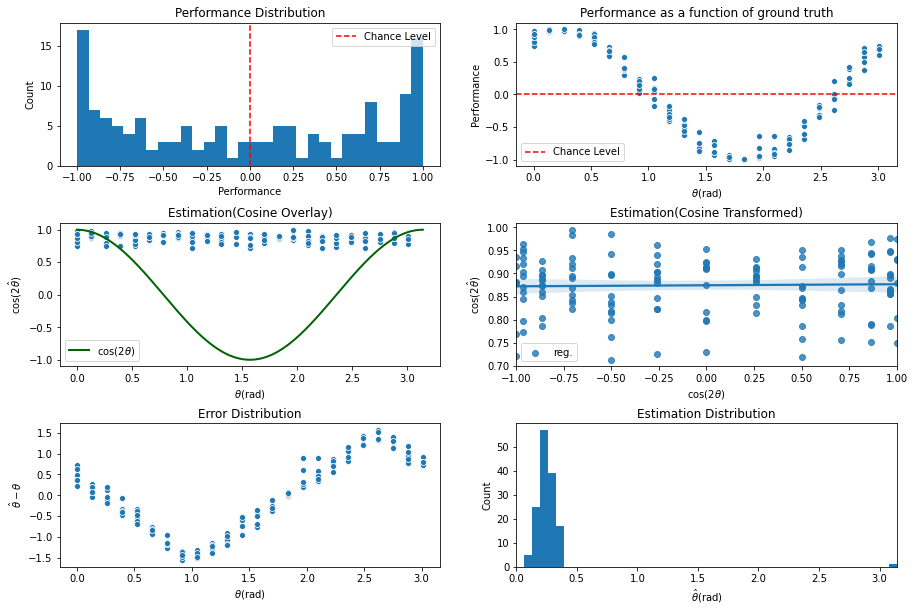

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter300\assets

 Training performance: 
Iter.  301 | Performance -0.0249 | Loss 0.3484 | Spike loss 2.7763
Testing performance: 
Iter.  301 | Performance 0.0189 | Loss 0.3487 | Spike loss 2.7588

 Training performance: 
Iter.  302 | Performance 0.0391 | Loss 0.3491 | Spike loss 2.7571
Testing performance: 
Iter.  302 | Performance 0.0079 | Loss 0.3474 | Spike loss 2.7569

 Training performance: 
Iter.  303 | Performance 0.0085 | Loss 0.3485 | Spike loss 2.7708
Testing performance: 
Iter.  303 | Performance 0.0105 | Loss 0.3478 | Spike loss 2.7886

 Training performance: 
Iter.  304 | Performance -0.0846 | Loss 0.3473 | Spike loss 2.7775
Testing performance: 
Iter.  304 | Performance 0.0006 | Loss 0.3499 | Spike loss 2.7702

 Training performance: 
Iter.  305 | Performance -0.1255 | Loss 0.3477 | Spike loss 2.8027
Testing performance: 
Iter.  305 | Performance 0.0129 | Loss 0.3474 | Spike loss 2.7571

 Training p


 Training performance: 
Iter.  347 | Performance -0.0715 | Loss 0.3442 | Spike loss 2.8183
Testing performance: 
Iter.  347 | Performance -0.0018 | Loss 0.3429 | Spike loss 2.7989

 Training performance: 
Iter.  348 | Performance -0.0529 | Loss 0.3430 | Spike loss 2.8106
Testing performance: 
Iter.  348 | Performance 0.0002 | Loss 0.3439 | Spike loss 2.8038

 Training performance: 
Iter.  349 | Performance 0.0375 | Loss 0.3452 | Spike loss 2.7951
Testing performance: 
Iter.  349 | Performance 0.0019 | Loss 0.3459 | Spike loss 2.8102

 Training performance: 
Iter.  350 | Performance -0.0416 | Loss 0.3439 | Spike loss 2.7794
Testing performance: 
Iter.  350 | Performance -0.0004 | Loss 0.3436 | Spike loss 2.8039

 Training performance: 
Iter.  351 | Performance -0.0805 | Loss 0.3413 | Spike loss 2.7892
Testing performance: 
Iter.  351 | Performance -0.0001 | Loss 0.3439 | Spike loss 2.8110

 Training performance: 
Iter.  352 | Performance -0.0263 | Loss 0.3427 | Spike loss 2.7851
Testin


 Training performance: 
Iter.  393 | Performance -0.0029 | Loss 0.3396 | Spike loss 2.8162
Testing performance: 
Iter.  393 | Performance 0.0092 | Loss 0.3404 | Spike loss 2.8028

 Training performance: 
Iter.  394 | Performance 0.0236 | Loss 0.3388 | Spike loss 2.8074
Testing performance: 
Iter.  394 | Performance 0.0077 | Loss 0.3422 | Spike loss 2.8174

 Training performance: 
Iter.  395 | Performance -0.0261 | Loss 0.3402 | Spike loss 2.8418
Testing performance: 
Iter.  395 | Performance -0.0020 | Loss 0.3386 | Spike loss 2.7928

 Training performance: 
Iter.  396 | Performance -0.0076 | Loss 0.3398 | Spike loss 2.8088
Testing performance: 
Iter.  396 | Performance 0.0255 | Loss 0.3417 | Spike loss 2.7973

 Training performance: 
Iter.  397 | Performance 0.1232 | Loss 0.3398 | Spike loss 2.7909
Testing performance: 
Iter.  397 | Performance -0.0036 | Loss 0.3405 | Spike loss 2.7715

 Training performance: 
Iter.  398 | Performance -0.0022 | Loss 0.3408 | Spike loss 2.7888
Testing 

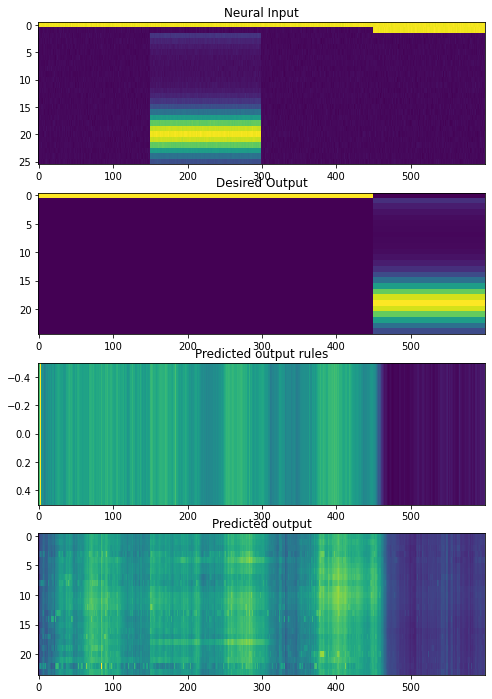

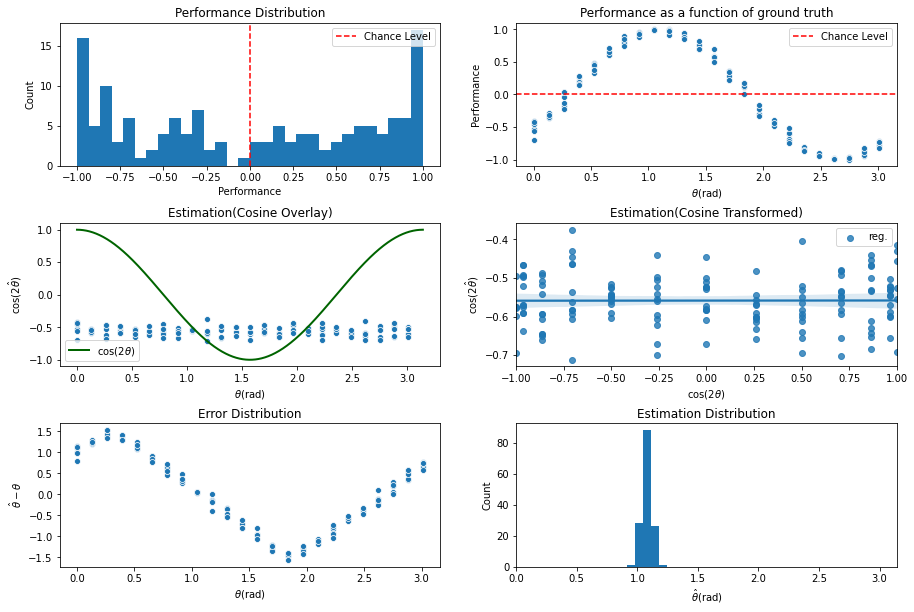

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter400\assets

 Training performance: 
Iter.  401 | Performance -0.1014 | Loss 0.3408 | Spike loss 2.8008
Testing performance: 
Iter.  401 | Performance 0.0024 | Loss 0.3402 | Spike loss 2.8018

 Training performance: 
Iter.  402 | Performance -0.0155 | Loss 0.3380 | Spike loss 2.8041
Testing performance: 
Iter.  402 | Performance 0.0058 | Loss 0.3405 | Spike loss 2.7980

 Training performance: 
Iter.  403 | Performance -0.0684 | Loss 0.3391 | Spike loss 2.7911
Testing performance: 
Iter.  403 | Performance 0.0154 | Loss 0.3416 | Spike loss 2.7982

 Training performance: 
Iter.  404 | Performance 0.1143 | Loss 0.3402 | Spike loss 2.7953
Testing performance: 
Iter.  404 | Performance 0.0078 | Loss 0.3382 | Spike loss 2.7779

 Training performance: 
Iter.  405 | Performance -0.1161 | Loss 0.3386 | Spike loss 2.7931
Testing performance: 
Iter.  405 | Performance 0.0131 | Loss 0.3408 | Spike loss 2.7897

 Training 


 Training performance: 
Iter.  447 | Performance -0.0571 | Loss 0.3370 | Spike loss 2.8043
Testing performance: 
Iter.  447 | Performance -0.0004 | Loss 0.3377 | Spike loss 2.7950

 Training performance: 
Iter.  448 | Performance 0.0830 | Loss 0.3367 | Spike loss 2.8029
Testing performance: 
Iter.  448 | Performance 0.0033 | Loss 0.3386 | Spike loss 2.7786

 Training performance: 
Iter.  449 | Performance -0.0651 | Loss 0.3374 | Spike loss 2.7940
Testing performance: 
Iter.  449 | Performance 0.0030 | Loss 0.3372 | Spike loss 2.7907

 Training performance: 
Iter.  450 | Performance 0.0232 | Loss 0.3368 | Spike loss 2.8045
Testing performance: 
Iter.  450 | Performance 0.0049 | Loss 0.3363 | Spike loss 2.7878

 Training performance: 
Iter.  451 | Performance 0.0086 | Loss 0.3374 | Spike loss 2.7888
Testing performance: 
Iter.  451 | Performance 0.0102 | Loss 0.3378 | Spike loss 2.7849

 Training performance: 
Iter.  452 | Performance 0.0337 | Loss 0.3376 | Spike loss 2.7975
Testing per


 Training performance: 
Iter.  493 | Performance 0.0070 | Loss 0.3340 | Spike loss 2.7868
Testing performance: 
Iter.  493 | Performance 0.0037 | Loss 0.3363 | Spike loss 2.8034

 Training performance: 
Iter.  494 | Performance -0.0005 | Loss 0.3365 | Spike loss 2.7929
Testing performance: 
Iter.  494 | Performance 0.0166 | Loss 0.3339 | Spike loss 2.7853

 Training performance: 
Iter.  495 | Performance 0.0222 | Loss 0.3342 | Spike loss 2.8141
Testing performance: 
Iter.  495 | Performance -0.0026 | Loss 0.3352 | Spike loss 2.7931

 Training performance: 
Iter.  496 | Performance -0.0438 | Loss 0.3341 | Spike loss 2.7933
Testing performance: 
Iter.  496 | Performance -0.0070 | Loss 0.3360 | Spike loss 2.8054

 Training performance: 
Iter.  497 | Performance 0.0260 | Loss 0.3357 | Spike loss 2.7939
Testing performance: 
Iter.  497 | Performance -0.0401 | Loss 0.3328 | Spike loss 2.8137

 Training performance: 
Iter.  498 | Performance -0.0254 | Loss 0.3333 | Spike loss 2.8175
Testing 

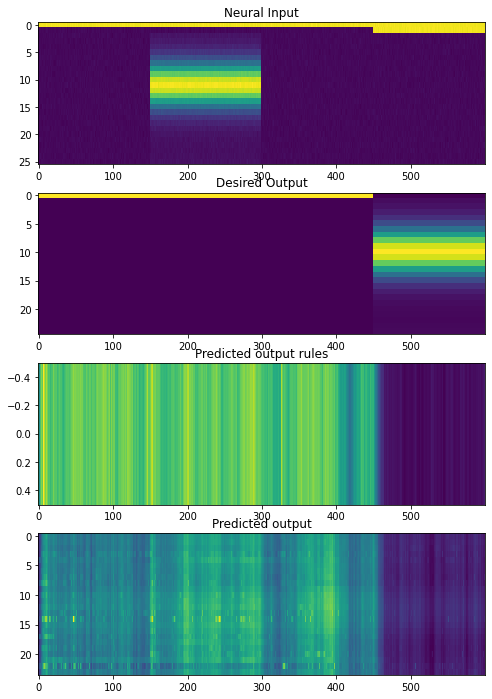

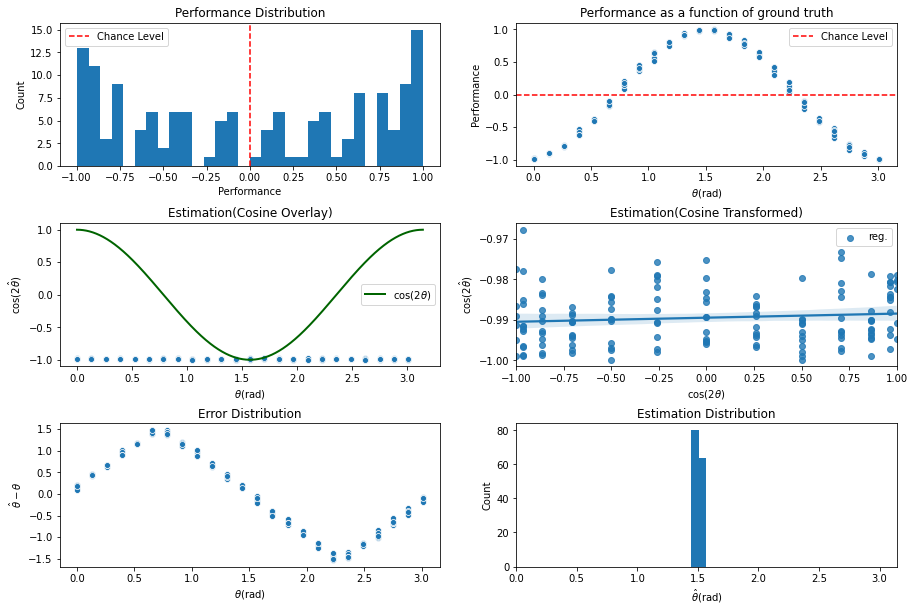

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter500\assets

 Training performance: 
Iter.  501 | Performance 0.0759 | Loss 0.3336 | Spike loss 2.8070
Testing performance: 
Iter.  501 | Performance -0.0011 | Loss 0.3357 | Spike loss 2.8202

 Training performance: 
Iter.  502 | Performance -0.0572 | Loss 0.3346 | Spike loss 2.8018
Testing performance: 
Iter.  502 | Performance 0.0010 | Loss 0.3363 | Spike loss 2.8028

 Training performance: 
Iter.  503 | Performance 0.0307 | Loss 0.3369 | Spike loss 2.8077
Testing performance: 
Iter.  503 | Performance 0.0030 | Loss 0.3348 | Spike loss 2.8100

 Training performance: 
Iter.  504 | Performance -0.0363 | Loss 0.3353 | Spike loss 2.8059
Testing performance: 
Iter.  504 | Performance 0.0005 | Loss 0.3356 | Spike loss 2.7770

 Training performance: 
Iter.  505 | Performance -0.0018 | Loss 0.3349 | Spike loss 2.7861
Testing performance: 
Iter.  505 | Performance 0.0025 | Loss 0.3354 | Spike loss 2.7870

 Training 


 Training performance: 
Iter.  547 | Performance -0.0427 | Loss 0.3320 | Spike loss 2.7694
Testing performance: 
Iter.  547 | Performance 0.0128 | Loss 0.3344 | Spike loss 2.7768

 Training performance: 
Iter.  548 | Performance -0.0209 | Loss 0.3345 | Spike loss 2.7612
Testing performance: 
Iter.  548 | Performance 0.0290 | Loss 0.3324 | Spike loss 2.7687

 Training performance: 
Iter.  549 | Performance -0.0053 | Loss 0.3322 | Spike loss 2.7561
Testing performance: 
Iter.  549 | Performance 0.0118 | Loss 0.3326 | Spike loss 2.7939

 Training performance: 
Iter.  550 | Performance 0.0200 | Loss 0.3310 | Spike loss 2.7947
Testing performance: 
Iter.  550 | Performance 0.0037 | Loss 0.3337 | Spike loss 2.7832

 Training performance: 
Iter.  551 | Performance 0.0154 | Loss 0.3330 | Spike loss 2.7972
Testing performance: 
Iter.  551 | Performance 0.0051 | Loss 0.3329 | Spike loss 2.7828

 Training performance: 
Iter.  552 | Performance -0.0433 | Loss 0.3319 | Spike loss 2.7816
Testing pe


 Training performance: 
Iter.  593 | Performance -0.0454 | Loss 0.3306 | Spike loss 2.7938
Testing performance: 
Iter.  593 | Performance 0.0074 | Loss 0.3304 | Spike loss 2.7804

 Training performance: 
Iter.  594 | Performance -0.1009 | Loss 0.3309 | Spike loss 2.7904
Testing performance: 
Iter.  594 | Performance -0.0038 | Loss 0.3305 | Spike loss 2.7869

 Training performance: 
Iter.  595 | Performance 0.0635 | Loss 0.3312 | Spike loss 2.7695
Testing performance: 
Iter.  595 | Performance -0.0040 | Loss 0.3322 | Spike loss 2.7802

 Training performance: 
Iter.  596 | Performance 0.0118 | Loss 0.3326 | Spike loss 2.7711
Testing performance: 
Iter.  596 | Performance 0.0149 | Loss 0.3305 | Spike loss 2.7874

 Training performance: 
Iter.  597 | Performance -0.0052 | Loss 0.3301 | Spike loss 2.7684
Testing performance: 
Iter.  597 | Performance 0.0181 | Loss 0.3314 | Spike loss 2.7739

 Training performance: 
Iter.  598 | Performance -0.0866 | Loss 0.3310 | Spike loss 2.7952
Testing 

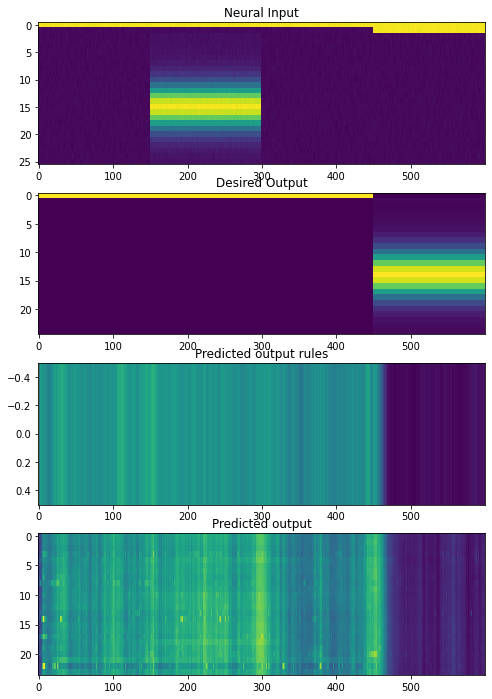

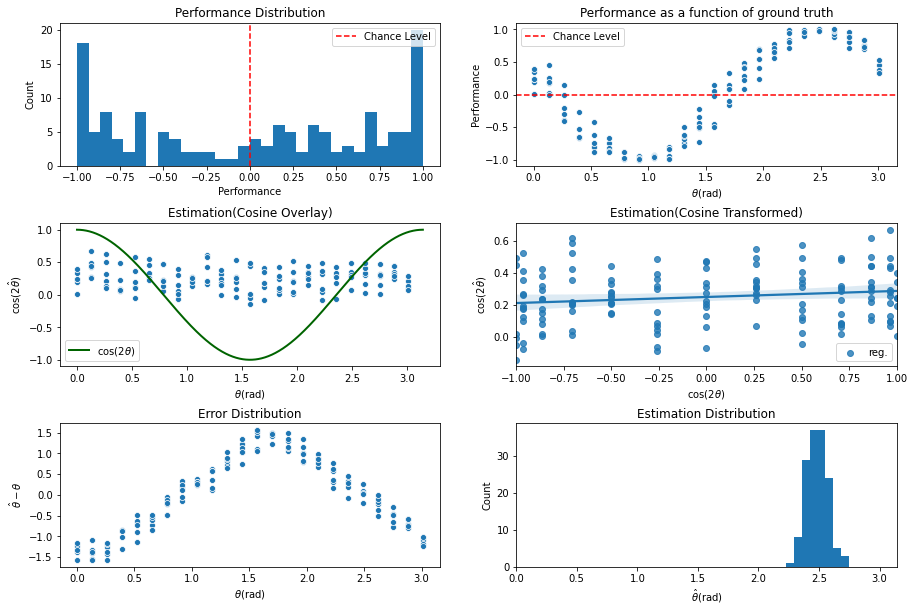

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter600\assets

 Training performance: 
Iter.  601 | Performance -0.0365 | Loss 0.3319 | Spike loss 2.7751
Testing performance: 
Iter.  601 | Performance 0.0044 | Loss 0.3319 | Spike loss 2.7870

 Training performance: 
Iter.  602 | Performance 0.0226 | Loss 0.3317 | Spike loss 2.7704
Testing performance: 
Iter.  602 | Performance -0.0051 | Loss 0.3298 | Spike loss 2.7732

 Training performance: 
Iter.  603 | Performance 0.0291 | Loss 0.3315 | Spike loss 2.7810
Testing performance: 
Iter.  603 | Performance -0.0045 | Loss 0.3308 | Spike loss 2.7885

 Training performance: 
Iter.  604 | Performance 0.0987 | Loss 0.3299 | Spike loss 2.7831
Testing performance: 
Iter.  604 | Performance -0.0006 | Loss 0.3321 | Spike loss 2.7885

 Training performance: 
Iter.  605 | Performance 0.0472 | Loss 0.3328 | Spike loss 2.8010
Testing performance: 
Iter.  605 | Performance 0.0092 | Loss 0.3296 | Spike loss 2.7927

 Training 


 Training performance: 
Iter.  647 | Performance -0.0060 | Loss 0.3305 | Spike loss 2.7657
Testing performance: 
Iter.  647 | Performance -0.0109 | Loss 0.3285 | Spike loss 2.7586

 Training performance: 
Iter.  648 | Performance -0.1814 | Loss 0.3284 | Spike loss 2.7615
Testing performance: 
Iter.  648 | Performance -0.0045 | Loss 0.3298 | Spike loss 2.7537

 Training performance: 
Iter.  649 | Performance 0.0691 | Loss 0.3298 | Spike loss 2.7387
Testing performance: 
Iter.  649 | Performance 0.0178 | Loss 0.3300 | Spike loss 2.7627

 Training performance: 
Iter.  650 | Performance -0.0886 | Loss 0.3309 | Spike loss 2.7531
Testing performance: 
Iter.  650 | Performance 0.0076 | Loss 0.3292 | Spike loss 2.7503

 Training performance: 
Iter.  651 | Performance 0.0270 | Loss 0.3284 | Spike loss 2.7491
Testing performance: 
Iter.  651 | Performance 0.0064 | Loss 0.3296 | Spike loss 2.7562

 Training performance: 
Iter.  652 | Performance 0.0311 | Loss 0.3293 | Spike loss 2.7707
Testing p


 Training performance: 
Iter.  693 | Performance 0.0353 | Loss 0.3276 | Spike loss 2.7333
Testing performance: 
Iter.  693 | Performance 0.0001 | Loss 0.3296 | Spike loss 2.7302

 Training performance: 
Iter.  694 | Performance -0.0156 | Loss 0.3291 | Spike loss 2.7314
Testing performance: 
Iter.  694 | Performance -0.0031 | Loss 0.3303 | Spike loss 2.7152

 Training performance: 
Iter.  695 | Performance 0.0614 | Loss 0.3316 | Spike loss 2.7378
Testing performance: 
Iter.  695 | Performance 0.0005 | Loss 0.3278 | Spike loss 2.7146

 Training performance: 
Iter.  696 | Performance 0.0133 | Loss 0.3286 | Spike loss 2.7263
Testing performance: 
Iter.  696 | Performance 0.0026 | Loss 0.3288 | Spike loss 2.7108

 Training performance: 
Iter.  697 | Performance -0.0391 | Loss 0.3284 | Spike loss 2.7058
Testing performance: 
Iter.  697 | Performance -0.0073 | Loss 0.3286 | Spike loss 2.7194

 Training performance: 
Iter.  698 | Performance -0.0040 | Loss 0.3295 | Spike loss 2.7074
Testing p

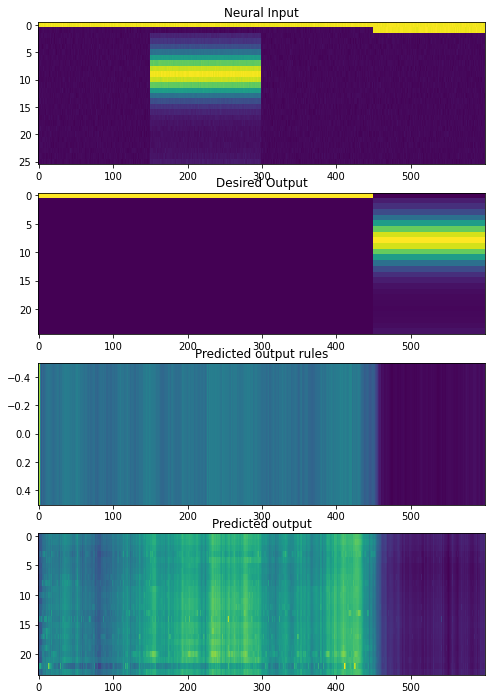

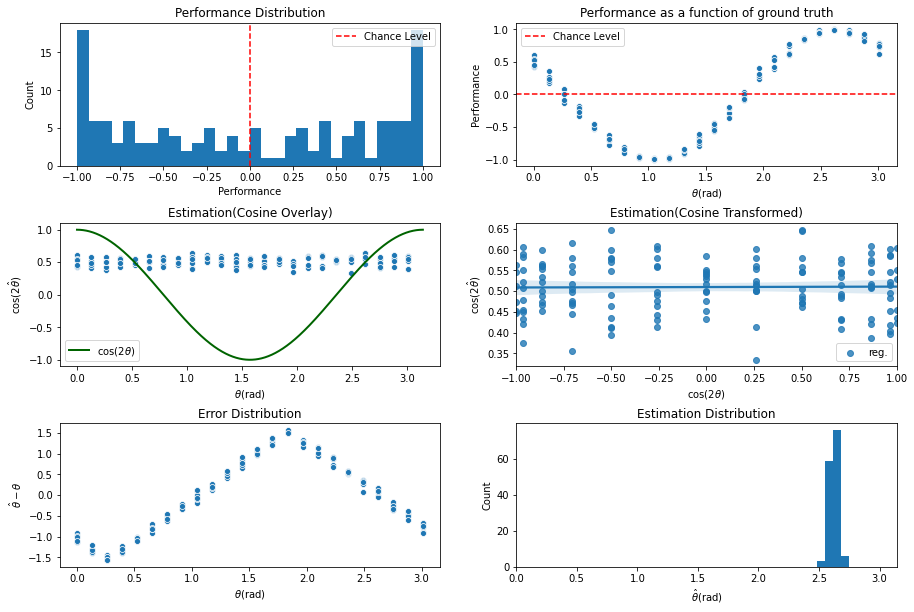

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter700\assets

 Training performance: 
Iter.  701 | Performance -0.0476 | Loss 0.3290 | Spike loss 2.7027
Testing performance: 
Iter.  701 | Performance 0.0006 | Loss 0.3285 | Spike loss 2.7175

 Training performance: 
Iter.  702 | Performance -0.0760 | Loss 0.3269 | Spike loss 2.7164
Testing performance: 
Iter.  702 | Performance 0.0114 | Loss 0.3280 | Spike loss 2.7089

 Training performance: 
Iter.  703 | Performance -0.0333 | Loss 0.3289 | Spike loss 2.7010
Testing performance: 
Iter.  703 | Performance 0.0052 | Loss 0.3300 | Spike loss 2.6963

 Training performance: 
Iter.  704 | Performance -0.0470 | Loss 0.3294 | Spike loss 2.7108
Testing performance: 
Iter.  704 | Performance 0.0069 | Loss 0.3283 | Spike loss 2.7010

 Training performance: 
Iter.  705 | Performance 0.0883 | Loss 0.3290 | Spike loss 2.7067
Testing performance: 
Iter.  705 | Performance 0.0035 | Loss 0.3288 | Spike loss 2.7122

 Training 


 Training performance: 
Iter.  747 | Performance 0.0202 | Loss 0.3268 | Spike loss 2.6604
Testing performance: 
Iter.  747 | Performance -0.0043 | Loss 0.3275 | Spike loss 2.6655

 Training performance: 
Iter.  748 | Performance 0.0996 | Loss 0.3266 | Spike loss 2.6681
Testing performance: 
Iter.  748 | Performance 0.0014 | Loss 0.3282 | Spike loss 2.6782

 Training performance: 
Iter.  749 | Performance 0.1010 | Loss 0.3273 | Spike loss 2.6625
Testing performance: 
Iter.  749 | Performance 0.0020 | Loss 0.3266 | Spike loss 2.6606

 Training performance: 
Iter.  750 | Performance 0.0255 | Loss 0.3267 | Spike loss 2.6705
Testing performance: 
Iter.  750 | Performance 0.0011 | Loss 0.3272 | Spike loss 2.6660

 Training performance: 
Iter.  751 | Performance -0.0997 | Loss 0.3285 | Spike loss 2.6625
Testing performance: 
Iter.  751 | Performance -0.0020 | Loss 0.3287 | Spike loss 2.6629

 Training performance: 
Iter.  752 | Performance 0.0846 | Loss 0.3288 | Spike loss 2.6784
Testing per


 Training performance: 
Iter.  793 | Performance -0.0789 | Loss 0.3263 | Spike loss 2.6419
Testing performance: 
Iter.  793 | Performance 0.0065 | Loss 0.3278 | Spike loss 2.6402

 Training performance: 
Iter.  794 | Performance -0.0540 | Loss 0.3273 | Spike loss 2.6460
Testing performance: 
Iter.  794 | Performance 0.0112 | Loss 0.3260 | Spike loss 2.6360

 Training performance: 
Iter.  795 | Performance -0.0062 | Loss 0.3268 | Spike loss 2.6334
Testing performance: 
Iter.  795 | Performance -0.0005 | Loss 0.3267 | Spike loss 2.6296

 Training performance: 
Iter.  796 | Performance -0.0327 | Loss 0.3263 | Spike loss 2.6237
Testing performance: 
Iter.  796 | Performance 0.0082 | Loss 0.3270 | Spike loss 2.6373

 Training performance: 
Iter.  797 | Performance -0.0208 | Loss 0.3270 | Spike loss 2.6392
Testing performance: 
Iter.  797 | Performance -0.0002 | Loss 0.3255 | Spike loss 2.6367

 Training performance: 
Iter.  798 | Performance -0.0096 | Loss 0.3257 | Spike loss 2.6312
Testin

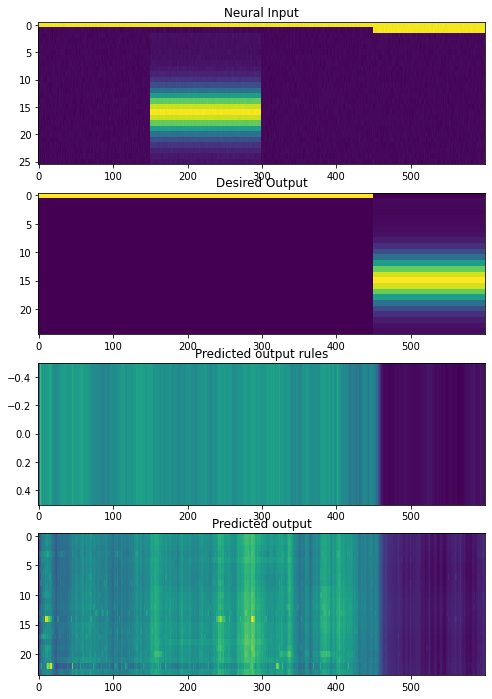

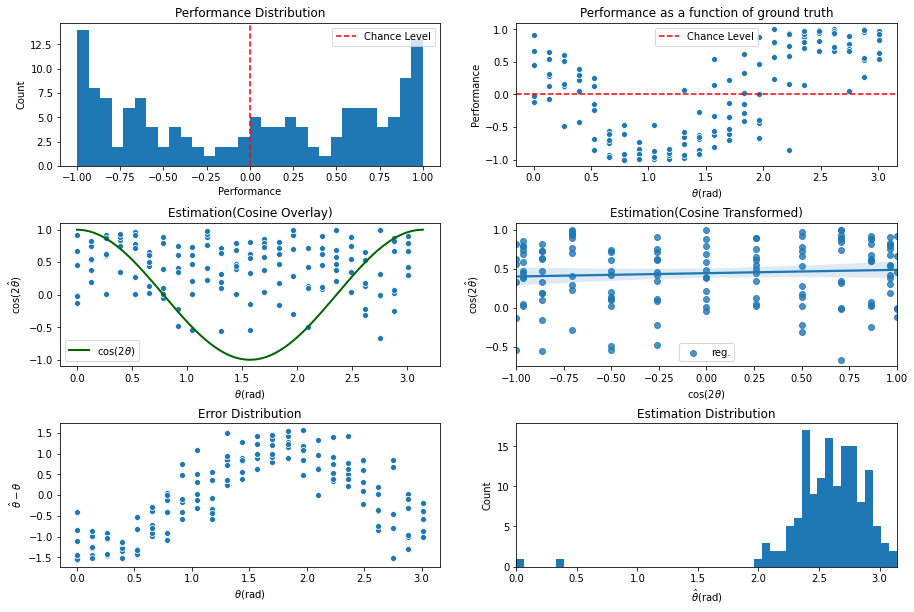

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter800\assets

 Training performance: 
Iter.  801 | Performance -0.0096 | Loss 0.3263 | Spike loss 2.6141
Testing performance: 
Iter.  801 | Performance 0.0151 | Loss 0.3265 | Spike loss 2.6277

 Training performance: 
Iter.  802 | Performance -0.1271 | Loss 0.3262 | Spike loss 2.6309
Testing performance: 
Iter.  802 | Performance 0.0154 | Loss 0.3272 | Spike loss 2.6279

 Training performance: 
Iter.  803 | Performance 0.0866 | Loss 0.3269 | Spike loss 2.6269
Testing performance: 
Iter.  803 | Performance 0.0020 | Loss 0.3260 | Spike loss 2.6395

 Training performance: 
Iter.  804 | Performance 0.0191 | Loss 0.3271 | Spike loss 2.6440
Testing performance: 
Iter.  804 | Performance 0.0045 | Loss 0.3261 | Spike loss 2.6313

 Training performance: 
Iter.  805 | Performance 0.0384 | Loss 0.3267 | Spike loss 2.6246
Testing performance: 
Iter.  805 | Performance 0.0019 | Loss 0.3271 | Spike loss 2.6352

 Training pe


 Training performance: 
Iter.  847 | Performance -0.1444 | Loss 0.3260 | Spike loss 2.6131
Testing performance: 
Iter.  847 | Performance -0.0003 | Loss 0.3269 | Spike loss 2.5994

 Training performance: 
Iter.  848 | Performance 0.0416 | Loss 0.3282 | Spike loss 2.5871
Testing performance: 
Iter.  848 | Performance 0.0015 | Loss 0.3255 | Spike loss 2.5961

 Training performance: 
Iter.  849 | Performance -0.0085 | Loss 0.3246 | Spike loss 2.6009
Testing performance: 
Iter.  849 | Performance 0.0010 | Loss 0.3266 | Spike loss 2.5933

 Training performance: 
Iter.  850 | Performance 0.0602 | Loss 0.3255 | Spike loss 2.6023
Testing performance: 
Iter.  850 | Performance 0.0002 | Loss 0.3272 | Spike loss 2.6086

 Training performance: 
Iter.  851 | Performance -0.0665 | Loss 0.3282 | Spike loss 2.6034
Testing performance: 
Iter.  851 | Performance -0.0002 | Loss 0.3261 | Spike loss 2.5982

 Training performance: 
Iter.  852 | Performance -0.0595 | Loss 0.3252 | Spike loss 2.6037
Testing 


 Training performance: 
Iter.  893 | Performance -0.1192 | Loss 0.3267 | Spike loss 2.5354
Testing performance: 
Iter.  893 | Performance 0.0025 | Loss 0.3249 | Spike loss 2.5521

 Training performance: 
Iter.  894 | Performance -0.0493 | Loss 0.3255 | Spike loss 2.5528
Testing performance: 
Iter.  894 | Performance 0.0015 | Loss 0.3255 | Spike loss 2.5345

 Training performance: 
Iter.  895 | Performance -0.1140 | Loss 0.3247 | Spike loss 2.5341
Testing performance: 
Iter.  895 | Performance 0.0015 | Loss 0.3265 | Spike loss 2.5320

 Training performance: 
Iter.  896 | Performance 0.0763 | Loss 0.3272 | Spike loss 2.5310
Testing performance: 
Iter.  896 | Performance 0.0010 | Loss 0.3255 | Spike loss 2.5299

 Training performance: 
Iter.  897 | Performance 0.0660 | Loss 0.3241 | Spike loss 2.5431
Testing performance: 
Iter.  897 | Performance -0.0050 | Loss 0.3254 | Spike loss 2.5423

 Training performance: 
Iter.  898 | Performance -0.0155 | Loss 0.3242 | Spike loss 2.5416
Testing p

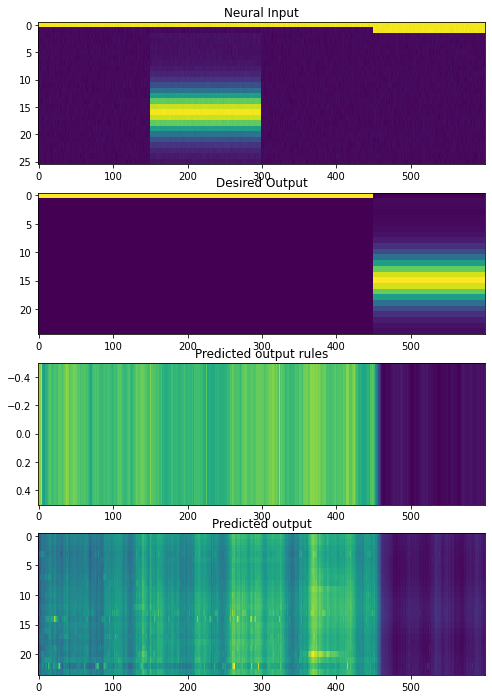

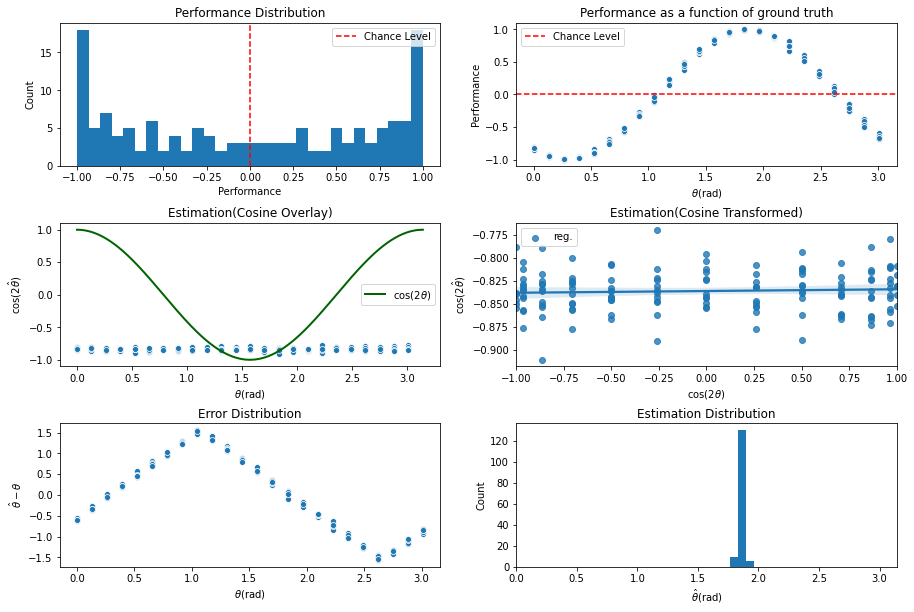

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter900\assets

 Training performance: 
Iter.  901 | Performance 0.0345 | Loss 0.3243 | Spike loss 2.5483
Testing performance: 
Iter.  901 | Performance 0.0041 | Loss 0.3273 | Spike loss 2.5228

 Training performance: 
Iter.  902 | Performance -0.1283 | Loss 0.3261 | Spike loss 2.5235
Testing performance: 
Iter.  902 | Performance 0.0039 | Loss 0.3251 | Spike loss 2.5206

 Training performance: 
Iter.  903 | Performance 0.0485 | Loss 0.3246 | Spike loss 2.5367
Testing performance: 
Iter.  903 | Performance 0.0089 | Loss 0.3247 | Spike loss 2.5202

 Training performance: 
Iter.  904 | Performance 0.0299 | Loss 0.3249 | Spike loss 2.5401
Testing performance: 
Iter.  904 | Performance 0.0034 | Loss 0.3265 | Spike loss 2.5380

 Training performance: 
Iter.  905 | Performance 0.0495 | Loss 0.3262 | Spike loss 2.5271
Testing performance: 
Iter.  905 | Performance 0.0007 | Loss 0.3248 | Spike loss 2.5306

 Training per


 Training performance: 
Iter.  947 | Performance -0.0292 | Loss 0.3254 | Spike loss 2.5102
Testing performance: 
Iter.  947 | Performance -0.0019 | Loss 0.3245 | Spike loss 2.5080

 Training performance: 
Iter.  948 | Performance 0.0295 | Loss 0.3236 | Spike loss 2.4981
Testing performance: 
Iter.  948 | Performance 0.0063 | Loss 0.3245 | Spike loss 2.4987

 Training performance: 
Iter.  949 | Performance -0.1802 | Loss 0.3246 | Spike loss 2.4941
Testing performance: 
Iter.  949 | Performance 0.0027 | Loss 0.3262 | Spike loss 2.4947

 Training performance: 
Iter.  950 | Performance -0.0262 | Loss 0.3263 | Spike loss 2.4914
Testing performance: 
Iter.  950 | Performance 0.0033 | Loss 0.3244 | Spike loss 2.4860

 Training performance: 
Iter.  951 | Performance 0.1026 | Loss 0.3246 | Spike loss 2.4971
Testing performance: 
Iter.  951 | Performance 0.0020 | Loss 0.3249 | Spike loss 2.5049

 Training performance: 
Iter.  952 | Performance 0.0422 | Loss 0.3241 | Spike loss 2.5034
Testing pe


 Training performance: 
Iter.  993 | Performance 0.0905 | Loss 0.3241 | Spike loss 2.4603
Testing performance: 
Iter.  993 | Performance -0.0000 | Loss 0.3248 | Spike loss 2.4675

 Training performance: 
Iter.  994 | Performance -0.1047 | Loss 0.3241 | Spike loss 2.4922
Testing performance: 
Iter.  994 | Performance -0.0026 | Loss 0.3254 | Spike loss 2.4709

 Training performance: 
Iter.  995 | Performance -0.0195 | Loss 0.3254 | Spike loss 2.4575
Testing performance: 
Iter.  995 | Performance 0.0051 | Loss 0.3236 | Spike loss 2.4727

 Training performance: 
Iter.  996 | Performance -0.0718 | Loss 0.3236 | Spike loss 2.4665
Testing performance: 
Iter.  996 | Performance 0.0045 | Loss 0.3245 | Spike loss 2.4472

 Training performance: 
Iter.  997 | Performance 0.0345 | Loss 0.3239 | Spike loss 2.4542
Testing performance: 
Iter.  997 | Performance -0.0005 | Loss 0.3257 | Spike loss 2.4641

 Training performance: 
Iter.  998 | Performance 0.0407 | Loss 0.3246 | Spike loss 2.4552
Testing 

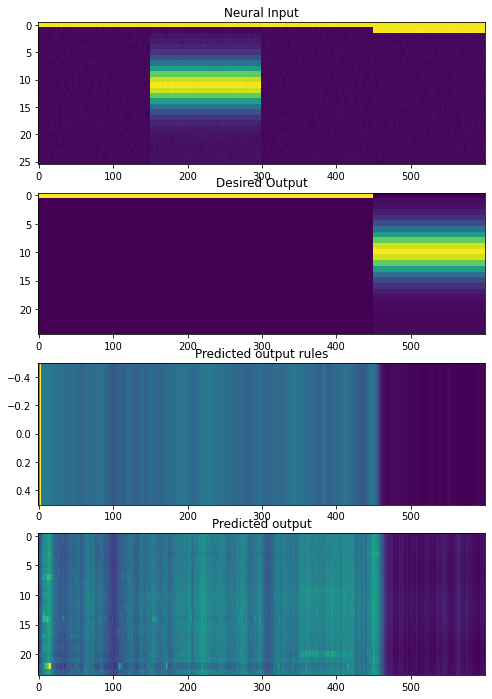

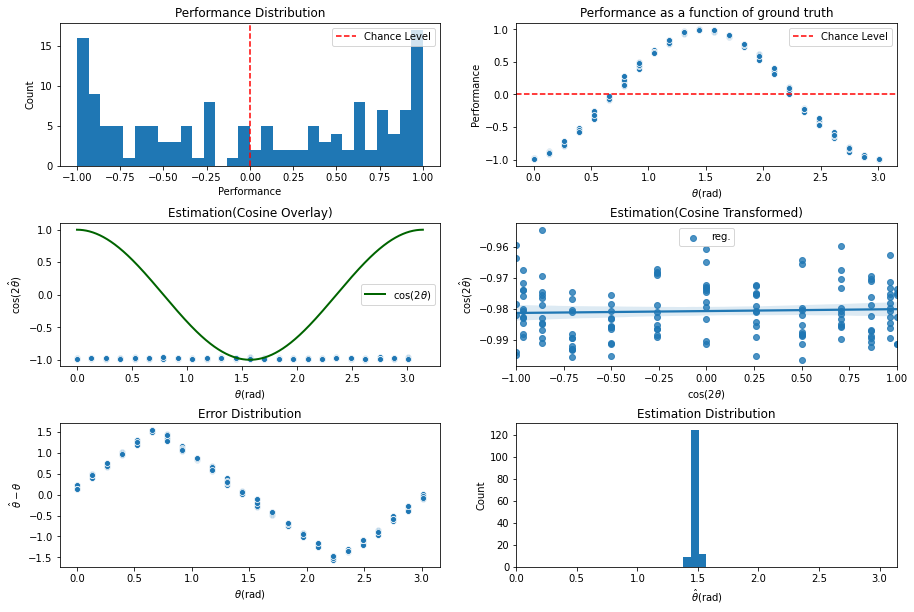

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1000\assets

 Training performance: 
Iter. 1001 | Performance -0.0525 | Loss 0.3251 | Spike loss 2.4706
Testing performance: 
Iter. 1001 | Performance -0.0050 | Loss 0.3235 | Spike loss 2.4560

 Training performance: 
Iter. 1002 | Performance 0.0098 | Loss 0.3233 | Spike loss 2.4649
Testing performance: 
Iter. 1002 | Performance 0.0017 | Loss 0.3243 | Spike loss 2.4575

 Training performance: 
Iter. 1003 | Performance -0.0866 | Loss 0.3242 | Spike loss 2.4511
Testing performance: 
Iter. 1003 | Performance 0.0004 | Loss 0.3254 | Spike loss 2.4524

 Training performance: 
Iter. 1004 | Performance 0.0641 | Loss 0.3254 | Spike loss 2.4490
Testing performance: 
Iter. 1004 | Performance -0.0013 | Loss 0.3236 | Spike loss 2.4636

 Training performance: 
Iter. 1005 | Performance 0.0183 | Loss 0.3240 | Spike loss 2.4560
Testing performance: 
Iter. 1005 | Performance -0.0004 | Loss 0.3246 | Spike loss 2.4619

 Trainin


 Training performance: 
Iter. 1047 | Performance -0.0924 | Loss 0.3238 | Spike loss 2.4436
Testing performance: 
Iter. 1047 | Performance 0.0022 | Loss 0.3232 | Spike loss 2.4432

 Training performance: 
Iter. 1048 | Performance -0.0358 | Loss 0.3239 | Spike loss 2.4431
Testing performance: 
Iter. 1048 | Performance -0.0001 | Loss 0.3244 | Spike loss 2.4426

 Training performance: 
Iter. 1049 | Performance 0.0505 | Loss 0.3251 | Spike loss 2.4410
Testing performance: 
Iter. 1049 | Performance 0.0004 | Loss 0.3236 | Spike loss 2.4347

 Training performance: 
Iter. 1050 | Performance -0.1122 | Loss 0.3236 | Spike loss 2.4275
Testing performance: 
Iter. 1050 | Performance 0.0048 | Loss 0.3235 | Spike loss 2.4345

 Training performance: 
Iter. 1051 | Performance -0.0455 | Loss 0.3235 | Spike loss 2.4465
Testing performance: 
Iter. 1051 | Performance -0.0015 | Loss 0.3244 | Spike loss 2.4363

 Training performance: 
Iter. 1052 | Performance -0.0874 | Loss 0.3246 | Spike loss 2.4250
Testing


 Training performance: 
Iter. 1093 | Performance 0.0126 | Loss 0.3236 | Spike loss 2.4105
Testing performance: 
Iter. 1093 | Performance 0.0021 | Loss 0.3240 | Spike loss 2.4101

 Training performance: 
Iter. 1094 | Performance -0.0199 | Loss 0.3243 | Spike loss 2.4162
Testing performance: 
Iter. 1094 | Performance 0.0037 | Loss 0.3234 | Spike loss 2.4146

 Training performance: 
Iter. 1095 | Performance 0.0036 | Loss 0.3230 | Spike loss 2.4250
Testing performance: 
Iter. 1095 | Performance 0.0063 | Loss 0.3236 | Spike loss 2.4240

 Training performance: 
Iter. 1096 | Performance -0.0833 | Loss 0.3235 | Spike loss 2.4003
Testing performance: 
Iter. 1096 | Performance 0.0039 | Loss 0.3244 | Spike loss 2.4120

 Training performance: 
Iter. 1097 | Performance -0.0420 | Loss 0.3250 | Spike loss 2.4174
Testing performance: 
Iter. 1097 | Performance 0.0097 | Loss 0.3226 | Spike loss 2.3986

 Training performance: 
Iter. 1098 | Performance 0.0129 | Loss 0.3235 | Spike loss 2.4060
Testing per

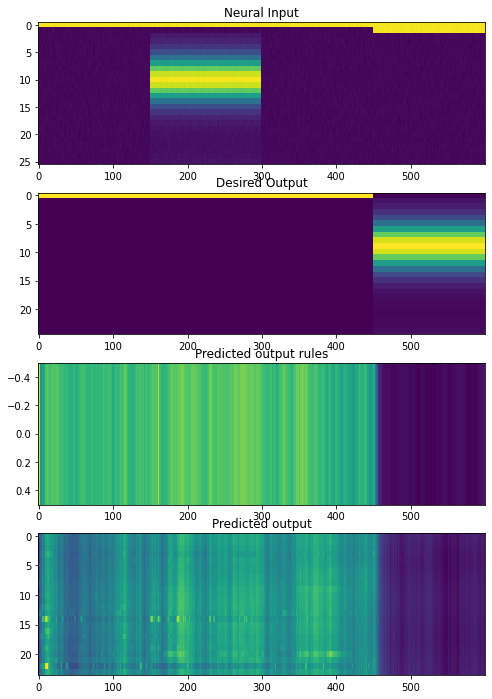

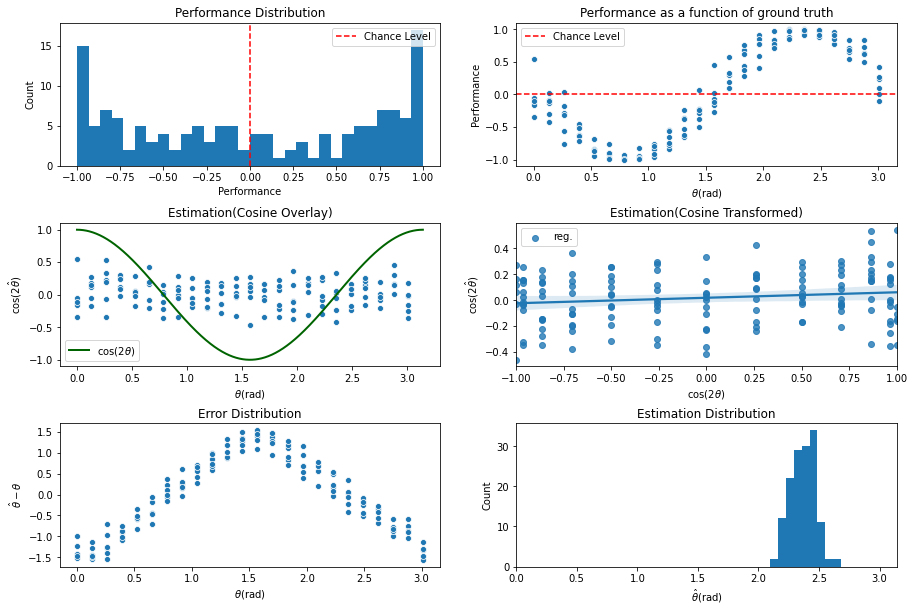

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1100\assets

 Training performance: 
Iter. 1101 | Performance -0.0477 | Loss 0.3230 | Spike loss 2.4092
Testing performance: 
Iter. 1101 | Performance 0.0130 | Loss 0.3232 | Spike loss 2.4025

 Training performance: 
Iter. 1102 | Performance 0.0238 | Loss 0.3235 | Spike loss 2.3999
Testing performance: 
Iter. 1102 | Performance -0.0031 | Loss 0.3241 | Spike loss 2.3849

 Training performance: 
Iter. 1103 | Performance 0.0492 | Loss 0.3237 | Spike loss 2.4118
Testing performance: 
Iter. 1103 | Performance -0.0010 | Loss 0.3228 | Spike loss 2.3889

 Training performance: 
Iter. 1104 | Performance -0.0619 | Loss 0.3224 | Spike loss 2.3974
Testing performance: 
Iter. 1104 | Performance -0.0096 | Loss 0.3234 | Spike loss 2.3958

 Training performance: 
Iter. 1105 | Performance -0.0701 | Loss 0.3231 | Spike loss 2.3923
Testing performance: 
Iter. 1105 | Performance 0.0104 | Loss 0.3238 | Spike loss 2.3981

 Traini


 Training performance: 
Iter. 1147 | Performance 0.0427 | Loss 0.3234 | Spike loss 2.3575
Testing performance: 
Iter. 1147 | Performance 0.0006 | Loss 0.3243 | Spike loss 2.3564

 Training performance: 
Iter. 1148 | Performance 0.0319 | Loss 0.3234 | Spike loss 2.3875
Testing performance: 
Iter. 1148 | Performance -0.0004 | Loss 0.3232 | Spike loss 2.3715

 Training performance: 
Iter. 1149 | Performance -0.0364 | Loss 0.3241 | Spike loss 2.3454
Testing performance: 
Iter. 1149 | Performance -0.0008 | Loss 0.3233 | Spike loss 2.3607

 Training performance: 
Iter. 1150 | Performance -0.0587 | Loss 0.3232 | Spike loss 2.3650
Testing performance: 
Iter. 1150 | Performance 0.0019 | Loss 0.3242 | Spike loss 2.3696

 Training performance: 
Iter. 1151 | Performance 0.1479 | Loss 0.3245 | Spike loss 2.3610
Testing performance: 
Iter. 1151 | Performance 0.0040 | Loss 0.3224 | Spike loss 2.3657

 Training performance: 
Iter. 1152 | Performance 0.0164 | Loss 0.3222 | Spike loss 2.3650
Testing pe


 Training performance: 
Iter. 1193 | Performance -0.0206 | Loss 0.3229 | Spike loss 2.3450
Testing performance: 
Iter. 1193 | Performance 0.0004 | Loss 0.3220 | Spike loss 2.3389

 Training performance: 
Iter. 1194 | Performance 0.0159 | Loss 0.3222 | Spike loss 2.3387
Testing performance: 
Iter. 1194 | Performance 0.0042 | Loss 0.3232 | Spike loss 2.3403

 Training performance: 
Iter. 1195 | Performance -0.0404 | Loss 0.3232 | Spike loss 2.3304
Testing performance: 
Iter. 1195 | Performance -0.0035 | Loss 0.3238 | Spike loss 2.3457

 Training performance: 
Iter. 1196 | Performance 0.0552 | Loss 0.3242 | Spike loss 2.3240
Testing performance: 
Iter. 1196 | Performance 0.0026 | Loss 0.3222 | Spike loss 2.3340

 Training performance: 
Iter. 1197 | Performance 0.0396 | Loss 0.3220 | Spike loss 2.3253
Testing performance: 
Iter. 1197 | Performance 0.0001 | Loss 0.3234 | Spike loss 2.3417

 Training performance: 
Iter. 1198 | Performance -0.0353 | Loss 0.3223 | Spike loss 2.3387
Testing pe

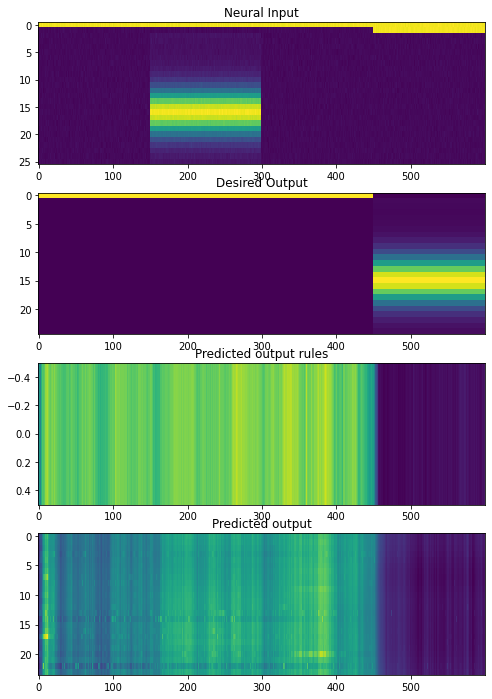

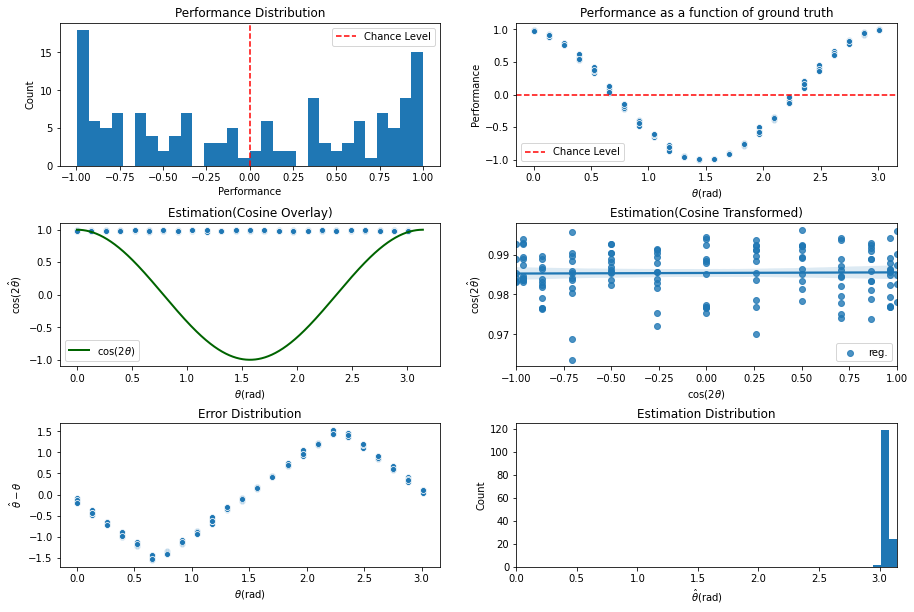

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1200\assets

 Training performance: 
Iter. 1201 | Performance -0.0439 | Loss 0.3226 | Spike loss 2.3380
Testing performance: 
Iter. 1201 | Performance -0.0014 | Loss 0.3236 | Spike loss 2.3194

 Training performance: 
Iter. 1202 | Performance -0.0746 | Loss 0.3232 | Spike loss 2.3403
Testing performance: 
Iter. 1202 | Performance 0.0039 | Loss 0.3221 | Spike loss 2.3295

 Training performance: 
Iter. 1203 | Performance -0.0066 | Loss 0.3217 | Spike loss 2.3427
Testing performance: 
Iter. 1203 | Performance 0.0042 | Loss 0.3233 | Spike loss 2.3218

 Training performance: 
Iter. 1204 | Performance 0.0186 | Loss 0.3228 | Spike loss 2.3447
Testing performance: 
Iter. 1204 | Performance -0.0050 | Loss 0.3238 | Spike loss 2.3277

 Training performance: 
Iter. 1205 | Performance -0.1188 | Loss 0.3244 | Spike loss 2.3361
Testing performance: 
Iter. 1205 | Performance -0.0020 | Loss 0.3224 | Spike loss 2.3296

 Train


 Training performance: 
Iter. 1247 | Performance -0.0532 | Loss 0.3232 | Spike loss 2.3012
Testing performance: 
Iter. 1247 | Performance -0.0005 | Loss 0.3220 | Spike loss 2.3053

 Training performance: 
Iter. 1248 | Performance 0.0690 | Loss 0.3217 | Spike loss 2.3045
Testing performance: 
Iter. 1248 | Performance 0.0249 | Loss 0.3224 | Spike loss 2.2865

 Training performance: 
Iter. 1249 | Performance 0.0231 | Loss 0.3224 | Spike loss 2.2903
Testing performance: 
Iter. 1249 | Performance 0.0056 | Loss 0.3234 | Spike loss 2.2901

 Training performance: 
Iter. 1250 | Performance 0.0713 | Loss 0.3236 | Spike loss 2.2858
Testing performance: 
Iter. 1250 | Performance 0.0052 | Loss 0.3219 | Spike loss 2.2951

 Training performance: 
Iter. 1251 | Performance 0.0634 | Loss 0.3216 | Spike loss 2.3020
Testing performance: 
Iter. 1251 | Performance -0.0035 | Loss 0.3222 | Spike loss 2.2931

 Training performance: 
Iter. 1252 | Performance 0.0357 | Loss 0.3223 | Spike loss 2.2925
Testing per


 Training performance: 
Iter. 1293 | Performance 0.0284 | Loss 0.3217 | Spike loss 2.2655
Testing performance: 
Iter. 1293 | Performance 0.0026 | Loss 0.3228 | Spike loss 2.2783

 Training performance: 
Iter. 1294 | Performance 0.0476 | Loss 0.3221 | Spike loss 2.2753
Testing performance: 
Iter. 1294 | Performance 0.0004 | Loss 0.3239 | Spike loss 2.2763

 Training performance: 
Iter. 1295 | Performance 0.0272 | Loss 0.3230 | Spike loss 2.2659
Testing performance: 
Iter. 1295 | Performance 0.0003 | Loss 0.3220 | Spike loss 2.2656

 Training performance: 
Iter. 1296 | Performance 0.0122 | Loss 0.3219 | Spike loss 2.2616
Testing performance: 
Iter. 1296 | Performance 0.0016 | Loss 0.3225 | Spike loss 2.2642

 Training performance: 
Iter. 1297 | Performance -0.0382 | Loss 0.3234 | Spike loss 2.2634
Testing performance: 
Iter. 1297 | Performance 0.0001 | Loss 0.3234 | Spike loss 2.2710

 Training performance: 
Iter. 1298 | Performance 0.0517 | Loss 0.3237 | Spike loss 2.2521
Testing perfo

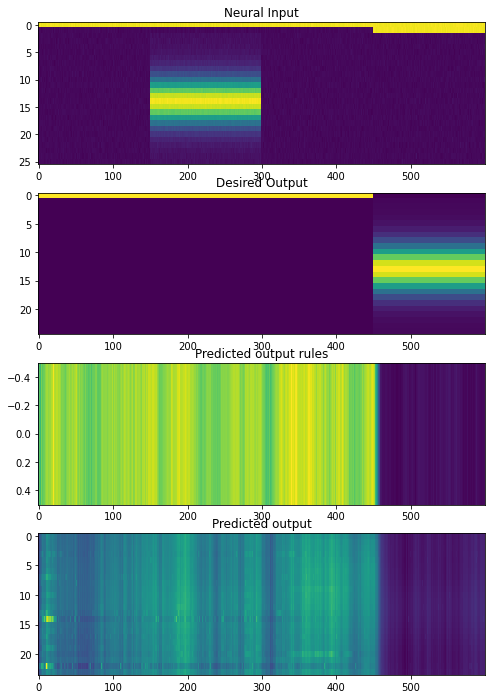

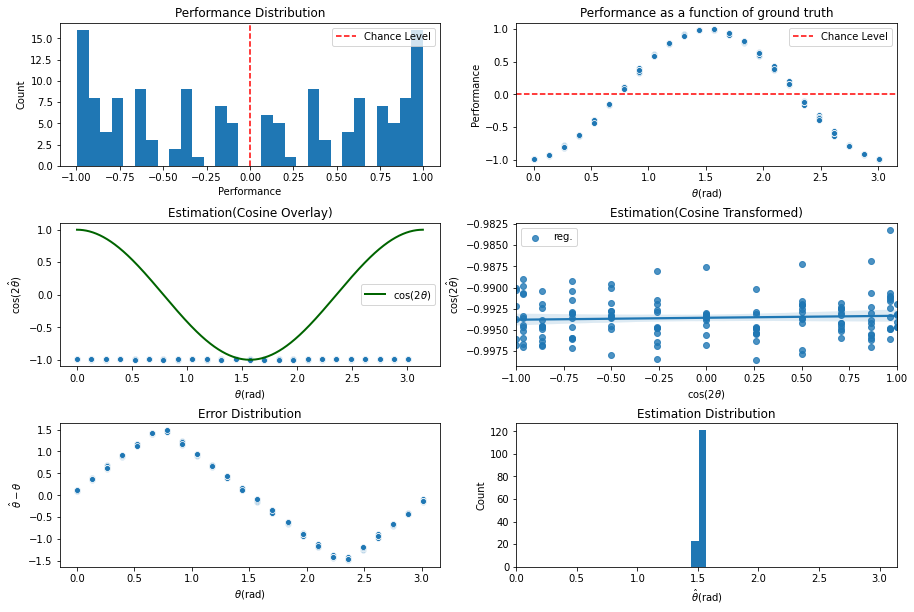

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1300\assets

 Training performance: 
Iter. 1301 | Performance 0.0841 | Loss 0.3221 | Spike loss 2.2669
Testing performance: 
Iter. 1301 | Performance 0.0032 | Loss 0.3217 | Spike loss 2.2585

 Training performance: 
Iter. 1302 | Performance -0.0476 | Loss 0.3219 | Spike loss 2.2564
Testing performance: 
Iter. 1302 | Performance 0.0000 | Loss 0.3223 | Spike loss 2.2387

 Training performance: 
Iter. 1303 | Performance 0.0489 | Loss 0.3214 | Spike loss 2.2481
Testing performance: 
Iter. 1303 | Performance -0.0013 | Loss 0.3229 | Spike loss 2.2530

 Training performance: 
Iter. 1304 | Performance -0.0916 | Loss 0.3235 | Spike loss 2.2453
Testing performance: 
Iter. 1304 | Performance 0.0029 | Loss 0.3215 | Spike loss 2.2519

 Training performance: 
Iter. 1305 | Performance 0.0084 | Loss 0.3218 | Spike loss 2.2571
Testing performance: 
Iter. 1305 | Performance -0.0027 | Loss 0.3220 | Spike loss 2.2379

 Training


 Training performance: 
Iter. 1347 | Performance 0.0678 | Loss 0.3225 | Spike loss 2.2093
Testing performance: 
Iter. 1347 | Performance -0.0021 | Loss 0.3225 | Spike loss 2.2369

 Training performance: 
Iter. 1348 | Performance -0.0480 | Loss 0.3231 | Spike loss 2.2292
Testing performance: 
Iter. 1348 | Performance -0.0002 | Loss 0.3230 | Spike loss 2.2287

 Training performance: 
Iter. 1349 | Performance -0.0480 | Loss 0.3227 | Spike loss 2.2273
Testing performance: 
Iter. 1349 | Performance -0.0027 | Loss 0.3216 | Spike loss 2.2222

 Training performance: 
Iter. 1350 | Performance -0.0344 | Loss 0.3215 | Spike loss 2.2278
Testing performance: 
Iter. 1350 | Performance 0.0022 | Loss 0.3218 | Spike loss 2.2221

 Training performance: 
Iter. 1351 | Performance 0.0043 | Loss 0.3216 | Spike loss 2.2135
Testing performance: 
Iter. 1351 | Performance 0.0060 | Loss 0.3227 | Spike loss 2.2167

 Training performance: 
Iter. 1352 | Performance 0.0208 | Loss 0.3233 | Spike loss 2.2258
Testing 


 Training performance: 
Iter. 1393 | Performance -0.0237 | Loss 0.3216 | Spike loss 2.1915
Testing performance: 
Iter. 1393 | Performance 0.0023 | Loss 0.3226 | Spike loss 2.1986

 Training performance: 
Iter. 1394 | Performance 0.0470 | Loss 0.3222 | Spike loss 2.1883
Testing performance: 
Iter. 1394 | Performance 0.0008 | Loss 0.3211 | Spike loss 2.1942

 Training performance: 
Iter. 1395 | Performance -0.0296 | Loss 0.3211 | Spike loss 2.1966
Testing performance: 
Iter. 1395 | Performance -0.0005 | Loss 0.3210 | Spike loss 2.1893

 Training performance: 
Iter. 1396 | Performance 0.0655 | Loss 0.3215 | Spike loss 2.1904
Testing performance: 
Iter. 1396 | Performance 0.0360 | Loss 0.3219 | Spike loss 2.1990

 Training performance: 
Iter. 1397 | Performance 0.0446 | Loss 0.3219 | Spike loss 2.1909
Testing performance: 
Iter. 1397 | Performance 0.0089 | Loss 0.3207 | Spike loss 2.1934

 Training performance: 
Iter. 1398 | Performance 0.0518 | Loss 0.3208 | Spike loss 2.1858
Testing per

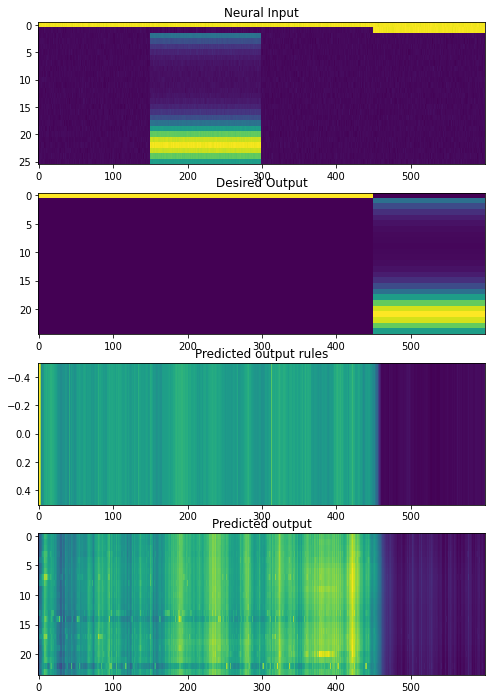

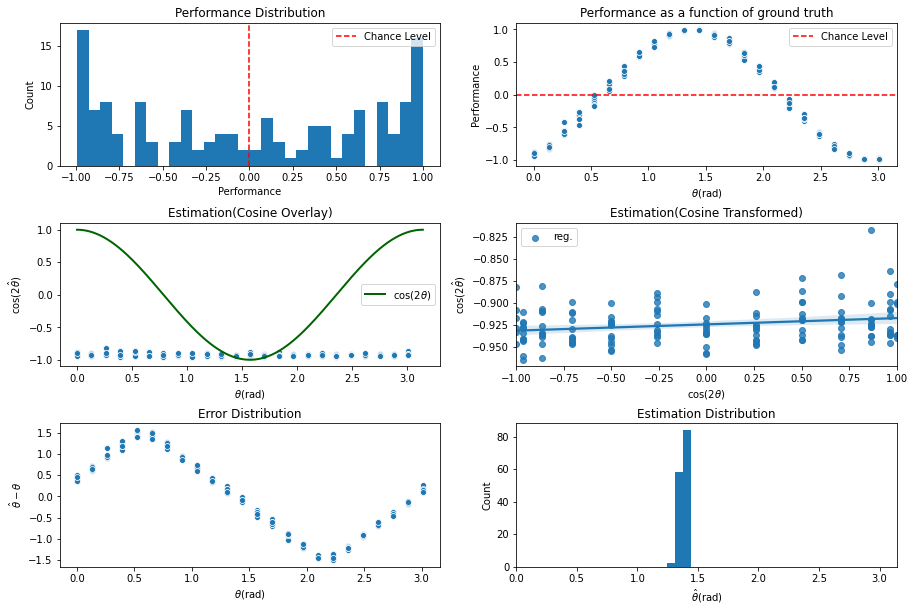

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1400\assets

 Training performance: 
Iter. 1401 | Performance -0.0251 | Loss 0.3211 | Spike loss 2.1803
Testing performance: 
Iter. 1401 | Performance -0.0038 | Loss 0.3216 | Spike loss 2.1973

 Training performance: 
Iter. 1402 | Performance -0.0188 | Loss 0.3214 | Spike loss 2.1803
Testing performance: 
Iter. 1402 | Performance 0.0014 | Loss 0.3222 | Spike loss 2.1950

 Training performance: 
Iter. 1403 | Performance -0.0100 | Loss 0.3221 | Spike loss 2.1978
Testing performance: 
Iter. 1403 | Performance 0.0016 | Loss 0.3212 | Spike loss 2.1882

 Training performance: 
Iter. 1404 | Performance -0.0259 | Loss 0.3217 | Spike loss 2.1980
Testing performance: 
Iter. 1404 | Performance 0.0047 | Loss 0.3218 | Spike loss 2.1901

 Training performance: 
Iter. 1405 | Performance 0.0261 | Loss 0.3217 | Spike loss 2.1919
Testing performance: 
Iter. 1405 | Performance 0.0023 | Loss 0.3223 | Spike loss 2.1886

 Trainin


 Training performance: 
Iter. 1447 | Performance -0.0592 | Loss 0.3212 | Spike loss 2.1660
Testing performance: 
Iter. 1447 | Performance 0.0006 | Loss 0.3225 | Spike loss 2.1634

 Training performance: 
Iter. 1448 | Performance -0.0580 | Loss 0.3224 | Spike loss 2.1592
Testing performance: 
Iter. 1448 | Performance 0.0047 | Loss 0.3209 | Spike loss 2.1701

 Training performance: 
Iter. 1449 | Performance -0.0688 | Loss 0.3209 | Spike loss 2.1658
Testing performance: 
Iter. 1449 | Performance 0.0031 | Loss 0.3217 | Spike loss 2.1730

 Training performance: 
Iter. 1450 | Performance 0.0270 | Loss 0.3220 | Spike loss 2.1741
Testing performance: 
Iter. 1450 | Performance 0.0047 | Loss 0.3224 | Spike loss 2.1716

 Training performance: 
Iter. 1451 | Performance 0.0435 | Loss 0.3226 | Spike loss 2.1729
Testing performance: 
Iter. 1451 | Performance 0.0006 | Loss 0.3208 | Spike loss 2.1771

 Training performance: 
Iter. 1452 | Performance -0.0504 | Loss 0.3214 | Spike loss 2.1699
Testing pe


 Training performance: 
Iter. 1493 | Performance -0.0362 | Loss 0.3224 | Spike loss 2.1633
Testing performance: 
Iter. 1493 | Performance 0.0007 | Loss 0.3206 | Spike loss 2.1579

 Training performance: 
Iter. 1494 | Performance 0.1057 | Loss 0.3206 | Spike loss 2.1523
Testing performance: 
Iter. 1494 | Performance -0.0007 | Loss 0.3211 | Spike loss 2.1502

 Training performance: 
Iter. 1495 | Performance 0.0882 | Loss 0.3208 | Spike loss 2.1602
Testing performance: 
Iter. 1495 | Performance 0.0037 | Loss 0.3218 | Spike loss 2.1510

 Training performance: 
Iter. 1496 | Performance 0.1648 | Loss 0.3213 | Spike loss 2.1538
Testing performance: 
Iter. 1496 | Performance 0.0015 | Loss 0.3208 | Spike loss 2.1457

 Training performance: 
Iter. 1497 | Performance 0.0032 | Loss 0.3204 | Spike loss 2.1470
Testing performance: 
Iter. 1497 | Performance 0.0005 | Loss 0.3212 | Spike loss 2.1475

 Training performance: 
Iter. 1498 | Performance 0.0488 | Loss 0.3217 | Spike loss 2.1509
Testing perf

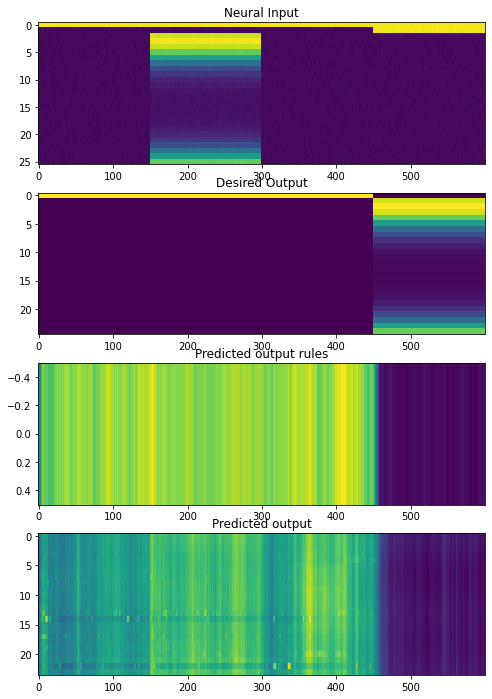

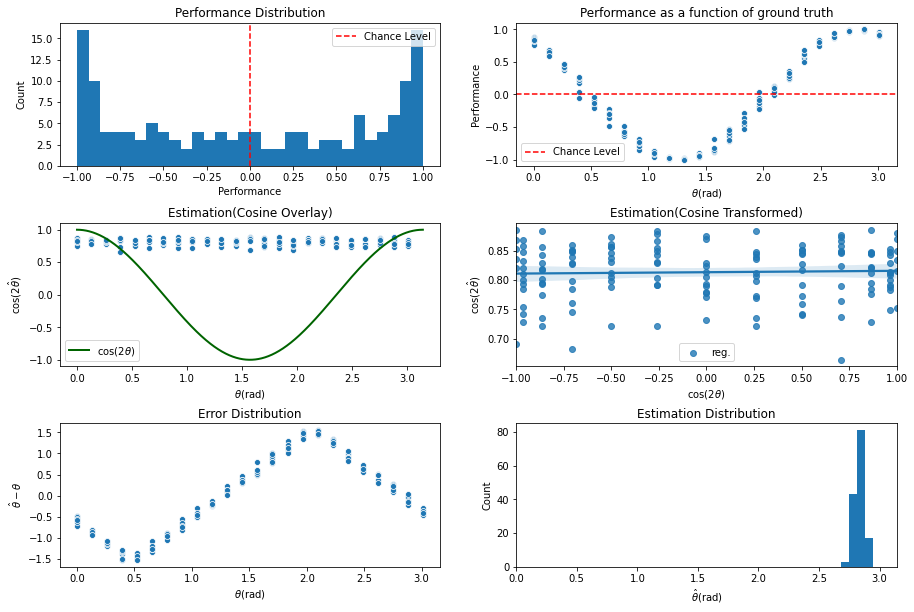

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1500\assets

 Training performance: 
Iter. 1501 | Performance -0.0063 | Loss 0.3209 | Spike loss 2.1429
Testing performance: 
Iter. 1501 | Performance -0.0012 | Loss 0.3216 | Spike loss 2.1438

 Training performance: 
Iter. 1502 | Performance -0.1114 | Loss 0.3213 | Spike loss 2.1375
Testing performance: 
Iter. 1502 | Performance 0.0055 | Loss 0.3207 | Spike loss 2.1410

 Training performance: 
Iter. 1503 | Performance 0.0687 | Loss 0.3206 | Spike loss 2.1448
Testing performance: 
Iter. 1503 | Performance 0.0021 | Loss 0.3211 | Spike loss 2.1507

 Training performance: 
Iter. 1504 | Performance -0.1071 | Loss 0.3206 | Spike loss 2.1280
Testing performance: 
Iter. 1504 | Performance 0.0053 | Loss 0.3220 | Spike loss 2.1343

 Training performance: 
Iter. 1505 | Performance 0.0304 | Loss 0.3222 | Spike loss 2.1410
Testing performance: 
Iter. 1505 | Performance -0.0019 | Loss 0.3209 | Spike loss 2.1366

 Trainin


 Training performance: 
Iter. 1547 | Performance -0.0925 | Loss 0.3221 | Spike loss 2.1173
Testing performance: 
Iter. 1547 | Performance 0.0076 | Loss 0.3206 | Spike loss 2.1166

 Training performance: 
Iter. 1548 | Performance -0.0502 | Loss 0.3207 | Spike loss 2.1150
Testing performance: 
Iter. 1548 | Performance 0.0037 | Loss 0.3208 | Spike loss 2.1296

 Training performance: 
Iter. 1549 | Performance 0.0533 | Loss 0.3205 | Spike loss 2.1156
Testing performance: 
Iter. 1549 | Performance 0.0048 | Loss 0.3218 | Spike loss 2.1302

 Training performance: 
Iter. 1550 | Performance 0.0606 | Loss 0.3218 | Spike loss 2.1022
Testing performance: 
Iter. 1550 | Performance -0.0015 | Loss 0.3204 | Spike loss 2.1216

 Training performance: 
Iter. 1551 | Performance 0.0346 | Loss 0.3202 | Spike loss 2.1303
Testing performance: 
Iter. 1551 | Performance 0.0077 | Loss 0.3207 | Spike loss 2.1223

 Training performance: 
Iter. 1552 | Performance -0.0833 | Loss 0.3208 | Spike loss 2.1197
Testing pe


 Training performance: 
Iter. 1593 | Performance -0.0509 | Loss 0.3208 | Spike loss 2.1016
Testing performance: 
Iter. 1593 | Performance 0.0054 | Loss 0.3206 | Spike loss 2.1164

 Training performance: 
Iter. 1594 | Performance 0.0913 | Loss 0.3204 | Spike loss 2.1003
Testing performance: 
Iter. 1594 | Performance -0.0062 | Loss 0.3217 | Spike loss 2.1068

 Training performance: 
Iter. 1595 | Performance 0.0375 | Loss 0.3216 | Spike loss 2.1054
Testing performance: 
Iter. 1595 | Performance 0.0250 | Loss 0.3202 | Spike loss 2.0860

 Training performance: 
Iter. 1596 | Performance -0.1066 | Loss 0.3201 | Spike loss 2.1057
Testing performance: 
Iter. 1596 | Performance 0.0148 | Loss 0.3203 | Spike loss 2.0945

 Training performance: 
Iter. 1597 | Performance -0.0321 | Loss 0.3207 | Spike loss 2.0968
Testing performance: 
Iter. 1597 | Performance 0.0031 | Loss 0.3215 | Spike loss 2.0852

 Training performance: 
Iter. 1598 | Performance 0.1178 | Loss 0.3214 | Spike loss 2.0998
Testing pe

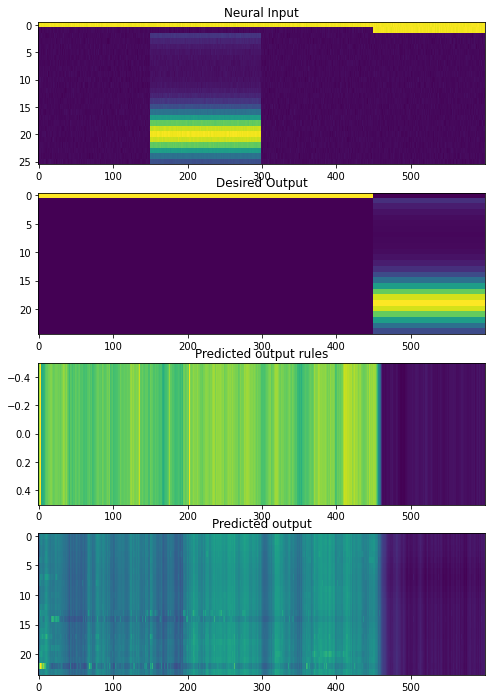

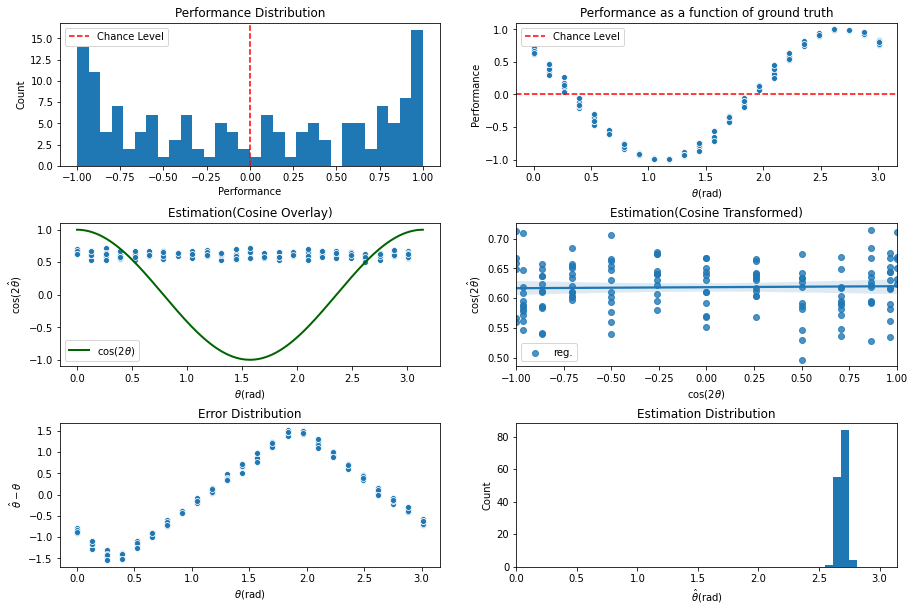

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1600\assets

 Training performance: 
Iter. 1601 | Performance -0.0433 | Loss 0.3216 | Spike loss 2.0921
Testing performance: 
Iter. 1601 | Performance 0.0020 | Loss 0.3201 | Spike loss 2.0879

 Training performance: 
Iter. 1602 | Performance -0.1075 | Loss 0.3196 | Spike loss 2.1038
Testing performance: 
Iter. 1602 | Performance -0.0004 | Loss 0.3208 | Spike loss 2.0786

 Training performance: 
Iter. 1603 | Performance 0.0028 | Loss 0.3205 | Spike loss 2.0960
Testing performance: 
Iter. 1603 | Performance 0.0012 | Loss 0.3217 | Spike loss 2.0890

 Training performance: 
Iter. 1604 | Performance 0.1191 | Loss 0.3215 | Spike loss 2.0802
Testing performance: 
Iter. 1604 | Performance 0.0036 | Loss 0.3204 | Spike loss 2.0898

 Training performance: 
Iter. 1605 | Performance 0.1370 | Loss 0.3197 | Spike loss 2.0899
Testing performance: 
Iter. 1605 | Performance 0.0020 | Loss 0.3208 | Spike loss 2.0847

 Training 


 Training performance: 
Iter. 1647 | Performance 0.0390 | Loss 0.3199 | Spike loss 2.0661
Testing performance: 
Iter. 1647 | Performance 0.0008 | Loss 0.3207 | Spike loss 2.0763

 Training performance: 
Iter. 1648 | Performance 0.0413 | Loss 0.3203 | Spike loss 2.0723
Testing performance: 
Iter. 1648 | Performance 0.0018 | Loss 0.3210 | Spike loss 2.0661

 Training performance: 
Iter. 1649 | Performance 0.0050 | Loss 0.3216 | Spike loss 2.0727
Testing performance: 
Iter. 1649 | Performance 0.0052 | Loss 0.3201 | Spike loss 2.0706

 Training performance: 
Iter. 1650 | Performance -0.1106 | Loss 0.3198 | Spike loss 2.0577
Testing performance: 
Iter. 1650 | Performance -0.0027 | Loss 0.3205 | Spike loss 2.0641

 Training performance: 
Iter. 1651 | Performance -0.0243 | Loss 0.3201 | Spike loss 2.0650
Testing performance: 
Iter. 1651 | Performance 0.0045 | Loss 0.3211 | Spike loss 2.0662

 Training performance: 
Iter. 1652 | Performance -0.1034 | Loss 0.3212 | Spike loss 2.0686
Testing pe


 Training performance: 
Iter. 1693 | Performance 0.0071 | Loss 0.3207 | Spike loss 2.0456
Testing performance: 
Iter. 1693 | Performance 0.0043 | Loss 0.3212 | Spike loss 2.0486

 Training performance: 
Iter. 1694 | Performance 0.1694 | Loss 0.3213 | Spike loss 2.0438
Testing performance: 
Iter. 1694 | Performance 0.0027 | Loss 0.3201 | Spike loss 2.0339

 Training performance: 
Iter. 1695 | Performance -0.1366 | Loss 0.3205 | Spike loss 2.0453
Testing performance: 
Iter. 1695 | Performance -0.0001 | Loss 0.3203 | Spike loss 2.0505

 Training performance: 
Iter. 1696 | Performance 0.0241 | Loss 0.3204 | Spike loss 2.0511
Testing performance: 
Iter. 1696 | Performance -0.0001 | Loss 0.3210 | Spike loss 2.0447

 Training performance: 
Iter. 1697 | Performance 0.1671 | Loss 0.3215 | Spike loss 2.0486
Testing performance: 
Iter. 1697 | Performance 0.0037 | Loss 0.3199 | Spike loss 2.0413

 Training performance: 
Iter. 1698 | Performance 0.0617 | Loss 0.3196 | Spike loss 2.0369
Testing per

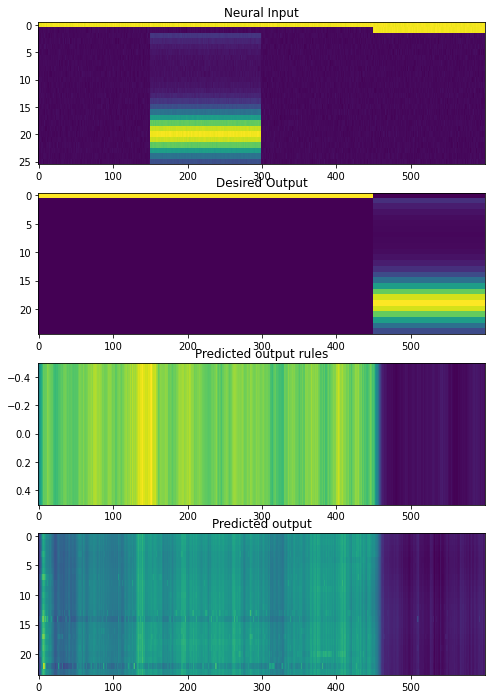

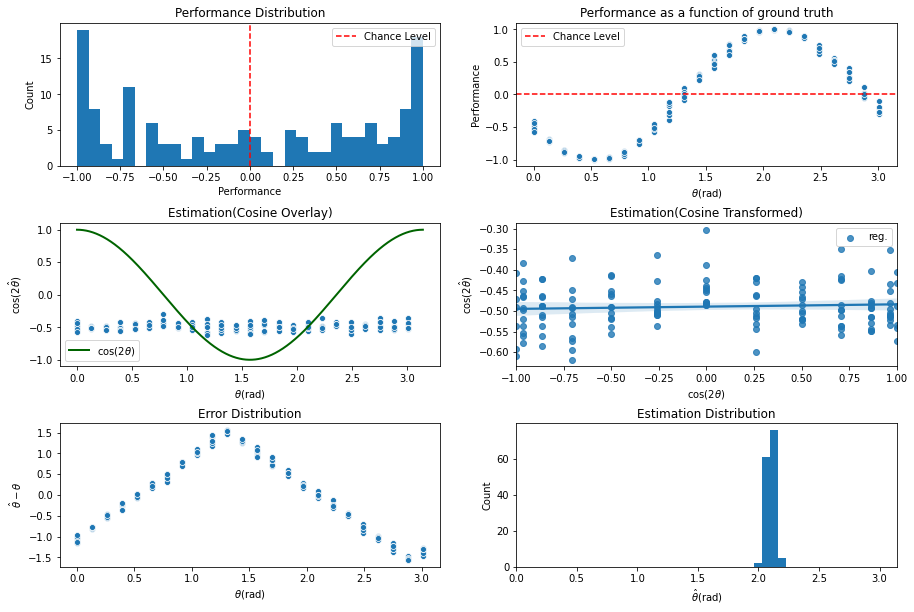

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1700\assets

 Training performance: 
Iter. 1701 | Performance -0.0874 | Loss 0.3198 | Spike loss 2.0399
Testing performance: 
Iter. 1701 | Performance 0.0065 | Loss 0.3209 | Spike loss 2.0454

 Training performance: 
Iter. 1702 | Performance -0.1106 | Loss 0.3203 | Spike loss 2.0340
Testing performance: 
Iter. 1702 | Performance 0.0023 | Loss 0.3222 | Spike loss 2.0433

 Training performance: 
Iter. 1703 | Performance -0.0618 | Loss 0.3218 | Spike loss 2.0421
Testing performance: 
Iter. 1703 | Performance 0.0001 | Loss 0.3209 | Spike loss 2.0357

 Training performance: 
Iter. 1704 | Performance 0.0514 | Loss 0.3211 | Spike loss 2.0320
Testing performance: 
Iter. 1704 | Performance 0.0008 | Loss 0.3203 | Spike loss 2.0312

 Training performance: 
Iter. 1705 | Performance 0.0193 | Loss 0.3200 | Spike loss 2.0455
Testing performance: 
Iter. 1705 | Performance -0.0015 | Loss 0.3207 | Spike loss 2.0372

 Training


 Training performance: 
Iter. 1747 | Performance 0.0100 | Loss 0.3198 | Spike loss 1.9884
Testing performance: 
Iter. 1747 | Performance 0.0050 | Loss 0.3209 | Spike loss 1.9996

 Training performance: 
Iter. 1748 | Performance -0.0822 | Loss 0.3212 | Spike loss 1.9890
Testing performance: 
Iter. 1748 | Performance -0.0019 | Loss 0.3198 | Spike loss 1.9993

 Training performance: 
Iter. 1749 | Performance -0.0148 | Loss 0.3201 | Spike loss 2.0033
Testing performance: 
Iter. 1749 | Performance 0.0073 | Loss 0.3199 | Spike loss 1.9971

 Training performance: 
Iter. 1750 | Performance -0.0083 | Loss 0.3202 | Spike loss 1.9973
Testing performance: 
Iter. 1750 | Performance 0.0017 | Loss 0.3209 | Spike loss 1.9863

 Training performance: 
Iter. 1751 | Performance 0.0329 | Loss 0.3211 | Spike loss 1.9974
Testing performance: 
Iter. 1751 | Performance -0.0037 | Loss 0.3196 | Spike loss 1.9939

 Training performance: 
Iter. 1752 | Performance -0.1318 | Loss 0.3196 | Spike loss 1.9985
Testing 


 Training performance: 
Iter. 1793 | Performance -0.0189 | Loss 0.3204 | Spike loss 1.9799
Testing performance: 
Iter. 1793 | Performance -0.0061 | Loss 0.3196 | Spike loss 1.9811

 Training performance: 
Iter. 1794 | Performance 0.0112 | Loss 0.3195 | Spike loss 1.9648
Testing performance: 
Iter. 1794 | Performance 0.0098 | Loss 0.3195 | Spike loss 1.9806

 Training performance: 
Iter. 1795 | Performance -0.0965 | Loss 0.3196 | Spike loss 1.9752
Testing performance: 
Iter. 1795 | Performance 0.0146 | Loss 0.3201 | Spike loss 1.9839

 Training performance: 
Iter. 1796 | Performance -0.0394 | Loss 0.3202 | Spike loss 1.9660
Testing performance: 
Iter. 1796 | Performance -0.0036 | Loss 0.3195 | Spike loss 1.9728

 Training performance: 
Iter. 1797 | Performance 0.0498 | Loss 0.3202 | Spike loss 1.9757
Testing performance: 
Iter. 1797 | Performance 0.0024 | Loss 0.3197 | Spike loss 1.9799

 Training performance: 
Iter. 1798 | Performance -0.0587 | Loss 0.3196 | Spike loss 1.9812
Testing 

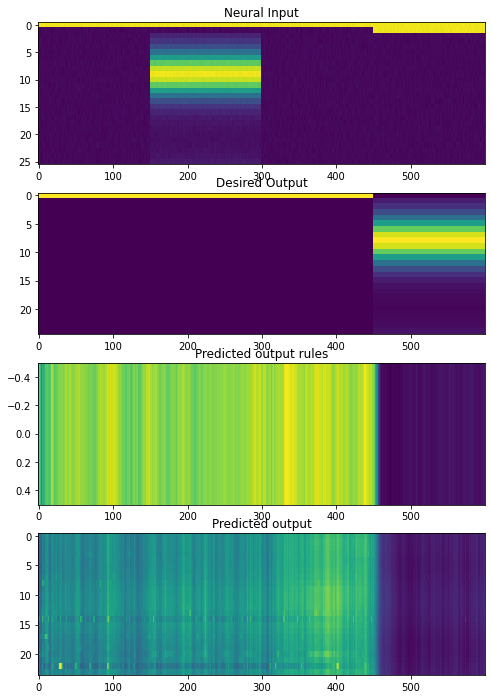

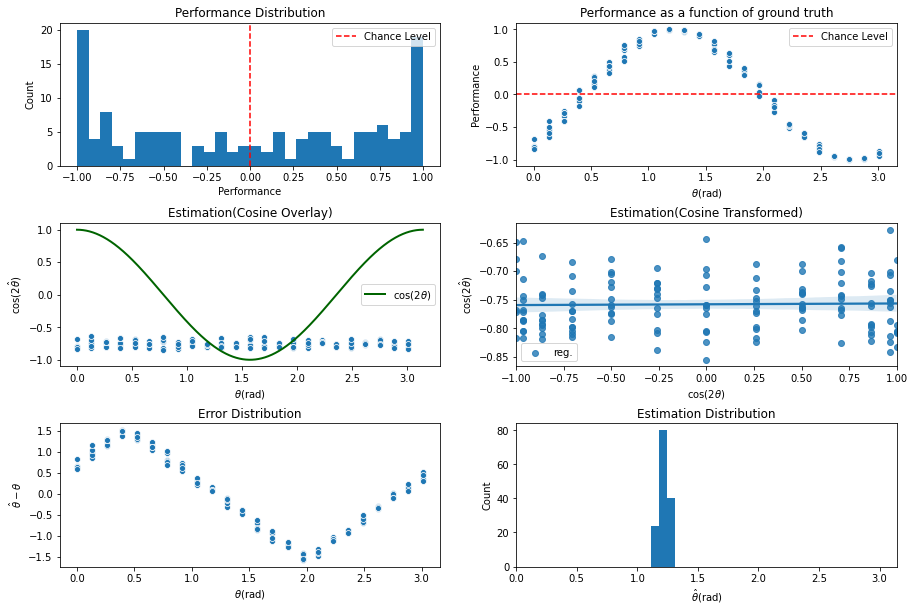

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1800\assets

 Training performance: 
Iter. 1801 | Performance -0.0661 | Loss 0.3194 | Spike loss 1.9934
Testing performance: 
Iter. 1801 | Performance 0.0034 | Loss 0.3197 | Spike loss 1.9684

 Training performance: 
Iter. 1802 | Performance -0.0099 | Loss 0.3192 | Spike loss 1.9711
Testing performance: 
Iter. 1802 | Performance 0.0118 | Loss 0.3197 | Spike loss 1.9776

 Training performance: 
Iter. 1803 | Performance -0.1079 | Loss 0.3197 | Spike loss 1.9705
Testing performance: 
Iter. 1803 | Performance -0.0011 | Loss 0.3197 | Spike loss 1.9697

 Training performance: 
Iter. 1804 | Performance -0.0782 | Loss 0.3197 | Spike loss 1.9727
Testing performance: 
Iter. 1804 | Performance 0.0031 | Loss 0.3196 | Spike loss 1.9628

 Training performance: 
Iter. 1805 | Performance 0.0084 | Loss 0.3203 | Spike loss 1.9750
Testing performance: 
Iter. 1805 | Performance 0.0021 | Loss 0.3197 | Spike loss 1.9661

 Trainin


 Training performance: 
Iter. 1847 | Performance 0.0383 | Loss 0.3190 | Spike loss 1.9789
Testing performance: 
Iter. 1847 | Performance 0.0124 | Loss 0.3195 | Spike loss 1.9747

 Training performance: 
Iter. 1848 | Performance 0.0412 | Loss 0.3189 | Spike loss 1.9855
Testing performance: 
Iter. 1848 | Performance 0.0218 | Loss 0.3191 | Spike loss 1.9772

 Training performance: 
Iter. 1849 | Performance 0.0504 | Loss 0.3192 | Spike loss 1.9843
Testing performance: 
Iter. 1849 | Performance 0.0316 | Loss 0.3191 | Spike loss 1.9757

 Training performance: 
Iter. 1850 | Performance -0.0627 | Loss 0.3191 | Spike loss 1.9693
Testing performance: 
Iter. 1850 | Performance 0.0167 | Loss 0.3198 | Spike loss 1.9660

 Training performance: 
Iter. 1851 | Performance -0.1153 | Loss 0.3192 | Spike loss 1.9665
Testing performance: 
Iter. 1851 | Performance 0.0773 | Loss 0.3192 | Spike loss 1.9720

 Training performance: 
Iter. 1852 | Performance 0.0060 | Loss 0.3193 | Spike loss 1.9691
Testing perf


 Training performance: 
Iter. 1893 | Performance 0.0347 | Loss 0.3190 | Spike loss 1.9808
Testing performance: 
Iter. 1893 | Performance -0.0052 | Loss 0.3190 | Spike loss 1.9791

 Training performance: 
Iter. 1894 | Performance 0.0164 | Loss 0.3195 | Spike loss 1.9884
Testing performance: 
Iter. 1894 | Performance 0.0055 | Loss 0.3192 | Spike loss 1.9881

 Training performance: 
Iter. 1895 | Performance -0.0143 | Loss 0.3189 | Spike loss 1.9798
Testing performance: 
Iter. 1895 | Performance 0.0077 | Loss 0.3191 | Spike loss 2.0001

 Training performance: 
Iter. 1896 | Performance 0.1153 | Loss 0.3188 | Spike loss 1.9798
Testing performance: 
Iter. 1896 | Performance 0.0039 | Loss 0.3194 | Spike loss 1.9767

 Training performance: 
Iter. 1897 | Performance 0.1136 | Loss 0.3202 | Spike loss 1.9851
Testing performance: 
Iter. 1897 | Performance 0.0049 | Loss 0.3196 | Spike loss 1.9832

 Training performance: 
Iter. 1898 | Performance -0.0206 | Loss 0.3190 | Spike loss 1.9853
Testing per

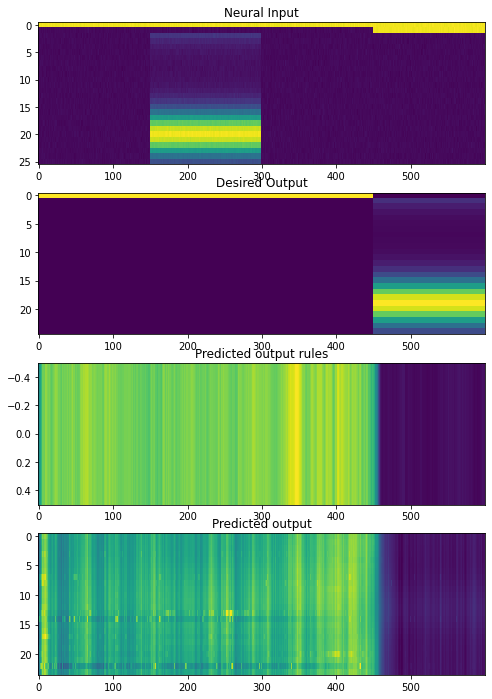

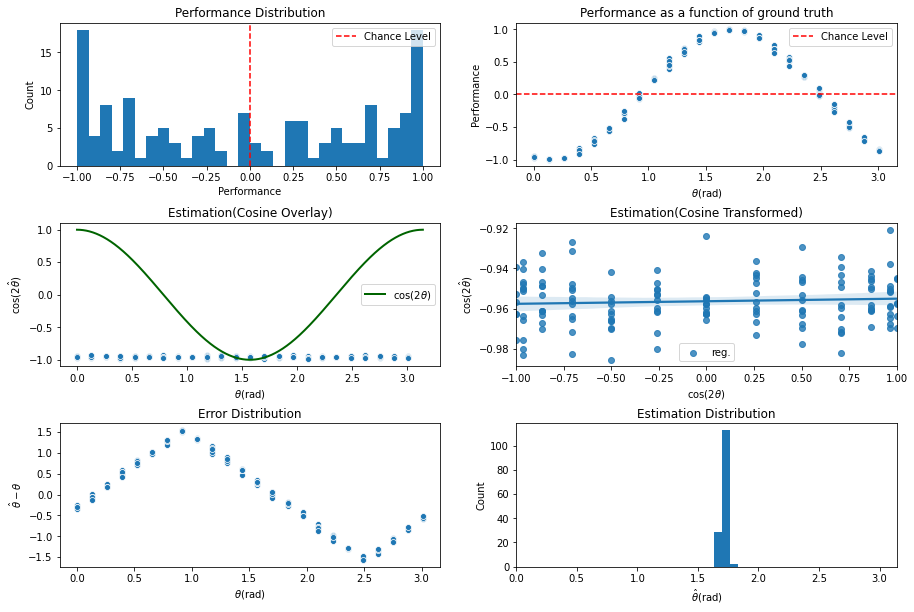

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter1900\assets

 Training performance: 
Iter. 1901 | Performance 0.0984 | Loss 0.3191 | Spike loss 1.9859
Testing performance: 
Iter. 1901 | Performance 0.0024 | Loss 0.3192 | Spike loss 1.9859

 Training performance: 
Iter. 1902 | Performance -0.0396 | Loss 0.3189 | Spike loss 1.9886
Testing performance: 
Iter. 1902 | Performance 0.0027 | Loss 0.3191 | Spike loss 1.9991

 Training performance: 
Iter. 1903 | Performance 0.0588 | Loss 0.3196 | Spike loss 1.9893
Testing performance: 
Iter. 1903 | Performance 0.0028 | Loss 0.3194 | Spike loss 1.9911

 Training performance: 
Iter. 1904 | Performance 0.0636 | Loss 0.3189 | Spike loss 1.9903
Testing performance: 
Iter. 1904 | Performance -0.0366 | Loss 0.3189 | Spike loss 1.9939

 Training performance: 
Iter. 1905 | Performance 0.0087 | Loss 0.3191 | Spike loss 1.9935
Testing performance: 
Iter. 1905 | Performance -0.0092 | Loss 0.3190 | Spike loss 1.9732

 Training 


 Training performance: 
Iter. 1947 | Performance 0.0181 | Loss 0.3194 | Spike loss 1.9535
Testing performance: 
Iter. 1947 | Performance 0.0024 | Loss 0.3192 | Spike loss 1.9595

 Training performance: 
Iter. 1948 | Performance -0.0500 | Loss 0.3193 | Spike loss 1.9526
Testing performance: 
Iter. 1948 | Performance 0.0046 | Loss 0.3194 | Spike loss 1.9636

 Training performance: 
Iter. 1949 | Performance -0.0184 | Loss 0.3189 | Spike loss 1.9606
Testing performance: 
Iter. 1949 | Performance 0.0089 | Loss 0.3190 | Spike loss 1.9503

 Training performance: 
Iter. 1950 | Performance -0.0310 | Loss 0.3195 | Spike loss 1.9529
Testing performance: 
Iter. 1950 | Performance -0.0007 | Loss 0.3189 | Spike loss 1.9579

 Training performance: 
Iter. 1951 | Performance -0.0544 | Loss 0.3190 | Spike loss 1.9553
Testing performance: 
Iter. 1951 | Performance 0.0012 | Loss 0.3195 | Spike loss 1.9525

 Training performance: 
Iter. 1952 | Performance 0.0543 | Loss 0.3194 | Spike loss 1.9527
Testing p


 Training performance: 
Iter. 1993 | Performance -0.1095 | Loss 0.3178 | Spike loss 1.9570
Testing performance: 
Iter. 1993 | Performance 0.0036 | Loss 0.3210 | Spike loss 1.9572

 Training performance: 
Iter. 1994 | Performance -0.0209 | Loss 0.3227 | Spike loss 1.9623
Testing performance: 
Iter. 1994 | Performance 0.0009 | Loss 0.3213 | Spike loss 1.9581

 Training performance: 
Iter. 1995 | Performance 0.0134 | Loss 0.3213 | Spike loss 1.9533
Testing performance: 
Iter. 1995 | Performance 0.0009 | Loss 0.3204 | Spike loss 1.9475

 Training performance: 
Iter. 1996 | Performance 0.0006 | Loss 0.3193 | Spike loss 1.9577
Testing performance: 
Iter. 1996 | Performance 0.0033 | Loss 0.3206 | Spike loss 1.9562

 Training performance: 
Iter. 1997 | Performance -0.0874 | Loss 0.3184 | Spike loss 1.9582
Testing performance: 
Iter. 1997 | Performance 0.0002 | Loss 0.3201 | Spike loss 1.9533

 Training performance: 
Iter. 1998 | Performance 0.0323 | Loss 0.3196 | Spike loss 1.9573
Testing per

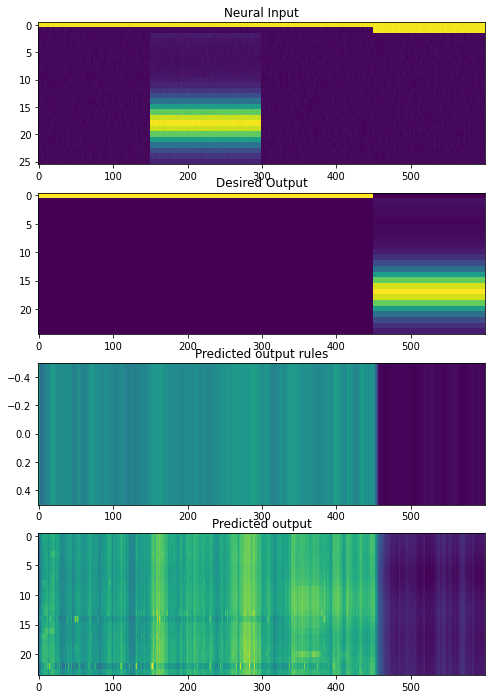

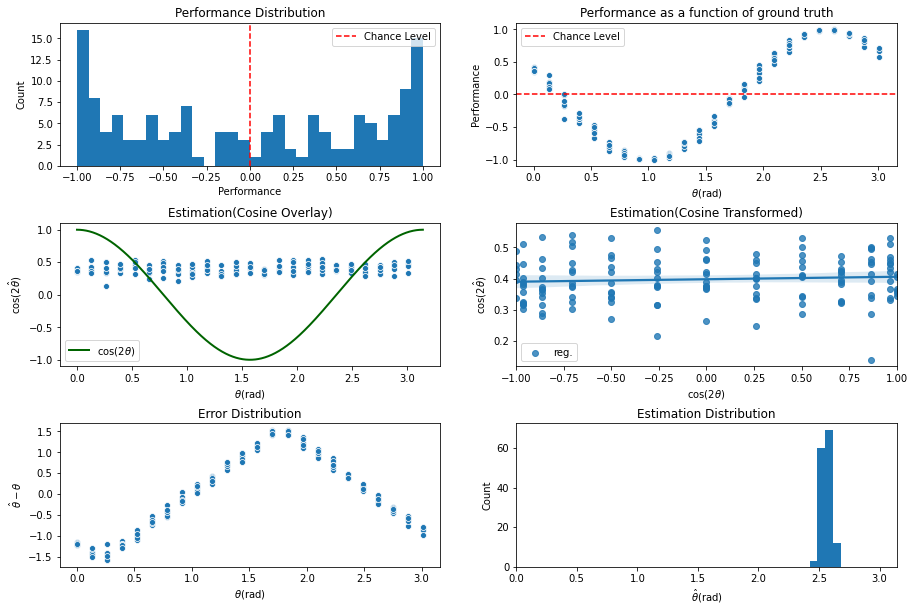

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2000\assets

 Training performance: 
Iter. 2001 | Performance 0.0527 | Loss 0.3195 | Spike loss 1.9566
Testing performance: 
Iter. 2001 | Performance 0.0057 | Loss 0.3192 | Spike loss 1.9533

 Training performance: 
Iter. 2002 | Performance -0.0326 | Loss 0.3194 | Spike loss 1.9527
Testing performance: 
Iter. 2002 | Performance -0.0004 | Loss 0.3187 | Spike loss 1.9536

 Training performance: 
Iter. 2003 | Performance 0.0564 | Loss 0.3188 | Spike loss 1.9591
Testing performance: 
Iter. 2003 | Performance 0.0309 | Loss 0.3192 | Spike loss 1.9585

 Training performance: 
Iter. 2004 | Performance 0.0086 | Loss 0.3193 | Spike loss 1.9601
Testing performance: 
Iter. 2004 | Performance -0.0011 | Loss 0.3193 | Spike loss 1.9706

 Training performance: 
Iter. 2005 | Performance 0.0982 | Loss 0.3191 | Spike loss 1.9563
Testing performance: 
Iter. 2005 | Performance 0.0026 | Loss 0.3188 | Spike loss 1.9570

 Training 


 Training performance: 
Iter. 2047 | Performance -0.1185 | Loss 0.3189 | Spike loss 1.9216
Testing performance: 
Iter. 2047 | Performance 0.0038 | Loss 0.3188 | Spike loss 1.9063

 Training performance: 
Iter. 2048 | Performance 0.0988 | Loss 0.3188 | Spike loss 1.9029
Testing performance: 
Iter. 2048 | Performance 0.0038 | Loss 0.3189 | Spike loss 1.9080

 Training performance: 
Iter. 2049 | Performance -0.0541 | Loss 0.3185 | Spike loss 1.9024
Testing performance: 
Iter. 2049 | Performance -0.0034 | Loss 0.3188 | Spike loss 1.9087

 Training performance: 
Iter. 2050 | Performance -0.0259 | Loss 0.3177 | Spike loss 1.9044
Testing performance: 
Iter. 2050 | Performance 0.0006 | Loss 0.3198 | Spike loss 1.9010

 Training performance: 
Iter. 2051 | Performance -0.1061 | Loss 0.3195 | Spike loss 1.8965
Testing performance: 
Iter. 2051 | Performance -0.0007 | Loss 0.3202 | Spike loss 1.9118

 Training performance: 
Iter. 2052 | Performance 0.0777 | Loss 0.3219 | Spike loss 1.8877
Testing 


 Training performance: 
Iter. 2093 | Performance -0.0440 | Loss 0.3189 | Spike loss 1.9040
Testing performance: 
Iter. 2093 | Performance -0.0031 | Loss 0.3185 | Spike loss 1.9103

 Training performance: 
Iter. 2094 | Performance 0.0973 | Loss 0.3184 | Spike loss 1.9039
Testing performance: 
Iter. 2094 | Performance 0.0111 | Loss 0.3189 | Spike loss 1.9166

 Training performance: 
Iter. 2095 | Performance 0.0010 | Loss 0.3187 | Spike loss 1.9076
Testing performance: 
Iter. 2095 | Performance 0.0097 | Loss 0.3188 | Spike loss 1.9169

 Training performance: 
Iter. 2096 | Performance 0.0101 | Loss 0.3184 | Spike loss 1.9120
Testing performance: 
Iter. 2096 | Performance 0.0035 | Loss 0.3183 | Spike loss 1.9092

 Training performance: 
Iter. 2097 | Performance -0.0447 | Loss 0.3186 | Spike loss 1.9183
Testing performance: 
Iter. 2097 | Performance -0.0122 | Loss 0.3185 | Spike loss 1.9182

 Training performance: 
Iter. 2098 | Performance 0.1280 | Loss 0.3183 | Spike loss 1.9155
Testing pe

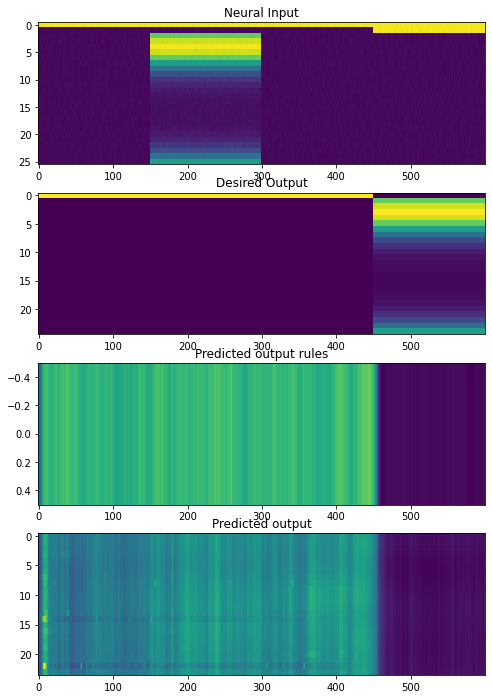

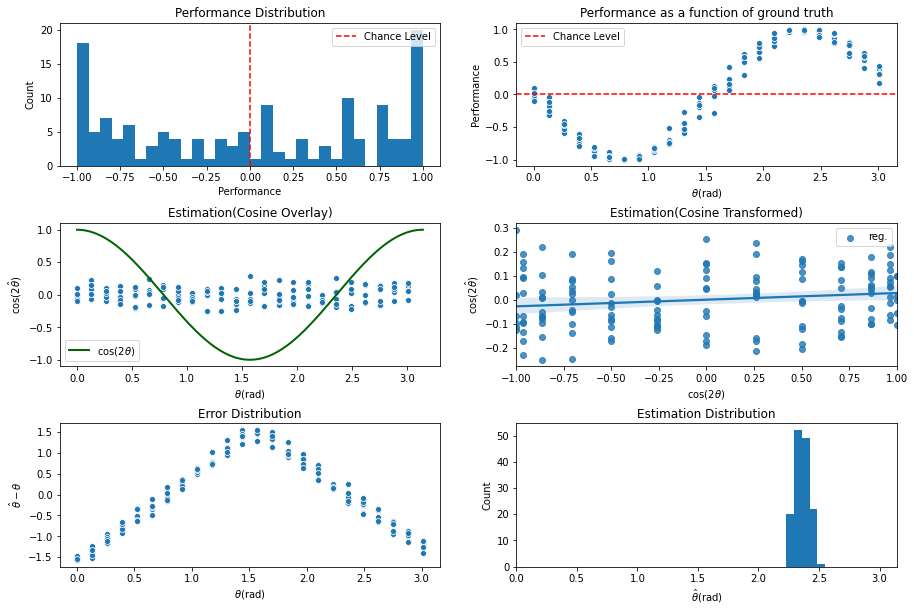

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2100\assets

 Training performance: 
Iter. 2101 | Performance 0.0224 | Loss 0.3189 | Spike loss 1.9140
Testing performance: 
Iter. 2101 | Performance -0.0036 | Loss 0.3186 | Spike loss 1.9138

 Training performance: 
Iter. 2102 | Performance 0.0131 | Loss 0.3186 | Spike loss 1.9177
Testing performance: 
Iter. 2102 | Performance 0.0316 | Loss 0.3188 | Spike loss 1.9134

 Training performance: 
Iter. 2103 | Performance -0.0194 | Loss 0.3185 | Spike loss 1.9192
Testing performance: 
Iter. 2103 | Performance 0.0265 | Loss 0.3186 | Spike loss 1.9196

 Training performance: 
Iter. 2104 | Performance 0.0082 | Loss 0.3190 | Spike loss 1.9123
Testing performance: 
Iter. 2104 | Performance -0.0075 | Loss 0.3187 | Spike loss 1.9208

 Training performance: 
Iter. 2105 | Performance -0.0261 | Loss 0.3183 | Spike loss 1.9222
Testing performance: 
Iter. 2105 | Performance 0.0086 | Loss 0.3187 | Spike loss 1.9128

 Training


 Training performance: 
Iter. 2147 | Performance 0.0711 | Loss 0.3186 | Spike loss 1.8924
Testing performance: 
Iter. 2147 | Performance -0.0029 | Loss 0.3185 | Spike loss 1.8893

 Training performance: 
Iter. 2148 | Performance -0.1004 | Loss 0.3186 | Spike loss 1.8856
Testing performance: 
Iter. 2148 | Performance 0.0017 | Loss 0.3184 | Spike loss 1.8885

 Training performance: 
Iter. 2149 | Performance -0.0351 | Loss 0.3181 | Spike loss 1.8869
Testing performance: 
Iter. 2149 | Performance 0.0026 | Loss 0.3184 | Spike loss 1.8877

 Training performance: 
Iter. 2150 | Performance 0.0557 | Loss 0.3180 | Spike loss 1.8851
Testing performance: 
Iter. 2150 | Performance 0.0054 | Loss 0.3186 | Spike loss 1.8826

 Training performance: 
Iter. 2151 | Performance 0.0142 | Loss 0.3190 | Spike loss 1.8884
Testing performance: 
Iter. 2151 | Performance 0.0051 | Loss 0.3185 | Spike loss 1.8902

 Training performance: 
Iter. 2152 | Performance -0.0202 | Loss 0.3182 | Spike loss 1.8838
Testing pe


 Training performance: 
Iter. 2193 | Performance 0.0896 | Loss 0.3179 | Spike loss 1.8786
Testing performance: 
Iter. 2193 | Performance 0.0034 | Loss 0.3184 | Spike loss 1.8786

 Training performance: 
Iter. 2194 | Performance -0.0019 | Loss 0.3184 | Spike loss 1.8790
Testing performance: 
Iter. 2194 | Performance 0.0026 | Loss 0.3184 | Spike loss 1.8700

 Training performance: 
Iter. 2195 | Performance -0.1343 | Loss 0.3174 | Spike loss 1.8805
Testing performance: 
Iter. 2195 | Performance 0.0016 | Loss 0.3186 | Spike loss 1.8878

 Training performance: 
Iter. 2196 | Performance 0.0810 | Loss 0.3186 | Spike loss 1.8823
Testing performance: 
Iter. 2196 | Performance 0.0022 | Loss 0.3189 | Spike loss 1.8741

 Training performance: 
Iter. 2197 | Performance 0.0048 | Loss 0.3183 | Spike loss 1.8764
Testing performance: 
Iter. 2197 | Performance 0.0030 | Loss 0.3188 | Spike loss 1.8840

 Training performance: 
Iter. 2198 | Performance 0.0501 | Loss 0.3191 | Spike loss 1.8793
Testing perf

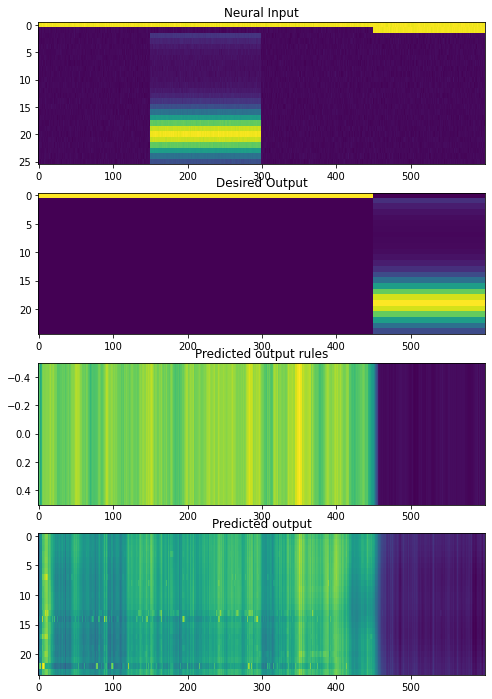

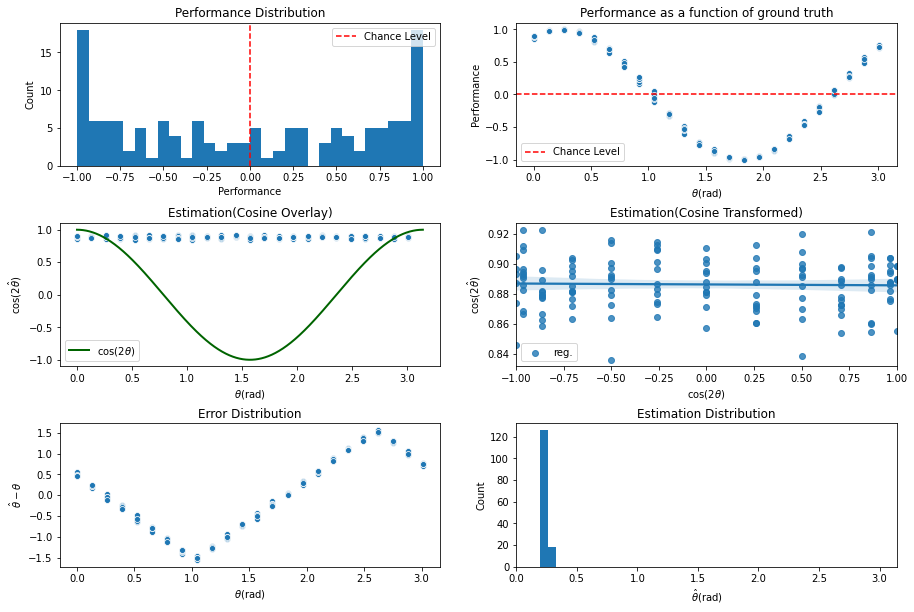

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2200\assets

 Training performance: 
Iter. 2201 | Performance 0.1045 | Loss 0.3187 | Spike loss 1.8715
Testing performance: 
Iter. 2201 | Performance -0.0051 | Loss 0.3184 | Spike loss 1.8775

 Training performance: 
Iter. 2202 | Performance 0.0068 | Loss 0.3183 | Spike loss 1.8770
Testing performance: 
Iter. 2202 | Performance 0.0003 | Loss 0.3186 | Spike loss 1.8800

 Training performance: 
Iter. 2203 | Performance -0.0474 | Loss 0.3183 | Spike loss 1.8716
Testing performance: 
Iter. 2203 | Performance 0.0111 | Loss 0.3182 | Spike loss 1.8766

 Training performance: 
Iter. 2204 | Performance 0.0732 | Loss 0.3184 | Spike loss 1.8755
Testing performance: 
Iter. 2204 | Performance 0.0143 | Loss 0.3185 | Spike loss 1.8811

 Training performance: 
Iter. 2205 | Performance 0.0032 | Loss 0.3179 | Spike loss 1.8760
Testing performance: 
Iter. 2205 | Performance 0.0038 | Loss 0.3186 | Spike loss 1.8805

 Training p


 Training performance: 
Iter. 2247 | Performance 0.0444 | Loss 0.3179 | Spike loss 1.8660
Testing performance: 
Iter. 2247 | Performance 0.0123 | Loss 0.3181 | Spike loss 1.8551

 Training performance: 
Iter. 2248 | Performance -0.0023 | Loss 0.3183 | Spike loss 1.8725
Testing performance: 
Iter. 2248 | Performance 0.0224 | Loss 0.3183 | Spike loss 1.8645

 Training performance: 
Iter. 2249 | Performance 0.0090 | Loss 0.3180 | Spike loss 1.8663
Testing performance: 
Iter. 2249 | Performance 0.0203 | Loss 0.3180 | Spike loss 1.8553

 Training performance: 
Iter. 2250 | Performance -0.0102 | Loss 0.3177 | Spike loss 1.8689
Testing performance: 
Iter. 2250 | Performance -0.0011 | Loss 0.3181 | Spike loss 1.8625

 Training performance: 
Iter. 2251 | Performance 0.0334 | Loss 0.3181 | Spike loss 1.8585
Testing performance: 
Iter. 2251 | Performance 0.0112 | Loss 0.3181 | Spike loss 1.8648

 Training performance: 
Iter. 2252 | Performance -0.0415 | Loss 0.3180 | Spike loss 1.8521
Testing pe


 Training performance: 
Iter. 2293 | Performance -0.0152 | Loss 0.3177 | Spike loss 1.8535
Testing performance: 
Iter. 2293 | Performance 0.0053 | Loss 0.3181 | Spike loss 1.8556

 Training performance: 
Iter. 2294 | Performance 0.0005 | Loss 0.3183 | Spike loss 1.8529
Testing performance: 
Iter. 2294 | Performance 0.0016 | Loss 0.3183 | Spike loss 1.8528

 Training performance: 
Iter. 2295 | Performance -0.0686 | Loss 0.3178 | Spike loss 1.8535
Testing performance: 
Iter. 2295 | Performance 0.0027 | Loss 0.3179 | Spike loss 1.8656

 Training performance: 
Iter. 2296 | Performance -0.0256 | Loss 0.3181 | Spike loss 1.8590
Testing performance: 
Iter. 2296 | Performance 0.0116 | Loss 0.3183 | Spike loss 1.8515

 Training performance: 
Iter. 2297 | Performance 0.0208 | Loss 0.3179 | Spike loss 1.8542
Testing performance: 
Iter. 2297 | Performance 0.0414 | Loss 0.3180 | Spike loss 1.8466

 Training performance: 
Iter. 2298 | Performance -0.0347 | Loss 0.3178 | Spike loss 1.8540
Testing pe

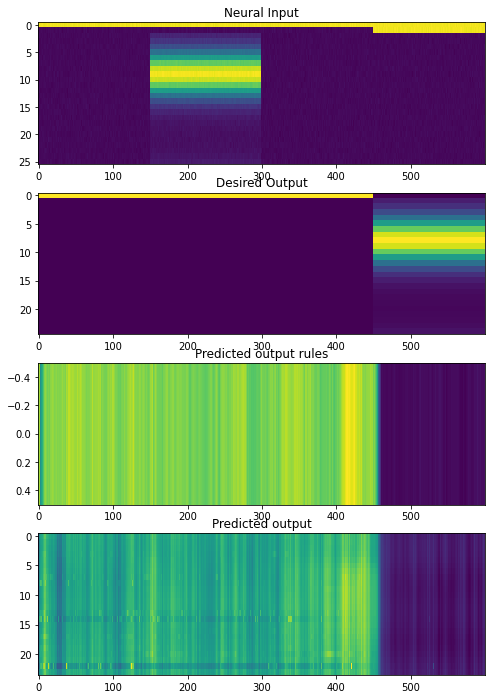

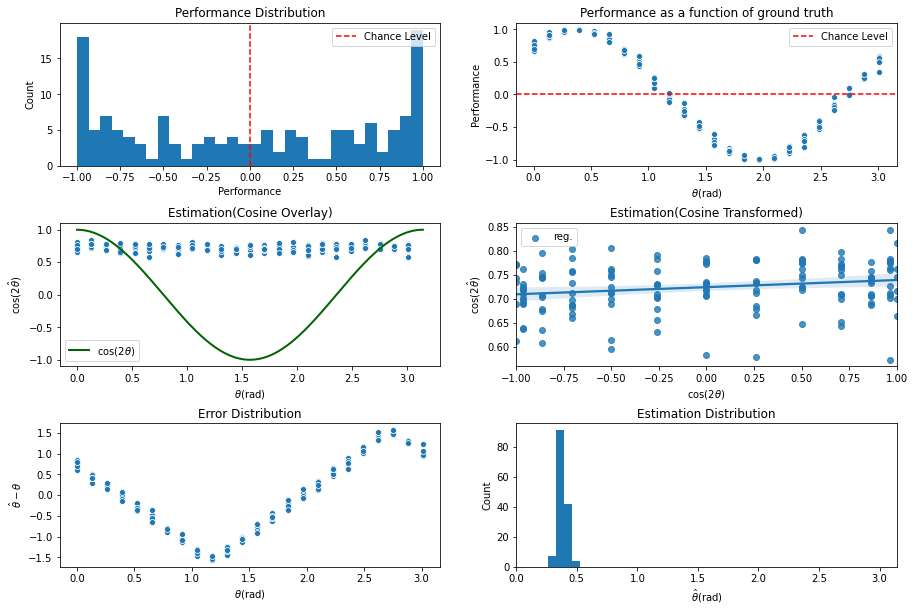

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2300\assets

 Training performance: 
Iter. 2301 | Performance -0.0032 | Loss 0.3182 | Spike loss 1.8531
Testing performance: 
Iter. 2301 | Performance 0.0093 | Loss 0.3182 | Spike loss 1.8604

 Training performance: 
Iter. 2302 | Performance 0.0427 | Loss 0.3174 | Spike loss 1.8477
Testing performance: 
Iter. 2302 | Performance 0.0044 | Loss 0.3185 | Spike loss 1.8543

 Training performance: 
Iter. 2303 | Performance 0.0586 | Loss 0.3192 | Spike loss 1.8522
Testing performance: 
Iter. 2303 | Performance 0.0042 | Loss 0.3187 | Spike loss 1.8519

 Training performance: 
Iter. 2304 | Performance 0.1569 | Loss 0.3183 | Spike loss 1.8480
Testing performance: 
Iter. 2304 | Performance 0.0046 | Loss 0.3184 | Spike loss 1.8566

 Training performance: 
Iter. 2305 | Performance -0.1531 | Loss 0.3185 | Spike loss 1.8608
Testing performance: 
Iter. 2305 | Performance 0.0045 | Loss 0.3183 | Spike loss 1.8522

 Training p


 Training performance: 
Iter. 2347 | Performance -0.0353 | Loss 0.3176 | Spike loss 1.8496
Testing performance: 
Iter. 2347 | Performance 0.0180 | Loss 0.3181 | Spike loss 1.8507

 Training performance: 
Iter. 2348 | Performance 0.0391 | Loss 0.3181 | Spike loss 1.8463
Testing performance: 
Iter. 2348 | Performance 0.0279 | Loss 0.3182 | Spike loss 1.8506

 Training performance: 
Iter. 2349 | Performance -0.0341 | Loss 0.3182 | Spike loss 1.8433
Testing performance: 
Iter. 2349 | Performance 0.0168 | Loss 0.3179 | Spike loss 1.8556

 Training performance: 
Iter. 2350 | Performance -0.0830 | Loss 0.3181 | Spike loss 1.8526
Testing performance: 
Iter. 2350 | Performance 0.0266 | Loss 0.3177 | Spike loss 1.8450

 Training performance: 
Iter. 2351 | Performance 0.0738 | Loss 0.3173 | Spike loss 1.8459
Testing performance: 
Iter. 2351 | Performance 0.0188 | Loss 0.3179 | Spike loss 1.8373

 Training performance: 
Iter. 2352 | Performance -0.0508 | Loss 0.3177 | Spike loss 1.8441
Testing pe


 Training performance: 
Iter. 2393 | Performance 0.0505 | Loss 0.3174 | Spike loss 1.8326
Testing performance: 
Iter. 2393 | Performance 0.0004 | Loss 0.3180 | Spike loss 1.8295

 Training performance: 
Iter. 2394 | Performance -0.0158 | Loss 0.3175 | Spike loss 1.8294
Testing performance: 
Iter. 2394 | Performance 0.0027 | Loss 0.3186 | Spike loss 1.8315

 Training performance: 
Iter. 2395 | Performance 0.0314 | Loss 0.3197 | Spike loss 1.8289
Testing performance: 
Iter. 2395 | Performance -0.0003 | Loss 0.3184 | Spike loss 1.8350

 Training performance: 
Iter. 2396 | Performance -0.0549 | Loss 0.3176 | Spike loss 1.8325
Testing performance: 
Iter. 2396 | Performance 0.0002 | Loss 0.3188 | Spike loss 1.8251

 Training performance: 
Iter. 2397 | Performance 0.0290 | Loss 0.3195 | Spike loss 1.8261
Testing performance: 
Iter. 2397 | Performance 0.0004 | Loss 0.3185 | Spike loss 1.8283

 Training performance: 
Iter. 2398 | Performance 0.0334 | Loss 0.3197 | Spike loss 1.8259
Testing per

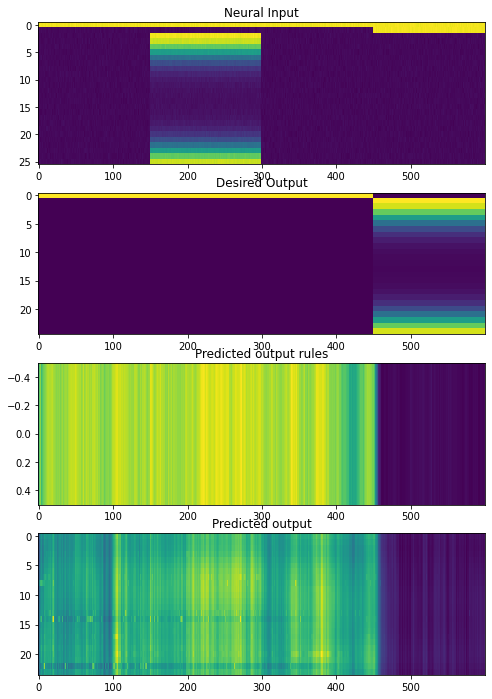

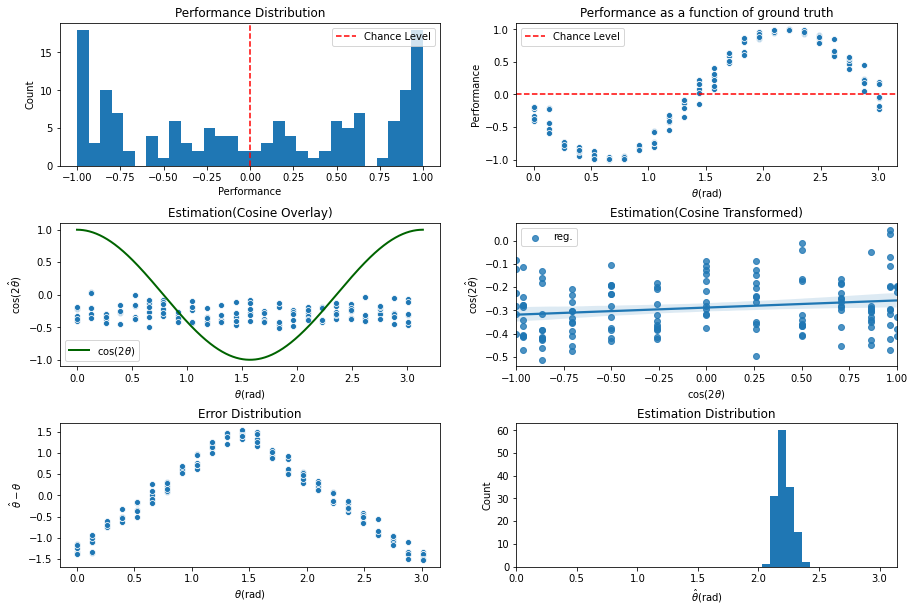

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2400\assets

 Training performance: 
Iter. 2401 | Performance -0.0111 | Loss 0.3178 | Spike loss 1.8349
Testing performance: 
Iter. 2401 | Performance 0.0157 | Loss 0.3177 | Spike loss 1.8282

 Training performance: 
Iter. 2402 | Performance 0.0188 | Loss 0.3182 | Spike loss 1.8238
Testing performance: 
Iter. 2402 | Performance 0.0103 | Loss 0.3180 | Spike loss 1.8262

 Training performance: 
Iter. 2403 | Performance -0.0129 | Loss 0.3188 | Spike loss 1.8243
Testing performance: 
Iter. 2403 | Performance 0.0019 | Loss 0.3179 | Spike loss 1.8213

 Training performance: 
Iter. 2404 | Performance -0.0442 | Loss 0.3177 | Spike loss 1.8448
Testing performance: 
Iter. 2404 | Performance -0.0019 | Loss 0.3181 | Spike loss 1.8232

 Training performance: 
Iter. 2405 | Performance 0.0595 | Loss 0.3184 | Spike loss 1.8195
Testing performance: 
Iter. 2405 | Performance -0.0009 | Loss 0.3182 | Spike loss 1.8263

 Trainin


 Training performance: 
Iter. 2447 | Performance 0.0436 | Loss 0.3185 | Spike loss 1.8093
Testing performance: 
Iter. 2447 | Performance -0.0013 | Loss 0.3181 | Spike loss 1.8025

 Training performance: 
Iter. 2448 | Performance 0.0102 | Loss 0.3182 | Spike loss 1.8068
Testing performance: 
Iter. 2448 | Performance 0.0015 | Loss 0.3178 | Spike loss 1.8066

 Training performance: 
Iter. 2449 | Performance 0.0994 | Loss 0.3183 | Spike loss 1.8015
Testing performance: 
Iter. 2449 | Performance 0.0009 | Loss 0.3178 | Spike loss 1.8087

 Training performance: 
Iter. 2450 | Performance -0.0342 | Loss 0.3176 | Spike loss 1.8048
Testing performance: 
Iter. 2450 | Performance 0.0053 | Loss 0.3178 | Spike loss 1.8093

 Training performance: 
Iter. 2451 | Performance -0.0294 | Loss 0.3179 | Spike loss 1.8020
Testing performance: 
Iter. 2451 | Performance 0.0096 | Loss 0.3179 | Spike loss 1.8009

 Training performance: 
Iter. 2452 | Performance -0.0411 | Loss 0.3182 | Spike loss 1.8057
Testing pe


 Training performance: 
Iter. 2493 | Performance 0.0136 | Loss 0.3190 | Spike loss 1.7891
Testing performance: 
Iter. 2493 | Performance 0.0001 | Loss 0.3186 | Spike loss 1.7880

 Training performance: 
Iter. 2494 | Performance 0.0218 | Loss 0.3186 | Spike loss 1.7911
Testing performance: 
Iter. 2494 | Performance 0.0022 | Loss 0.3184 | Spike loss 1.8021

 Training performance: 
Iter. 2495 | Performance -0.1247 | Loss 0.3175 | Spike loss 1.7812
Testing performance: 
Iter. 2495 | Performance 0.0020 | Loss 0.3180 | Spike loss 1.7828

 Training performance: 
Iter. 2496 | Performance 0.0765 | Loss 0.3182 | Spike loss 1.7951
Testing performance: 
Iter. 2496 | Performance 0.0044 | Loss 0.3180 | Spike loss 1.7809

 Training performance: 
Iter. 2497 | Performance 0.0534 | Loss 0.3177 | Spike loss 1.7864
Testing performance: 
Iter. 2497 | Performance 0.0064 | Loss 0.3181 | Spike loss 1.7804

 Training performance: 
Iter. 2498 | Performance -0.1452 | Loss 0.3179 | Spike loss 1.7861
Testing perf

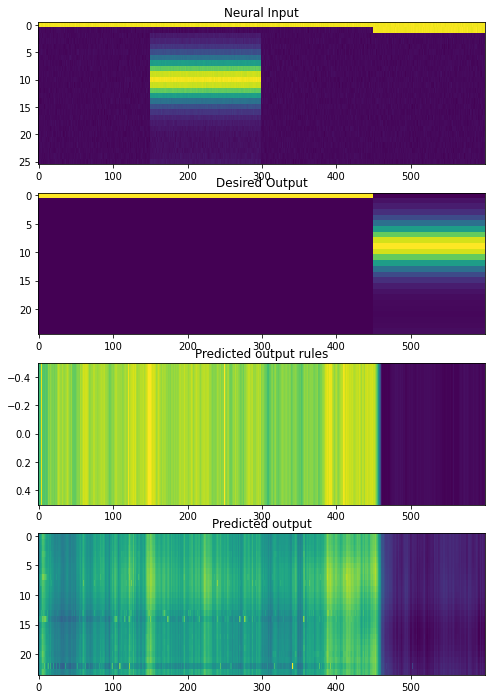

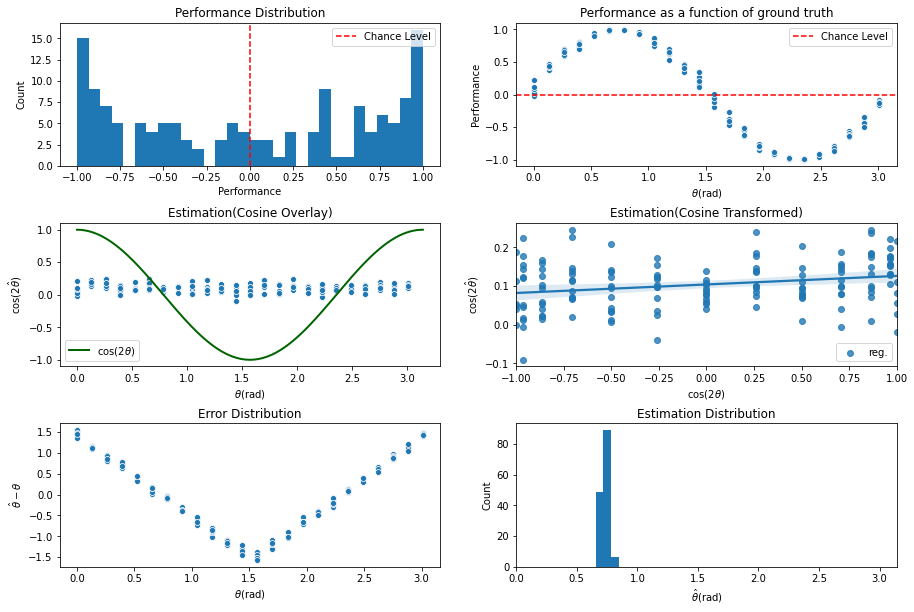

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2500\assets

 Training performance: 
Iter. 2501 | Performance 0.0727 | Loss 0.3186 | Spike loss 1.7904
Testing performance: 
Iter. 2501 | Performance 0.0135 | Loss 0.3185 | Spike loss 1.7947

 Training performance: 
Iter. 2502 | Performance -0.0234 | Loss 0.3197 | Spike loss 1.7826
Testing performance: 
Iter. 2502 | Performance 0.0107 | Loss 0.3184 | Spike loss 1.7852

 Training performance: 
Iter. 2503 | Performance 0.0583 | Loss 0.3178 | Spike loss 1.7866
Testing performance: 
Iter. 2503 | Performance 0.0013 | Loss 0.3183 | Spike loss 1.7835

 Training performance: 
Iter. 2504 | Performance 0.1348 | Loss 0.3170 | Spike loss 1.7786
Testing performance: 
Iter. 2504 | Performance -0.0055 | Loss 0.3183 | Spike loss 1.7856

 Training performance: 
Iter. 2505 | Performance 0.0247 | Loss 0.3177 | Spike loss 1.7889
Testing performance: 
Iter. 2505 | Performance 0.0107 | Loss 0.3181 | Spike loss 1.7832

 Training p


 Training performance: 
Iter. 2547 | Performance -0.0051 | Loss 0.3173 | Spike loss 1.7845
Testing performance: 
Iter. 2547 | Performance 0.0841 | Loss 0.3175 | Spike loss 1.7791

 Training performance: 
Iter. 2548 | Performance -0.0392 | Loss 0.3175 | Spike loss 1.7846
Testing performance: 
Iter. 2548 | Performance 0.0702 | Loss 0.3175 | Spike loss 1.7826

 Training performance: 
Iter. 2549 | Performance 0.0532 | Loss 0.3176 | Spike loss 1.7803
Testing performance: 
Iter. 2549 | Performance 0.0332 | Loss 0.3175 | Spike loss 1.7825

 Training performance: 
Iter. 2550 | Performance -0.0522 | Loss 0.3175 | Spike loss 1.7746
Testing performance: 
Iter. 2550 | Performance 0.0202 | Loss 0.3177 | Spike loss 1.7878

 Training performance: 
Iter. 2551 | Performance 0.0016 | Loss 0.3176 | Spike loss 1.7834
Testing performance: 
Iter. 2551 | Performance 0.0110 | Loss 0.3176 | Spike loss 1.7758

 Training performance: 
Iter. 2552 | Performance 0.0553 | Loss 0.3175 | Spike loss 1.7819
Testing per


 Training performance: 
Iter. 2593 | Performance -0.0516 | Loss 0.3176 | Spike loss 1.7660
Testing performance: 
Iter. 2593 | Performance 0.0027 | Loss 0.3176 | Spike loss 1.7687

 Training performance: 
Iter. 2594 | Performance 0.0029 | Loss 0.3175 | Spike loss 1.7717
Testing performance: 
Iter. 2594 | Performance 0.0095 | Loss 0.3179 | Spike loss 1.7723

 Training performance: 
Iter. 2595 | Performance 0.0376 | Loss 0.3189 | Spike loss 1.7650
Testing performance: 
Iter. 2595 | Performance 0.0067 | Loss 0.3176 | Spike loss 1.7689

 Training performance: 
Iter. 2596 | Performance 0.0948 | Loss 0.3182 | Spike loss 1.7740
Testing performance: 
Iter. 2596 | Performance 0.0124 | Loss 0.3177 | Spike loss 1.7705

 Training performance: 
Iter. 2597 | Performance -0.0604 | Loss 0.3179 | Spike loss 1.7687
Testing performance: 
Iter. 2597 | Performance 0.0050 | Loss 0.3176 | Spike loss 1.7694

 Training performance: 
Iter. 2598 | Performance 0.0384 | Loss 0.3180 | Spike loss 1.7698
Testing perf

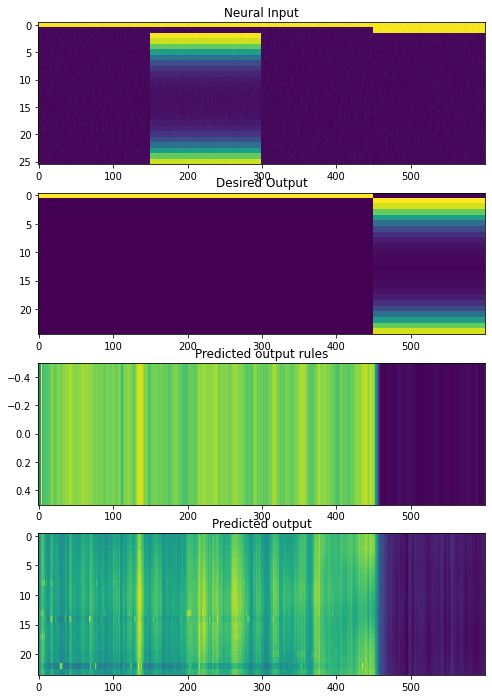

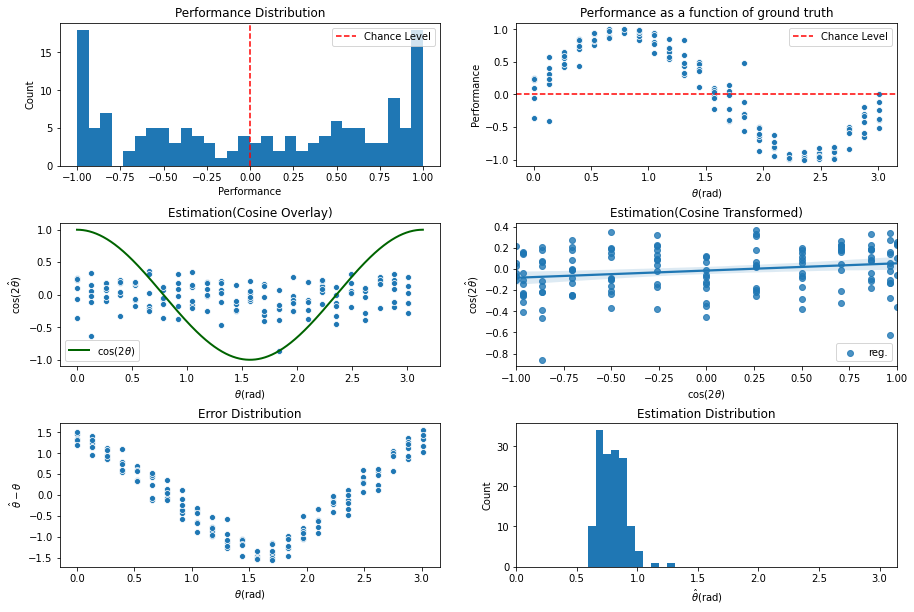

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2600\assets

 Training performance: 
Iter. 2601 | Performance 0.1102 | Loss 0.3174 | Spike loss 1.7711
Testing performance: 
Iter. 2601 | Performance 0.0315 | Loss 0.3176 | Spike loss 1.7604

 Training performance: 
Iter. 2602 | Performance -0.0328 | Loss 0.3176 | Spike loss 1.7570
Testing performance: 
Iter. 2602 | Performance 0.1420 | Loss 0.3173 | Spike loss 1.7694

 Training performance: 
Iter. 2603 | Performance -0.0313 | Loss 0.3173 | Spike loss 1.7642
Testing performance: 
Iter. 2603 | Performance 0.0370 | Loss 0.3173 | Spike loss 1.7664

 Training performance: 
Iter. 2604 | Performance 0.1285 | Loss 0.3171 | Spike loss 1.7726
Testing performance: 
Iter. 2604 | Performance 0.0276 | Loss 0.3175 | Spike loss 1.7667

 Training performance: 
Iter. 2605 | Performance 0.0237 | Loss 0.3176 | Spike loss 1.7648
Testing performance: 
Iter. 2605 | Performance 0.0090 | Loss 0.3178 | Spike loss 1.7665

 Training p


 Training performance: 
Iter. 2647 | Performance 0.0934 | Loss 0.3175 | Spike loss 1.7527
Testing performance: 
Iter. 2647 | Performance 0.0145 | Loss 0.3175 | Spike loss 1.7578

 Training performance: 
Iter. 2648 | Performance -0.0962 | Loss 0.3173 | Spike loss 1.7551
Testing performance: 
Iter. 2648 | Performance 0.0184 | Loss 0.3173 | Spike loss 1.7551

 Training performance: 
Iter. 2649 | Performance -0.0421 | Loss 0.3173 | Spike loss 1.7546
Testing performance: 
Iter. 2649 | Performance 0.0276 | Loss 0.3172 | Spike loss 1.7574

 Training performance: 
Iter. 2650 | Performance 0.0395 | Loss 0.3175 | Spike loss 1.7587
Testing performance: 
Iter. 2650 | Performance 0.0188 | Loss 0.3176 | Spike loss 1.7573

 Training performance: 
Iter. 2651 | Performance 0.1046 | Loss 0.3178 | Spike loss 1.7577
Testing performance: 
Iter. 2651 | Performance 0.0356 | Loss 0.3173 | Spike loss 1.7559

 Training performance: 
Iter. 2652 | Performance -0.0551 | Loss 0.3175 | Spike loss 1.7616
Testing per


 Training performance: 
Iter. 2693 | Performance -0.0113 | Loss 0.3173 | Spike loss 1.7434
Testing performance: 
Iter. 2693 | Performance 0.0244 | Loss 0.3174 | Spike loss 1.7497

 Training performance: 
Iter. 2694 | Performance -0.0043 | Loss 0.3172 | Spike loss 1.7384
Testing performance: 
Iter. 2694 | Performance 0.0304 | Loss 0.3173 | Spike loss 1.7449

 Training performance: 
Iter. 2695 | Performance 0.1079 | Loss 0.3173 | Spike loss 1.7480
Testing performance: 
Iter. 2695 | Performance 0.0085 | Loss 0.3174 | Spike loss 1.7494

 Training performance: 
Iter. 2696 | Performance -0.0402 | Loss 0.3172 | Spike loss 1.7427
Testing performance: 
Iter. 2696 | Performance 0.0220 | Loss 0.3176 | Spike loss 1.7423

 Training performance: 
Iter. 2697 | Performance -0.0834 | Loss 0.3171 | Spike loss 1.7456
Testing performance: 
Iter. 2697 | Performance 0.0172 | Loss 0.3175 | Spike loss 1.7453

 Training performance: 
Iter. 2698 | Performance 0.0031 | Loss 0.3171 | Spike loss 1.7408
Testing pe

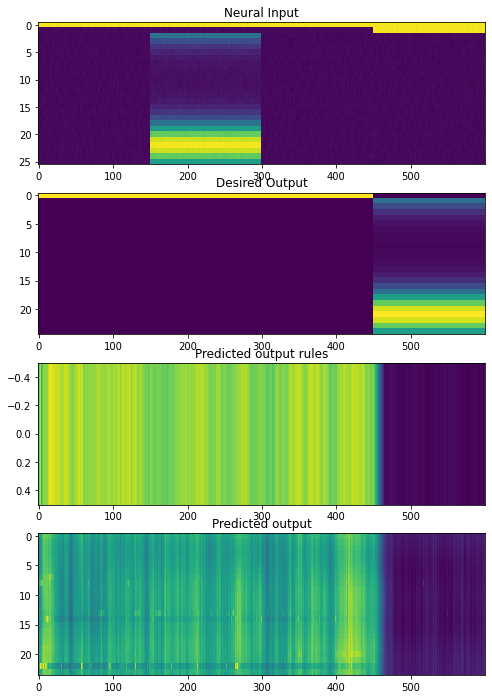

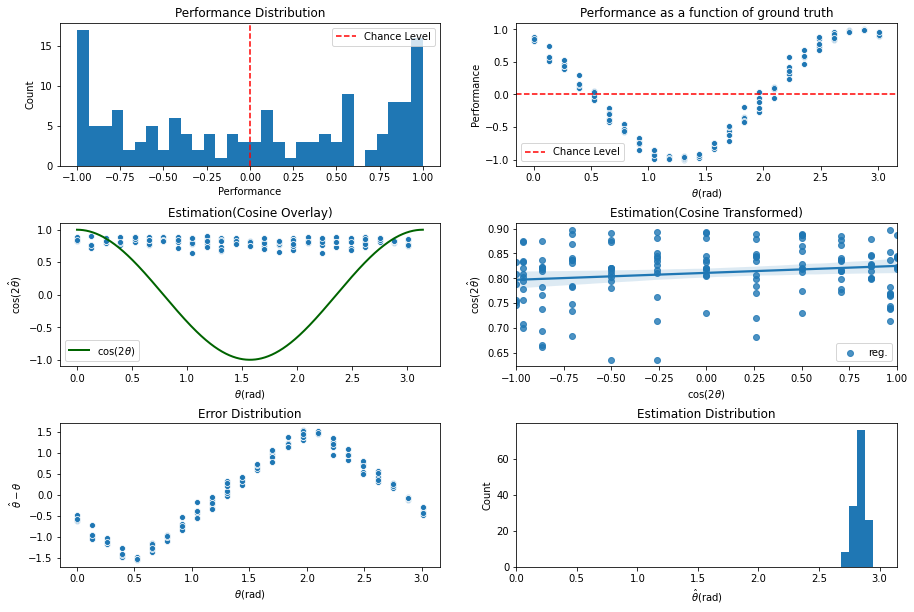

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2700\assets

 Training performance: 
Iter. 2701 | Performance 0.0138 | Loss 0.3175 | Spike loss 1.7519
Testing performance: 
Iter. 2701 | Performance 0.0074 | Loss 0.3175 | Spike loss 1.7407

 Training performance: 
Iter. 2702 | Performance -0.0058 | Loss 0.3175 | Spike loss 1.7489
Testing performance: 
Iter. 2702 | Performance 0.0137 | Loss 0.3173 | Spike loss 1.7523

 Training performance: 
Iter. 2703 | Performance 0.0081 | Loss 0.3171 | Spike loss 1.7379
Testing performance: 
Iter. 2703 | Performance 0.0116 | Loss 0.3174 | Spike loss 1.7497

 Training performance: 
Iter. 2704 | Performance -0.0690 | Loss 0.3174 | Spike loss 1.7446
Testing performance: 
Iter. 2704 | Performance 0.0245 | Loss 0.3172 | Spike loss 1.7438

 Training performance: 
Iter. 2705 | Performance -0.1177 | Loss 0.3170 | Spike loss 1.7447
Testing performance: 
Iter. 2705 | Performance 0.0506 | Loss 0.3171 | Spike loss 1.7386

 Training 


 Training performance: 
Iter. 2747 | Performance -0.0848 | Loss 0.3167 | Spike loss 1.7610
Testing performance: 
Iter. 2747 | Performance 0.0214 | Loss 0.3186 | Spike loss 1.7509

 Training performance: 
Iter. 2748 | Performance -0.0386 | Loss 0.3186 | Spike loss 1.7559
Testing performance: 
Iter. 2748 | Performance 0.0294 | Loss 0.3200 | Spike loss 1.7471

 Training performance: 
Iter. 2749 | Performance -0.1155 | Loss 0.3201 | Spike loss 1.7606
Testing performance: 
Iter. 2749 | Performance 0.0082 | Loss 0.3191 | Spike loss 1.7476

 Training performance: 
Iter. 2750 | Performance 0.0596 | Loss 0.3188 | Spike loss 1.7585
Testing performance: 
Iter. 2750 | Performance 0.0272 | Loss 0.3174 | Spike loss 1.7527

 Training performance: 
Iter. 2751 | Performance 0.0107 | Loss 0.3168 | Spike loss 1.7494
Testing performance: 
Iter. 2751 | Performance 0.0016 | Loss 0.3188 | Spike loss 1.7367

 Training performance: 
Iter. 2752 | Performance 0.0800 | Loss 0.3184 | Spike loss 1.7469
Testing per


 Training performance: 
Iter. 2793 | Performance 0.0515 | Loss 0.3181 | Spike loss 1.6924
Testing performance: 
Iter. 2793 | Performance 0.0160 | Loss 0.3170 | Spike loss 1.6830

 Training performance: 
Iter. 2794 | Performance 0.0941 | Loss 0.3170 | Spike loss 1.6851
Testing performance: 
Iter. 2794 | Performance 0.0286 | Loss 0.3176 | Spike loss 1.6864

 Training performance: 
Iter. 2795 | Performance -0.0166 | Loss 0.3173 | Spike loss 1.6911
Testing performance: 
Iter. 2795 | Performance 0.0773 | Loss 0.3179 | Spike loss 1.6774

 Training performance: 
Iter. 2796 | Performance -0.0903 | Loss 0.3173 | Spike loss 1.6857
Testing performance: 
Iter. 2796 | Performance 0.0498 | Loss 0.3170 | Spike loss 1.6892

 Training performance: 
Iter. 2797 | Performance -0.0059 | Loss 0.3170 | Spike loss 1.6881
Testing performance: 
Iter. 2797 | Performance 0.0304 | Loss 0.3175 | Spike loss 1.6900

 Training performance: 
Iter. 2798 | Performance -0.1162 | Loss 0.3174 | Spike loss 1.6939
Testing pe

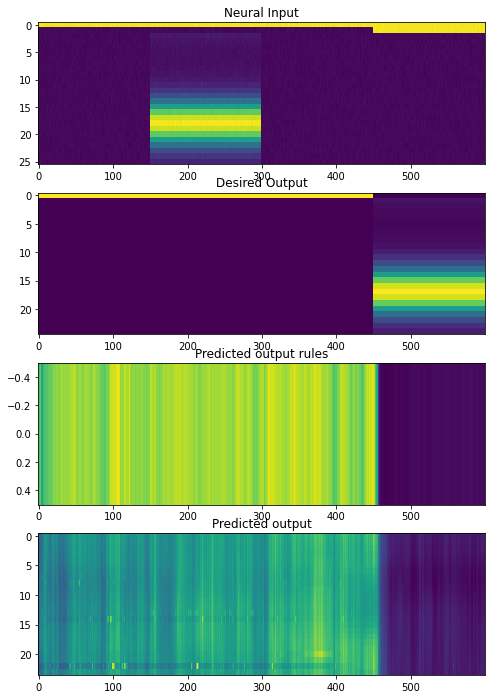

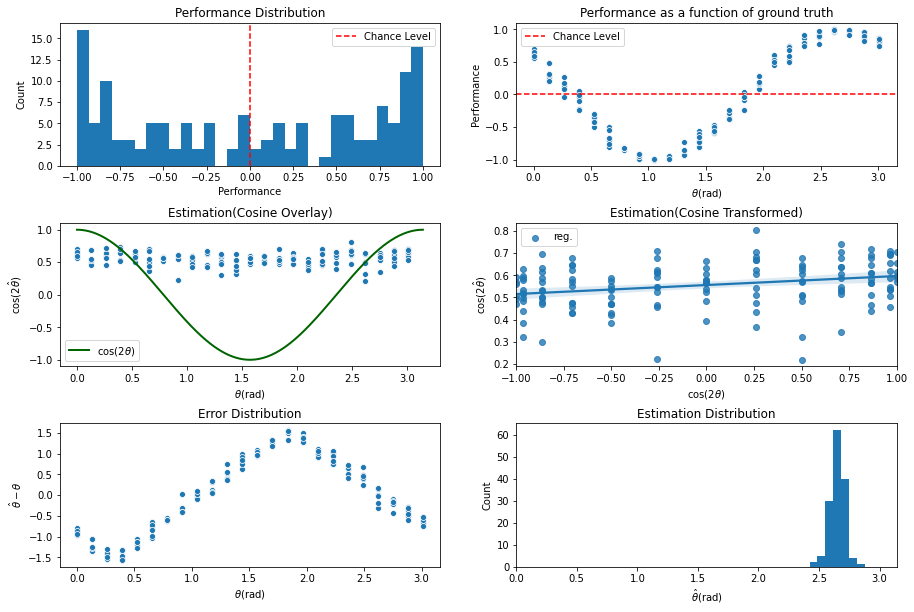

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2800\assets

 Training performance: 
Iter. 2801 | Performance 0.0759 | Loss 0.3182 | Spike loss 1.6854
Testing performance: 
Iter. 2801 | Performance 0.0204 | Loss 0.3179 | Spike loss 1.6817

 Training performance: 
Iter. 2802 | Performance 0.0885 | Loss 0.3177 | Spike loss 1.6929
Testing performance: 
Iter. 2802 | Performance 0.0208 | Loss 0.3175 | Spike loss 1.6903

 Training performance: 
Iter. 2803 | Performance 0.0807 | Loss 0.3170 | Spike loss 1.6846
Testing performance: 
Iter. 2803 | Performance 0.0305 | Loss 0.3174 | Spike loss 1.6866

 Training performance: 
Iter. 2804 | Performance 0.0590 | Loss 0.3179 | Spike loss 1.6867
Testing performance: 
Iter. 2804 | Performance 0.0215 | Loss 0.3182 | Spike loss 1.6869

 Training performance: 
Iter. 2805 | Performance -0.0415 | Loss 0.3181 | Spike loss 1.6985
Testing performance: 
Iter. 2805 | Performance 0.0332 | Loss 0.3174 | Spike loss 1.6900

 Training pe


 Training performance: 
Iter. 2847 | Performance 0.0432 | Loss 0.3174 | Spike loss 1.6784
Testing performance: 
Iter. 2847 | Performance 0.1176 | Loss 0.3169 | Spike loss 1.6852

 Training performance: 
Iter. 2848 | Performance -0.1019 | Loss 0.3168 | Spike loss 1.6774
Testing performance: 
Iter. 2848 | Performance 0.0816 | Loss 0.3171 | Spike loss 1.6810

 Training performance: 
Iter. 2849 | Performance -0.0552 | Loss 0.3168 | Spike loss 1.6782
Testing performance: 
Iter. 2849 | Performance 0.0561 | Loss 0.3176 | Spike loss 1.6814

 Training performance: 
Iter. 2850 | Performance 0.0051 | Loss 0.3173 | Spike loss 1.6732
Testing performance: 
Iter. 2850 | Performance 0.0401 | Loss 0.3172 | Spike loss 1.6791

 Training performance: 
Iter. 2851 | Performance 0.1600 | Loss 0.3163 | Spike loss 1.6824
Testing performance: 
Iter. 2851 | Performance 0.0400 | Loss 0.3172 | Spike loss 1.6856

 Training performance: 
Iter. 2852 | Performance -0.0334 | Loss 0.3168 | Spike loss 1.6820
Testing per


 Training performance: 
Iter. 2893 | Performance -0.0648 | Loss 0.3163 | Spike loss 1.6870
Testing performance: 
Iter. 2893 | Performance 0.0314 | Loss 0.3171 | Spike loss 1.6888

 Training performance: 
Iter. 2894 | Performance 0.0253 | Loss 0.3170 | Spike loss 1.6805
Testing performance: 
Iter. 2894 | Performance 0.0543 | Loss 0.3171 | Spike loss 1.6829

 Training performance: 
Iter. 2895 | Performance -0.0095 | Loss 0.3168 | Spike loss 1.6882
Testing performance: 
Iter. 2895 | Performance 0.0406 | Loss 0.3168 | Spike loss 1.6918

 Training performance: 
Iter. 2896 | Performance -0.0231 | Loss 0.3167 | Spike loss 1.6914
Testing performance: 
Iter. 2896 | Performance 0.0268 | Loss 0.3174 | Spike loss 1.6930

 Training performance: 
Iter. 2897 | Performance -0.0786 | Loss 0.3172 | Spike loss 1.6924
Testing performance: 
Iter. 2897 | Performance 0.0424 | Loss 0.3173 | Spike loss 1.6870

 Training performance: 
Iter. 2898 | Performance 0.0614 | Loss 0.3175 | Spike loss 1.6870
Testing pe

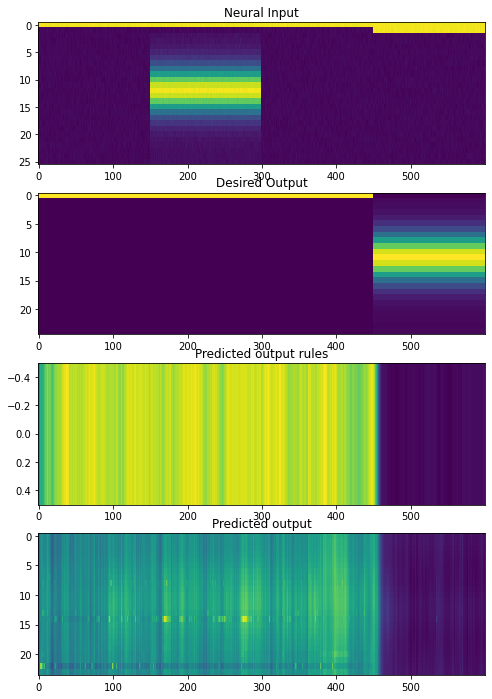

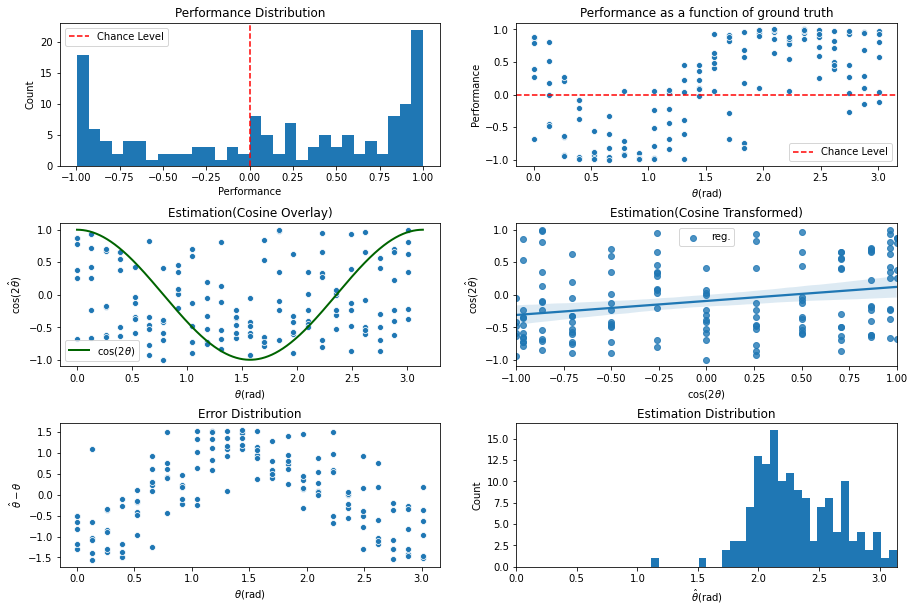

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter2900\assets

 Training performance: 
Iter. 2901 | Performance 0.0864 | Loss 0.3175 | Spike loss 1.6842
Testing performance: 
Iter. 2901 | Performance 0.1236 | Loss 0.3169 | Spike loss 1.6896

 Training performance: 
Iter. 2902 | Performance -0.0788 | Loss 0.3167 | Spike loss 1.6988
Testing performance: 
Iter. 2902 | Performance 0.0096 | Loss 0.3171 | Spike loss 1.6877

 Training performance: 
Iter. 2903 | Performance 0.0845 | Loss 0.3168 | Spike loss 1.6832
Testing performance: 
Iter. 2903 | Performance 0.0191 | Loss 0.3169 | Spike loss 1.6879

 Training performance: 
Iter. 2904 | Performance 0.0233 | Loss 0.3171 | Spike loss 1.6927
Testing performance: 
Iter. 2904 | Performance -0.0083 | Loss 0.3171 | Spike loss 1.6903

 Training performance: 
Iter. 2905 | Performance -0.1017 | Loss 0.3165 | Spike loss 1.6868
Testing performance: 
Iter. 2905 | Performance 0.0431 | Loss 0.3173 | Spike loss 1.6879

 Training 


 Training performance: 
Iter. 2947 | Performance -0.0479 | Loss 0.3171 | Spike loss 1.6933
Testing performance: 
Iter. 2947 | Performance 0.0989 | Loss 0.3169 | Spike loss 1.6988

 Training performance: 
Iter. 2948 | Performance -0.1301 | Loss 0.3169 | Spike loss 1.7031
Testing performance: 
Iter. 2948 | Performance 0.0920 | Loss 0.3173 | Spike loss 1.7052

 Training performance: 
Iter. 2949 | Performance -0.0447 | Loss 0.3169 | Spike loss 1.6987
Testing performance: 
Iter. 2949 | Performance 0.0403 | Loss 0.3168 | Spike loss 1.7029

 Training performance: 
Iter. 2950 | Performance 0.1078 | Loss 0.3165 | Spike loss 1.7051
Testing performance: 
Iter. 2950 | Performance 0.0240 | Loss 0.3170 | Spike loss 1.6968

 Training performance: 
Iter. 2951 | Performance 0.0746 | Loss 0.3166 | Spike loss 1.7088
Testing performance: 
Iter. 2951 | Performance 0.0516 | Loss 0.3169 | Spike loss 1.6913

 Training performance: 
Iter. 2952 | Performance 0.0083 | Loss 0.3166 | Spike loss 1.7022
Testing per


 Training performance: 
Iter. 2993 | Performance -0.0664 | Loss 0.3168 | Spike loss 1.6955
Testing performance: 
Iter. 2993 | Performance 0.1145 | Loss 0.3166 | Spike loss 1.6967

 Training performance: 
Iter. 2994 | Performance 0.0367 | Loss 0.3162 | Spike loss 1.7055
Testing performance: 
Iter. 2994 | Performance 0.0267 | Loss 0.3167 | Spike loss 1.7003

 Training performance: 
Iter. 2995 | Performance 0.0500 | Loss 0.3168 | Spike loss 1.7013
Testing performance: 
Iter. 2995 | Performance 0.0414 | Loss 0.3166 | Spike loss 1.6983

 Training performance: 
Iter. 2996 | Performance -0.0413 | Loss 0.3166 | Spike loss 1.6927
Testing performance: 
Iter. 2996 | Performance 0.0455 | Loss 0.3168 | Spike loss 1.6974

 Training performance: 
Iter. 2997 | Performance -0.0762 | Loss 0.3164 | Spike loss 1.7000
Testing performance: 
Iter. 2997 | Performance 0.0715 | Loss 0.3165 | Spike loss 1.6950

 Training performance: 
Iter. 2998 | Performance 0.0311 | Loss 0.3170 | Spike loss 1.6974
Testing per

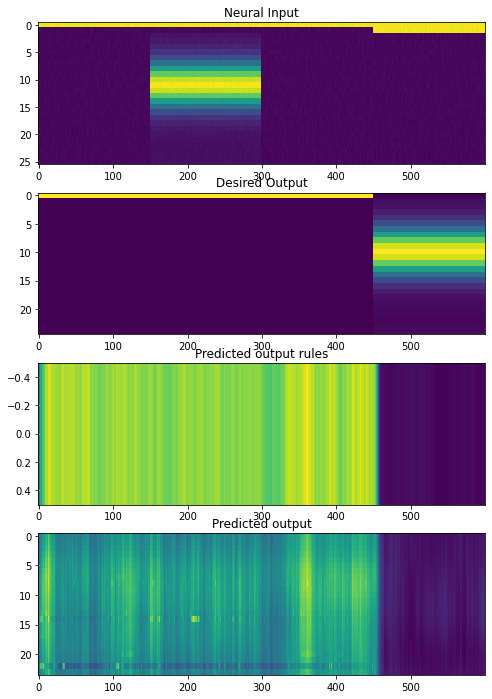

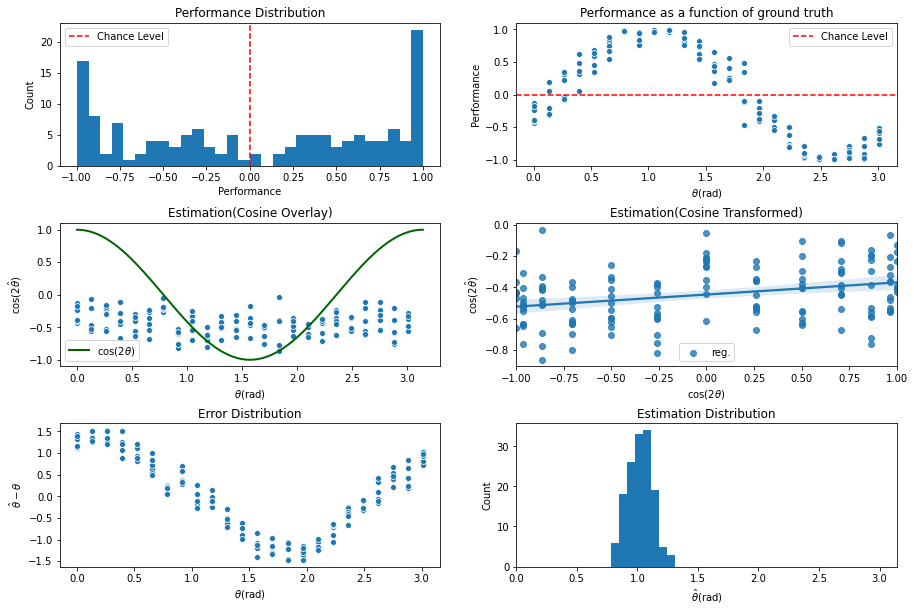

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3000\assets

 Training performance: 
Iter. 3001 | Performance -0.0181 | Loss 0.3175 | Spike loss 1.6856
Testing performance: 
Iter. 3001 | Performance 0.0397 | Loss 0.3169 | Spike loss 1.6829

 Training performance: 
Iter. 3002 | Performance -0.0113 | Loss 0.3170 | Spike loss 1.6957
Testing performance: 
Iter. 3002 | Performance 0.0349 | Loss 0.3180 | Spike loss 1.6811

 Training performance: 
Iter. 3003 | Performance -0.1062 | Loss 0.3179 | Spike loss 1.6853
Testing performance: 
Iter. 3003 | Performance 0.0186 | Loss 0.3194 | Spike loss 1.6824

 Training performance: 
Iter. 3004 | Performance -0.0018 | Loss 0.3192 | Spike loss 1.6891
Testing performance: 
Iter. 3004 | Performance 0.0238 | Loss 0.3184 | Spike loss 1.6826

 Training performance: 
Iter. 3005 | Performance -0.0132 | Loss 0.3181 | Spike loss 1.6832
Testing performance: 
Iter. 3005 | Performance 0.0258 | Loss 0.3177 | Spike loss 1.6863

 Trainin


 Training performance: 
Iter. 3047 | Performance 0.0521 | Loss 0.3167 | Spike loss 1.6885
Testing performance: 
Iter. 3047 | Performance 0.0681 | Loss 0.3167 | Spike loss 1.6871

 Training performance: 
Iter. 3048 | Performance -0.0227 | Loss 0.3168 | Spike loss 1.6874
Testing performance: 
Iter. 3048 | Performance 0.1379 | Loss 0.3165 | Spike loss 1.6856

 Training performance: 
Iter. 3049 | Performance -0.0202 | Loss 0.3165 | Spike loss 1.6904
Testing performance: 
Iter. 3049 | Performance 0.0432 | Loss 0.3168 | Spike loss 1.6896

 Training performance: 
Iter. 3050 | Performance -0.0590 | Loss 0.3166 | Spike loss 1.6930
Testing performance: 
Iter. 3050 | Performance 0.0997 | Loss 0.3167 | Spike loss 1.6862

 Training performance: 
Iter. 3051 | Performance -0.0074 | Loss 0.3167 | Spike loss 1.6867
Testing performance: 
Iter. 3051 | Performance 0.0789 | Loss 0.3168 | Spike loss 1.6937

 Training performance: 
Iter. 3052 | Performance 0.0204 | Loss 0.3171 | Spike loss 1.6888
Testing pe


 Training performance: 
Iter. 3093 | Performance 0.0285 | Loss 0.3167 | Spike loss 1.6742
Testing performance: 
Iter. 3093 | Performance 0.0789 | Loss 0.3165 | Spike loss 1.6756

 Training performance: 
Iter. 3094 | Performance 0.1224 | Loss 0.3166 | Spike loss 1.6776
Testing performance: 
Iter. 3094 | Performance 0.0566 | Loss 0.3166 | Spike loss 1.6721

 Training performance: 
Iter. 3095 | Performance 0.0556 | Loss 0.3165 | Spike loss 1.6715
Testing performance: 
Iter. 3095 | Performance 0.1384 | Loss 0.3165 | Spike loss 1.6663

 Training performance: 
Iter. 3096 | Performance -0.0113 | Loss 0.3167 | Spike loss 1.6798
Testing performance: 
Iter. 3096 | Performance 0.1197 | Loss 0.3163 | Spike loss 1.6663

 Training performance: 
Iter. 3097 | Performance -0.1094 | Loss 0.3164 | Spike loss 1.6732
Testing performance: 
Iter. 3097 | Performance 0.1384 | Loss 0.3165 | Spike loss 1.6638

 Training performance: 
Iter. 3098 | Performance 0.0313 | Loss 0.3163 | Spike loss 1.6762
Testing perf

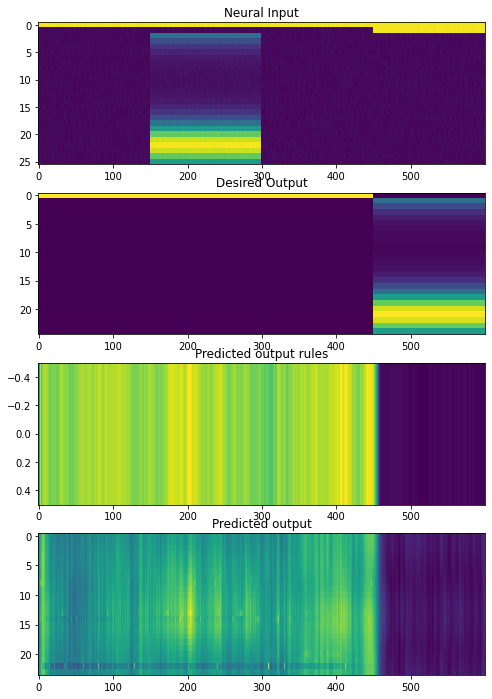

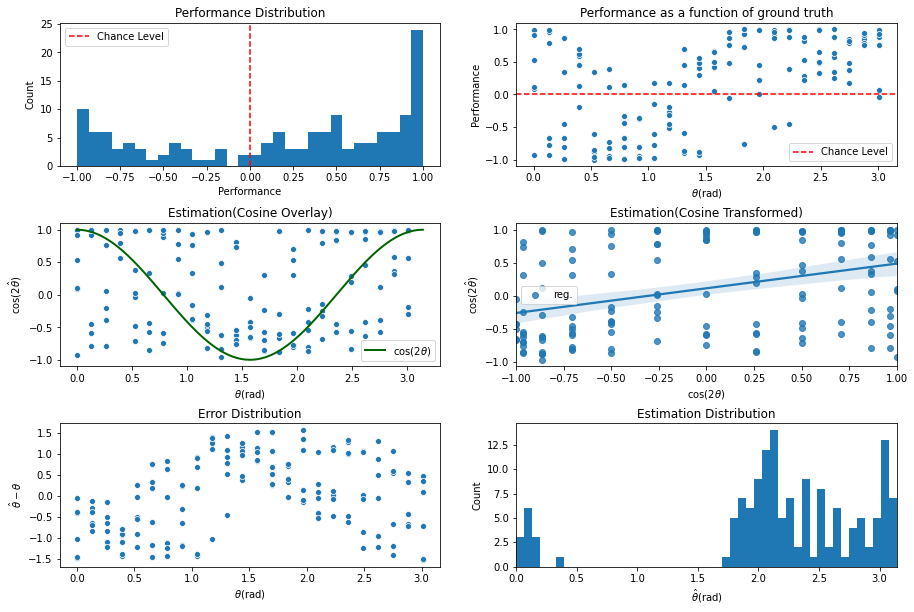

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3100\assets

 Training performance: 
Iter. 3101 | Performance 0.0597 | Loss 0.3162 | Spike loss 1.6715
Testing performance: 
Iter. 3101 | Performance 0.1019 | Loss 0.3170 | Spike loss 1.6672

 Training performance: 
Iter. 3102 | Performance 0.0335 | Loss 0.3162 | Spike loss 1.6638
Testing performance: 
Iter. 3102 | Performance 0.0711 | Loss 0.3166 | Spike loss 1.6634

 Training performance: 
Iter. 3103 | Performance -0.0297 | Loss 0.3167 | Spike loss 1.6607
Testing performance: 
Iter. 3103 | Performance 0.0635 | Loss 0.3169 | Spike loss 1.6634

 Training performance: 
Iter. 3104 | Performance -0.0603 | Loss 0.3164 | Spike loss 1.6733
Testing performance: 
Iter. 3104 | Performance 0.0274 | Loss 0.3171 | Spike loss 1.6700

 Training performance: 
Iter. 3105 | Performance -0.0506 | Loss 0.3163 | Spike loss 1.6690
Testing performance: 
Iter. 3105 | Performance 0.0503 | Loss 0.3168 | Spike loss 1.6701

 Training 


 Training performance: 
Iter. 3147 | Performance 0.0624 | Loss 0.3164 | Spike loss 1.6498
Testing performance: 
Iter. 3147 | Performance 0.0479 | Loss 0.3165 | Spike loss 1.6507

 Training performance: 
Iter. 3148 | Performance -0.0354 | Loss 0.3165 | Spike loss 1.6454
Testing performance: 
Iter. 3148 | Performance 0.0976 | Loss 0.3163 | Spike loss 1.6425

 Training performance: 
Iter. 3149 | Performance -0.0489 | Loss 0.3163 | Spike loss 1.6443
Testing performance: 
Iter. 3149 | Performance 0.0868 | Loss 0.3165 | Spike loss 1.6430

 Training performance: 
Iter. 3150 | Performance 0.0716 | Loss 0.3166 | Spike loss 1.6514
Testing performance: 
Iter. 3150 | Performance 0.0454 | Loss 0.3167 | Spike loss 1.6452

 Training performance: 
Iter. 3151 | Performance -0.0702 | Loss 0.3164 | Spike loss 1.6499
Testing performance: 
Iter. 3151 | Performance 0.0642 | Loss 0.3166 | Spike loss 1.6502

 Training performance: 
Iter. 3152 | Performance -0.0353 | Loss 0.3165 | Spike loss 1.6495
Testing pe


 Training performance: 
Iter. 3193 | Performance -0.1136 | Loss 0.3163 | Spike loss 1.6530
Testing performance: 
Iter. 3193 | Performance 0.2767 | Loss 0.3163 | Spike loss 1.6405

 Training performance: 
Iter. 3194 | Performance -0.0323 | Loss 0.3160 | Spike loss 1.6477
Testing performance: 
Iter. 3194 | Performance 0.0698 | Loss 0.3167 | Spike loss 1.6501

 Training performance: 
Iter. 3195 | Performance -0.0806 | Loss 0.3164 | Spike loss 1.6563
Testing performance: 
Iter. 3195 | Performance 0.0872 | Loss 0.3165 | Spike loss 1.6534

 Training performance: 
Iter. 3196 | Performance 0.0034 | Loss 0.3159 | Spike loss 1.6549
Testing performance: 
Iter. 3196 | Performance 0.0655 | Loss 0.3163 | Spike loss 1.6634

 Training performance: 
Iter. 3197 | Performance 0.0326 | Loss 0.3161 | Spike loss 1.6559
Testing performance: 
Iter. 3197 | Performance 0.0756 | Loss 0.3160 | Spike loss 1.6561

 Training performance: 
Iter. 3198 | Performance 0.0007 | Loss 0.3166 | Spike loss 1.6566
Testing per

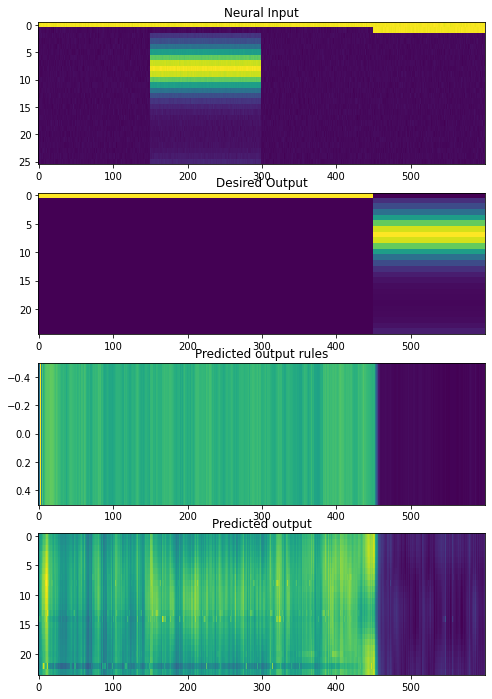

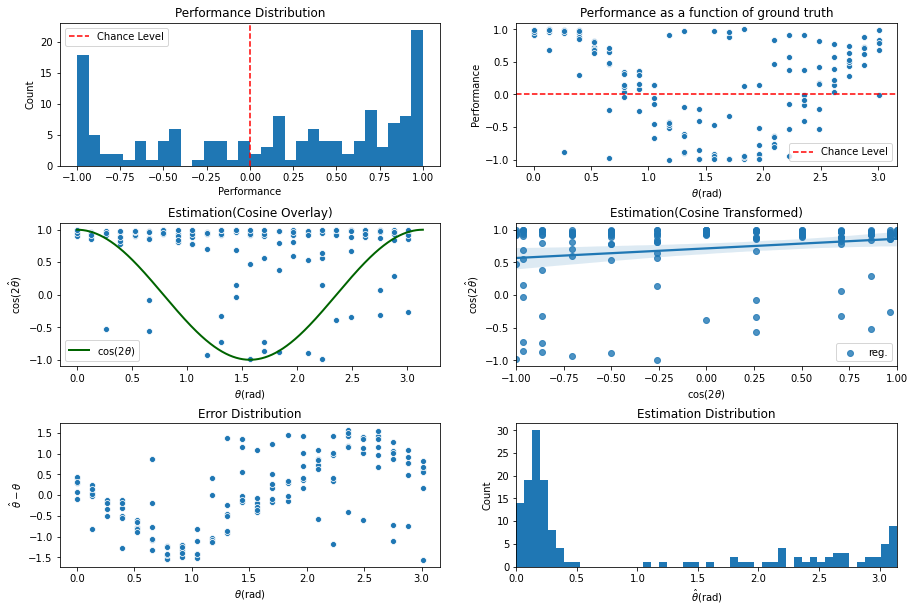

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3200\assets

 Training performance: 
Iter. 3201 | Performance -0.0407 | Loss 0.3164 | Spike loss 1.6598
Testing performance: 
Iter. 3201 | Performance 0.1776 | Loss 0.3165 | Spike loss 1.6565

 Training performance: 
Iter. 3202 | Performance -0.0587 | Loss 0.3161 | Spike loss 1.6613
Testing performance: 
Iter. 3202 | Performance 0.2759 | Loss 0.3161 | Spike loss 1.6583

 Training performance: 
Iter. 3203 | Performance 0.0139 | Loss 0.3160 | Spike loss 1.6574
Testing performance: 
Iter. 3203 | Performance 0.1357 | Loss 0.3165 | Spike loss 1.6603

 Training performance: 
Iter. 3204 | Performance -0.1045 | Loss 0.3162 | Spike loss 1.6657
Testing performance: 
Iter. 3204 | Performance 0.1415 | Loss 0.3160 | Spike loss 1.6590

 Training performance: 
Iter. 3205 | Performance -0.0670 | Loss 0.3163 | Spike loss 1.6595
Testing performance: 
Iter. 3205 | Performance 0.1181 | Loss 0.3164 | Spike loss 1.6547

 Training


 Training performance: 
Iter. 3247 | Performance 0.0338 | Loss 0.3164 | Spike loss 1.6544
Testing performance: 
Iter. 3247 | Performance 0.2727 | Loss 0.3160 | Spike loss 1.6591

 Training performance: 
Iter. 3248 | Performance 0.0261 | Loss 0.3165 | Spike loss 1.6520
Testing performance: 
Iter. 3248 | Performance 0.0944 | Loss 0.3163 | Spike loss 1.6604

 Training performance: 
Iter. 3249 | Performance -0.0558 | Loss 0.3161 | Spike loss 1.6628
Testing performance: 
Iter. 3249 | Performance 0.1386 | Loss 0.3163 | Spike loss 1.6571

 Training performance: 
Iter. 3250 | Performance -0.0299 | Loss 0.3161 | Spike loss 1.6548
Testing performance: 
Iter. 3250 | Performance 0.1142 | Loss 0.3161 | Spike loss 1.6565

 Training performance: 
Iter. 3251 | Performance -0.0156 | Loss 0.3165 | Spike loss 1.6525
Testing performance: 
Iter. 3251 | Performance 0.0587 | Loss 0.3166 | Spike loss 1.6672

 Training performance: 
Iter. 3252 | Performance -0.0248 | Loss 0.3166 | Spike loss 1.6584
Testing pe


 Training performance: 
Iter. 3293 | Performance -0.0705 | Loss 0.3162 | Spike loss 1.6529
Testing performance: 
Iter. 3293 | Performance 0.0630 | Loss 0.3164 | Spike loss 1.6457

 Training performance: 
Iter. 3294 | Performance -0.0172 | Loss 0.3158 | Spike loss 1.6442
Testing performance: 
Iter. 3294 | Performance 0.1231 | Loss 0.3158 | Spike loss 1.6446

 Training performance: 
Iter. 3295 | Performance -0.0136 | Loss 0.3159 | Spike loss 1.6432
Testing performance: 
Iter. 3295 | Performance 0.1184 | Loss 0.3163 | Spike loss 1.6476

 Training performance: 
Iter. 3296 | Performance 0.0818 | Loss 0.3166 | Spike loss 1.6511
Testing performance: 
Iter. 3296 | Performance 0.1617 | Loss 0.3158 | Spike loss 1.6420

 Training performance: 
Iter. 3297 | Performance -0.0003 | Loss 0.3158 | Spike loss 1.6506
Testing performance: 
Iter. 3297 | Performance 0.1547 | Loss 0.3161 | Spike loss 1.6485

 Training performance: 
Iter. 3298 | Performance -0.0656 | Loss 0.3161 | Spike loss 1.6494
Testing p

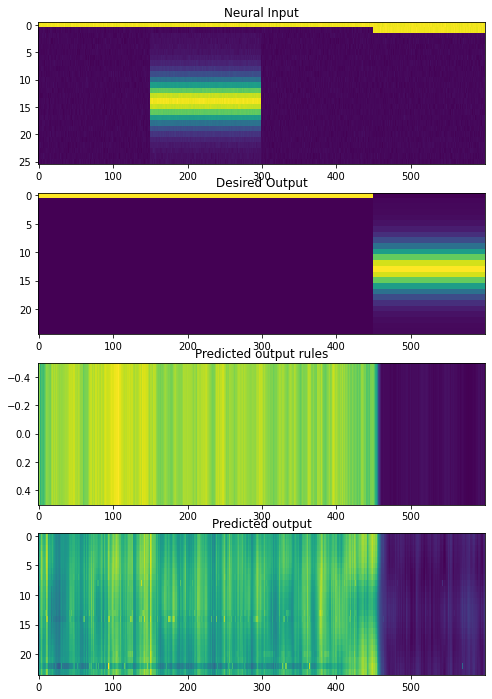

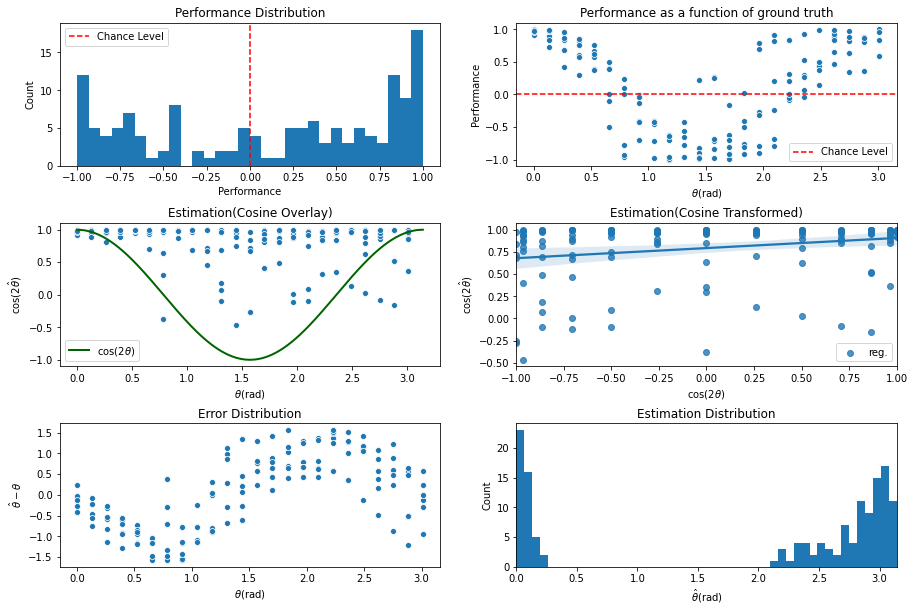

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3300\assets

 Training performance: 
Iter. 3301 | Performance -0.0810 | Loss 0.3159 | Spike loss 1.6494
Testing performance: 
Iter. 3301 | Performance 0.0925 | Loss 0.3163 | Spike loss 1.6442

 Training performance: 
Iter. 3302 | Performance -0.0347 | Loss 0.3158 | Spike loss 1.6379
Testing performance: 
Iter. 3302 | Performance 0.1198 | Loss 0.3159 | Spike loss 1.6409

 Training performance: 
Iter. 3303 | Performance 0.1138 | Loss 0.3163 | Spike loss 1.6440
Testing performance: 
Iter. 3303 | Performance 0.0712 | Loss 0.3164 | Spike loss 1.6474

 Training performance: 
Iter. 3304 | Performance -0.0336 | Loss 0.3163 | Spike loss 1.6449
Testing performance: 
Iter. 3304 | Performance 0.0849 | Loss 0.3162 | Spike loss 1.6428

 Training performance: 
Iter. 3305 | Performance -0.0962 | Loss 0.3165 | Spike loss 1.6487
Testing performance: 
Iter. 3305 | Performance 0.0905 | Loss 0.3160 | Spike loss 1.6441

 Training


 Training performance: 
Iter. 3347 | Performance 0.0186 | Loss 0.3170 | Spike loss 1.6390
Testing performance: 
Iter. 3347 | Performance 0.0690 | Loss 0.3165 | Spike loss 1.6346

 Training performance: 
Iter. 3348 | Performance -0.0666 | Loss 0.3161 | Spike loss 1.6414
Testing performance: 
Iter. 3348 | Performance 0.0529 | Loss 0.3165 | Spike loss 1.6361

 Training performance: 
Iter. 3349 | Performance -0.0120 | Loss 0.3164 | Spike loss 1.6416
Testing performance: 
Iter. 3349 | Performance 0.1086 | Loss 0.3163 | Spike loss 1.6384

 Training performance: 
Iter. 3350 | Performance 0.0006 | Loss 0.3155 | Spike loss 1.6421
Testing performance: 
Iter. 3350 | Performance 0.1508 | Loss 0.3160 | Spike loss 1.6368

 Training performance: 
Iter. 3351 | Performance -0.0314 | Loss 0.3157 | Spike loss 1.6376
Testing performance: 
Iter. 3351 | Performance 0.1103 | Loss 0.3163 | Spike loss 1.6367

 Training performance: 
Iter. 3352 | Performance 0.0146 | Loss 0.3157 | Spike loss 1.6429
Testing per


 Training performance: 
Iter. 3393 | Performance -0.0750 | Loss 0.3155 | Spike loss 1.6452
Testing performance: 
Iter. 3393 | Performance 0.1863 | Loss 0.3156 | Spike loss 1.6458

 Training performance: 
Iter. 3394 | Performance 0.0863 | Loss 0.3164 | Spike loss 1.6434
Testing performance: 
Iter. 3394 | Performance 0.1428 | Loss 0.3160 | Spike loss 1.6435

 Training performance: 
Iter. 3395 | Performance -0.0267 | Loss 0.3154 | Spike loss 1.6432
Testing performance: 
Iter. 3395 | Performance 0.1654 | Loss 0.3157 | Spike loss 1.6419

 Training performance: 
Iter. 3396 | Performance -0.0818 | Loss 0.3157 | Spike loss 1.6435
Testing performance: 
Iter. 3396 | Performance 0.1200 | Loss 0.3159 | Spike loss 1.6477

 Training performance: 
Iter. 3397 | Performance -0.0292 | Loss 0.3152 | Spike loss 1.6467
Testing performance: 
Iter. 3397 | Performance 0.1803 | Loss 0.3156 | Spike loss 1.6393

 Training performance: 
Iter. 3398 | Performance 0.0818 | Loss 0.3158 | Spike loss 1.6553
Testing pe

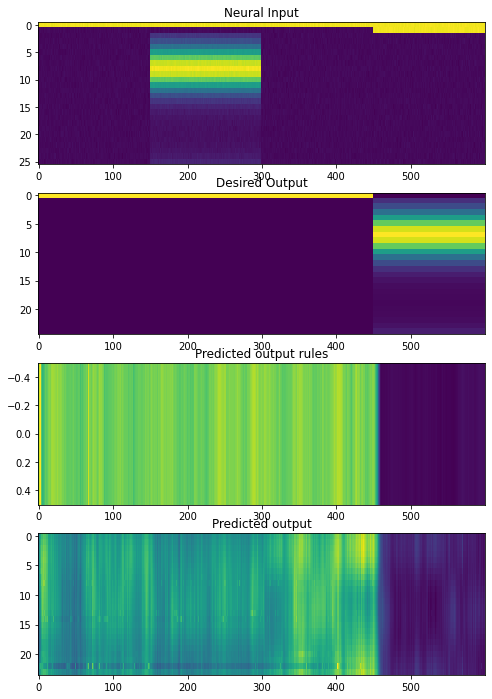

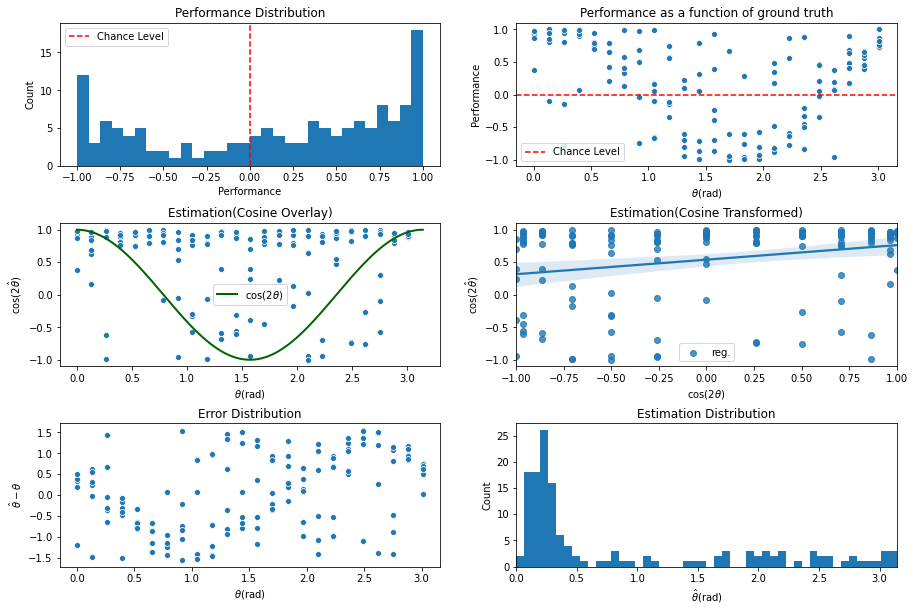

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3400\assets

 Training performance: 
Iter. 3401 | Performance -0.0884 | Loss 0.3158 | Spike loss 1.6494
Testing performance: 
Iter. 3401 | Performance 0.2819 | Loss 0.3157 | Spike loss 1.6411

 Training performance: 
Iter. 3402 | Performance 0.1087 | Loss 0.3154 | Spike loss 1.6517
Testing performance: 
Iter. 3402 | Performance 0.2449 | Loss 0.3159 | Spike loss 1.6471

 Training performance: 
Iter. 3403 | Performance 0.0486 | Loss 0.3160 | Spike loss 1.6474
Testing performance: 
Iter. 3403 | Performance 0.2390 | Loss 0.3157 | Spike loss 1.6453

 Training performance: 
Iter. 3404 | Performance -0.1047 | Loss 0.3154 | Spike loss 1.6540
Testing performance: 
Iter. 3404 | Performance 0.2430 | Loss 0.3158 | Spike loss 1.6531

 Training performance: 
Iter. 3405 | Performance -0.0348 | Loss 0.3152 | Spike loss 1.6548
Testing performance: 
Iter. 3405 | Performance 0.2330 | Loss 0.3157 | Spike loss 1.6455

 Training 


 Training performance: 
Iter. 3447 | Performance 0.0317 | Loss 0.3159 | Spike loss 1.6510
Testing performance: 
Iter. 3447 | Performance 0.1318 | Loss 0.3159 | Spike loss 1.6617

 Training performance: 
Iter. 3448 | Performance -0.0534 | Loss 0.3159 | Spike loss 1.6609
Testing performance: 
Iter. 3448 | Performance 0.1335 | Loss 0.3159 | Spike loss 1.6591

 Training performance: 
Iter. 3449 | Performance 0.0053 | Loss 0.3161 | Spike loss 1.6619
Testing performance: 
Iter. 3449 | Performance 0.0877 | Loss 0.3161 | Spike loss 1.6522

 Training performance: 
Iter. 3450 | Performance -0.0024 | Loss 0.3150 | Spike loss 1.6580
Testing performance: 
Iter. 3450 | Performance 0.1041 | Loss 0.3161 | Spike loss 1.6544

 Training performance: 
Iter. 3451 | Performance -0.0174 | Loss 0.3161 | Spike loss 1.6515
Testing performance: 
Iter. 3451 | Performance 0.1265 | Loss 0.3161 | Spike loss 1.6496

 Training performance: 
Iter. 3452 | Performance -0.0418 | Loss 0.3155 | Spike loss 1.6553
Testing pe


 Training performance: 
Iter. 3493 | Performance -0.0141 | Loss 0.3163 | Spike loss 1.6651
Testing performance: 
Iter. 3493 | Performance 0.2029 | Loss 0.3153 | Spike loss 1.6623

 Training performance: 
Iter. 3494 | Performance -0.0352 | Loss 0.3157 | Spike loss 1.6615
Testing performance: 
Iter. 3494 | Performance 0.1822 | Loss 0.3153 | Spike loss 1.6517

 Training performance: 
Iter. 3495 | Performance -0.0415 | Loss 0.3149 | Spike loss 1.6685
Testing performance: 
Iter. 3495 | Performance 0.1650 | Loss 0.3158 | Spike loss 1.6595

 Training performance: 
Iter. 3496 | Performance 0.0933 | Loss 0.3156 | Spike loss 1.6527
Testing performance: 
Iter. 3496 | Performance 0.1868 | Loss 0.3154 | Spike loss 1.6556

 Training performance: 
Iter. 3497 | Performance 0.0289 | Loss 0.3151 | Spike loss 1.6529
Testing performance: 
Iter. 3497 | Performance 0.2122 | Loss 0.3154 | Spike loss 1.6544

 Training performance: 
Iter. 3498 | Performance 0.0864 | Loss 0.3155 | Spike loss 1.6637
Testing per

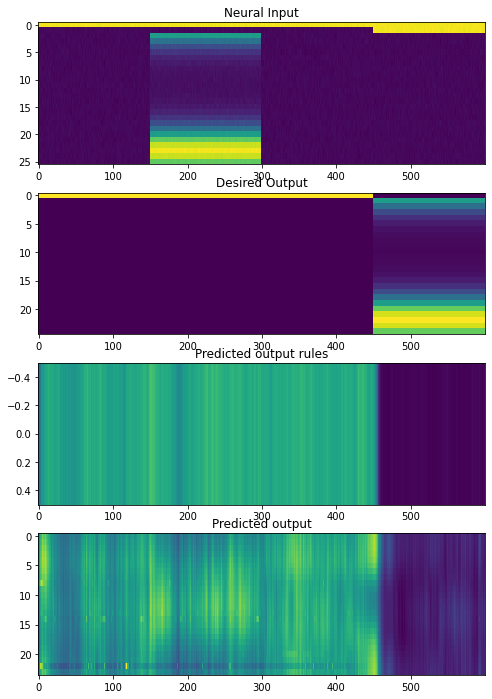

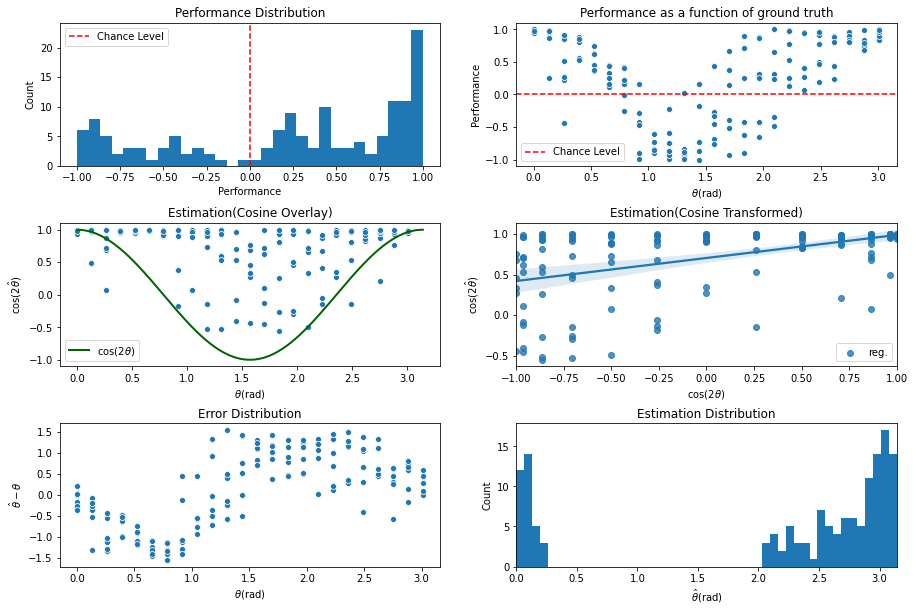

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3500\assets

 Training performance: 
Iter. 3501 | Performance -0.0898 | Loss 0.3154 | Spike loss 1.6636
Testing performance: 
Iter. 3501 | Performance 0.1744 | Loss 0.3155 | Spike loss 1.6617

 Training performance: 
Iter. 3502 | Performance -0.0012 | Loss 0.3158 | Spike loss 1.6576
Testing performance: 
Iter. 3502 | Performance 0.1606 | Loss 0.3151 | Spike loss 1.6521

 Training performance: 
Iter. 3503 | Performance 0.0019 | Loss 0.3158 | Spike loss 1.6690
Testing performance: 
Iter. 3503 | Performance 0.2659 | Loss 0.3154 | Spike loss 1.6636

 Training performance: 
Iter. 3504 | Performance -0.1282 | Loss 0.3155 | Spike loss 1.6647
Testing performance: 
Iter. 3504 | Performance 0.3202 | Loss 0.3156 | Spike loss 1.6543

 Training performance: 
Iter. 3505 | Performance -0.0265 | Loss 0.3155 | Spike loss 1.6613
Testing performance: 
Iter. 3505 | Performance 0.3233 | Loss 0.3155 | Spike loss 1.6586

 Training


 Training performance: 
Iter. 3547 | Performance -0.0127 | Loss 0.3155 | Spike loss 1.6647
Testing performance: 
Iter. 3547 | Performance 0.3349 | Loss 0.3154 | Spike loss 1.6637

 Training performance: 
Iter. 3548 | Performance -0.0849 | Loss 0.3149 | Spike loss 1.6672
Testing performance: 
Iter. 3548 | Performance 0.3088 | Loss 0.3155 | Spike loss 1.6675

 Training performance: 
Iter. 3549 | Performance -0.0227 | Loss 0.3146 | Spike loss 1.6628
Testing performance: 
Iter. 3549 | Performance 0.3312 | Loss 0.3153 | Spike loss 1.6703

 Training performance: 
Iter. 3550 | Performance 0.0534 | Loss 0.3158 | Spike loss 1.6666
Testing performance: 
Iter. 3550 | Performance 0.3097 | Loss 0.3154 | Spike loss 1.6629

 Training performance: 
Iter. 3551 | Performance -0.0759 | Loss 0.3155 | Spike loss 1.6725
Testing performance: 
Iter. 3551 | Performance 0.5128 | Loss 0.3144 | Spike loss 1.6673

 Training performance: 
Iter. 3552 | Performance -0.0582 | Loss 0.3149 | Spike loss 1.6593
Testing p


 Training performance: 
Iter. 3593 | Performance 0.0316 | Loss 0.3142 | Spike loss 1.6687
Testing performance: 
Iter. 3593 | Performance 0.4263 | Loss 0.3149 | Spike loss 1.6705

 Training performance: 
Iter. 3594 | Performance -0.1002 | Loss 0.3145 | Spike loss 1.6723
Testing performance: 
Iter. 3594 | Performance 0.3810 | Loss 0.3147 | Spike loss 1.6699

 Training performance: 
Iter. 3595 | Performance -0.0582 | Loss 0.3146 | Spike loss 1.6665
Testing performance: 
Iter. 3595 | Performance 0.2877 | Loss 0.3146 | Spike loss 1.6681

 Training performance: 
Iter. 3596 | Performance -0.0806 | Loss 0.3146 | Spike loss 1.6829
Testing performance: 
Iter. 3596 | Performance 0.2652 | Loss 0.3148 | Spike loss 1.6745

 Training performance: 
Iter. 3597 | Performance 0.0305 | Loss 0.3151 | Spike loss 1.6614
Testing performance: 
Iter. 3597 | Performance 0.2467 | Loss 0.3152 | Spike loss 1.6704

 Training performance: 
Iter. 3598 | Performance -0.0168 | Loss 0.3144 | Spike loss 1.6831
Testing pe

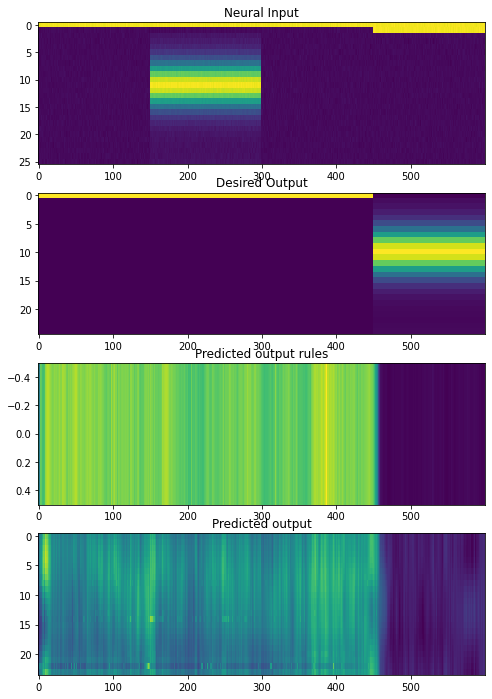

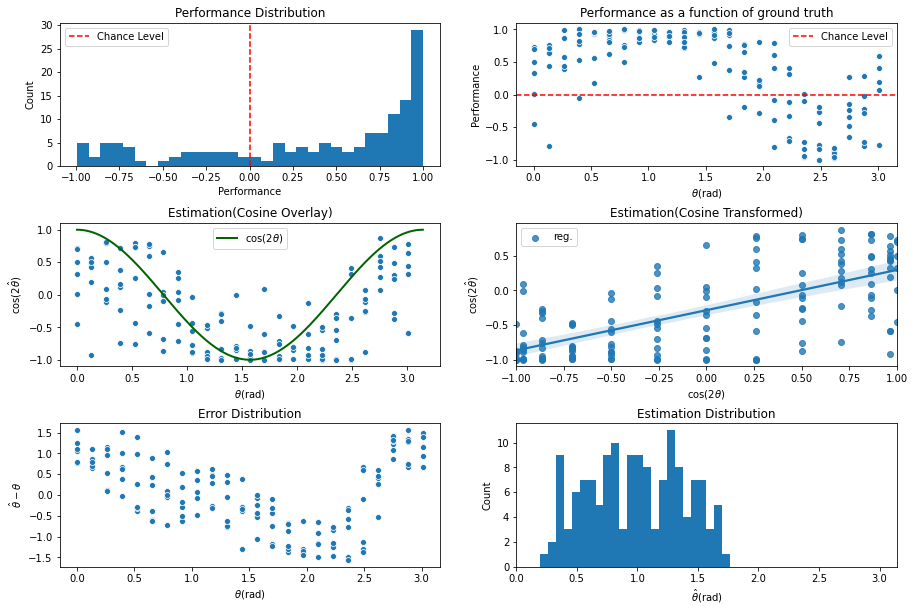

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3600\assets

 Training performance: 
Iter. 3601 | Performance 0.0064 | Loss 0.3145 | Spike loss 1.6878
Testing performance: 
Iter. 3601 | Performance 0.2822 | Loss 0.3147 | Spike loss 1.6843

 Training performance: 
Iter. 3602 | Performance 0.0040 | Loss 0.3149 | Spike loss 1.6877
Testing performance: 
Iter. 3602 | Performance 0.3091 | Loss 0.3144 | Spike loss 1.6844

 Training performance: 
Iter. 3603 | Performance 0.0689 | Loss 0.3144 | Spike loss 1.6934
Testing performance: 
Iter. 3603 | Performance 0.3064 | Loss 0.3143 | Spike loss 1.6795

 Training performance: 
Iter. 3604 | Performance 0.0050 | Loss 0.3146 | Spike loss 1.6851
Testing performance: 
Iter. 3604 | Performance 0.3158 | Loss 0.3150 | Spike loss 1.6834

 Training performance: 
Iter. 3605 | Performance -0.0031 | Loss 0.3146 | Spike loss 1.6781
Testing performance: 
Iter. 3605 | Performance 0.3469 | Loss 0.3145 | Spike loss 1.6787

 Training pe


 Training performance: 
Iter. 3647 | Performance 0.0377 | Loss 0.3143 | Spike loss 1.7088
Testing performance: 
Iter. 3647 | Performance 0.2133 | Loss 0.3150 | Spike loss 1.7132

 Training performance: 
Iter. 3648 | Performance 0.1210 | Loss 0.3135 | Spike loss 1.7312
Testing performance: 
Iter. 3648 | Performance 0.1835 | Loss 0.3153 | Spike loss 1.7169

 Training performance: 
Iter. 3649 | Performance -0.0228 | Loss 0.3139 | Spike loss 1.7070
Testing performance: 
Iter. 3649 | Performance 0.2311 | Loss 0.3147 | Spike loss 1.7133

 Training performance: 
Iter. 3650 | Performance 0.1160 | Loss 0.3155 | Spike loss 1.7163
Testing performance: 
Iter. 3650 | Performance 0.2347 | Loss 0.3143 | Spike loss 1.7143

 Training performance: 
Iter. 3651 | Performance 0.0376 | Loss 0.3128 | Spike loss 1.7212
Testing performance: 
Iter. 3651 | Performance 0.2250 | Loss 0.3147 | Spike loss 1.7137

 Training performance: 
Iter. 3652 | Performance -0.0103 | Loss 0.3139 | Spike loss 1.7320
Testing perf


 Training performance: 
Iter. 3693 | Performance 0.1285 | Loss 0.3127 | Spike loss 1.7445
Testing performance: 
Iter. 3693 | Performance 0.4531 | Loss 0.3135 | Spike loss 1.7473

 Training performance: 
Iter. 3694 | Performance 0.0233 | Loss 0.3132 | Spike loss 1.7519
Testing performance: 
Iter. 3694 | Performance 0.4331 | Loss 0.3135 | Spike loss 1.7576

 Training performance: 
Iter. 3695 | Performance 0.1280 | Loss 0.3139 | Spike loss 1.7548
Testing performance: 
Iter. 3695 | Performance 0.4254 | Loss 0.3136 | Spike loss 1.7494

 Training performance: 
Iter. 3696 | Performance -0.0413 | Loss 0.3127 | Spike loss 1.7753
Testing performance: 
Iter. 3696 | Performance 0.4583 | Loss 0.3136 | Spike loss 1.7601

 Training performance: 
Iter. 3697 | Performance -0.0338 | Loss 0.3130 | Spike loss 1.7676
Testing performance: 
Iter. 3697 | Performance 0.4128 | Loss 0.3135 | Spike loss 1.7566

 Training performance: 
Iter. 3698 | Performance 0.0508 | Loss 0.3133 | Spike loss 1.7588
Testing perf

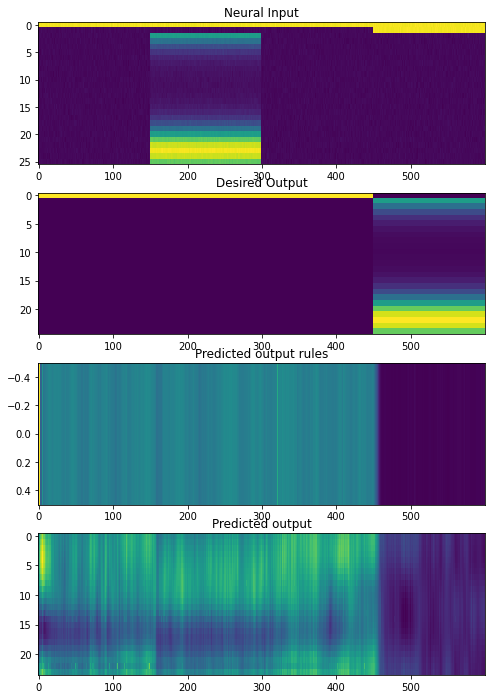

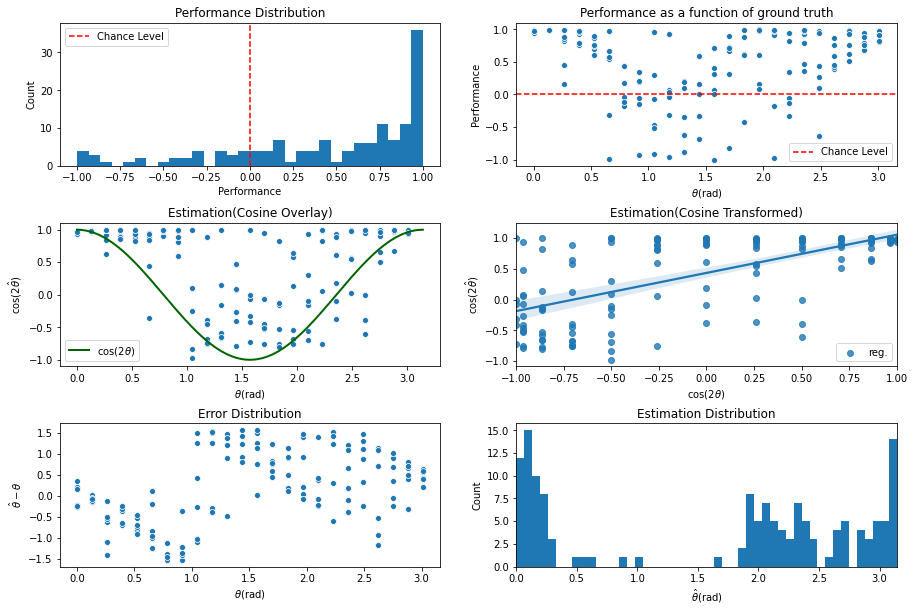

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3700\assets

 Training performance: 
Iter. 3701 | Performance -0.0638 | Loss 0.3115 | Spike loss 1.7739
Testing performance: 
Iter. 3701 | Performance 0.3644 | Loss 0.3137 | Spike loss 1.7763

 Training performance: 
Iter. 3702 | Performance -0.0868 | Loss 0.3138 | Spike loss 1.7874
Testing performance: 
Iter. 3702 | Performance 0.3747 | Loss 0.3134 | Spike loss 1.7756

 Training performance: 
Iter. 3703 | Performance 0.0729 | Loss 0.3124 | Spike loss 1.7654
Testing performance: 
Iter. 3703 | Performance 0.3385 | Loss 0.3129 | Spike loss 1.7747

 Training performance: 
Iter. 3704 | Performance 0.0781 | Loss 0.3131 | Spike loss 1.7879
Testing performance: 
Iter. 3704 | Performance 0.3686 | Loss 0.3131 | Spike loss 1.7873

 Training performance: 
Iter. 3705 | Performance -0.1186 | Loss 0.3133 | Spike loss 1.8117
Testing performance: 
Iter. 3705 | Performance 0.4181 | Loss 0.3122 | Spike loss 1.7772

 Training 


 Training performance: 
Iter. 3747 | Performance 0.0473 | Loss 0.3080 | Spike loss 1.9338
Testing performance: 
Iter. 3747 | Performance 0.6302 | Loss 0.3088 | Spike loss 1.9268

 Training performance: 
Iter. 3748 | Performance 0.0189 | Loss 0.3083 | Spike loss 1.9305
Testing performance: 
Iter. 3748 | Performance 0.5845 | Loss 0.3086 | Spike loss 1.9266

 Training performance: 
Iter. 3749 | Performance -0.0277 | Loss 0.3071 | Spike loss 1.9224
Testing performance: 
Iter. 3749 | Performance 0.5902 | Loss 0.3075 | Spike loss 1.9441

 Training performance: 
Iter. 3750 | Performance -0.0104 | Loss 0.3071 | Spike loss 1.9474
Testing performance: 
Iter. 3750 | Performance 0.5628 | Loss 0.3084 | Spike loss 1.9626

 Training performance: 
Iter. 3751 | Performance 0.0772 | Loss 0.3077 | Spike loss 1.9568
Testing performance: 
Iter. 3751 | Performance 0.5642 | Loss 0.3080 | Spike loss 1.9749

 Training performance: 
Iter. 3752 | Performance 0.0071 | Loss 0.3081 | Spike loss 1.9662
Testing perf


 Training performance: 
Iter. 3793 | Performance 0.0988 | Loss 0.3052 | Spike loss 2.0010
Testing performance: 
Iter. 3793 | Performance 0.6715 | Loss 0.3024 | Spike loss 2.0220

 Training performance: 
Iter. 3794 | Performance -0.0375 | Loss 0.3030 | Spike loss 2.0403
Testing performance: 
Iter. 3794 | Performance 0.6308 | Loss 0.3023 | Spike loss 1.9958

 Training performance: 
Iter. 3795 | Performance -0.0307 | Loss 0.3003 | Spike loss 2.0235
Testing performance: 
Iter. 3795 | Performance 0.6502 | Loss 0.3040 | Spike loss 1.9945

 Training performance: 
Iter. 3796 | Performance 0.0664 | Loss 0.3043 | Spike loss 2.0022
Testing performance: 
Iter. 3796 | Performance 0.6354 | Loss 0.3014 | Spike loss 1.9943

 Training performance: 
Iter. 3797 | Performance 0.0253 | Loss 0.2996 | Spike loss 2.0547
Testing performance: 
Iter. 3797 | Performance 0.6689 | Loss 0.3012 | Spike loss 2.0029

 Training performance: 
Iter. 3798 | Performance 0.0449 | Loss 0.3007 | Spike loss 2.0148
Testing perf

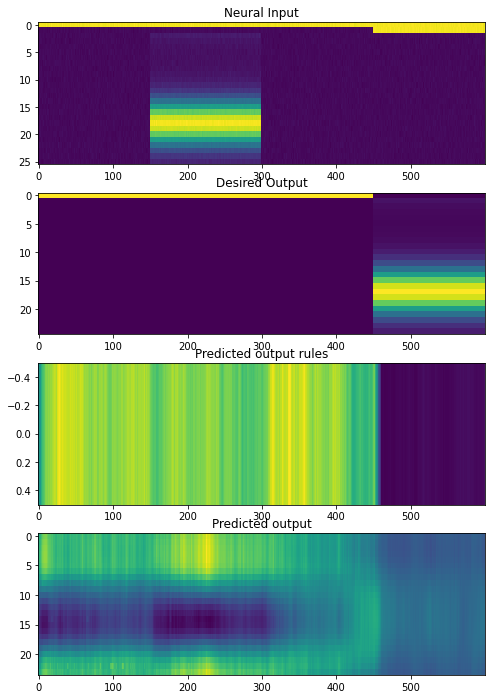

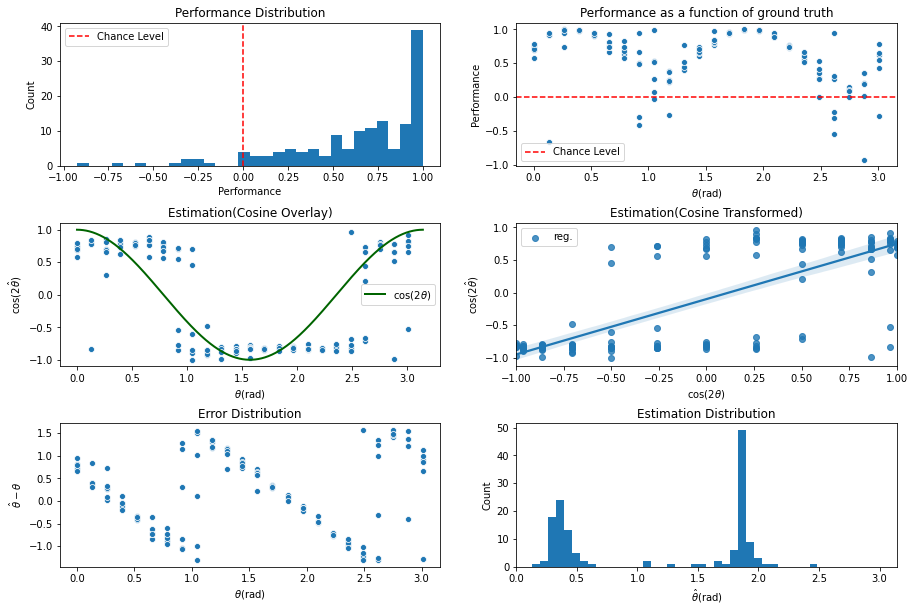

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3800\assets

 Training performance: 
Iter. 3801 | Performance 0.1657 | Loss 0.2997 | Spike loss 2.0453
Testing performance: 
Iter. 3801 | Performance 0.6273 | Loss 0.3028 | Spike loss 2.0147

 Training performance: 
Iter. 3802 | Performance -0.0597 | Loss 0.3069 | Spike loss 2.0074
Testing performance: 
Iter. 3802 | Performance 0.6386 | Loss 0.2999 | Spike loss 2.0058

 Training performance: 
Iter. 3803 | Performance -0.0127 | Loss 0.3005 | Spike loss 2.0468
Testing performance: 
Iter. 3803 | Performance 0.6144 | Loss 0.3011 | Spike loss 1.9973

 Training performance: 
Iter. 3804 | Performance 0.0754 | Loss 0.3008 | Spike loss 2.0294
Testing performance: 
Iter. 3804 | Performance 0.6392 | Loss 0.3040 | Spike loss 2.0179

 Training performance: 
Iter. 3805 | Performance 0.0376 | Loss 0.2986 | Spike loss 2.0694
Testing performance: 
Iter. 3805 | Performance 0.6413 | Loss 0.2998 | Spike loss 2.0365

 Training p


 Training performance: 
Iter. 3847 | Performance -0.0364 | Loss 0.2985 | Spike loss 1.9945
Testing performance: 
Iter. 3847 | Performance 0.6538 | Loss 0.2965 | Spike loss 1.9843

 Training performance: 
Iter. 3848 | Performance 0.1083 | Loss 0.2962 | Spike loss 1.9764
Testing performance: 
Iter. 3848 | Performance 0.6677 | Loss 0.2979 | Spike loss 1.9759

 Training performance: 
Iter. 3849 | Performance 0.0504 | Loss 0.2972 | Spike loss 1.9816
Testing performance: 
Iter. 3849 | Performance 0.6623 | Loss 0.2997 | Spike loss 1.9817

 Training performance: 
Iter. 3850 | Performance 0.0599 | Loss 0.2977 | Spike loss 1.9795
Testing performance: 
Iter. 3850 | Performance 0.6481 | Loss 0.2970 | Spike loss 1.9662

 Training performance: 
Iter. 3851 | Performance 0.0028 | Loss 0.2976 | Spike loss 1.9709
Testing performance: 
Iter. 3851 | Performance 0.6362 | Loss 0.2978 | Spike loss 1.9482

 Training performance: 
Iter. 3852 | Performance 0.0716 | Loss 0.2956 | Spike loss 1.9665
Testing perfo


 Training performance: 
Iter. 3893 | Performance 0.0137 | Loss 0.2959 | Spike loss 1.9297
Testing performance: 
Iter. 3893 | Performance 0.6492 | Loss 0.2971 | Spike loss 1.9873

 Training performance: 
Iter. 3894 | Performance -0.0268 | Loss 0.2951 | Spike loss 2.0008
Testing performance: 
Iter. 3894 | Performance 0.6433 | Loss 0.2985 | Spike loss 1.9783

 Training performance: 
Iter. 3895 | Performance 0.0424 | Loss 0.2978 | Spike loss 2.0308
Testing performance: 
Iter. 3895 | Performance 0.6475 | Loss 0.2967 | Spike loss 1.9807

 Training performance: 
Iter. 3896 | Performance 0.1257 | Loss 0.2962 | Spike loss 2.0150
Testing performance: 
Iter. 3896 | Performance 0.6431 | Loss 0.2962 | Spike loss 1.9744

 Training performance: 
Iter. 3897 | Performance 0.0366 | Loss 0.2943 | Spike loss 1.9640
Testing performance: 
Iter. 3897 | Performance 0.6648 | Loss 0.2963 | Spike loss 1.9687

 Training performance: 
Iter. 3898 | Performance -0.0693 | Loss 0.2964 | Spike loss 1.9366
Testing perf

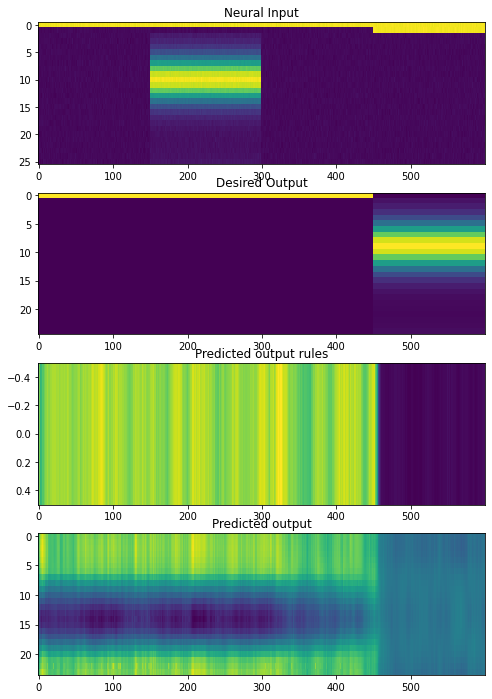

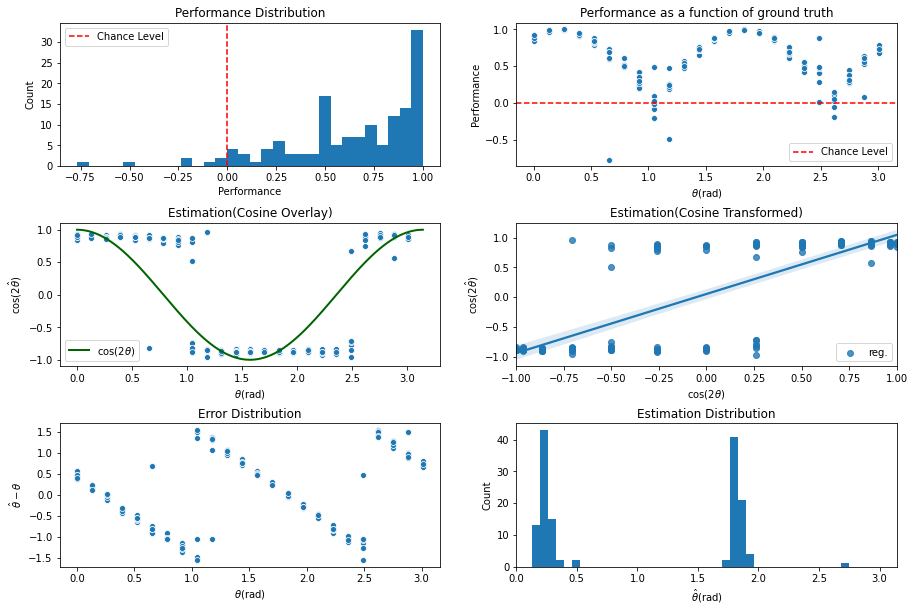

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter3900\assets

 Training performance: 
Iter. 3901 | Performance -0.0698 | Loss 0.2989 | Spike loss 1.9906
Testing performance: 
Iter. 3901 | Performance 0.6814 | Loss 0.2950 | Spike loss 1.9701

 Training performance: 
Iter. 3902 | Performance 0.0212 | Loss 0.2944 | Spike loss 2.0149
Testing performance: 
Iter. 3902 | Performance 0.6521 | Loss 0.2970 | Spike loss 1.9599

 Training performance: 
Iter. 3903 | Performance 0.0036 | Loss 0.2943 | Spike loss 1.9655
Testing performance: 
Iter. 3903 | Performance 0.6512 | Loss 0.2973 | Spike loss 1.9613

 Training performance: 
Iter. 3904 | Performance -0.0215 | Loss 0.2985 | Spike loss 1.9615
Testing performance: 
Iter. 3904 | Performance 0.6723 | Loss 0.2956 | Spike loss 1.9535

 Training performance: 
Iter. 3905 | Performance 0.1220 | Loss 0.2943 | Spike loss 1.9715
Testing performance: 
Iter. 3905 | Performance 0.6620 | Loss 0.2954 | Spike loss 1.9698

 Training p


 Training performance: 
Iter. 3947 | Performance 0.1143 | Loss 0.2918 | Spike loss 1.9611
Testing performance: 
Iter. 3947 | Performance 0.6559 | Loss 0.2959 | Spike loss 1.9742

 Training performance: 
Iter. 3948 | Performance -0.0243 | Loss 0.2957 | Spike loss 1.9828
Testing performance: 
Iter. 3948 | Performance 0.6453 | Loss 0.2974 | Spike loss 1.9772

 Training performance: 
Iter. 3949 | Performance 0.0708 | Loss 0.2954 | Spike loss 1.9674
Testing performance: 
Iter. 3949 | Performance 0.6719 | Loss 0.2939 | Spike loss 1.9755

 Training performance: 
Iter. 3950 | Performance 0.0328 | Loss 0.2919 | Spike loss 2.0308
Testing performance: 
Iter. 3950 | Performance 0.6612 | Loss 0.2950 | Spike loss 1.9765

 Training performance: 
Iter. 3951 | Performance 0.0275 | Loss 0.2927 | Spike loss 2.0140
Testing performance: 
Iter. 3951 | Performance 0.6304 | Loss 0.2968 | Spike loss 1.9717

 Training performance: 
Iter. 3952 | Performance 0.0086 | Loss 0.2955 | Spike loss 1.9663
Testing perfo


 Training performance: 
Iter. 3993 | Performance 0.0284 | Loss 0.2929 | Spike loss 2.0140
Testing performance: 
Iter. 3993 | Performance 0.6819 | Loss 0.2950 | Spike loss 1.9709

 Training performance: 
Iter. 3994 | Performance -0.0764 | Loss 0.2954 | Spike loss 1.9391
Testing performance: 
Iter. 3994 | Performance 0.6777 | Loss 0.2943 | Spike loss 1.9855

 Training performance: 
Iter. 3995 | Performance 0.0108 | Loss 0.2931 | Spike loss 1.9988
Testing performance: 
Iter. 3995 | Performance 0.6692 | Loss 0.2951 | Spike loss 1.9954

 Training performance: 
Iter. 3996 | Performance -0.0378 | Loss 0.2949 | Spike loss 2.0089
Testing performance: 
Iter. 3996 | Performance 0.6562 | Loss 0.2959 | Spike loss 1.9997

 Training performance: 
Iter. 3997 | Performance 0.1381 | Loss 0.2920 | Spike loss 1.9878
Testing performance: 
Iter. 3997 | Performance 0.6550 | Loss 0.2947 | Spike loss 1.9774

 Training performance: 
Iter. 3998 | Performance 0.2008 | Loss 0.2916 | Spike loss 1.9978
Testing perf

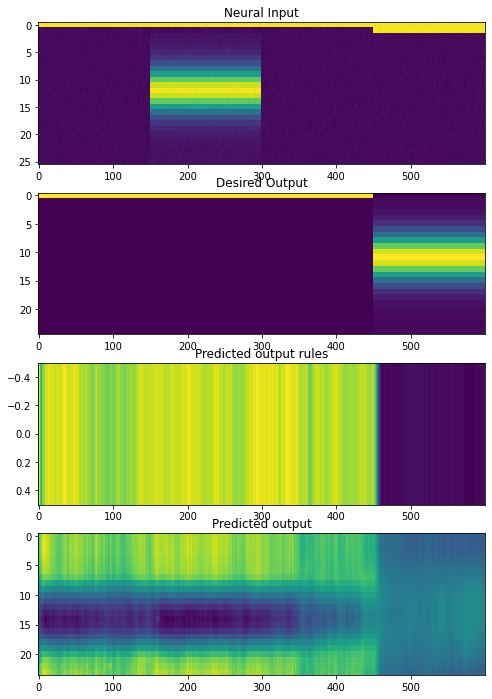

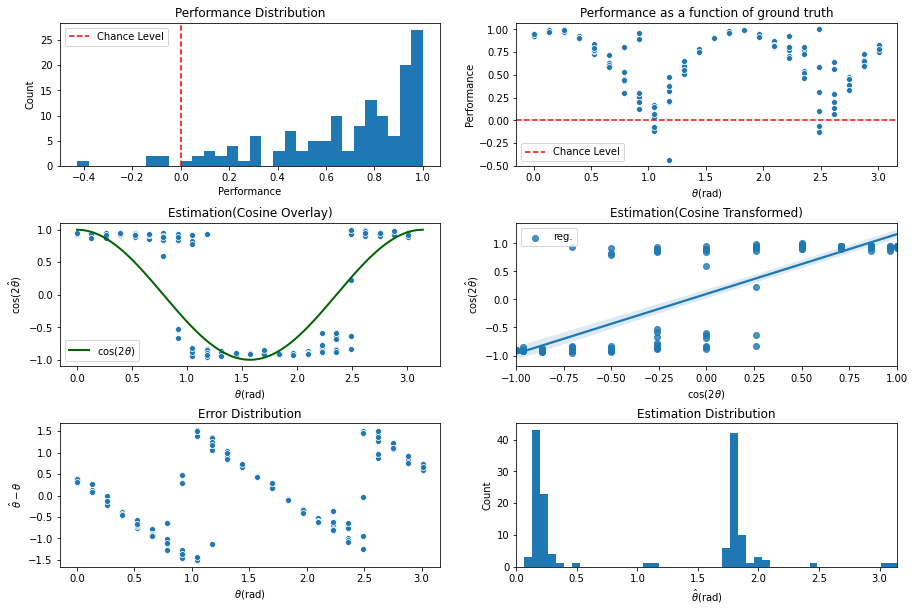

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4000\assets

 Training performance: 
Iter. 4001 | Performance -0.0111 | Loss 0.2920 | Spike loss 2.0436
Testing performance: 
Iter. 4001 | Performance 0.6708 | Loss 0.2946 | Spike loss 1.9753

 Training performance: 
Iter. 4002 | Performance -0.0811 | Loss 0.2939 | Spike loss 2.0290
Testing performance: 
Iter. 4002 | Performance 0.6855 | Loss 0.2960 | Spike loss 1.9827

 Training performance: 
Iter. 4003 | Performance 0.0963 | Loss 0.2956 | Spike loss 2.0017
Testing performance: 
Iter. 4003 | Performance 0.6797 | Loss 0.2942 | Spike loss 1.9874

 Training performance: 
Iter. 4004 | Performance 0.0058 | Loss 0.2910 | Spike loss 2.0391
Testing performance: 
Iter. 4004 | Performance 0.6767 | Loss 0.2938 | Spike loss 1.9718

 Training performance: 
Iter. 4005 | Performance 0.0568 | Loss 0.2926 | Spike loss 2.0432
Testing performance: 
Iter. 4005 | Performance 0.6782 | Loss 0.2954 | Spike loss 1.9799

 Training p


 Training performance: 
Iter. 4047 | Performance -0.0142 | Loss 0.2920 | Spike loss 1.9956
Testing performance: 
Iter. 4047 | Performance 0.6902 | Loss 0.2956 | Spike loss 1.9678

 Training performance: 
Iter. 4048 | Performance 0.0226 | Loss 0.2936 | Spike loss 1.9653
Testing performance: 
Iter. 4048 | Performance 0.6845 | Loss 0.2933 | Spike loss 1.9643

 Training performance: 
Iter. 4049 | Performance -0.0857 | Loss 0.2926 | Spike loss 1.9562
Testing performance: 
Iter. 4049 | Performance 0.6953 | Loss 0.2942 | Spike loss 1.9737

 Training performance: 
Iter. 4050 | Performance 0.0528 | Loss 0.2915 | Spike loss 1.9901
Testing performance: 
Iter. 4050 | Performance 0.6401 | Loss 0.2955 | Spike loss 1.9626

 Training performance: 
Iter. 4051 | Performance 0.0903 | Loss 0.2931 | Spike loss 1.9807
Testing performance: 
Iter. 4051 | Performance 0.6409 | Loss 0.2941 | Spike loss 1.9597

 Training performance: 
Iter. 4052 | Performance -0.1199 | Loss 0.2885 | Spike loss 2.0581
Testing per


 Training performance: 
Iter. 4093 | Performance -0.0862 | Loss 0.2943 | Spike loss 1.9942
Testing performance: 
Iter. 4093 | Performance 0.6942 | Loss 0.2933 | Spike loss 1.9630

 Training performance: 
Iter. 4094 | Performance -0.0483 | Loss 0.2892 | Spike loss 2.0021
Testing performance: 
Iter. 4094 | Performance 0.7046 | Loss 0.2932 | Spike loss 1.9709

 Training performance: 
Iter. 4095 | Performance 0.0054 | Loss 0.2882 | Spike loss 2.0390
Testing performance: 
Iter. 4095 | Performance 0.7022 | Loss 0.2938 | Spike loss 1.9622

 Training performance: 
Iter. 4096 | Performance -0.1538 | Loss 0.2933 | Spike loss 1.9438
Testing performance: 
Iter. 4096 | Performance 0.6732 | Loss 0.2928 | Spike loss 1.9688

 Training performance: 
Iter. 4097 | Performance 0.0105 | Loss 0.2903 | Spike loss 2.0074
Testing performance: 
Iter. 4097 | Performance 0.7032 | Loss 0.2925 | Spike loss 1.9659

 Training performance: 
Iter. 4098 | Performance -0.0112 | Loss 0.2887 | Spike loss 1.9711
Testing pe

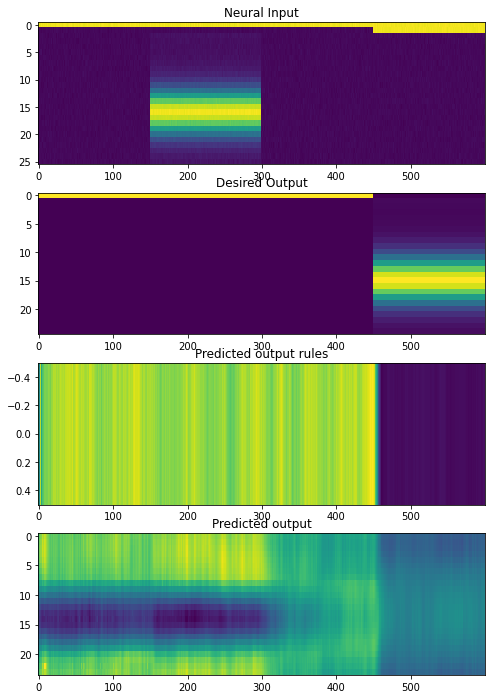

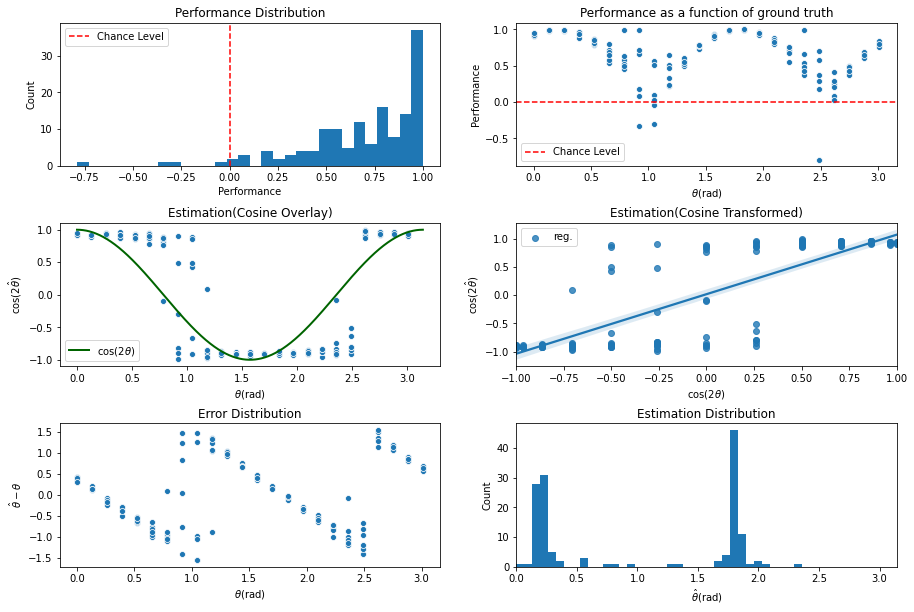

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4100\assets

 Training performance: 
Iter. 4101 | Performance 0.0952 | Loss 0.2911 | Spike loss 1.9696
Testing performance: 
Iter. 4101 | Performance 0.6796 | Loss 0.2950 | Spike loss 1.9451

 Training performance: 
Iter. 4102 | Performance -0.0454 | Loss 0.2928 | Spike loss 1.9869
Testing performance: 
Iter. 4102 | Performance 0.7126 | Loss 0.2922 | Spike loss 1.9630

 Training performance: 
Iter. 4103 | Performance 0.0195 | Loss 0.2918 | Spike loss 1.9810
Testing performance: 
Iter. 4103 | Performance 0.6654 | Loss 0.2939 | Spike loss 1.9708

 Training performance: 
Iter. 4104 | Performance 0.0759 | Loss 0.2920 | Spike loss 1.9755
Testing performance: 
Iter. 4104 | Performance 0.6954 | Loss 0.2941 | Spike loss 1.9536

 Training performance: 
Iter. 4105 | Performance 0.0438 | Loss 0.2919 | Spike loss 2.0175
Testing performance: 
Iter. 4105 | Performance 0.7034 | Loss 0.2919 | Spike loss 1.9671

 Training pe


 Training performance: 
Iter. 4147 | Performance -0.0614 | Loss 0.2919 | Spike loss 2.0007
Testing performance: 
Iter. 4147 | Performance 0.7176 | Loss 0.2915 | Spike loss 1.9682

 Training performance: 
Iter. 4148 | Performance 0.0439 | Loss 0.2933 | Spike loss 1.9416
Testing performance: 
Iter. 4148 | Performance 0.6818 | Loss 0.2941 | Spike loss 1.9448

 Training performance: 
Iter. 4149 | Performance 0.0078 | Loss 0.2886 | Spike loss 2.0119
Testing performance: 
Iter. 4149 | Performance 0.7073 | Loss 0.2934 | Spike loss 1.9379

 Training performance: 
Iter. 4150 | Performance -0.0194 | Loss 0.2916 | Spike loss 1.9536
Testing performance: 
Iter. 4150 | Performance 0.6965 | Loss 0.2925 | Spike loss 1.9603

 Training performance: 
Iter. 4151 | Performance 0.0517 | Loss 0.2896 | Spike loss 1.9569
Testing performance: 
Iter. 4151 | Performance 0.7211 | Loss 0.2916 | Spike loss 1.9746

 Training performance: 
Iter. 4152 | Performance 0.0318 | Loss 0.2890 | Spike loss 2.0254
Testing perf


 Training performance: 
Iter. 4193 | Performance -0.0269 | Loss 0.2904 | Spike loss 2.0111
Testing performance: 
Iter. 4193 | Performance 0.7261 | Loss 0.2915 | Spike loss 2.0321

 Training performance: 
Iter. 4194 | Performance 0.0108 | Loss 0.2936 | Spike loss 2.0040
Testing performance: 
Iter. 4194 | Performance 0.7240 | Loss 0.2923 | Spike loss 2.0180

 Training performance: 
Iter. 4195 | Performance -0.0130 | Loss 0.2945 | Spike loss 1.9690
Testing performance: 
Iter. 4195 | Performance 0.7257 | Loss 0.2905 | Spike loss 2.0231

 Training performance: 
Iter. 4196 | Performance -0.0001 | Loss 0.2892 | Spike loss 2.0227
Testing performance: 
Iter. 4196 | Performance 0.7311 | Loss 0.2911 | Spike loss 2.0026

 Training performance: 
Iter. 4197 | Performance 0.0301 | Loss 0.2870 | Spike loss 2.0739
Testing performance: 
Iter. 4197 | Performance 0.7484 | Loss 0.2927 | Spike loss 2.0156

 Training performance: 
Iter. 4198 | Performance 0.1050 | Loss 0.2926 | Spike loss 2.0453
Testing per

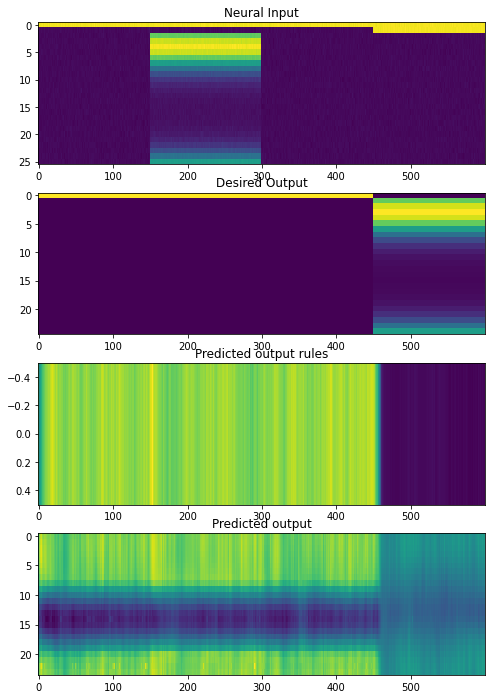

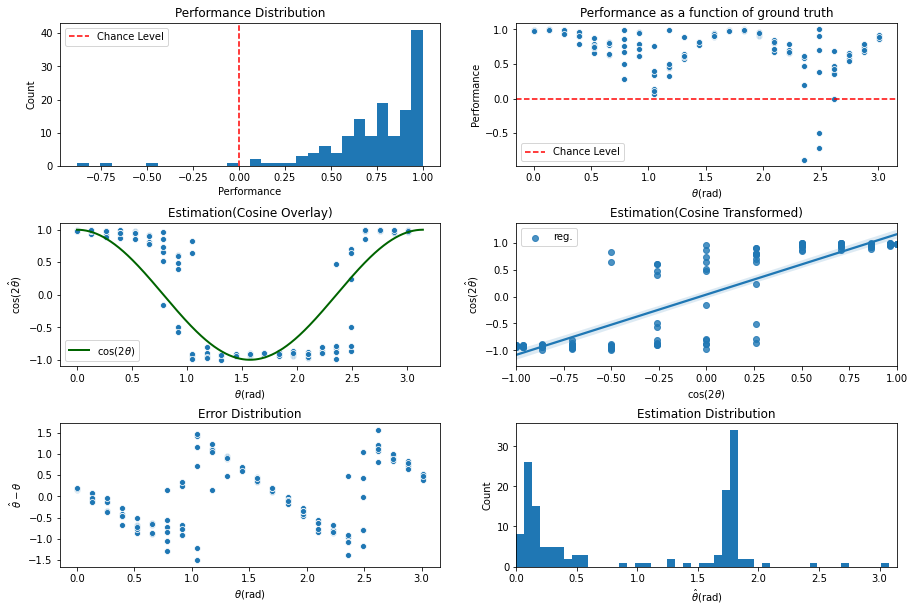

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4200\assets

 Training performance: 
Iter. 4201 | Performance -0.0134 | Loss 0.2926 | Spike loss 1.9723
Testing performance: 
Iter. 4201 | Performance 0.7615 | Loss 0.2903 | Spike loss 2.0285

 Training performance: 
Iter. 4202 | Performance -0.0396 | Loss 0.2893 | Spike loss 2.0470
Testing performance: 
Iter. 4202 | Performance 0.7483 | Loss 0.2914 | Spike loss 2.0288

 Training performance: 
Iter. 4203 | Performance -0.0015 | Loss 0.2894 | Spike loss 2.0772
Testing performance: 
Iter. 4203 | Performance 0.7594 | Loss 0.2922 | Spike loss 2.0012

 Training performance: 
Iter. 4204 | Performance 0.0025 | Loss 0.2904 | Spike loss 2.0686
Testing performance: 
Iter. 4204 | Performance 0.7236 | Loss 0.2902 | Spike loss 1.9896

 Training performance: 
Iter. 4205 | Performance -0.0649 | Loss 0.2899 | Spike loss 2.0324
Testing performance: 
Iter. 4205 | Performance 0.7065 | Loss 0.2912 | Spike loss 2.0023

 Training


 Training performance: 
Iter. 4247 | Performance -0.1116 | Loss 0.2906 | Spike loss 1.9263
Testing performance: 
Iter. 4247 | Performance 0.7545 | Loss 0.2893 | Spike loss 2.0077

 Training performance: 
Iter. 4248 | Performance -0.0199 | Loss 0.2910 | Spike loss 1.9864
Testing performance: 
Iter. 4248 | Performance 0.7522 | Loss 0.2910 | Spike loss 2.0102

 Training performance: 
Iter. 4249 | Performance -0.0208 | Loss 0.2910 | Spike loss 2.0156
Testing performance: 
Iter. 4249 | Performance 0.7436 | Loss 0.2904 | Spike loss 1.9894

 Training performance: 
Iter. 4250 | Performance -0.0802 | Loss 0.2881 | Spike loss 1.9379
Testing performance: 
Iter. 4250 | Performance 0.7659 | Loss 0.2887 | Spike loss 2.0155

 Training performance: 
Iter. 4251 | Performance 0.0037 | Loss 0.2888 | Spike loss 2.0008
Testing performance: 
Iter. 4251 | Performance 0.7811 | Loss 0.2897 | Spike loss 2.0149

 Training performance: 
Iter. 4252 | Performance 0.0151 | Loss 0.2875 | Spike loss 2.0457
Testing pe


 Training performance: 
Iter. 4293 | Performance -0.0328 | Loss 0.2884 | Spike loss 2.1075
Testing performance: 
Iter. 4293 | Performance 0.7846 | Loss 0.2893 | Spike loss 2.0512

 Training performance: 
Iter. 4294 | Performance -0.0986 | Loss 0.2862 | Spike loss 2.0871
Testing performance: 
Iter. 4294 | Performance 0.7974 | Loss 0.2866 | Spike loss 2.0666

 Training performance: 
Iter. 4295 | Performance -0.0328 | Loss 0.2844 | Spike loss 2.0590
Testing performance: 
Iter. 4295 | Performance 0.7988 | Loss 0.2872 | Spike loss 2.0390

 Training performance: 
Iter. 4296 | Performance 0.0293 | Loss 0.2841 | Spike loss 2.1060
Testing performance: 
Iter. 4296 | Performance 0.7974 | Loss 0.2873 | Spike loss 2.0648

 Training performance: 
Iter. 4297 | Performance 0.1549 | Loss 0.2840 | Spike loss 2.1103
Testing performance: 
Iter. 4297 | Performance 0.7961 | Loss 0.2870 | Spike loss 2.0581

 Training performance: 
Iter. 4298 | Performance -0.0560 | Loss 0.2862 | Spike loss 2.0924
Testing pe

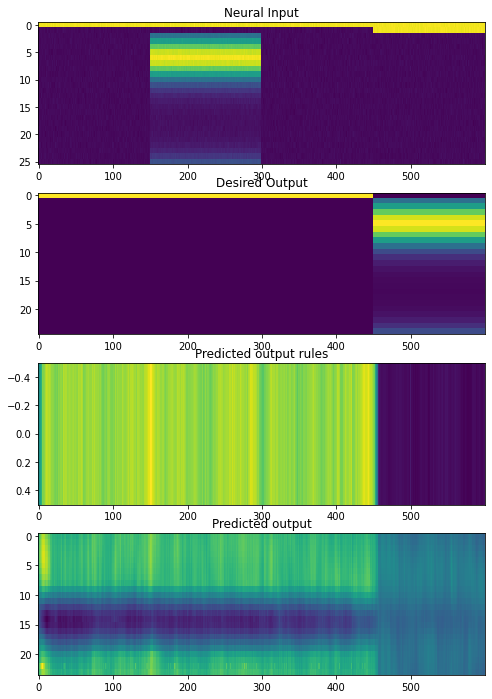

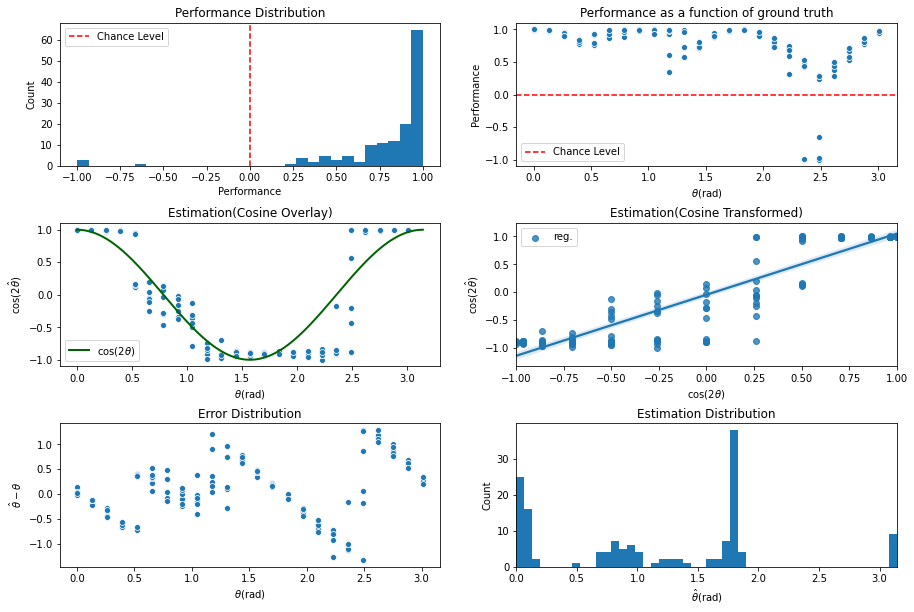

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4300\assets

 Training performance: 
Iter. 4301 | Performance 0.0416 | Loss 0.2838 | Spike loss 2.0548
Testing performance: 
Iter. 4301 | Performance 0.7945 | Loss 0.2870 | Spike loss 2.0617

 Training performance: 
Iter. 4302 | Performance 0.0180 | Loss 0.2861 | Spike loss 2.0433
Testing performance: 
Iter. 4302 | Performance 0.7666 | Loss 0.2895 | Spike loss 2.0332

 Training performance: 
Iter. 4303 | Performance 0.0168 | Loss 0.2859 | Spike loss 2.1060
Testing performance: 
Iter. 4303 | Performance 0.7813 | Loss 0.2862 | Spike loss 2.0674

 Training performance: 
Iter. 4304 | Performance -0.0378 | Loss 0.2841 | Spike loss 2.1397
Testing performance: 
Iter. 4304 | Performance 0.7724 | Loss 0.2871 | Spike loss 2.0569

 Training performance: 
Iter. 4305 | Performance 0.0098 | Loss 0.2855 | Spike loss 2.0918
Testing performance: 
Iter. 4305 | Performance 0.7925 | Loss 0.2872 | Spike loss 2.0472

 Training pe


 Training performance: 
Iter. 4347 | Performance -0.0219 | Loss 0.2861 | Spike loss 2.0401
Testing performance: 
Iter. 4347 | Performance 0.8071 | Loss 0.2871 | Spike loss 2.0885

 Training performance: 
Iter. 4348 | Performance 0.0691 | Loss 0.2838 | Spike loss 2.1373
Testing performance: 
Iter. 4348 | Performance 0.8222 | Loss 0.2838 | Spike loss 2.0872

 Training performance: 
Iter. 4349 | Performance -0.0928 | Loss 0.2824 | Spike loss 2.1025
Testing performance: 
Iter. 4349 | Performance 0.8274 | Loss 0.2827 | Spike loss 2.0905

 Training performance: 
Iter. 4350 | Performance 0.0592 | Loss 0.2825 | Spike loss 2.1091
Testing performance: 
Iter. 4350 | Performance 0.7960 | Loss 0.2854 | Spike loss 2.0701

 Training performance: 
Iter. 4351 | Performance -0.0171 | Loss 0.2830 | Spike loss 2.0611
Testing performance: 
Iter. 4351 | Performance 0.8250 | Loss 0.2822 | Spike loss 2.0879

 Training performance: 
Iter. 4352 | Performance -0.0692 | Loss 0.2805 | Spike loss 2.0728
Testing pe


 Training performance: 
Iter. 4393 | Performance 0.0292 | Loss 0.2824 | Spike loss 2.1931
Testing performance: 
Iter. 4393 | Performance 0.8139 | Loss 0.2836 | Spike loss 2.1892

 Training performance: 
Iter. 4394 | Performance 0.0690 | Loss 0.2811 | Spike loss 2.2019
Testing performance: 
Iter. 4394 | Performance 0.8072 | Loss 0.2849 | Spike loss 2.1708

 Training performance: 
Iter. 4395 | Performance 0.0851 | Loss 0.2821 | Spike loss 2.2111
Testing performance: 
Iter. 4395 | Performance 0.8135 | Loss 0.2855 | Spike loss 2.1670

 Training performance: 
Iter. 4396 | Performance -0.1502 | Loss 0.2832 | Spike loss 2.2443
Testing performance: 
Iter. 4396 | Performance 0.8241 | Loss 0.2826 | Spike loss 2.1848

 Training performance: 
Iter. 4397 | Performance -0.0250 | Loss 0.2838 | Spike loss 2.2235
Testing performance: 
Iter. 4397 | Performance 0.8343 | Loss 0.2830 | Spike loss 2.1660

 Training performance: 
Iter. 4398 | Performance -0.0704 | Loss 0.2819 | Spike loss 2.1820
Testing per

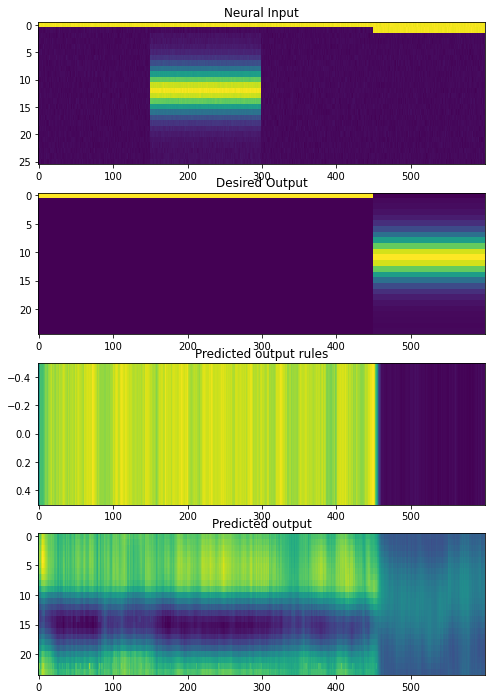

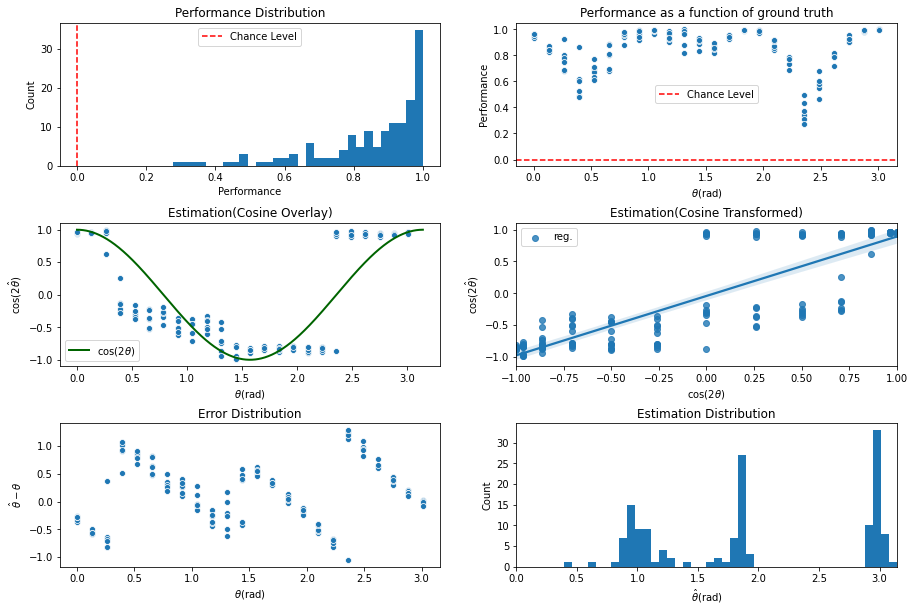

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4400\assets

 Training performance: 
Iter. 4401 | Performance 0.0638 | Loss 0.2820 | Spike loss 2.1896
Testing performance: 
Iter. 4401 | Performance 0.8432 | Loss 0.2835 | Spike loss 2.1689

 Training performance: 
Iter. 4402 | Performance 0.0180 | Loss 0.2808 | Spike loss 2.1566
Testing performance: 
Iter. 4402 | Performance 0.8479 | Loss 0.2817 | Spike loss 2.1566

 Training performance: 
Iter. 4403 | Performance -0.1455 | Loss 0.2834 | Spike loss 2.1280
Testing performance: 
Iter. 4403 | Performance 0.8503 | Loss 0.2820 | Spike loss 2.1714

 Training performance: 
Iter. 4404 | Performance -0.0421 | Loss 0.2838 | Spike loss 2.1617
Testing performance: 
Iter. 4404 | Performance 0.8559 | Loss 0.2828 | Spike loss 2.1708

 Training performance: 
Iter. 4405 | Performance -0.0650 | Loss 0.2842 | Spike loss 2.1184
Testing performance: 
Iter. 4405 | Performance 0.8170 | Loss 0.2845 | Spike loss 2.1604

 Training 


 Training performance: 
Iter. 4447 | Performance 0.0061 | Loss 0.2813 | Spike loss 2.1958
Testing performance: 
Iter. 4447 | Performance 0.8576 | Loss 0.2806 | Spike loss 2.1545

 Training performance: 
Iter. 4448 | Performance 0.0720 | Loss 0.2831 | Spike loss 2.1460
Testing performance: 
Iter. 4448 | Performance 0.8382 | Loss 0.2814 | Spike loss 2.1181

 Training performance: 
Iter. 4449 | Performance -0.0100 | Loss 0.2785 | Spike loss 2.1685
Testing performance: 
Iter. 4449 | Performance 0.8463 | Loss 0.2817 | Spike loss 2.1416

 Training performance: 
Iter. 4450 | Performance 0.0136 | Loss 0.2827 | Spike loss 2.1810
Testing performance: 
Iter. 4450 | Performance 0.8557 | Loss 0.2810 | Spike loss 2.1470

 Training performance: 
Iter. 4451 | Performance 0.0746 | Loss 0.2796 | Spike loss 2.1244
Testing performance: 
Iter. 4451 | Performance 0.8598 | Loss 0.2808 | Spike loss 2.1515

 Training performance: 
Iter. 4452 | Performance -0.0098 | Loss 0.2807 | Spike loss 2.2046
Testing perf


 Training performance: 
Iter. 4493 | Performance -0.0070 | Loss 0.2802 | Spike loss 2.1795
Testing performance: 
Iter. 4493 | Performance 0.8649 | Loss 0.2815 | Spike loss 2.1445

 Training performance: 
Iter. 4494 | Performance 0.0178 | Loss 0.2820 | Spike loss 2.1463
Testing performance: 
Iter. 4494 | Performance 0.8593 | Loss 0.2822 | Spike loss 2.1205

 Training performance: 
Iter. 4495 | Performance -0.0027 | Loss 0.2812 | Spike loss 2.2281
Testing performance: 
Iter. 4495 | Performance 0.8739 | Loss 0.2796 | Spike loss 2.1167

 Training performance: 
Iter. 4496 | Performance -0.1370 | Loss 0.2790 | Spike loss 2.0937
Testing performance: 
Iter. 4496 | Performance 0.8651 | Loss 0.2807 | Spike loss 2.1356

 Training performance: 
Iter. 4497 | Performance 0.0189 | Loss 0.2822 | Spike loss 2.0976
Testing performance: 
Iter. 4497 | Performance 0.8674 | Loss 0.2819 | Spike loss 2.1024

 Training performance: 
Iter. 4498 | Performance 0.0168 | Loss 0.2807 | Spike loss 2.1407
Testing per

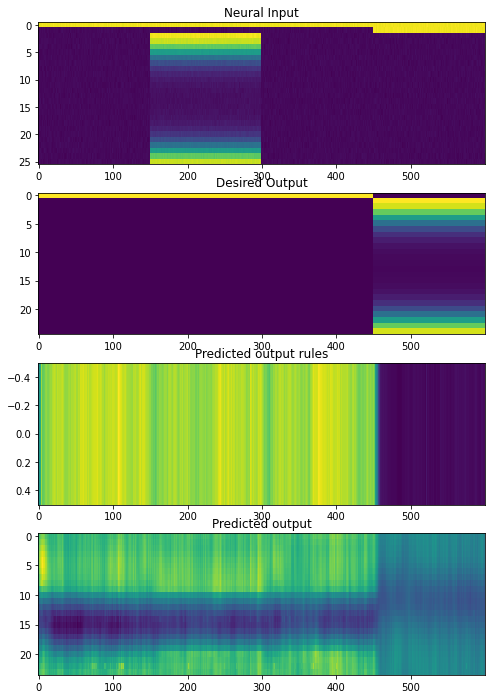

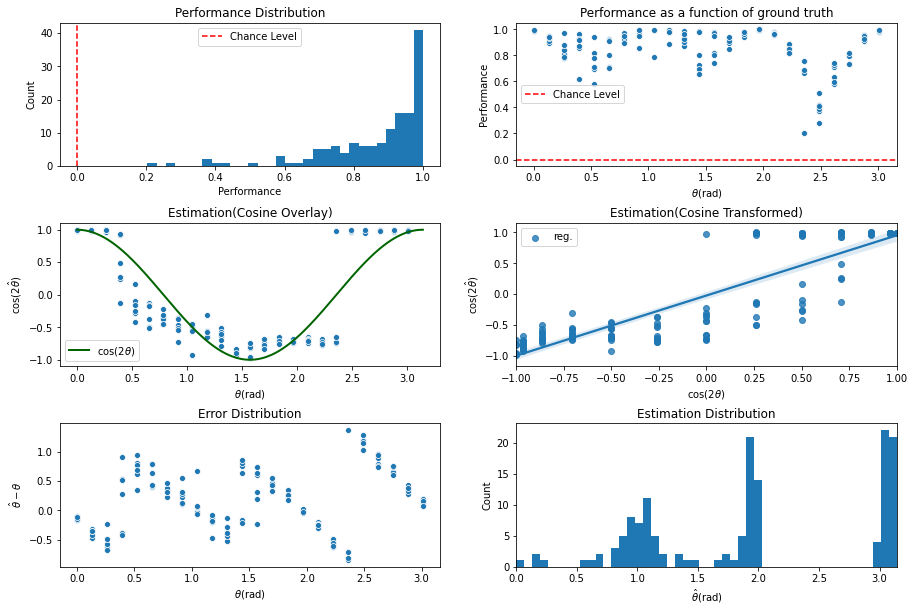

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4500\assets

 Training performance: 
Iter. 4501 | Performance -0.0628 | Loss 0.2831 | Spike loss 2.1008
Testing performance: 
Iter. 4501 | Performance 0.8483 | Loss 0.2810 | Spike loss 2.1333

 Training performance: 
Iter. 4502 | Performance 0.0695 | Loss 0.2801 | Spike loss 2.1250
Testing performance: 
Iter. 4502 | Performance 0.8487 | Loss 0.2804 | Spike loss 2.1107

 Training performance: 
Iter. 4503 | Performance 0.0357 | Loss 0.2790 | Spike loss 2.1788
Testing performance: 
Iter. 4503 | Performance 0.8457 | Loss 0.2815 | Spike loss 2.1168

 Training performance: 
Iter. 4504 | Performance 0.1403 | Loss 0.2801 | Spike loss 2.0528
Testing performance: 
Iter. 4504 | Performance 0.8433 | Loss 0.2806 | Spike loss 2.1174

 Training performance: 
Iter. 4505 | Performance -0.0198 | Loss 0.2798 | Spike loss 2.1136
Testing performance: 
Iter. 4505 | Performance 0.8554 | Loss 0.2814 | Spike loss 2.1167

 Training p


 Training performance: 
Iter. 4547 | Performance 0.0895 | Loss 0.2821 | Spike loss 2.0720
Testing performance: 
Iter. 4547 | Performance 0.8033 | Loss 0.2836 | Spike loss 2.0495

 Training performance: 
Iter. 4548 | Performance -0.0148 | Loss 0.2827 | Spike loss 2.0623
Testing performance: 
Iter. 4548 | Performance 0.8015 | Loss 0.2846 | Spike loss 2.0424

 Training performance: 
Iter. 4549 | Performance -0.0066 | Loss 0.2838 | Spike loss 1.9970
Testing performance: 
Iter. 4549 | Performance 0.8267 | Loss 0.2811 | Spike loss 2.0470

 Training performance: 
Iter. 4550 | Performance 0.0473 | Loss 0.2813 | Spike loss 2.0906
Testing performance: 
Iter. 4550 | Performance 0.8364 | Loss 0.2814 | Spike loss 2.0526

 Training performance: 
Iter. 4551 | Performance 0.1145 | Loss 0.2807 | Spike loss 2.1147
Testing performance: 
Iter. 4551 | Performance 0.8362 | Loss 0.2825 | Spike loss 2.0469

 Training performance: 
Iter. 4552 | Performance -0.0202 | Loss 0.2820 | Spike loss 1.9921
Testing per


 Training performance: 
Iter. 4593 | Performance -0.0504 | Loss 0.2797 | Spike loss 2.0875
Testing performance: 
Iter. 4593 | Performance 0.8581 | Loss 0.2815 | Spike loss 2.0642

 Training performance: 
Iter. 4594 | Performance -0.0279 | Loss 0.2797 | Spike loss 2.0707
Testing performance: 
Iter. 4594 | Performance 0.8606 | Loss 0.2798 | Spike loss 2.0912

 Training performance: 
Iter. 4595 | Performance -0.1262 | Loss 0.2799 | Spike loss 2.0983
Testing performance: 
Iter. 4595 | Performance 0.8500 | Loss 0.2807 | Spike loss 2.0848

 Training performance: 
Iter. 4596 | Performance 0.0261 | Loss 0.2802 | Spike loss 2.1044
Testing performance: 
Iter. 4596 | Performance 0.8526 | Loss 0.2817 | Spike loss 2.0744

 Training performance: 
Iter. 4597 | Performance 0.0411 | Loss 0.2801 | Spike loss 2.1209
Testing performance: 
Iter. 4597 | Performance 0.8468 | Loss 0.2802 | Spike loss 2.0838

 Training performance: 
Iter. 4598 | Performance -0.0601 | Loss 0.2804 | Spike loss 2.0169
Testing pe

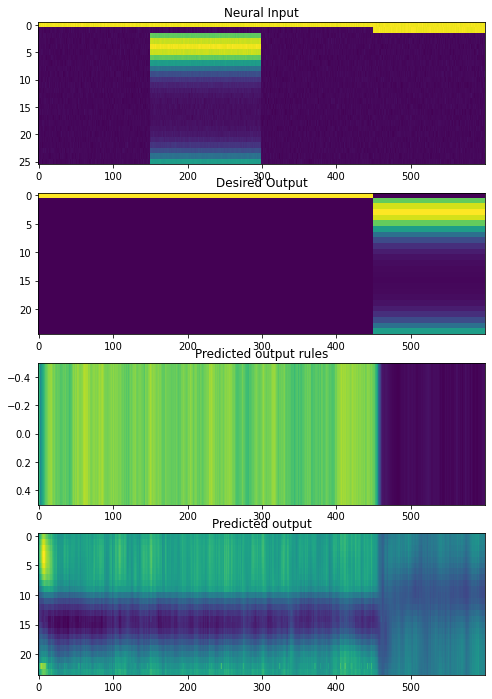

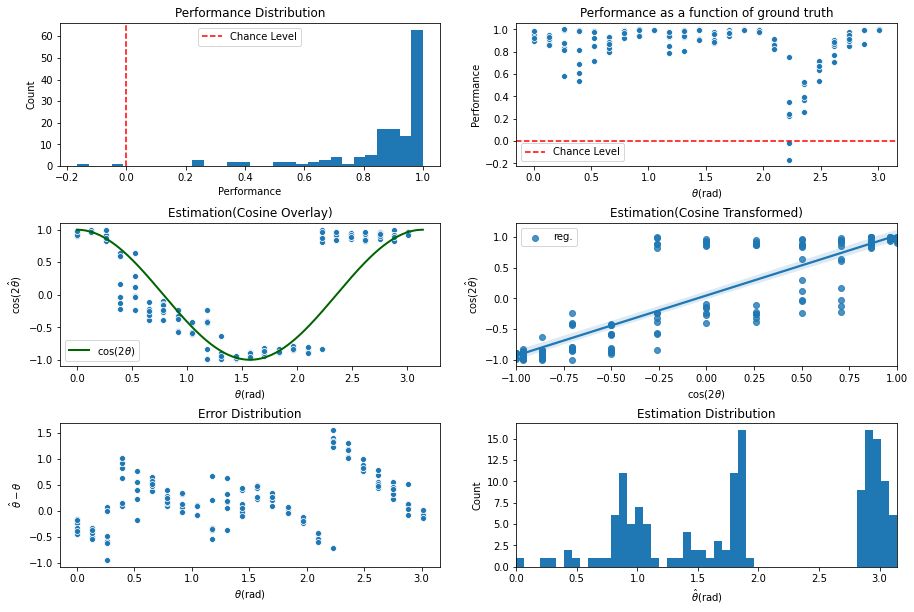

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4600\assets

 Training performance: 
Iter. 4601 | Performance -0.0380 | Loss 0.2817 | Spike loss 2.0967
Testing performance: 
Iter. 4601 | Performance 0.8323 | Loss 0.2811 | Spike loss 2.0641

 Training performance: 
Iter. 4602 | Performance 0.0743 | Loss 0.2786 | Spike loss 2.0675
Testing performance: 
Iter. 4602 | Performance 0.8493 | Loss 0.2813 | Spike loss 2.0673

 Training performance: 
Iter. 4603 | Performance 0.0466 | Loss 0.2826 | Spike loss 2.0064
Testing performance: 
Iter. 4603 | Performance 0.8588 | Loss 0.2792 | Spike loss 2.0669

 Training performance: 
Iter. 4604 | Performance -0.1382 | Loss 0.2793 | Spike loss 2.1240
Testing performance: 
Iter. 4604 | Performance 0.8493 | Loss 0.2817 | Spike loss 2.0695

 Training performance: 
Iter. 4605 | Performance 0.0064 | Loss 0.2792 | Spike loss 2.1749
Testing performance: 
Iter. 4605 | Performance 0.8731 | Loss 0.2815 | Spike loss 2.0682

 Training p


 Training performance: 
Iter. 4647 | Performance 0.0214 | Loss 0.2769 | Spike loss 2.1270
Testing performance: 
Iter. 4647 | Performance 0.8924 | Loss 0.2791 | Spike loss 2.1555

 Training performance: 
Iter. 4648 | Performance -0.0814 | Loss 0.2801 | Spike loss 2.1945
Testing performance: 
Iter. 4648 | Performance 0.9100 | Loss 0.2756 | Spike loss 2.1454

 Training performance: 
Iter. 4649 | Performance 0.0717 | Loss 0.2769 | Spike loss 2.1716
Testing performance: 
Iter. 4649 | Performance 0.8926 | Loss 0.2783 | Spike loss 2.1553

 Training performance: 
Iter. 4650 | Performance 0.0439 | Loss 0.2771 | Spike loss 2.1728
Testing performance: 
Iter. 4650 | Performance 0.8955 | Loss 0.2801 | Spike loss 2.1552

 Training performance: 
Iter. 4651 | Performance -0.0488 | Loss 0.2801 | Spike loss 2.1059
Testing performance: 
Iter. 4651 | Performance 0.8951 | Loss 0.2785 | Spike loss 2.1436

 Training performance: 
Iter. 4652 | Performance -0.0109 | Loss 0.2781 | Spike loss 2.1860
Testing per


 Training performance: 
Iter. 4693 | Performance -0.0131 | Loss 0.2770 | Spike loss 2.1458
Testing performance: 
Iter. 4693 | Performance 0.8915 | Loss 0.2762 | Spike loss 2.1226

 Training performance: 
Iter. 4694 | Performance -0.1209 | Loss 0.2752 | Spike loss 2.1507
Testing performance: 
Iter. 4694 | Performance 0.8929 | Loss 0.2776 | Spike loss 2.1294

 Training performance: 
Iter. 4695 | Performance 0.0375 | Loss 0.2780 | Spike loss 2.1069
Testing performance: 
Iter. 4695 | Performance 0.8814 | Loss 0.2790 | Spike loss 2.1283

 Training performance: 
Iter. 4696 | Performance -0.0045 | Loss 0.2769 | Spike loss 2.1388
Testing performance: 
Iter. 4696 | Performance 0.8902 | Loss 0.2762 | Spike loss 2.1268

 Training performance: 
Iter. 4697 | Performance 0.0855 | Loss 0.2749 | Spike loss 2.1465
Testing performance: 
Iter. 4697 | Performance 0.8983 | Loss 0.2772 | Spike loss 2.1421

 Training performance: 
Iter. 4698 | Performance -0.0793 | Loss 0.2780 | Spike loss 2.1427
Testing pe

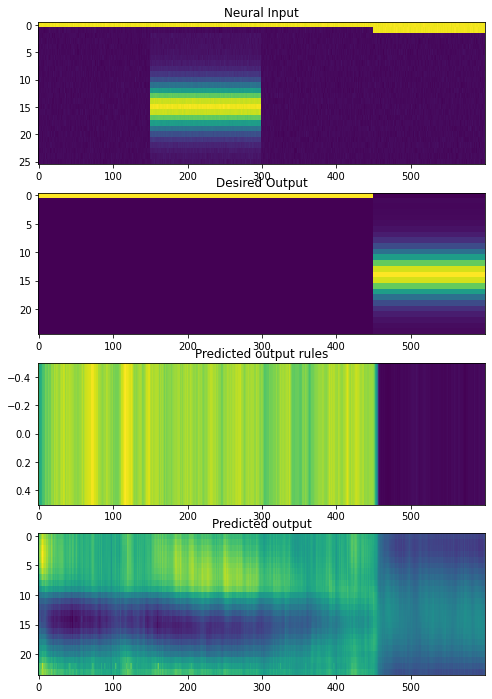

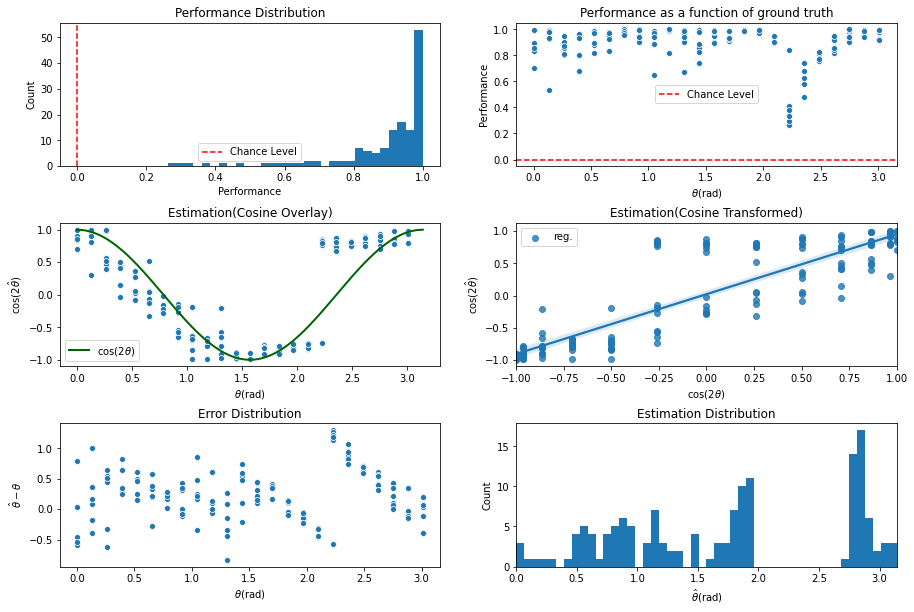

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4700\assets

 Training performance: 
Iter. 4701 | Performance -0.0538 | Loss 0.2765 | Spike loss 2.1447
Testing performance: 
Iter. 4701 | Performance 0.8808 | Loss 0.2797 | Spike loss 2.1320

 Training performance: 
Iter. 4702 | Performance -0.0022 | Loss 0.2801 | Spike loss 2.2312
Testing performance: 
Iter. 4702 | Performance 0.8899 | Loss 0.2772 | Spike loss 2.1261

 Training performance: 
Iter. 4703 | Performance 0.0262 | Loss 0.2757 | Spike loss 2.1754
Testing performance: 
Iter. 4703 | Performance 0.9152 | Loss 0.2758 | Spike loss 2.1375

 Training performance: 
Iter. 4704 | Performance 0.1358 | Loss 0.2742 | Spike loss 2.0488
Testing performance: 
Iter. 4704 | Performance 0.9080 | Loss 0.2776 | Spike loss 2.1366

 Training performance: 
Iter. 4705 | Performance -0.0807 | Loss 0.2767 | Spike loss 2.1035
Testing performance: 
Iter. 4705 | Performance 0.9097 | Loss 0.2764 | Spike loss 2.1305

 Training 


 Training performance: 
Iter. 4747 | Performance -0.1956 | Loss 0.2770 | Spike loss 2.3226
Testing performance: 
Iter. 4747 | Performance 0.9196 | Loss 0.2745 | Spike loss 2.2948

 Training performance: 
Iter. 4748 | Performance -0.0436 | Loss 0.2749 | Spike loss 2.2413
Testing performance: 
Iter. 4748 | Performance 0.9232 | Loss 0.2747 | Spike loss 2.2756

 Training performance: 
Iter. 4749 | Performance -0.0240 | Loss 0.2755 | Spike loss 2.2000
Testing performance: 
Iter. 4749 | Performance 0.9235 | Loss 0.2760 | Spike loss 2.2712

 Training performance: 
Iter. 4750 | Performance 0.0892 | Loss 0.2770 | Spike loss 2.3528
Testing performance: 
Iter. 4750 | Performance 0.9204 | Loss 0.2750 | Spike loss 2.2926

 Training performance: 
Iter. 4751 | Performance -0.0215 | Loss 0.2744 | Spike loss 2.2391
Testing performance: 
Iter. 4751 | Performance 0.9306 | Loss 0.2744 | Spike loss 2.2842

 Training performance: 
Iter. 4752 | Performance 0.1082 | Loss 0.2743 | Spike loss 2.2831
Testing pe


 Training performance: 
Iter. 4793 | Performance -0.0768 | Loss 0.2744 | Spike loss 2.3041
Testing performance: 
Iter. 4793 | Performance 0.9311 | Loss 0.2729 | Spike loss 2.2729

 Training performance: 
Iter. 4794 | Performance 0.0708 | Loss 0.2721 | Spike loss 2.2840
Testing performance: 
Iter. 4794 | Performance 0.9342 | Loss 0.2740 | Spike loss 2.2562

 Training performance: 
Iter. 4795 | Performance 0.0423 | Loss 0.2739 | Spike loss 2.2674
Testing performance: 
Iter. 4795 | Performance 0.9317 | Loss 0.2723 | Spike loss 2.2666

 Training performance: 
Iter. 4796 | Performance -0.0098 | Loss 0.2729 | Spike loss 2.3015
Testing performance: 
Iter. 4796 | Performance 0.9354 | Loss 0.2743 | Spike loss 2.2725

 Training performance: 
Iter. 4797 | Performance -0.0306 | Loss 0.2751 | Spike loss 2.2237
Testing performance: 
Iter. 4797 | Performance 0.9378 | Loss 0.2751 | Spike loss 2.2792

 Training performance: 
Iter. 4798 | Performance -0.0911 | Loss 0.2762 | Spike loss 2.2336
Testing pe

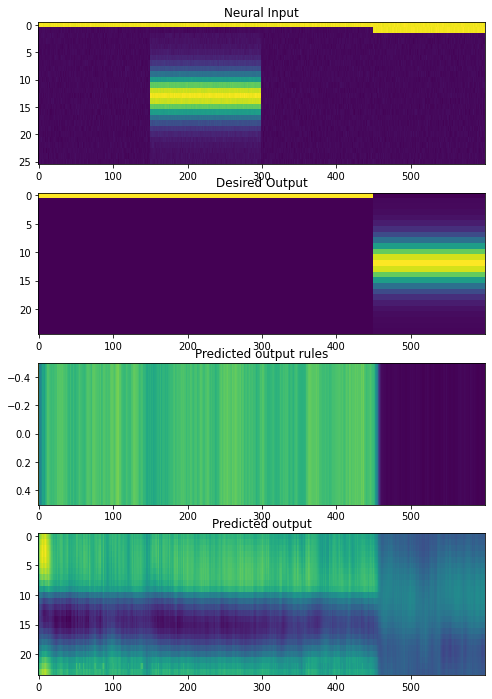

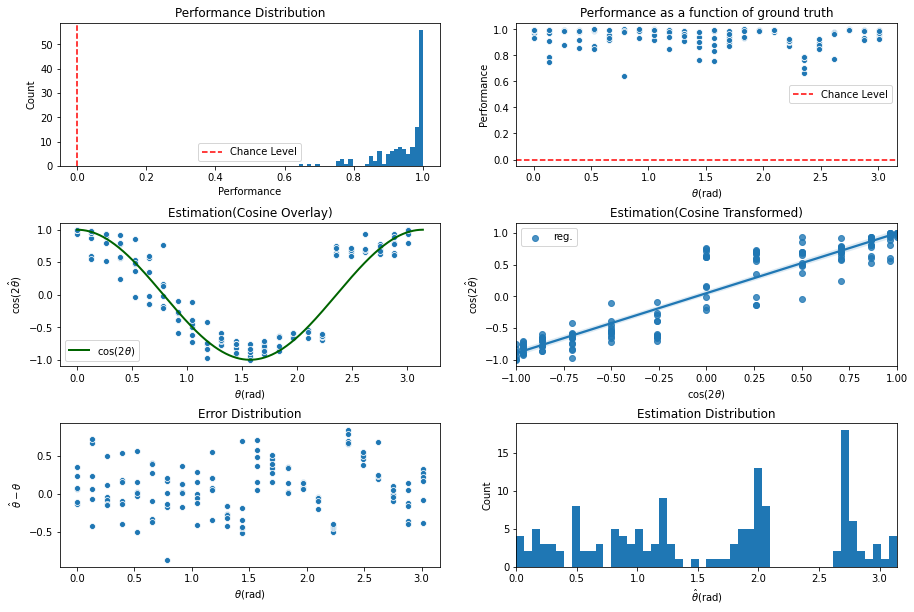

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4800\assets

 Training performance: 
Iter. 4801 | Performance -0.0748 | Loss 0.2756 | Spike loss 2.2452
Testing performance: 
Iter. 4801 | Performance 0.9453 | Loss 0.2724 | Spike loss 2.3038

 Training performance: 
Iter. 4802 | Performance 0.0225 | Loss 0.2740 | Spike loss 2.4064
Testing performance: 
Iter. 4802 | Performance 0.9338 | Loss 0.2737 | Spike loss 2.2966

 Training performance: 
Iter. 4803 | Performance -0.0337 | Loss 0.2734 | Spike loss 2.3470
Testing performance: 
Iter. 4803 | Performance 0.9373 | Loss 0.2752 | Spike loss 2.3136

 Training performance: 
Iter. 4804 | Performance -0.0000 | Loss 0.2758 | Spike loss 2.3151
Testing performance: 
Iter. 4804 | Performance 0.9266 | Loss 0.2740 | Spike loss 2.3330

 Training performance: 
Iter. 4805 | Performance 0.0254 | Loss 0.2740 | Spike loss 2.2868
Testing performance: 
Iter. 4805 | Performance 0.9331 | Loss 0.2733 | Spike loss 2.3118

 Training 


 Training performance: 
Iter. 4847 | Performance -0.0459 | Loss 0.2712 | Spike loss 2.2595
Testing performance: 
Iter. 4847 | Performance 0.9515 | Loss 0.2719 | Spike loss 2.3283

 Training performance: 
Iter. 4848 | Performance -0.0858 | Loss 0.2717 | Spike loss 2.2771
Testing performance: 
Iter. 4848 | Performance 0.9366 | Loss 0.2743 | Spike loss 2.3262

 Training performance: 
Iter. 4849 | Performance 0.0187 | Loss 0.2736 | Spike loss 2.2518
Testing performance: 
Iter. 4849 | Performance 0.9489 | Loss 0.2720 | Spike loss 2.3364

 Training performance: 
Iter. 4850 | Performance -0.0454 | Loss 0.2725 | Spike loss 2.2707
Testing performance: 
Iter. 4850 | Performance 0.9391 | Loss 0.2734 | Spike loss 2.3514

 Training performance: 
Iter. 4851 | Performance -0.0071 | Loss 0.2726 | Spike loss 2.2954
Testing performance: 
Iter. 4851 | Performance 0.9438 | Loss 0.2745 | Spike loss 2.3708

 Training performance: 
Iter. 4852 | Performance -0.0262 | Loss 0.2752 | Spike loss 2.3820
Testing p


 Training performance: 
Iter. 4893 | Performance -0.1177 | Loss 0.2732 | Spike loss 2.3470
Testing performance: 
Iter. 4893 | Performance 0.9346 | Loss 0.2751 | Spike loss 2.4223

 Training performance: 
Iter. 4894 | Performance 0.0383 | Loss 0.2743 | Spike loss 2.4915
Testing performance: 
Iter. 4894 | Performance 0.9473 | Loss 0.2709 | Spike loss 2.3839

 Training performance: 
Iter. 4895 | Performance -0.0378 | Loss 0.2717 | Spike loss 2.4659
Testing performance: 
Iter. 4895 | Performance 0.9460 | Loss 0.2719 | Spike loss 2.4079

 Training performance: 
Iter. 4896 | Performance 0.0168 | Loss 0.2724 | Spike loss 2.2768
Testing performance: 
Iter. 4896 | Performance 0.9407 | Loss 0.2741 | Spike loss 2.3958

 Training performance: 
Iter. 4897 | Performance 0.1297 | Loss 0.2738 | Spike loss 2.4169
Testing performance: 
Iter. 4897 | Performance 0.9390 | Loss 0.2718 | Spike loss 2.3994

 Training performance: 
Iter. 4898 | Performance 0.0473 | Loss 0.2706 | Spike loss 2.3926
Testing perf

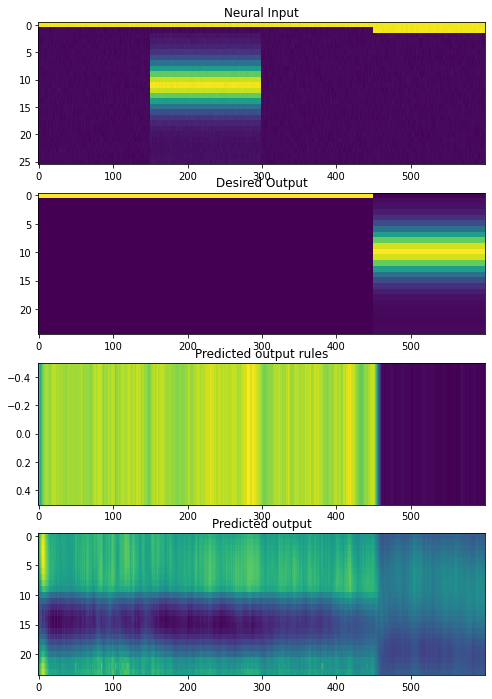

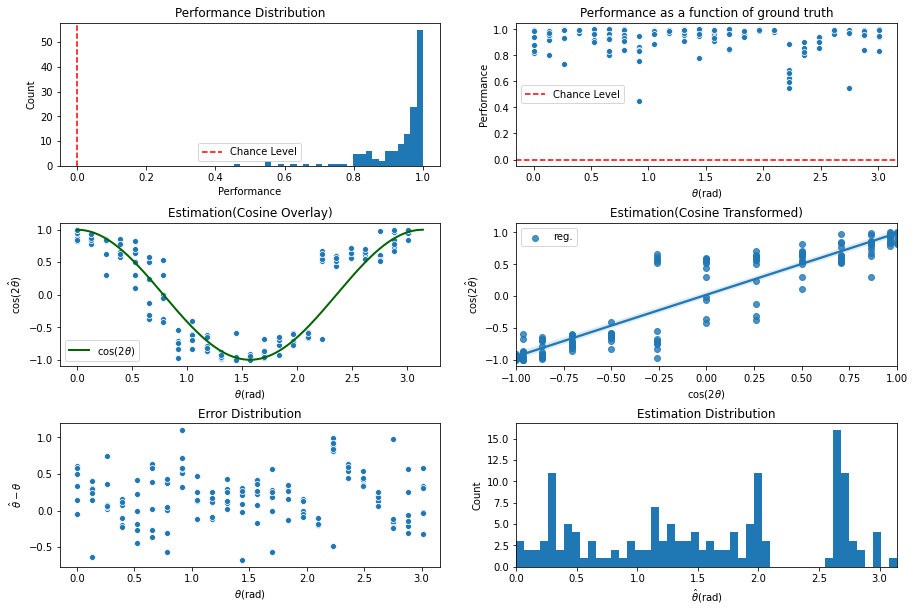

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter4900\assets

 Training performance: 
Iter. 4901 | Performance 0.0176 | Loss 0.2709 | Spike loss 2.3795
Testing performance: 
Iter. 4901 | Performance 0.9333 | Loss 0.2730 | Spike loss 2.3669

 Training performance: 
Iter. 4902 | Performance 0.1504 | Loss 0.2715 | Spike loss 2.2748
Testing performance: 
Iter. 4902 | Performance 0.9342 | Loss 0.2739 | Spike loss 2.3546

 Training performance: 
Iter. 4903 | Performance 0.0155 | Loss 0.2729 | Spike loss 2.3578
Testing performance: 
Iter. 4903 | Performance 0.9420 | Loss 0.2714 | Spike loss 2.3602

 Training performance: 
Iter. 4904 | Performance -0.0209 | Loss 0.2698 | Spike loss 2.3548
Testing performance: 
Iter. 4904 | Performance 0.9474 | Loss 0.2715 | Spike loss 2.3345

 Training performance: 
Iter. 4905 | Performance 0.0375 | Loss 0.2725 | Spike loss 2.3388
Testing performance: 
Iter. 4905 | Performance 0.9446 | Loss 0.2730 | Spike loss 2.3501

 Training pe


 Training performance: 
Iter. 4947 | Performance -0.0462 | Loss 0.2716 | Spike loss 2.3172
Testing performance: 
Iter. 4947 | Performance 0.9486 | Loss 0.2727 | Spike loss 2.3374

 Training performance: 
Iter. 4948 | Performance 0.0395 | Loss 0.2740 | Spike loss 2.4256
Testing performance: 
Iter. 4948 | Performance 0.9444 | Loss 0.2701 | Spike loss 2.3557

 Training performance: 
Iter. 4949 | Performance 0.0515 | Loss 0.2709 | Spike loss 2.3553
Testing performance: 
Iter. 4949 | Performance 0.9417 | Loss 0.2718 | Spike loss 2.3792

 Training performance: 
Iter. 4950 | Performance 0.0684 | Loss 0.2708 | Spike loss 2.3687
Testing performance: 
Iter. 4950 | Performance 0.9482 | Loss 0.2730 | Spike loss 2.3906

 Training performance: 
Iter. 4951 | Performance 0.0446 | Loss 0.2734 | Spike loss 2.4386
Testing performance: 
Iter. 4951 | Performance 0.9523 | Loss 0.2710 | Spike loss 2.4000

 Training performance: 
Iter. 4952 | Performance 0.1187 | Loss 0.2696 | Spike loss 2.4158
Testing perfo


 Training performance: 
Iter. 4993 | Performance 0.0801 | Loss 0.2717 | Spike loss 2.3993
Testing performance: 
Iter. 4993 | Performance 0.9578 | Loss 0.2703 | Spike loss 2.4359

 Training performance: 
Iter. 4994 | Performance -0.0071 | Loss 0.2699 | Spike loss 2.3747
Testing performance: 
Iter. 4994 | Performance 0.9519 | Loss 0.2721 | Spike loss 2.4088

 Training performance: 
Iter. 4995 | Performance -0.0131 | Loss 0.2713 | Spike loss 2.3310
Testing performance: 
Iter. 4995 | Performance 0.9569 | Loss 0.2735 | Spike loss 2.3917

 Training performance: 
Iter. 4996 | Performance 0.0347 | Loss 0.2731 | Spike loss 2.3314
Testing performance: 
Iter. 4996 | Performance 0.9617 | Loss 0.2699 | Spike loss 2.4188

 Training performance: 
Iter. 4997 | Performance 0.0520 | Loss 0.2711 | Spike loss 2.3692
Testing performance: 
Iter. 4997 | Performance 0.9516 | Loss 0.2708 | Spike loss 2.3973

 Training performance: 
Iter. 4998 | Performance -0.0180 | Loss 0.2703 | Spike loss 2.3545
Testing per

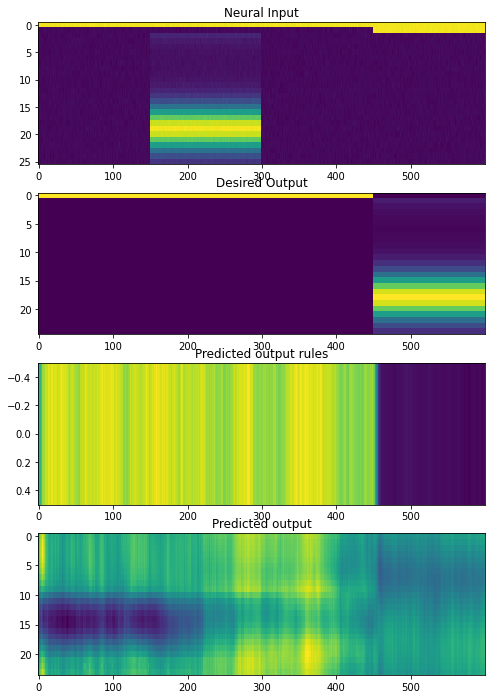

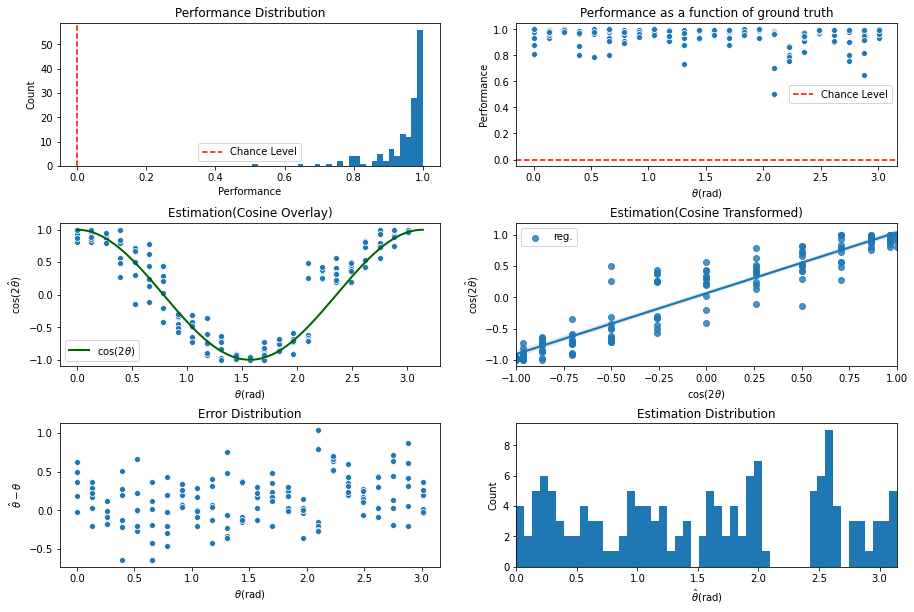

INFO:tensorflow:Assets written to: ../experiments/naturalprior/200622/cont_iter5000\assets

 Training performance: 
Iter. 5001 | Performance -0.0012 | Loss 0.2712 | Spike loss 2.3621
Testing performance: 
Iter. 5001 | Performance 0.9522 | Loss 0.2738 | Spike loss 2.4046

 Training performance: 
Iter. 5002 | Performance -0.0116 | Loss 0.2735 | Spike loss 2.3061
Testing performance: 
Iter. 5002 | Performance 0.9525 | Loss 0.2704 | Spike loss 2.3963

 Training performance: 
Iter. 5003 | Performance -0.0081 | Loss 0.2699 | Spike loss 2.3886
Testing performance: 
Iter. 5003 | Performance 0.9478 | Loss 0.2704 | Spike loss 2.4187

 Training performance: 
Iter. 5004 | Performance 0.0068 | Loss 0.2698 | Spike loss 2.3912
Testing performance: 
Iter. 5004 | Performance 0.9563 | Loss 0.2720 | Spike loss 2.4305

 Training performance: 
Iter. 5005 | Performance -0.0373 | Loss 0.2728 | Spike loss 2.3017
Testing performance: 
Iter. 5005 | Performance 0.9566 | Loss 0.2696 | Spike loss 2.4522

 Training

In [26]:
###### Train network ######
model_dir = "../experiments/naturalprior/200622/"
os.makedirs(model_dir, exist_ok=True)

N_iter = 100000
N_save = 100  # save model every N_save iterations

# define model
hp = utils_train.hp
hp['learning_rate'] = 5e-3
model = Model(hp=hp)

alllosses =[]
performance_train = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}
performance_test = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}

for iter_n in range(N_iter+1):
    # train on testing set
    train_data = utils_train.tensorize_trial(stim_train.generate_trial())
    Y, Loss = model(train_data, hp)

    performance_train = utils_train.append_model_performance(performance_train,
                                                             train_data, Y, Loss, par_train)
    # append performance on testing set
    test_data = utils_train.tensorize_trial(stim_test.generate_trial(balanced=True))
    test_Y, test_loss = model.return_losses(test_data['neural_input'], test_data['desired_output'],
                                            test_data['mask'], hp)
    performance_test = utils_train.append_model_performance(performance_test,
                                                            test_data, test_Y, test_loss, par_test)

    print('\n Training performance: ')
    utils_train.print_results(performance_train, iter_n)
    print('Testing performance: ')
    utils_train.print_results(performance_test, iter_n)

    if (iter_n % N_save) == 0:
        # predict from testing set
        plot_rnn_output(par_test, test_data, test_Y, stim_test, TEST_TRIAL=None)
        test_Y = utils_analysis.softmax_pred_output(test_Y) # change to softmax
        ground_truth, estim_mean, raw_error, beh_perf = utils_analysis.behavior_summary(test_data, test_Y, par=par_test)
        utils_analysis.behavior_figure(ground_truth, estim_mean, raw_error, beh_perf)

        tf.saved_model.save(model, os.path.join(model_dir, "cont_iter" + str(iter_n)))

    if iter_n > 20 and np.sum(np.array(performance_test['perf'][-20:]) > 0.95) > 18:
        print('Good performance achieved... saving final model')
        break

# save final model
tf.saved_model.save(model, os.path.join(model_dir, "cont_iter" + str(iter_n)))

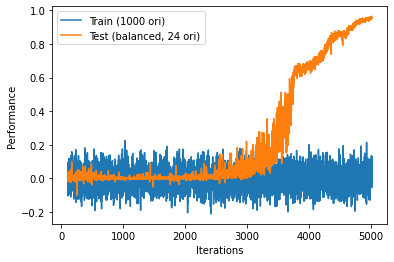

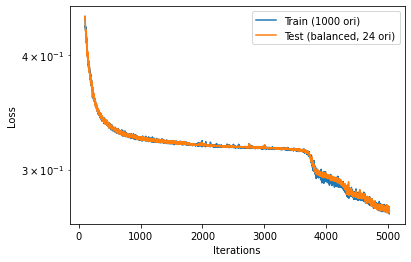

In [27]:
#performance_train = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}
#performance_test = {'perf': [], 'loss': [], 'perf_loss': [], 'spike_loss': []}
plt.figure()
plt.plot(np.arange(100,len(performance_train['perf'])), 
         performance_train['perf'][100:], label='Train (1000 ori)')
plt.plot(np.arange(100,len(performance_test['perf'])), 
         performance_test['perf'][100:], label='Test (balanced, 24 ori)')
plt.ylabel('Performance')
plt.xlabel('Iterations')
plt.legend()
plt.show()

plt.figure()
plt.plot(np.arange(100,len(performance_train['perf'])),
         performance_train['loss'][100:], label='Train (1000 ori)')
plt.plot(np.arange(100,len(performance_test['perf'])),
         performance_test['loss'][100:], label='Test (balanced, 24 ori)')
plt.ylabel('Loss')
plt.xlabel('Iterations')
plt.yscale('log')
plt.legend()
plt.show()

In [ ]:
# what kind of attractor states does it find?
# change in representation with noise and error?
# effect of STSP??